In [12]:
%load_ext autoreload
% autoreload 2
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.rc('font', family='serif')


import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
#from torch.autograd import Variable
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from geant_dataloader import rtnpy_load_data
from logistics import *
import random
import datetime
import os
from decimal import Decimal
from matplotlib import gridspec
from sklearn.decomposition import PCA
from VAE_PCA_plots import *


# plotting params
%matplotlib inline
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 12
plt.rcParams['figure.figsize'] = (8.0, 8.0)
print(torch.__version__)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
0.4.0a0+200fb22


In [25]:
#currently working on 32 x32 implementation


torch.manual_seed(423312)
imageSize = 32
batchSize = 32
manualSeed = None
ngpu = 1
mydir=None # will be updated before the run
norm_scale = 'none'

epoch=0 #will be updated during the run
num_epochs = 100
nc =1
ndf = 64
ngf = 64
beta = 1.
energy = "1800MeV"
unnormalize_loss = False
pca_dim = 1024

if imageSize == 64:
    zdim = 128
else:
    zdim = 200
log_interval = 200

mydir=None # will be updated before the run
epoch=0 #will be updated during the run
extraD = 1
epochs = []
genx_FWHMs = []
genx_means = []
realx_FWHMs = []
realx_means =  []
train_losses = []
test_losses = []
sum_differences = []

In [26]:
if manualSeed is None:
    manualSeed = random.randint(1, 10000)
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

cudnn.benchmark = True
dev_type = 'cpu'
if torch.cuda.is_available():
    print("Using Cuda")
    dev_type = 'gpu'
    
    
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
print(device)
print("Using:", dev_type, torch.cuda.current_device())


def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)
        

('Random Seed: ', 6496)
Using Cuda
cuda:2
('Using:', 'gpu', 0L)


In [27]:
#image_array = rtnpy_load_data("/home/chris/G4Builds/Geant4HadronCalorimeter/numpy_data/rebinnedGeant4Data_20000Events_64OldSize_32NewSize.npy", num_events = 100, image_size = imageSize)
#image_array1 = rtnpy_load_data("/home/chris/G4Builds/Geant4HadronCalorimeter/numpy_data/rebinnedGeant4Data_15000Events_64OldSize_32NewSize.npy", num_events = None, image_size = imageSize)
image_array = rtnpy_load_data("numpy_data/geant4Data_20000Events_"+str(imageSize)+"ImageSize_"+energy+"_ScintiAbsoThickness75_8.npz", num_events = None, image_size = imageSize)
#image_array=np.concatenate((image_array1, image_array2),0)

(19998, 1, 32, 32)
(19998, 1024)


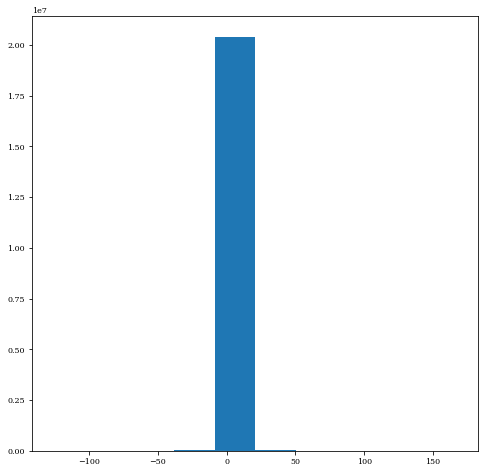

In [28]:
print image_array.shape


#plt.imshow(image_array[1][0], cmap = 'PuOr')

x = image_array.reshape(image_array.shape[0], -1)


pca = PCA(n_components= pca_dim).fit(x)

plt.hist(pca.transform(x).flatten())

print pca.transform(x).shape

#plt.plot(np.cumsum(pca.explained_variance_) / np.sum(pca.explained_variance_))

pca_list = np.cumsum(pca.explained_variance_) / np.sum(pca.explained_variance_)

(19998, 1, 32, 32)


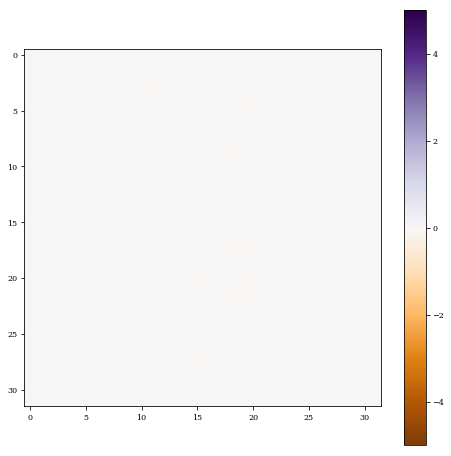

In [29]:
decode = pca.inverse_transform(pca.transform(x)).reshape(-1,1,32,32)
print decode.shape
event_number = 10
plt.imshow(decode[event_number][0] - image_array[event_number][0], cmap = 'PuOr', vmin=-5.0, vmax=5.0)
plt.colorbar()

In [30]:
#print norm_scale
normed_array, scale = normalize(pca.transform(x), norm_scale = norm_scale )

tensor_array_train = torch.stack([torch.Tensor(i) for i in normed_array[:15000]])
tensor_data_train = torch.utils.data.TensorDataset(tensor_array_train)
tensor_array_test = torch.stack([torch.Tensor(i) for i in normed_array[15000:]])
tensor_data_test = torch.utils.data.TensorDataset(tensor_array_test)

train_loader = torch.utils.data.DataLoader(tensor_data_train, batch_size=batchSize, num_workers=8)
test_loader = torch.utils.data.DataLoader(tensor_data_test, batch_size = batchSize, num_workers = 8)
print(train_loader)

In [31]:
def to_img(x, norm_scale = norm_scale, scale = scale, pca = pca, imageSize=imageSize):
    x = x.cpu().data.numpy()
    #x = pca.inverse_transform(x)
    #x = 0.5 * (x + 1)
   # print x
   # x = np.clip(x, 0, 1)
    
    # this just drops the channel axis
    #x = x.reshape([-1, imageSize, imageSize])

    x = unnormalize(x, scale = scale, norm_scale = norm_scale)
    x = pca.inverse_transform(x).reshape([-1,imageSize,imageSize])
    #print x.max()
    
    return x

def plot_reconstructions(model, save_dir=None, epoch = epoch, latent_dim = zdim, conv=False, simple=False, n=4, imageSize=imageSize, norm_scale = norm_scale, batchSize = batchSize,scale = scale):
    """
    Plot 10 reconstructions from the test set. The top row is the original
    digits, the bottom is the decoder reconstruction.
    """
    # encode then decode
    data= next(iter(test_loader))

    
    if imageSize == 64:
        full_dim = 1024
    elif imageSize == 32:
        full_dim = pca_dim
    
    if not conv:
        data = data[0].view([-1, full_dim])
    true_imgs = data
    decoded_imgs, _, _ = model.forward(data.to(device))
    true_imgs = to_img(true_imgs, norm_scale = norm_scale,  scale = scale)
    decoded_imgs = to_img(decoded_imgs, norm_scale = norm_scale, scale = scale)
    #print(decoded_imgs.shape)
    
    rowsize = n * 2.5
    columnsize = 4
    fig, axn = plt.subplots(figsize=(rowsize, columnsize))
    cmap = sns.cubehelix_palette(dark = 0.4, light=0.98, gamma = 2.5, hue = 1, start =0, as_cmap=True)
    for i in range(n):
        
        # display original
        ax = plt.subplot(2, n, i + 1)

        if i == 0:
            im = plt.imshow(true_imgs[i], cmap=cmap)
        else: 
            plt.imshow(true_imgs[i], cmap=cmap)

        ax.get_xaxis().set_visible(False)
        ax.set_yticklabels([])
        ax.yaxis.set_ticks_position('none') 
        if i == 0:
            ax.set_ylabel("Real", rotation  = 0, fontsize = 13)
            ax.yaxis.set_label_coords(-.25,0.5)

        # display reconstruction
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(decoded_imgs[i], cmap=cmap)
        #print(decoded_imgs[i].min(), decoded_imgs[i].max())
        if i == 0:
            ax.set_ylabel("Decoded", rotation  = 0, fontsize = 13)
            ax.yaxis.set_label_coords(-.3,0.5)

        ax.get_xaxis().set_visible(False)
        ax.set_yticklabels([])
        ax.yaxis.set_ticks_position('none') 
        

    plt.tight_layout()

    cbar_ax = fig.add_axes([0.97, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_label(r'Pixel $E_{dep}$ (MeV)', y=0.85)
    fig.subplots_adjust(wspace=-0.185, hspace=0.09)
    fig.suptitle(r"VAE Real and Decoded Samples of $e^{-}$ $E_{dep}$, "+ str(latent_dim) + " Latent Dim ", x=0.52, y = 1.02)
          
    if save_dir != None:
        #learning_rate = '%.0E' % Decimal(lr)
      
        filename = "VAE_EdepFor" + str(n) + "Events_" + str(latent_dim) +"latentDim_"+ str(imageSize) + "x" +str(imageSize) \
                            + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize"
 
        plt.savefig(save_dir + filename, bbox_inches='tight')
    plt.show()
    
    return

In [32]:
if imageSize == 64:
    full_dim = 600
    leakiness = 0.01
elif imageSize == 32:
    full_dim = pca_dim
    leakiness = 0.09
    
if norm_scale == 'sigmoid' or norm_scale == 'unif':
    last_decode_act = nn.LeakyReLU(0.01)
    #last_decode_act = F.sigmoid
elif norm_scale == '-1to1' or norm_scale == 'tanh':
    last_decode_act = F.tanh
elif norm_scale == 'none' or norm_scale == '1to10':
    last_decode_act = F.leaky_relu

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()

        self.fc1 = nn.Linear(full_dim, 500)
        self.fc21 = nn.Linear(500, zdim)
        self.fc22 = nn.Linear(500, zdim)
        self.fc3 = nn.Linear(zdim, 500)
        self.fc4 = nn.Linear(500, full_dim)
        self.bn = nn.BatchNorm1d(500)

    def encode(self, x):
        h1 = F.leaky_relu(self.fc1(x),0.02)
        #h1 = F.tanh(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5*logvar)
            eps = torch.randn_like(std)
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode(self, z):
        #h3 = F.relu(self.fc3(z))
        h3 = F.leaky_relu(self.fc3(z),0.05)
        #return F.tanh(self.fc4(h3))
        #return F.sigmoid(self.fc4(h3))
        #return last_decode_act(self.fc4(h3), leakiness)
        return self.fc4(h3)
        #return F.relu(self.fc4(h3))

    def forward(self, x):
        mu, logvar = self.encode(x.view(-1, full_dim))
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar


model = VAE().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)


# Reconstruction + KL divergence losses summed over all elements and batch
def loss_function(recon_x, x, mu, logvar, beta = beta, full_dim = full_dim, scale= scale, norm_scale =norm_scale, unnormalize_loss = False):
    #BCE = F.binary_cross_entropy(recon_x, x.view(-1, 1024), size_average=False)
    if unnormalize_loss == True:
        recon_x = unnormalize(recon_x, scale=scale, norm_scale = norm_scale)
        x = unnormalize(x, scale= scale, norm_scale = norm_scale)
    MSE = F.mse_loss(recon_x, x.view(-1,full_dim), size_average=False)

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return MSE + beta*KLD


def train(epoch, train_losses):
    model.train()
    train_loss = 0
    for batch_idx, (data) in enumerate(train_loader,):
        data = data[0].to(device)
        #print data.shape
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar, beta = beta, unnormalize_loss=unnormalize_loss)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()
        if batch_idx % log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader),
                loss.item() / len(data)))
    avg_batch_loss = train_loss / len(train_loader.dataset)
    train_losses.append(avg_batch_loss)

    print('====> Epoch: {} Average loss: {:.4f}'.format(
          epoch, avg_batch_loss))


def test(epoch, test_losses):
    model.eval()
    test_loss = 0
    with torch.no_grad():
        for i, (data) in enumerate(test_loader,0):
            data = data[0].to(device)
            #print data.shape
            recon_batch, mu, logvar = model(data)
            test_loss += loss_function(recon_batch, data, mu, logvar, beta = beta).item()
            #if i == 0:
            #    n = min(data.size(0), 8)
                #comparison = torch.cat([data[:n],
                #                      recon_batch.view(batchSize, 1, imageSize, imageSize)[:n]])
                #save_image(comparison.cpu(),
                #         'results/reconstruction_' + str(epoch) + '.png', nrow=n)
                
    test_loss /= len(test_loader.dataset)
    test_losses.append(test_loss)
    print('====> Test set loss: {:.4f}'.format(test_loss))

print(model)


VAE(
  (fc1): Linear(in_features=1024, out_features=500, bias=True)
  (fc21): Linear(in_features=500, out_features=200, bias=True)
  (fc22): Linear(in_features=500, out_features=200, bias=True)
  (fc3): Linear(in_features=200, out_features=500, bias=True)
  (fc4): Linear(in_features=500, out_features=1024, bias=True)
  (bn): BatchNorm1d(500, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)


(5000, 32, 32)
(5000, 32, 32)


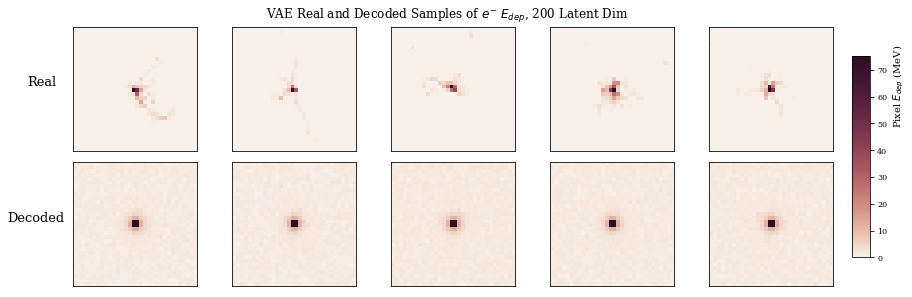

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


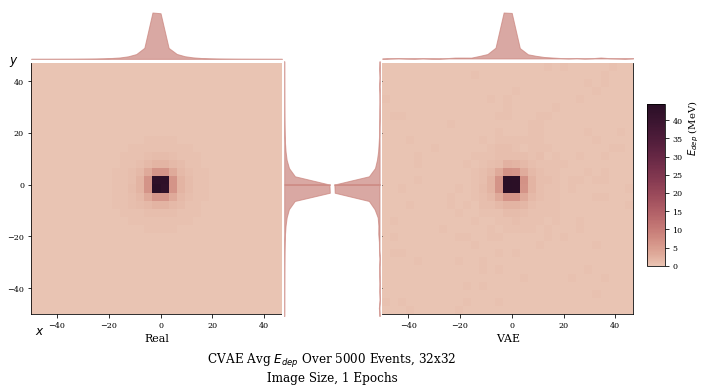

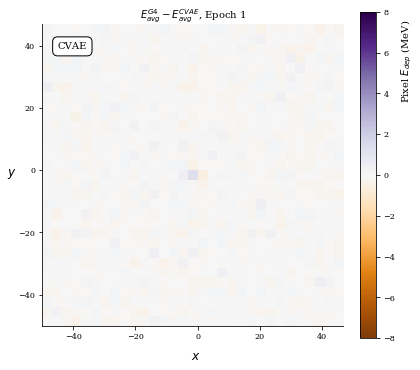

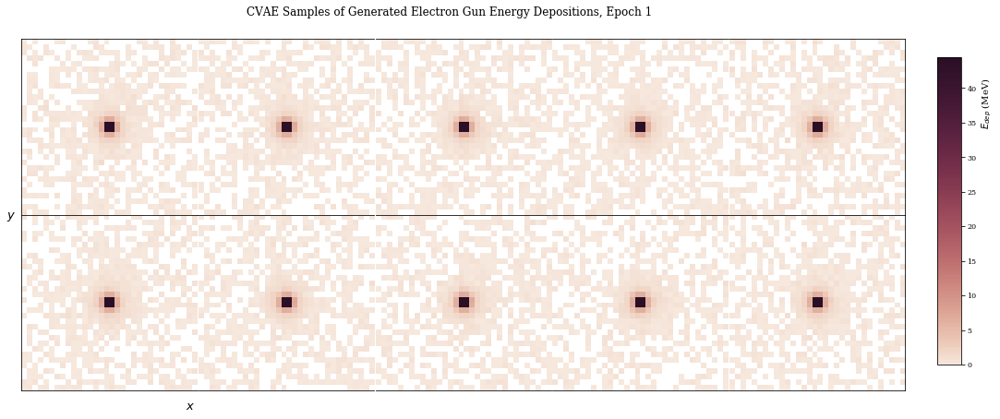

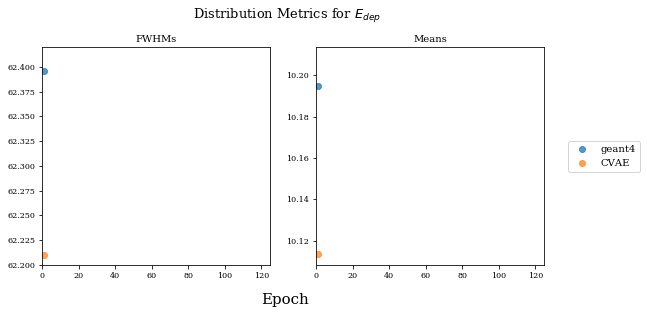

Train Epoch: 1 [0/15000 (0%)]	Loss: 4909.949219
Train Epoch: 1 [6400/15000 (43%)]	Loss: 687.934631
Train Epoch: 1 [12800/15000 (85%)]	Loss: 563.249939
====> Epoch: 1 Average loss: 909.8019
====> Test set loss: 479.5294
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 2 [0/15000 (0%)]	Loss: 515.380493
Train Epoch: 2 [6400/15000 (43%)]	Loss: 454.673492
Train Epoch: 2 [12800/15000 (85%)]	Loss: 462.760681
====> Epoch: 2 Average loss: 508.4809
====> Test set loss: 405.6934
(5000, 32, 32)
(5000, 32, 32)


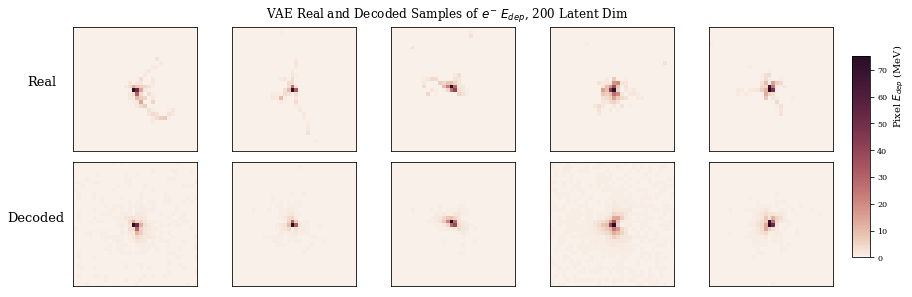

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


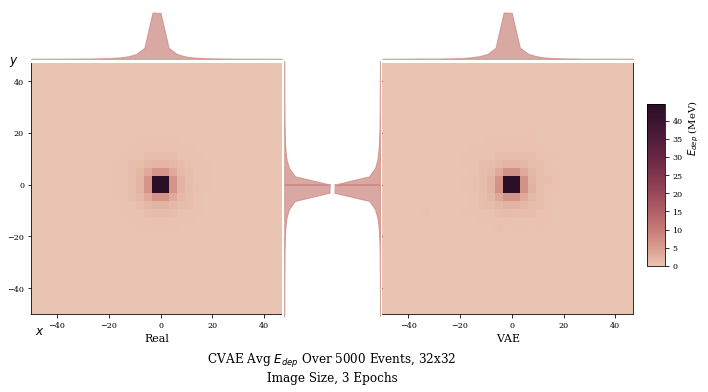

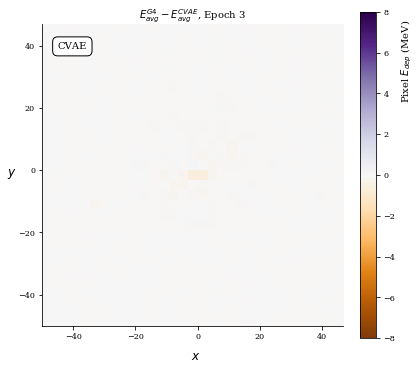

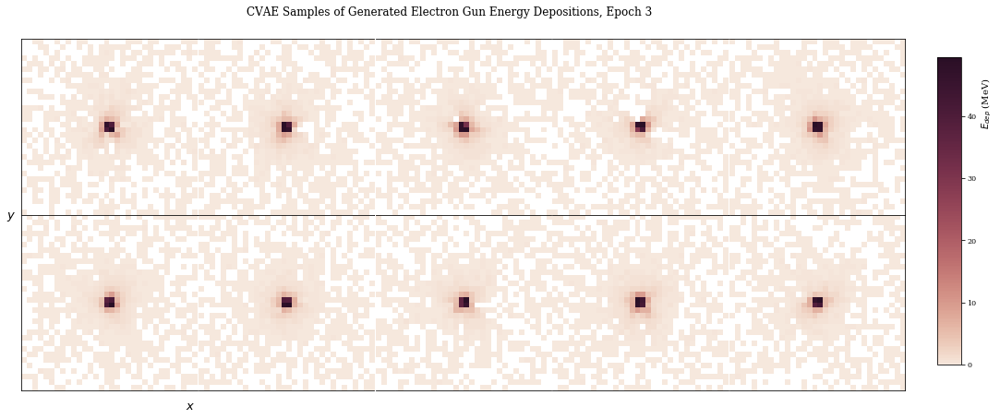

Train Epoch: 3 [0/15000 (0%)]	Loss: 451.050537
Train Epoch: 3 [6400/15000 (43%)]	Loss: 440.977966
Train Epoch: 3 [12800/15000 (85%)]	Loss: 380.467407
====> Epoch: 3 Average loss: 439.3065
====> Test set loss: 354.8146
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 4 [0/15000 (0%)]	Loss: 401.714844
Train Epoch: 4 [6400/15000 (43%)]	Loss: 372.576538
Train Epoch: 4 [12800/15000 (85%)]	Loss: 353.752808
====> Epoch: 4 Average loss: 389.6865
====> Test set loss: 313.8364
(5000, 32, 32)
(5000, 32, 32)


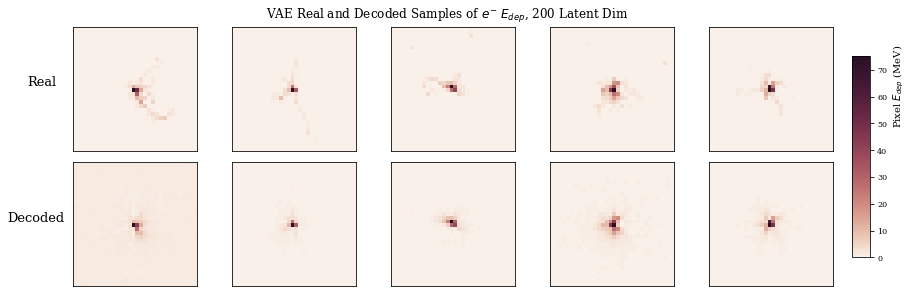

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


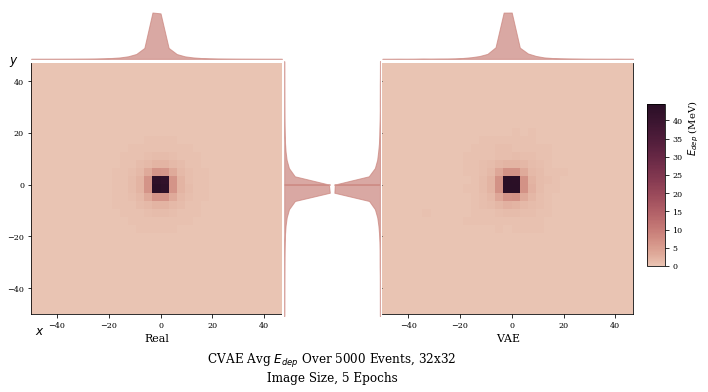

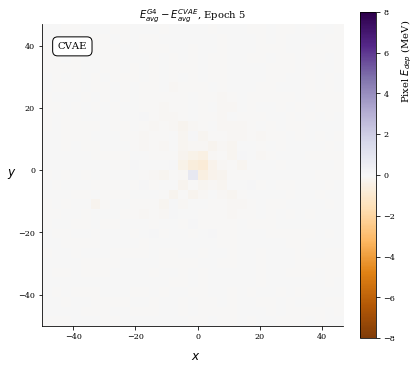

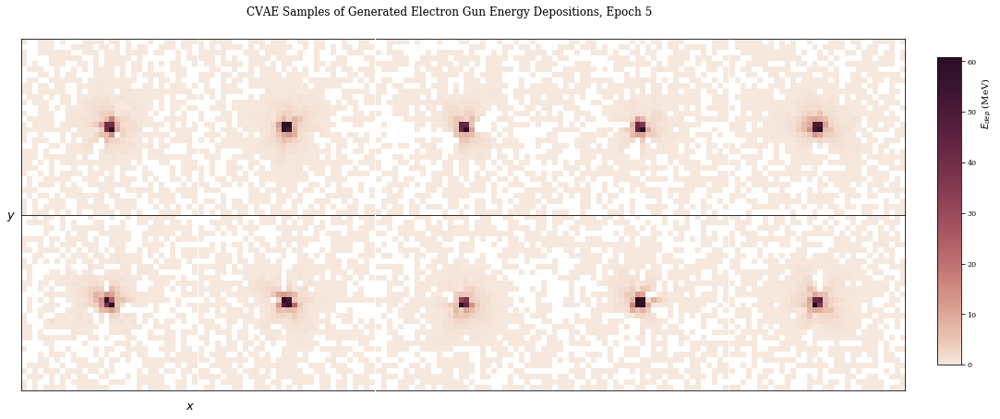

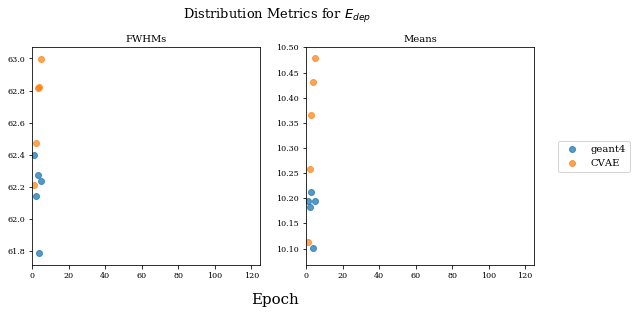

Train Epoch: 5 [0/15000 (0%)]	Loss: 352.234100
Train Epoch: 5 [6400/15000 (43%)]	Loss: 338.021057
Train Epoch: 5 [12800/15000 (85%)]	Loss: 331.047211
====> Epoch: 5 Average loss: 348.2455
====> Test set loss: 283.3186
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 6 [0/15000 (0%)]	Loss: 311.837860
Train Epoch: 6 [6400/15000 (43%)]	Loss: 306.046265
Train Epoch: 6 [12800/15000 (85%)]	Loss: 289.251740
====> Epoch: 6 Average loss: 314.2185
====> Test set loss: 259.7130
(5000, 32, 32)
(5000, 32, 32)


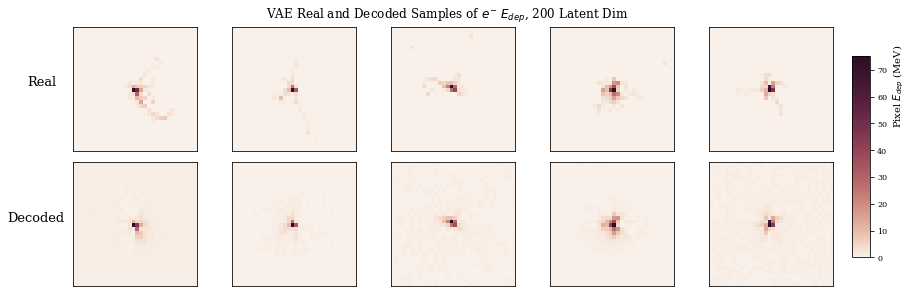

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


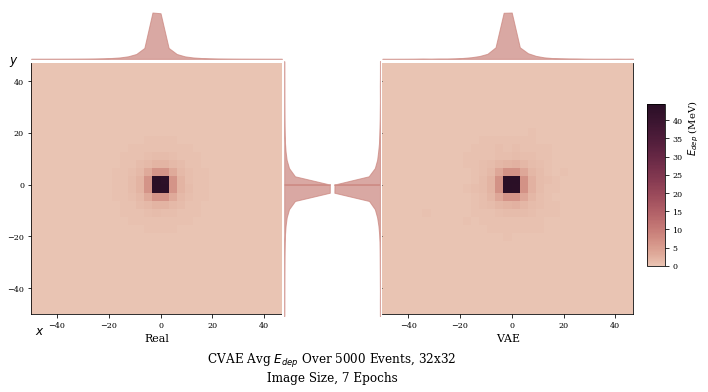

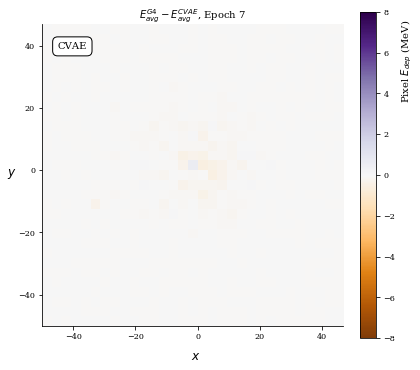

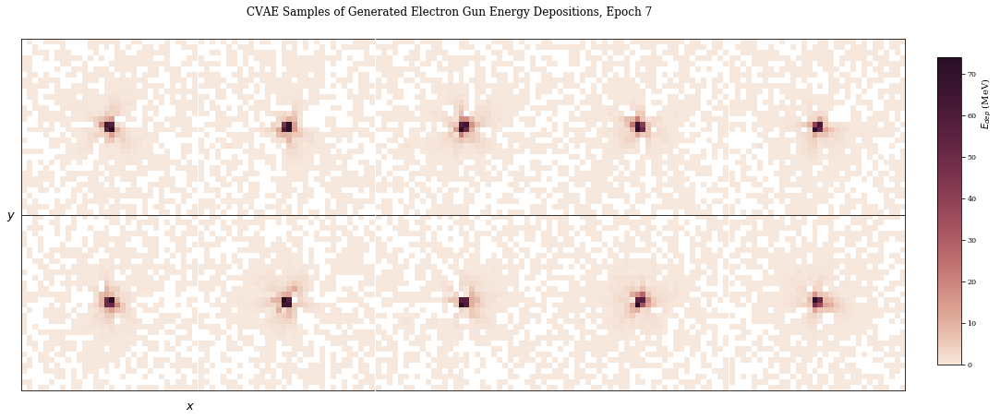

Train Epoch: 7 [0/15000 (0%)]	Loss: 288.024597
Train Epoch: 7 [6400/15000 (43%)]	Loss: 269.101501
Train Epoch: 7 [12800/15000 (85%)]	Loss: 279.465332
====> Epoch: 7 Average loss: 290.2901
====> Test set loss: 246.4668
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 8 [0/15000 (0%)]	Loss: 269.823669
Train Epoch: 8 [6400/15000 (43%)]	Loss: 253.112427
Train Epoch: 8 [12800/15000 (85%)]	Loss: 257.873962
====> Epoch: 8 Average loss: 272.7538
====> Test set loss: 235.7007
(5000, 32, 32)
(5000, 32, 32)


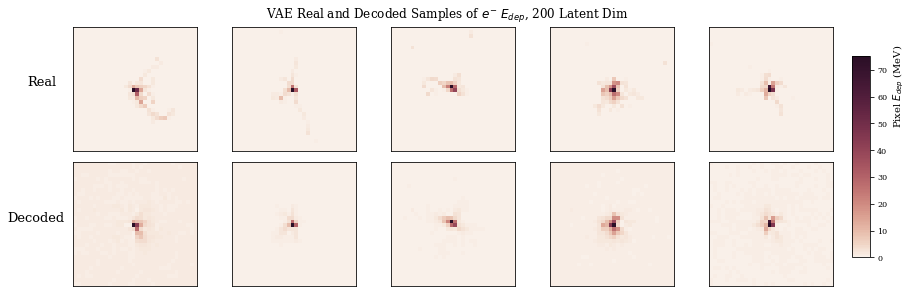

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


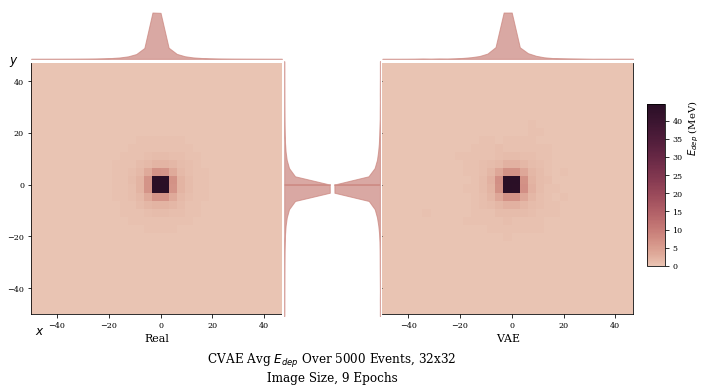

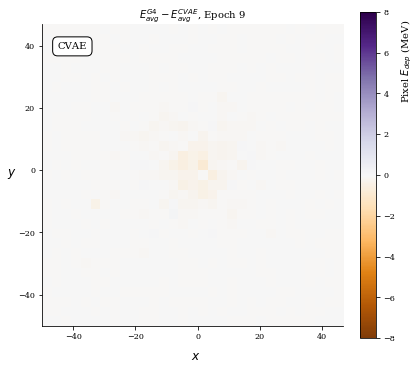

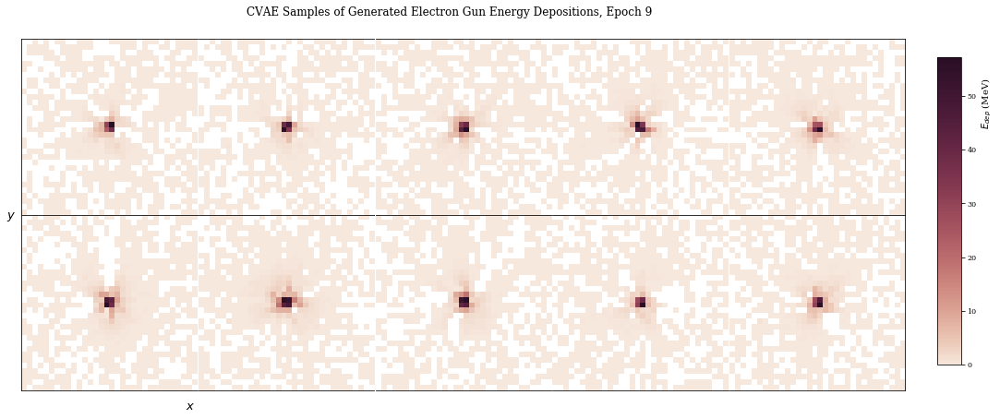

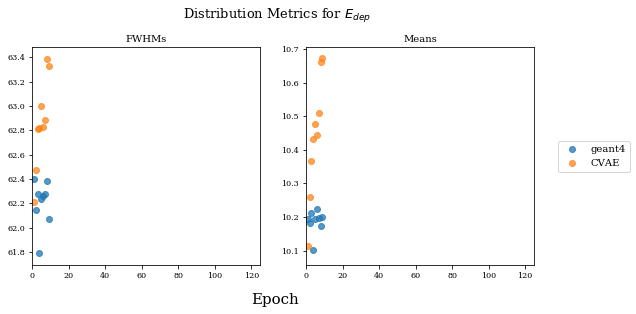

Train Epoch: 9 [0/15000 (0%)]	Loss: 253.675568
Train Epoch: 9 [6400/15000 (43%)]	Loss: 249.734924
Train Epoch: 9 [12800/15000 (85%)]	Loss: 247.978500
====> Epoch: 9 Average loss: 260.1312
====> Test set loss: 227.9723
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 10 [0/15000 (0%)]	Loss: 237.760086
Train Epoch: 10 [6400/15000 (43%)]	Loss: 235.408630
Train Epoch: 10 [12800/15000 (85%)]	Loss: 240.455643
====> Epoch: 10 Average loss: 248.7714
====> Test set loss: 222.8999
(5000, 32, 32)
(5000, 32, 32)


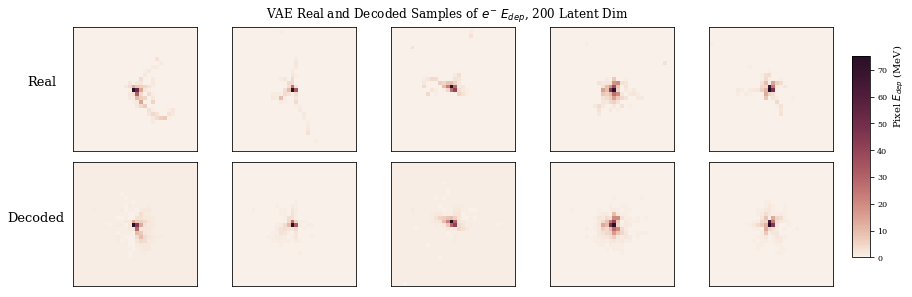

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


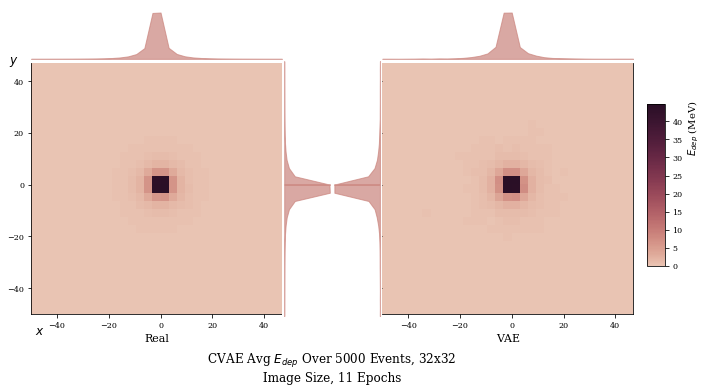

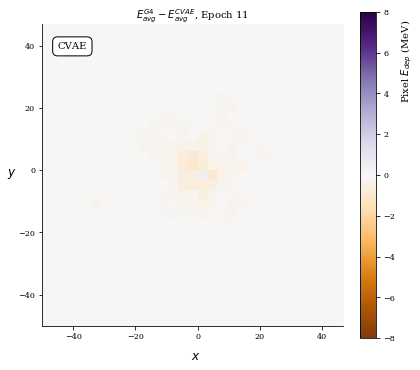

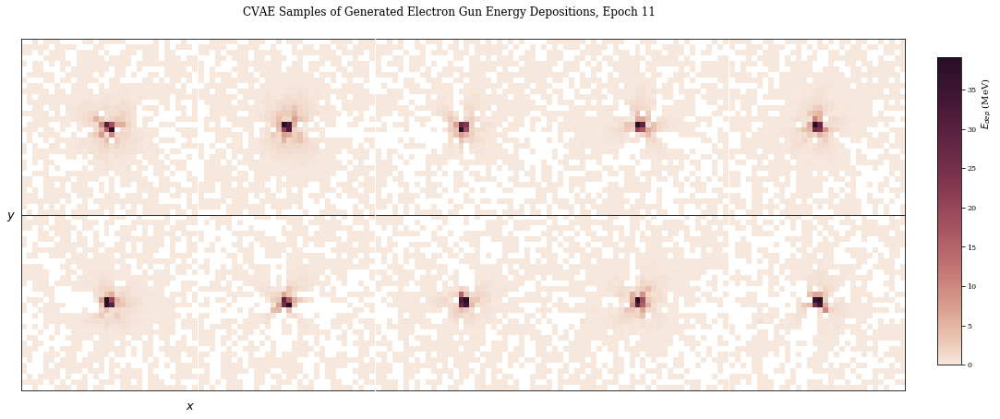

Train Epoch: 11 [0/15000 (0%)]	Loss: 235.734161
Train Epoch: 11 [6400/15000 (43%)]	Loss: 236.248764
Train Epoch: 11 [12800/15000 (85%)]	Loss: 231.404877
====> Epoch: 11 Average loss: 241.6552
====> Test set loss: 212.5257
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 12 [0/15000 (0%)]	Loss: 228.444305
Train Epoch: 12 [6400/15000 (43%)]	Loss: 229.025879
Train Epoch: 12 [12800/15000 (85%)]	Loss: 222.138199
====> Epoch: 12 Average loss: 235.0082
====> Test set loss: 211.9011
(5000, 32, 32)
(5000, 32, 32)


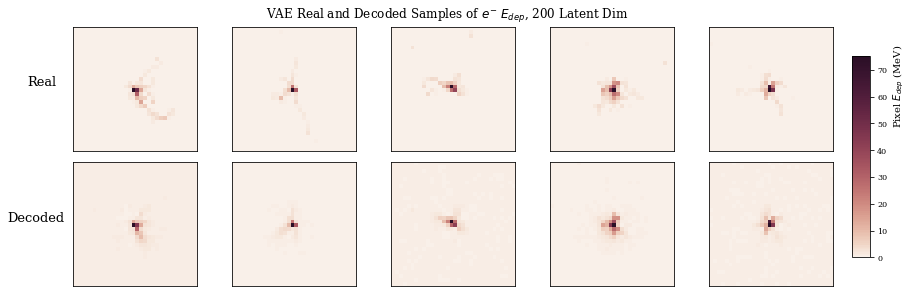

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


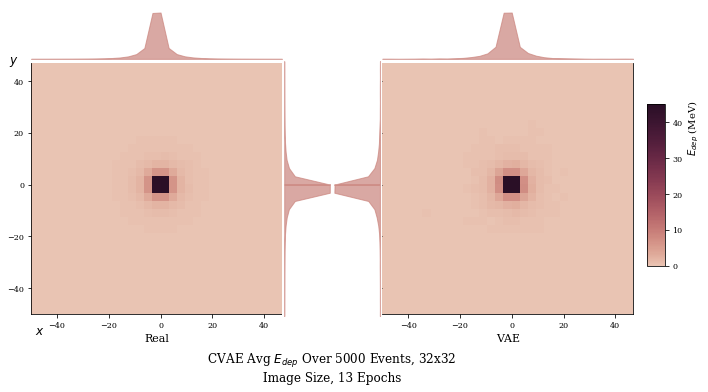

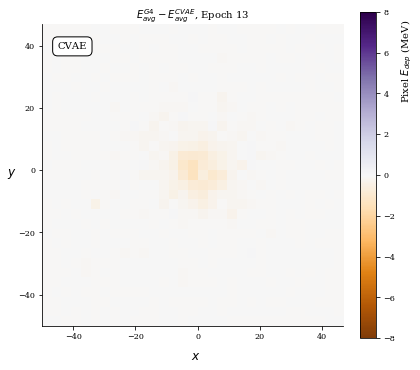

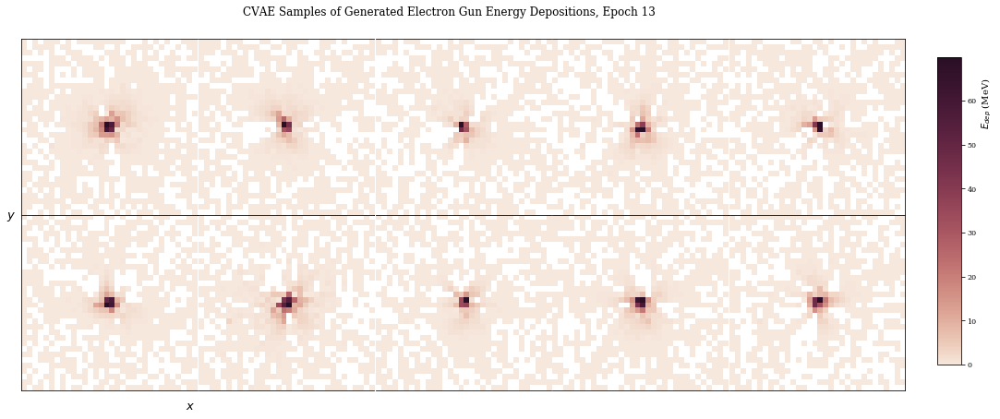

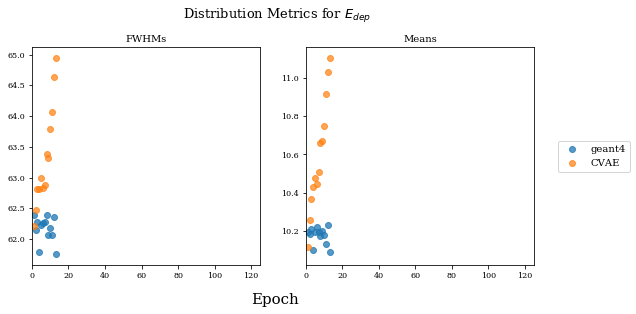

Train Epoch: 13 [0/15000 (0%)]	Loss: 220.104889
Train Epoch: 13 [6400/15000 (43%)]	Loss: 229.152344
Train Epoch: 13 [12800/15000 (85%)]	Loss: 227.384430
====> Epoch: 13 Average loss: 232.0262
====> Test set loss: 205.1811
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 14 [0/15000 (0%)]	Loss: 222.161484
Train Epoch: 14 [6400/15000 (43%)]	Loss: 218.656158
Train Epoch: 14 [12800/15000 (85%)]	Loss: 218.355682
====> Epoch: 14 Average loss: 228.2546
====> Test set loss: 203.9203
(5000, 32, 32)
(5000, 32, 32)


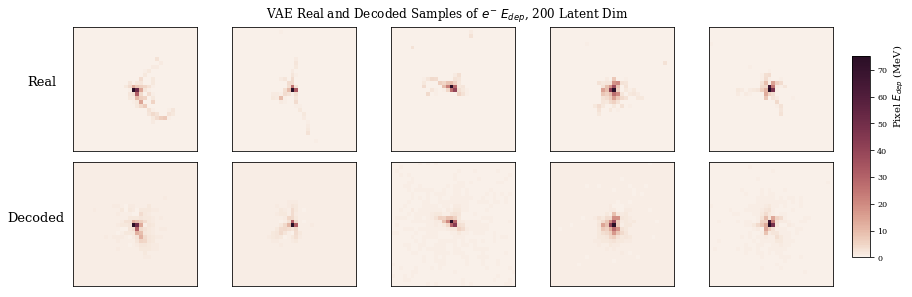

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


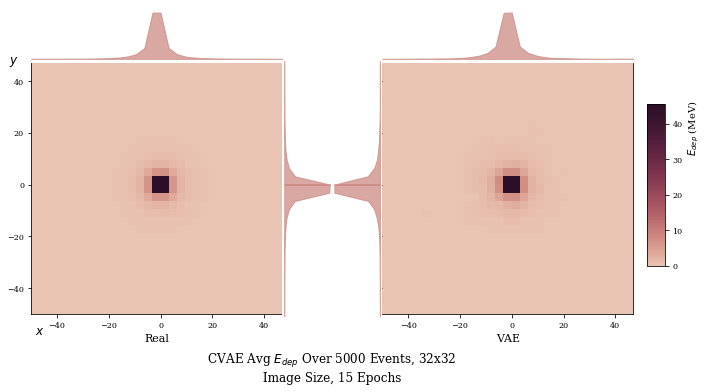

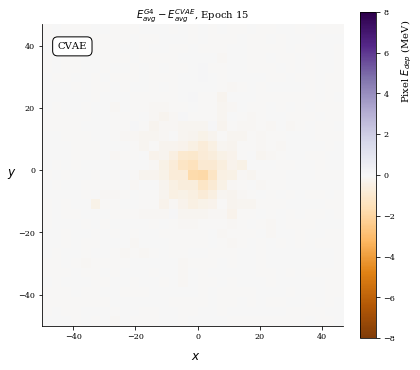

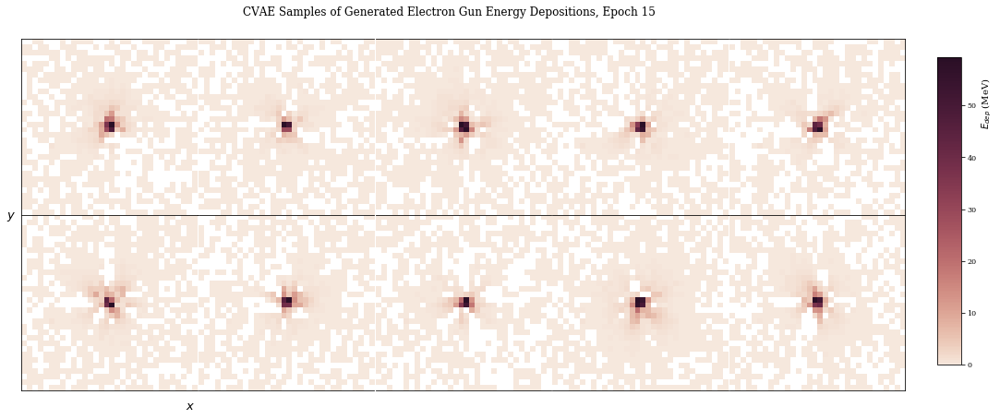

Train Epoch: 15 [0/15000 (0%)]	Loss: 214.828522
Train Epoch: 15 [6400/15000 (43%)]	Loss: 217.099976
Train Epoch: 15 [12800/15000 (85%)]	Loss: 211.260803
====> Epoch: 15 Average loss: 223.9176
====> Test set loss: 202.3081
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 16 [0/15000 (0%)]	Loss: 210.152725
Train Epoch: 16 [6400/15000 (43%)]	Loss: 214.460175
Train Epoch: 16 [12800/15000 (85%)]	Loss: 218.859055
====> Epoch: 16 Average loss: 220.8966
====> Test set loss: 197.7805
(5000, 32, 32)
(5000, 32, 32)


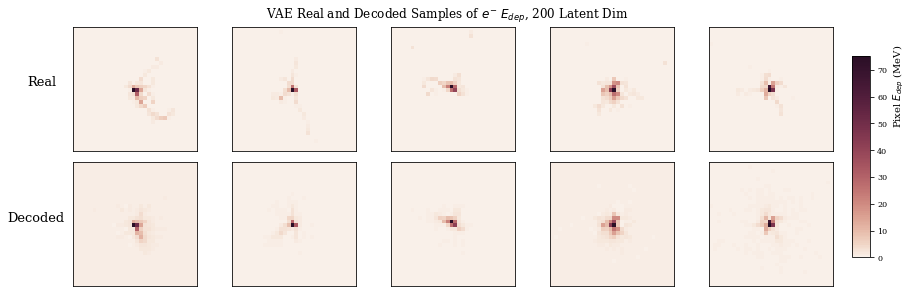

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


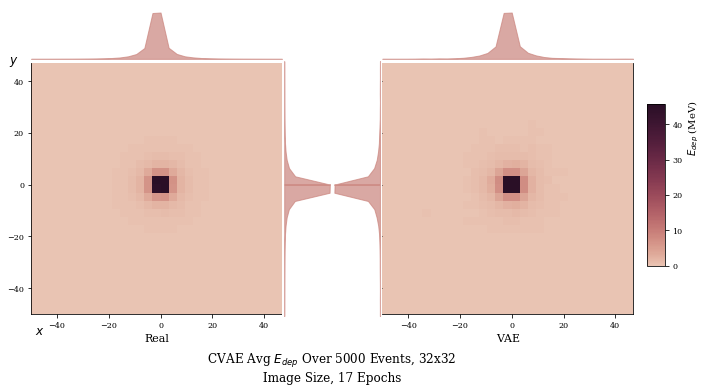

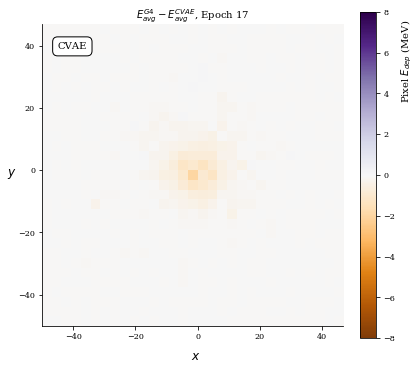

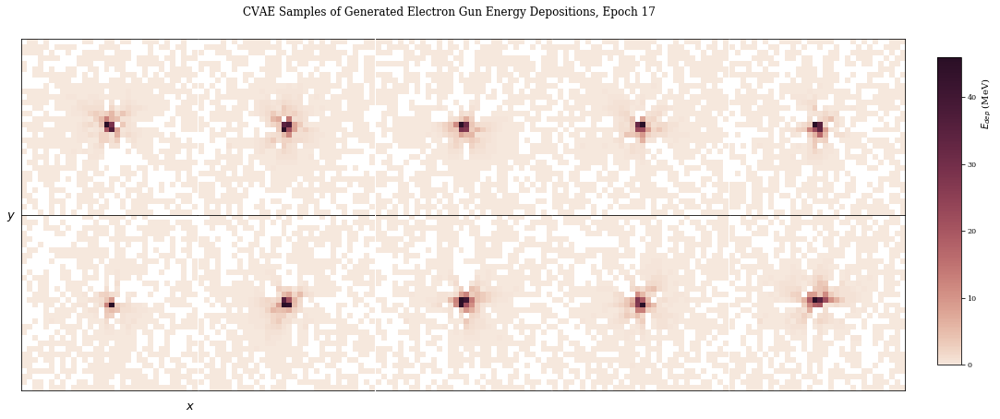

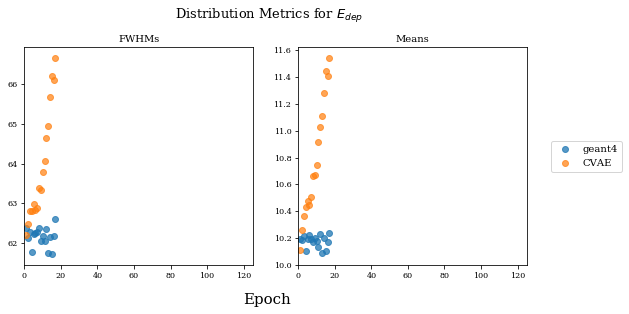

Train Epoch: 17 [0/15000 (0%)]	Loss: 204.162231
Train Epoch: 17 [6400/15000 (43%)]	Loss: 217.646240
Train Epoch: 17 [12800/15000 (85%)]	Loss: 207.543900
====> Epoch: 17 Average loss: 219.1119
====> Test set loss: 196.9009
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 18 [0/15000 (0%)]	Loss: 212.849243
Train Epoch: 18 [6400/15000 (43%)]	Loss: 207.969574
Train Epoch: 18 [12800/15000 (85%)]	Loss: 205.883102
====> Epoch: 18 Average loss: 215.2329
====> Test set loss: 197.4402
(5000, 32, 32)
(5000, 32, 32)


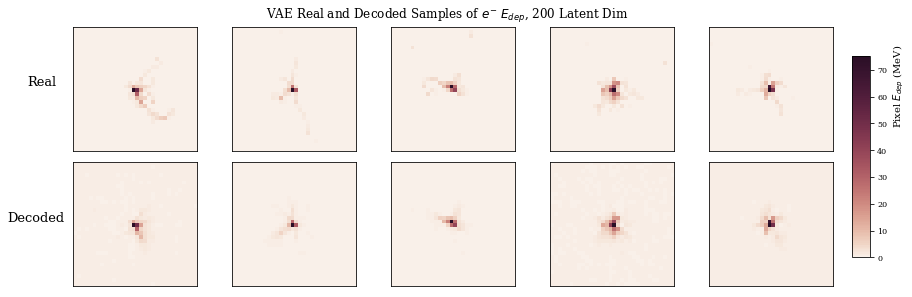

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


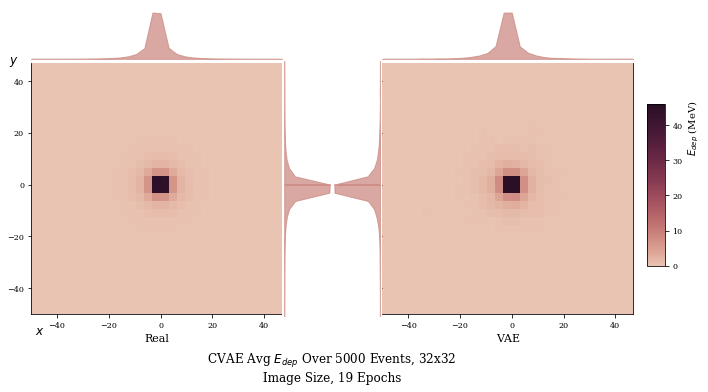

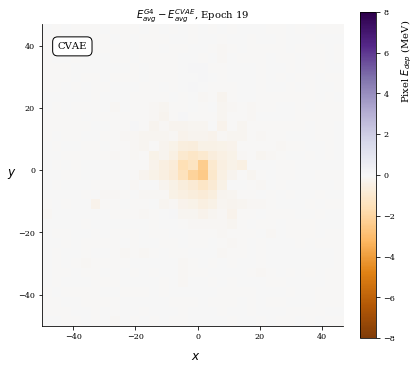

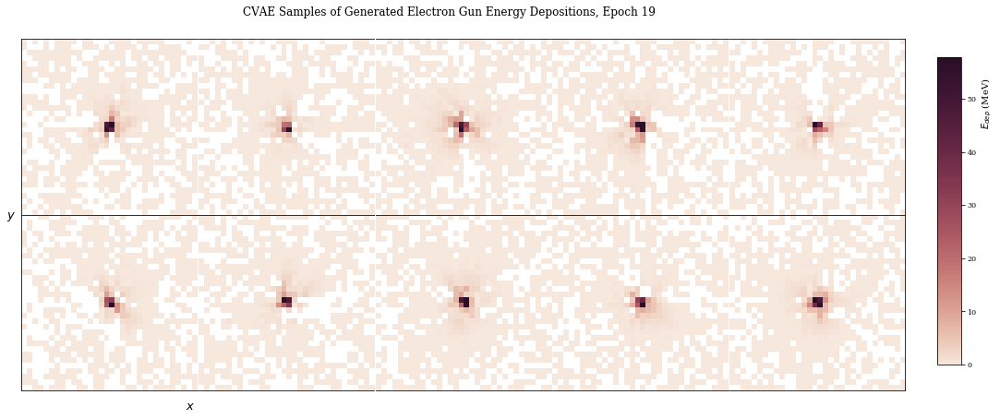

Train Epoch: 19 [0/15000 (0%)]	Loss: 211.585785
Train Epoch: 19 [6400/15000 (43%)]	Loss: 210.216202
Train Epoch: 19 [12800/15000 (85%)]	Loss: 208.199417
====> Epoch: 19 Average loss: 213.8883
====> Test set loss: 189.7574
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 20 [0/15000 (0%)]	Loss: 199.643372
Train Epoch: 20 [6400/15000 (43%)]	Loss: 206.760406
Train Epoch: 20 [12800/15000 (85%)]	Loss: 199.204865
====> Epoch: 20 Average loss: 211.0105
====> Test set loss: 187.3785
(5000, 32, 32)
(5000, 32, 32)


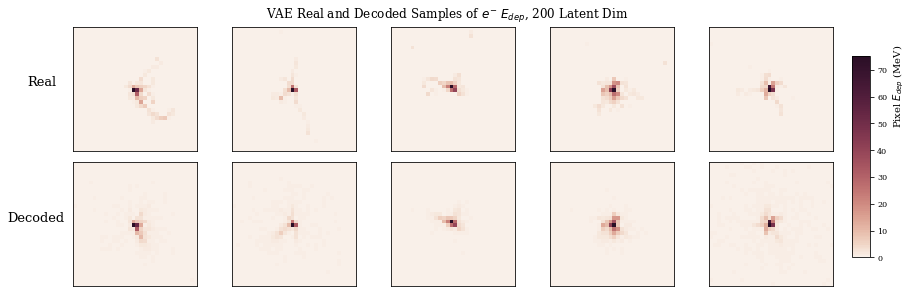

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


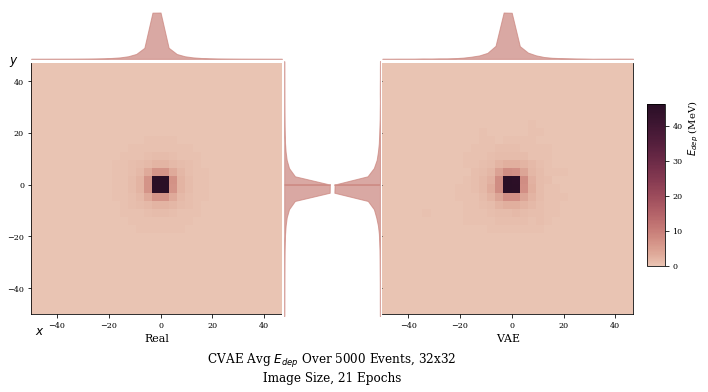

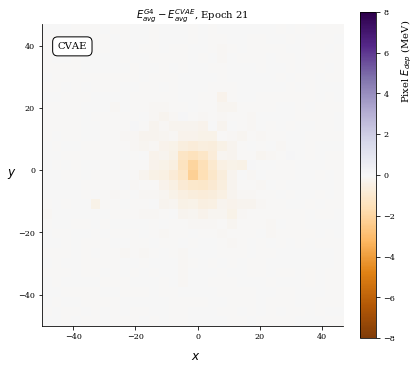

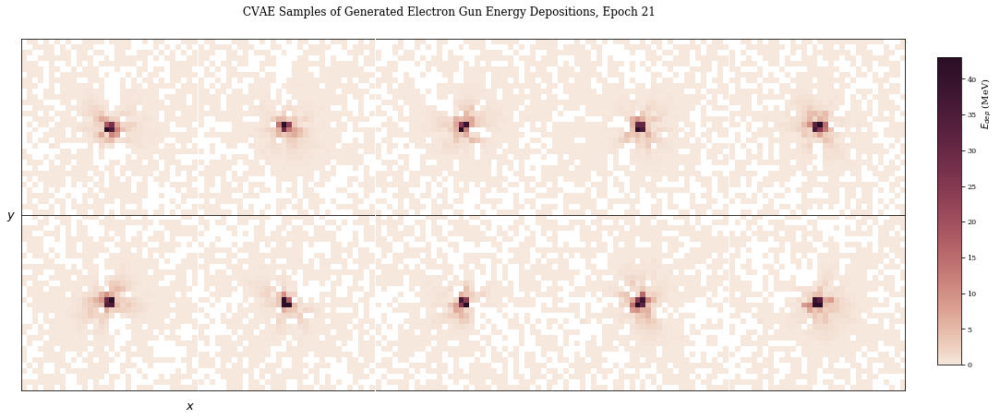

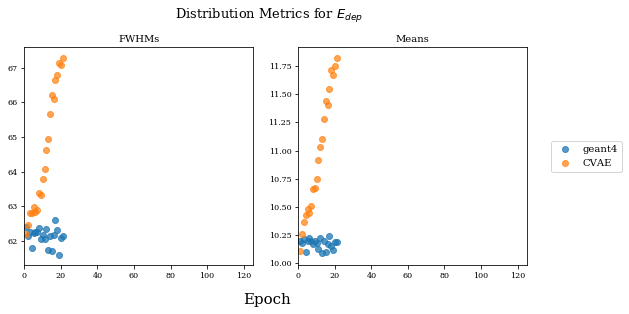

Train Epoch: 21 [0/15000 (0%)]	Loss: 198.040482
Train Epoch: 21 [6400/15000 (43%)]	Loss: 203.177948
Train Epoch: 21 [12800/15000 (85%)]	Loss: 198.709503
====> Epoch: 21 Average loss: 207.9601
====> Test set loss: 188.3966
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 22 [0/15000 (0%)]	Loss: 196.741913
Train Epoch: 22 [6400/15000 (43%)]	Loss: 205.324966
Train Epoch: 22 [12800/15000 (85%)]	Loss: 201.741974
====> Epoch: 22 Average loss: 206.6901
====> Test set loss: 183.5907
(5000, 32, 32)
(5000, 32, 32)


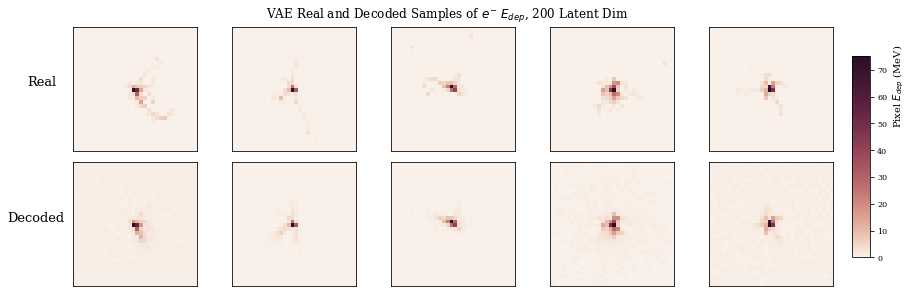

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


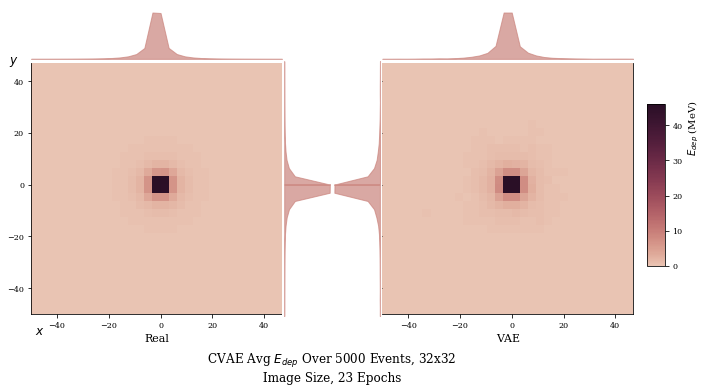

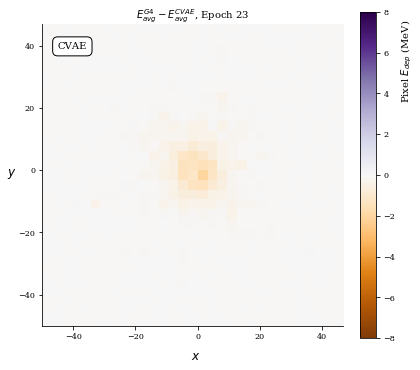

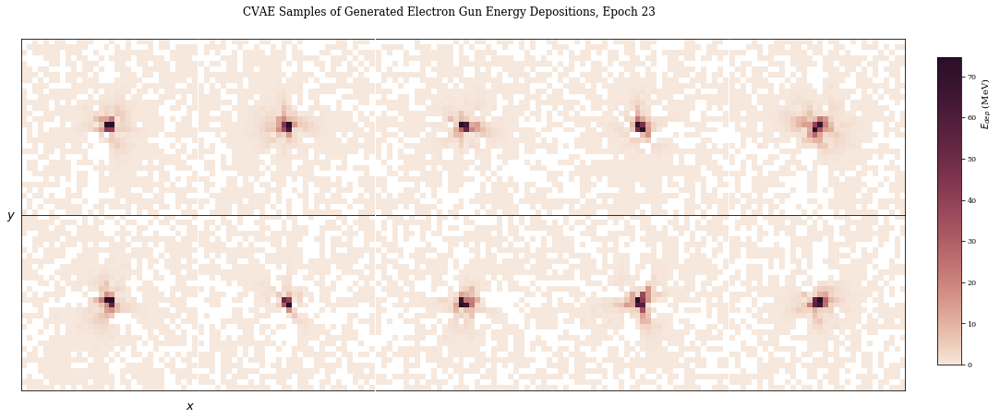

Train Epoch: 23 [0/15000 (0%)]	Loss: 198.225311
Train Epoch: 23 [6400/15000 (43%)]	Loss: 200.238007
Train Epoch: 23 [12800/15000 (85%)]	Loss: 195.942154
====> Epoch: 23 Average loss: 205.8722
====> Test set loss: 185.9417
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 24 [0/15000 (0%)]	Loss: 194.102997
Train Epoch: 24 [6400/15000 (43%)]	Loss: 204.978592
Train Epoch: 24 [12800/15000 (85%)]	Loss: 199.410187
====> Epoch: 24 Average loss: 204.1813
====> Test set loss: 186.5046
(5000, 32, 32)
(5000, 32, 32)


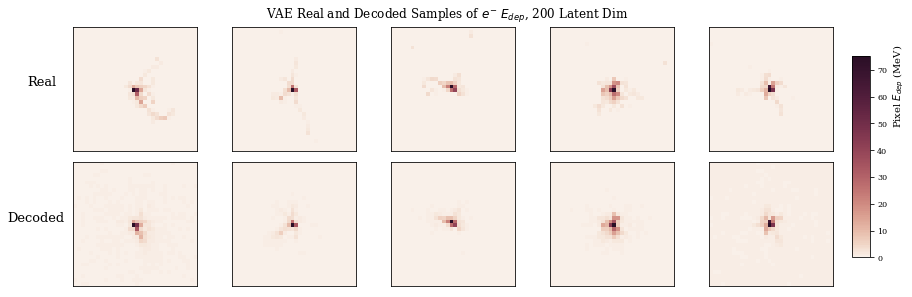

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


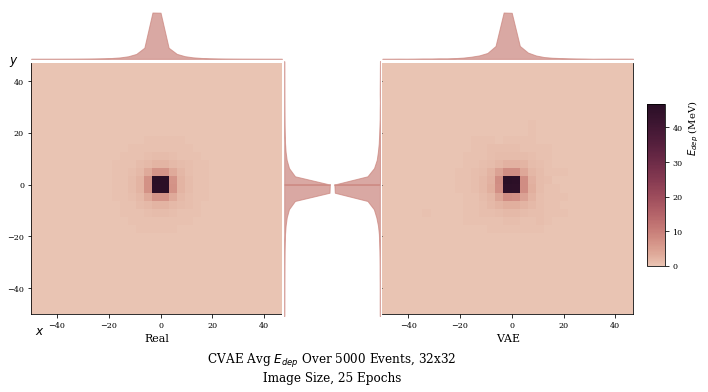

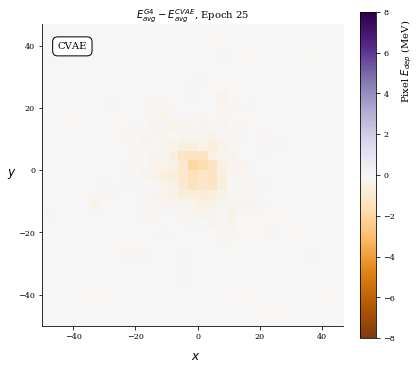

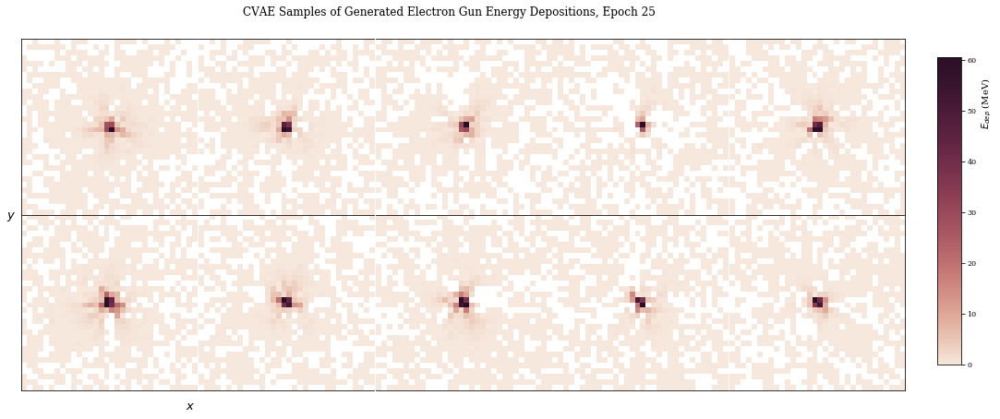

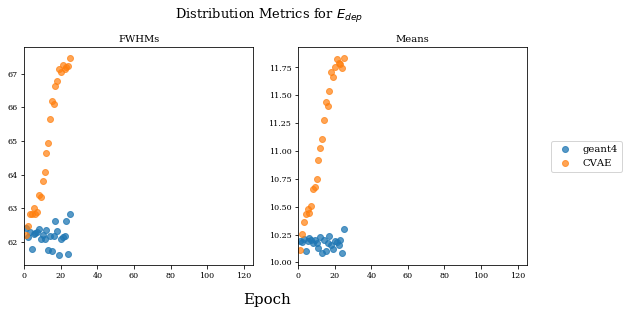

Train Epoch: 25 [0/15000 (0%)]	Loss: 195.090317
Train Epoch: 25 [6400/15000 (43%)]	Loss: 196.057159
Train Epoch: 25 [12800/15000 (85%)]	Loss: 191.692413
====> Epoch: 25 Average loss: 202.0149
====> Test set loss: 187.0777
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 26 [0/15000 (0%)]	Loss: 198.658203
Train Epoch: 26 [6400/15000 (43%)]	Loss: 196.566498
Train Epoch: 26 [12800/15000 (85%)]	Loss: 192.124680
====> Epoch: 26 Average loss: 201.2516
====> Test set loss: 180.9863
(5000, 32, 32)
(5000, 32, 32)


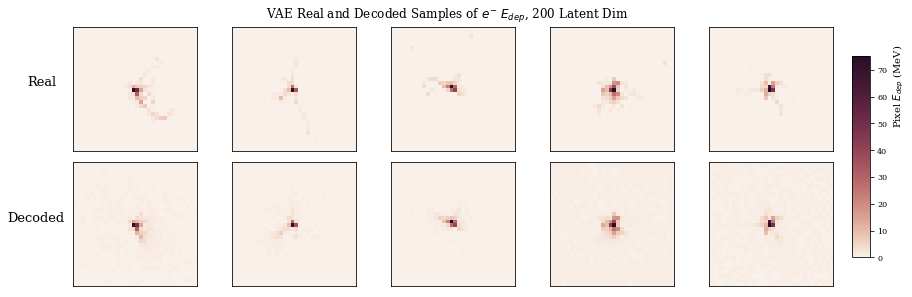

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


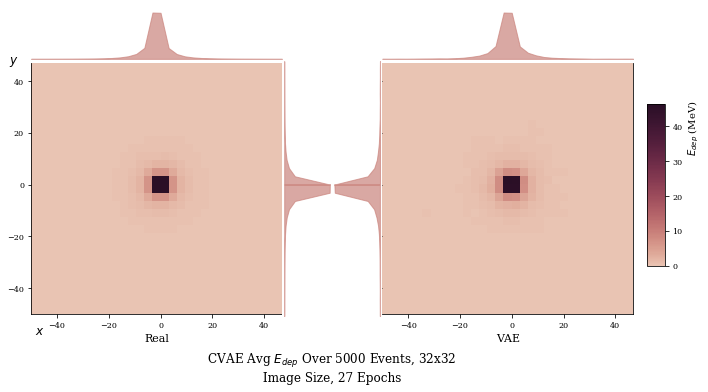

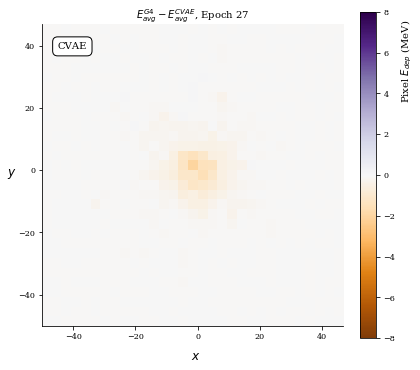

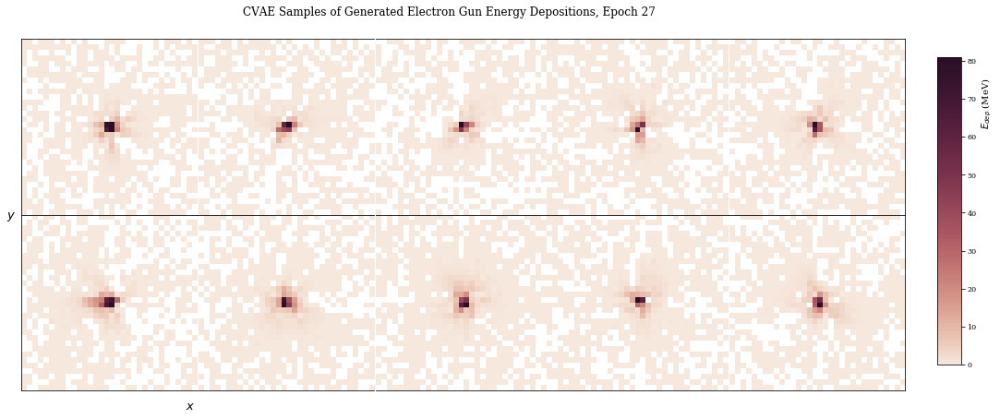

Train Epoch: 27 [0/15000 (0%)]	Loss: 188.437103
Train Epoch: 27 [6400/15000 (43%)]	Loss: 194.489548
Train Epoch: 27 [12800/15000 (85%)]	Loss: 197.288910
====> Epoch: 27 Average loss: 199.3440
====> Test set loss: 179.2479
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 28 [0/15000 (0%)]	Loss: 187.588974
Train Epoch: 28 [6400/15000 (43%)]	Loss: 194.447784
Train Epoch: 28 [12800/15000 (85%)]	Loss: 193.075378
====> Epoch: 28 Average loss: 198.0775
====> Test set loss: 178.1490
(5000, 32, 32)
(5000, 32, 32)


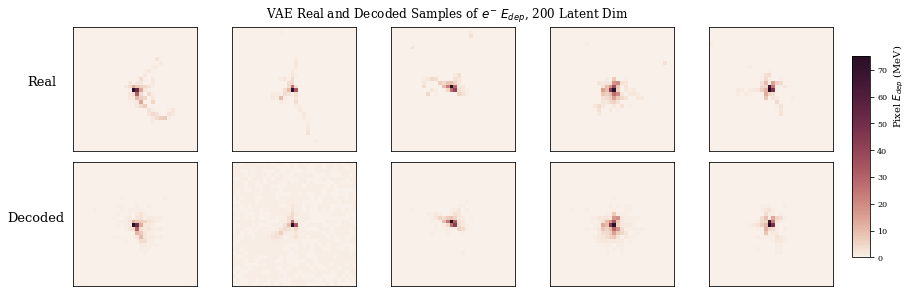

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


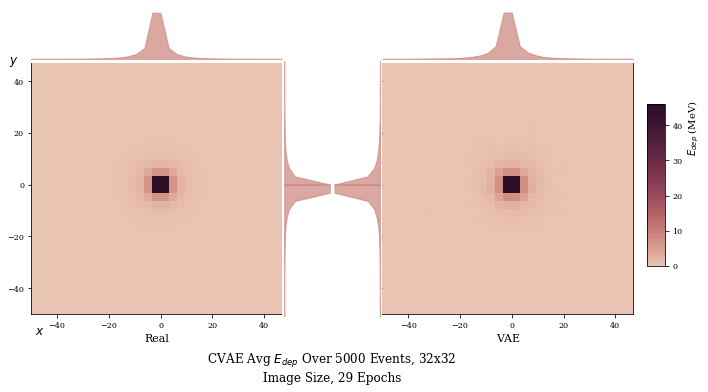

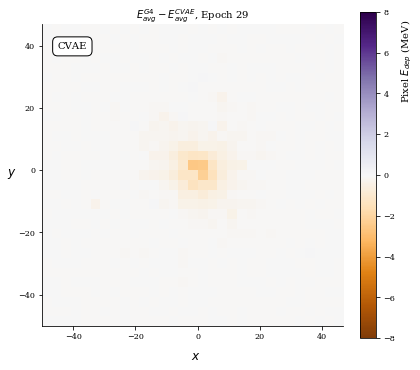

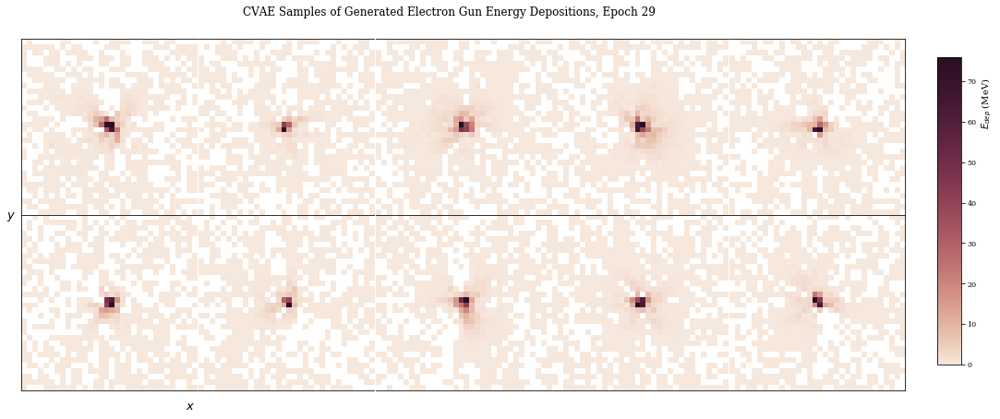

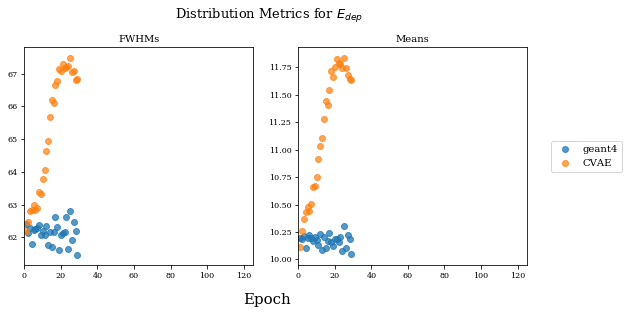

Train Epoch: 29 [0/15000 (0%)]	Loss: 185.351440
Train Epoch: 29 [6400/15000 (43%)]	Loss: 193.615204
Train Epoch: 29 [12800/15000 (85%)]	Loss: 192.597076
====> Epoch: 29 Average loss: 197.3898
====> Test set loss: 176.3463
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 30 [0/15000 (0%)]	Loss: 188.839493
Train Epoch: 30 [6400/15000 (43%)]	Loss: 192.269272
Train Epoch: 30 [12800/15000 (85%)]	Loss: 189.054962
====> Epoch: 30 Average loss: 196.3594
====> Test set loss: 176.3113
(5000, 32, 32)
(5000, 32, 32)


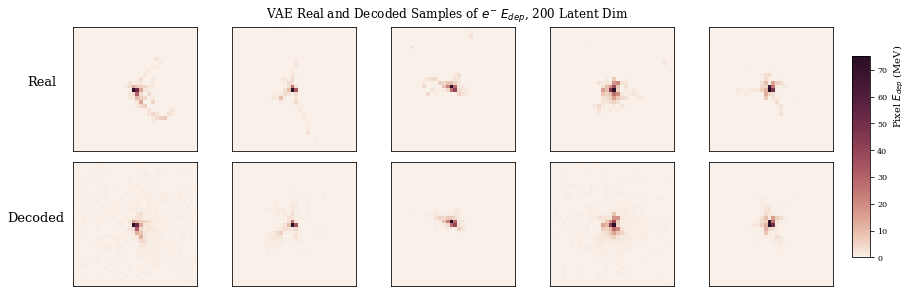

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


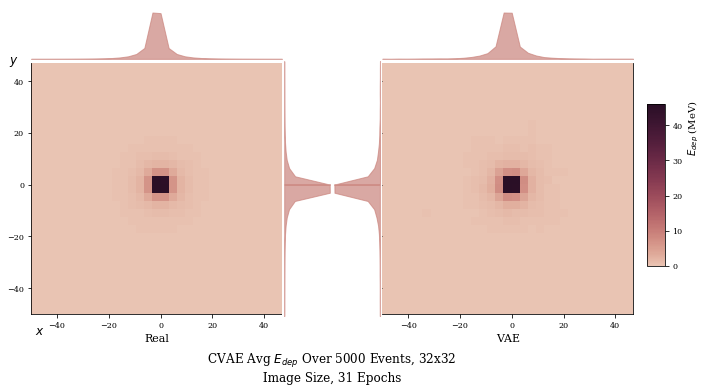

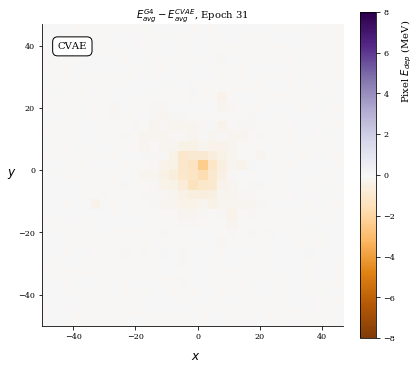

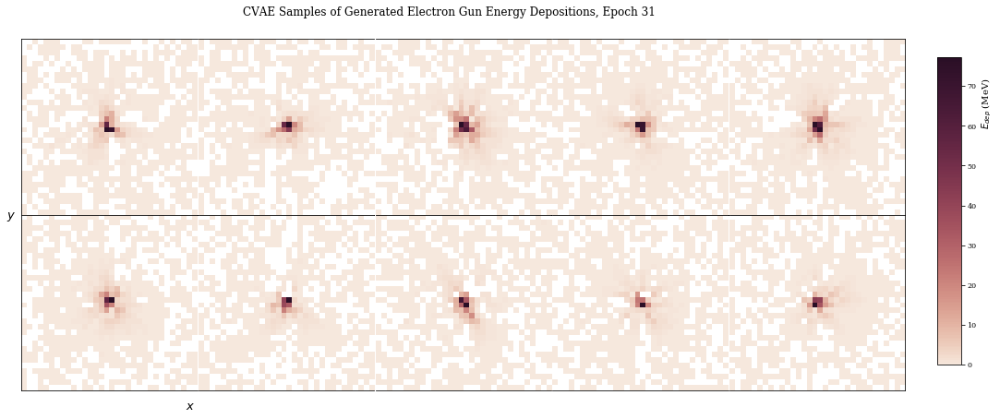

Train Epoch: 31 [0/15000 (0%)]	Loss: 186.947601
Train Epoch: 31 [6400/15000 (43%)]	Loss: 188.815781
Train Epoch: 31 [12800/15000 (85%)]	Loss: 185.776550
====> Epoch: 31 Average loss: 194.5460
====> Test set loss: 175.9936
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 32 [0/15000 (0%)]	Loss: 189.700424
Train Epoch: 32 [6400/15000 (43%)]	Loss: 188.562103
Train Epoch: 32 [12800/15000 (85%)]	Loss: 190.368866
====> Epoch: 32 Average loss: 193.5144
====> Test set loss: 174.0560
(5000, 32, 32)
(5000, 32, 32)


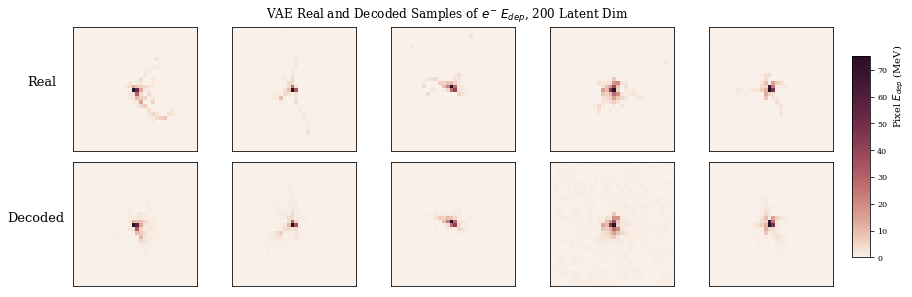

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


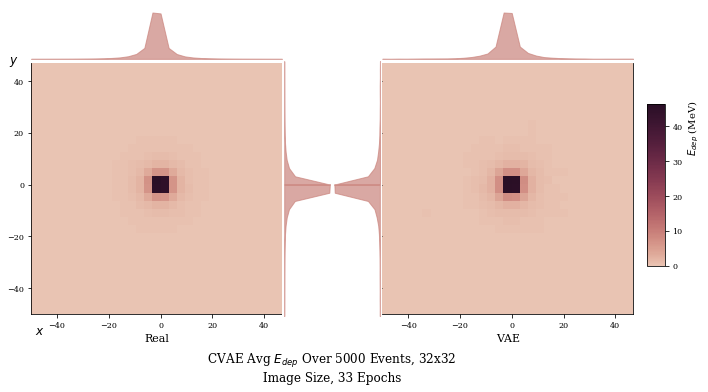

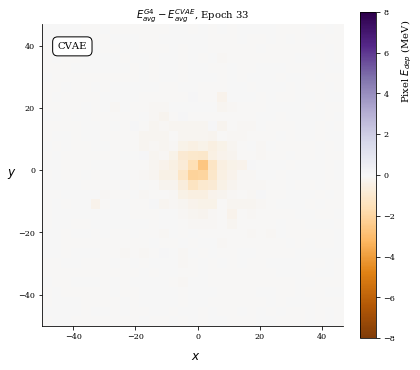

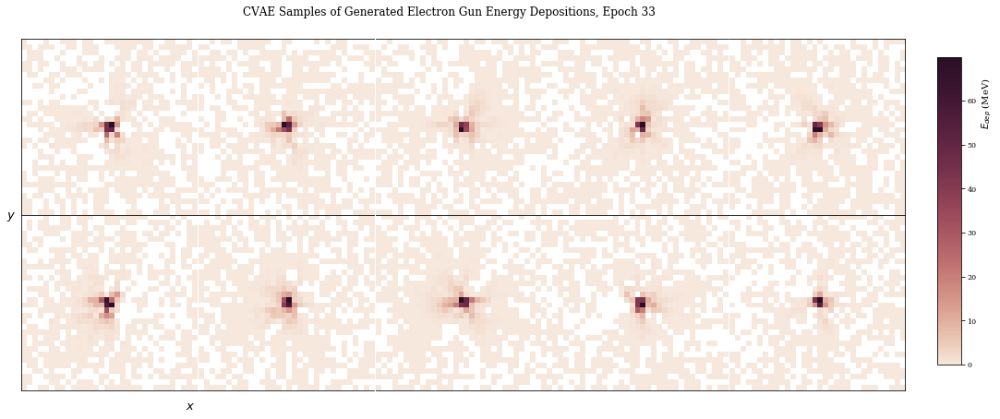

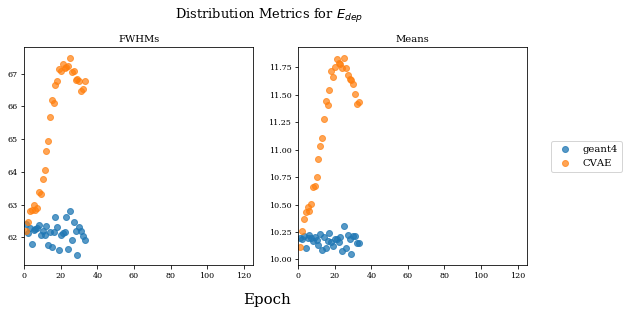

Train Epoch: 33 [0/15000 (0%)]	Loss: 188.241882
Train Epoch: 33 [6400/15000 (43%)]	Loss: 190.880920
Train Epoch: 33 [12800/15000 (85%)]	Loss: 189.189880
====> Epoch: 33 Average loss: 193.0233
====> Test set loss: 172.0822
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 34 [0/15000 (0%)]	Loss: 184.826202
Train Epoch: 34 [6400/15000 (43%)]	Loss: 183.193726
Train Epoch: 34 [12800/15000 (85%)]	Loss: 190.657822
====> Epoch: 34 Average loss: 191.8854
====> Test set loss: 171.0311
(5000, 32, 32)
(5000, 32, 32)


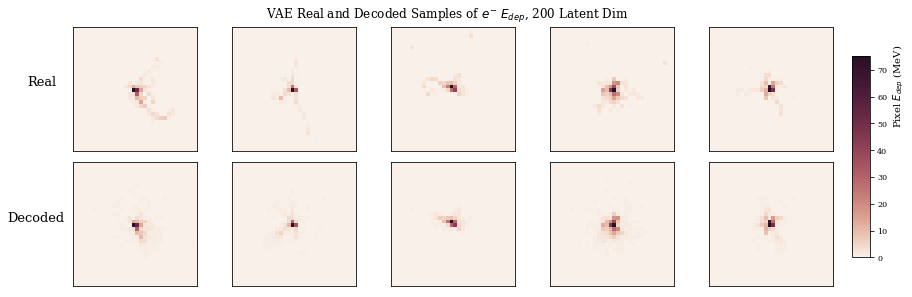

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


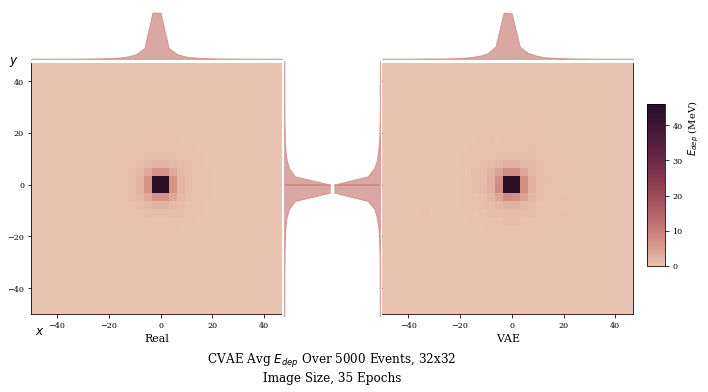

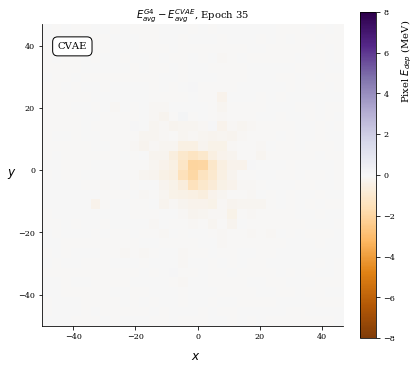

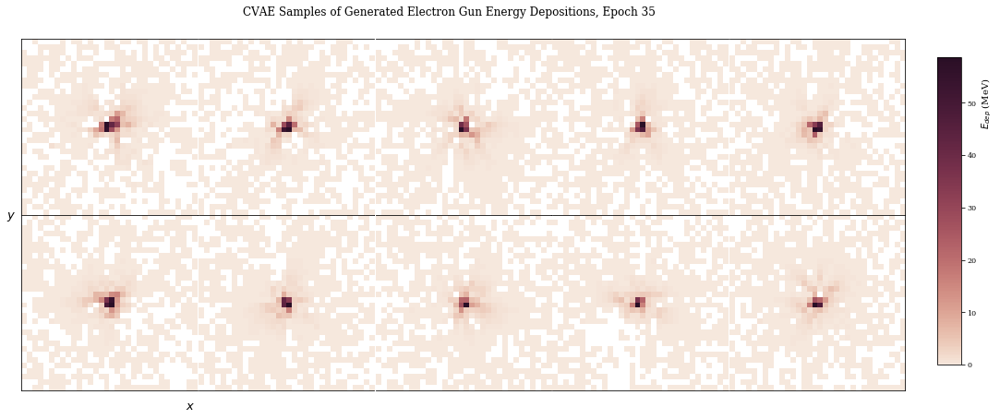

Train Epoch: 35 [0/15000 (0%)]	Loss: 182.677429
Train Epoch: 35 [6400/15000 (43%)]	Loss: 189.037842
Train Epoch: 35 [12800/15000 (85%)]	Loss: 182.497894
====> Epoch: 35 Average loss: 190.8969
====> Test set loss: 171.0225
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 36 [0/15000 (0%)]	Loss: 183.838440
Train Epoch: 36 [6400/15000 (43%)]	Loss: 182.213318
Train Epoch: 36 [12800/15000 (85%)]	Loss: 189.800537
====> Epoch: 36 Average loss: 190.5406
====> Test set loss: 170.1850
(5000, 32, 32)
(5000, 32, 32)


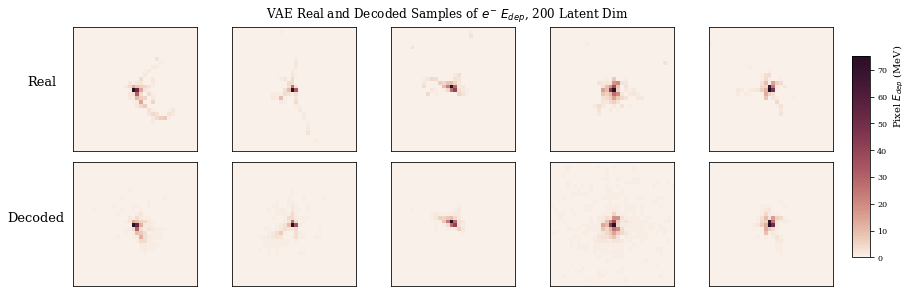

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


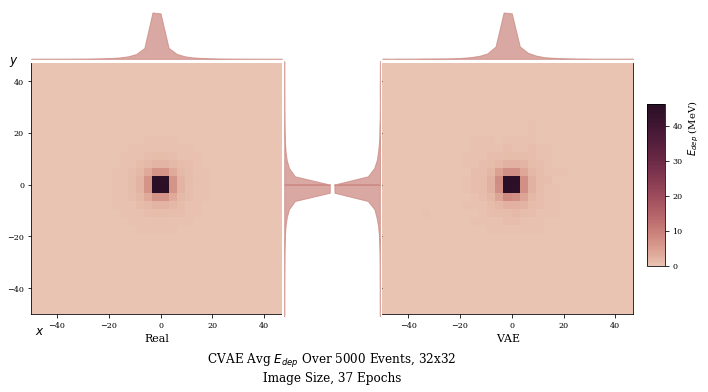

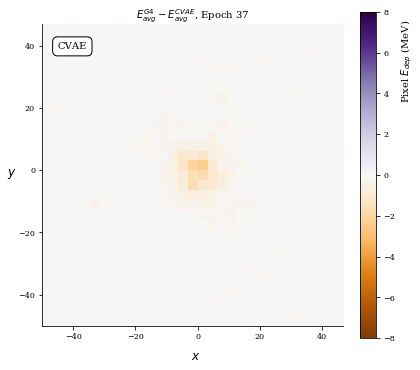

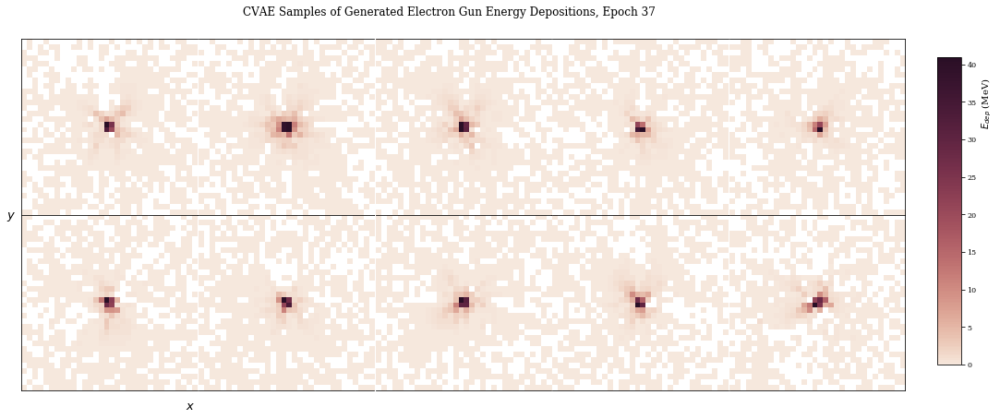

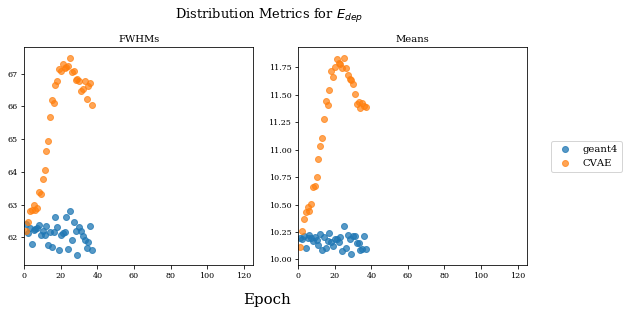

Train Epoch: 37 [0/15000 (0%)]	Loss: 182.802338
Train Epoch: 37 [6400/15000 (43%)]	Loss: 184.403900
Train Epoch: 37 [12800/15000 (85%)]	Loss: 189.623962
====> Epoch: 37 Average loss: 188.9427
====> Test set loss: 171.3844
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 38 [0/15000 (0%)]	Loss: 184.660034
Train Epoch: 38 [6400/15000 (43%)]	Loss: 180.521622
Train Epoch: 38 [12800/15000 (85%)]	Loss: 187.474945
====> Epoch: 38 Average loss: 188.0460
====> Test set loss: 169.5863
(5000, 32, 32)
(5000, 32, 32)


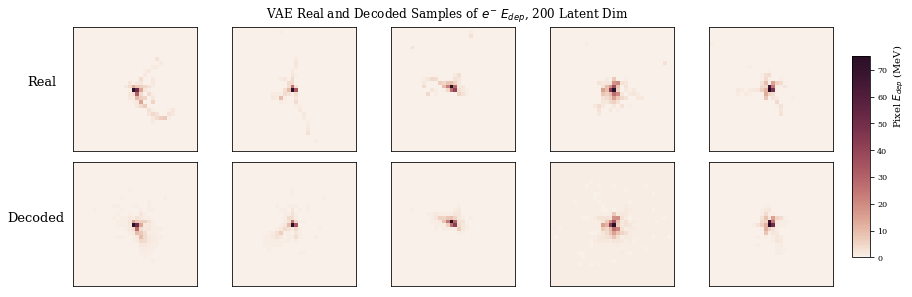

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


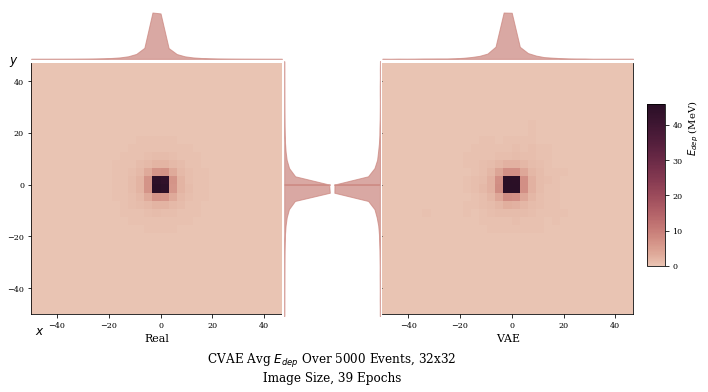

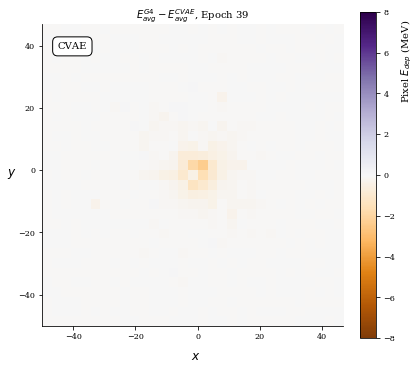

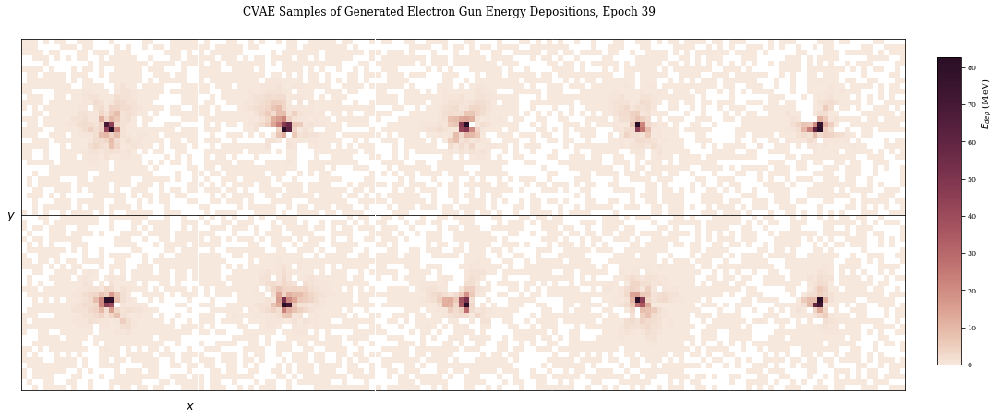

Train Epoch: 39 [0/15000 (0%)]	Loss: 182.630768
Train Epoch: 39 [6400/15000 (43%)]	Loss: 183.454315
Train Epoch: 39 [12800/15000 (85%)]	Loss: 183.006134
====> Epoch: 39 Average loss: 187.5538
====> Test set loss: 168.1322
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 40 [0/15000 (0%)]	Loss: 180.480225
Train Epoch: 40 [6400/15000 (43%)]	Loss: 180.506592
Train Epoch: 40 [12800/15000 (85%)]	Loss: 176.642578
====> Epoch: 40 Average loss: 186.6328
====> Test set loss: 167.5000
(5000, 32, 32)
(5000, 32, 32)


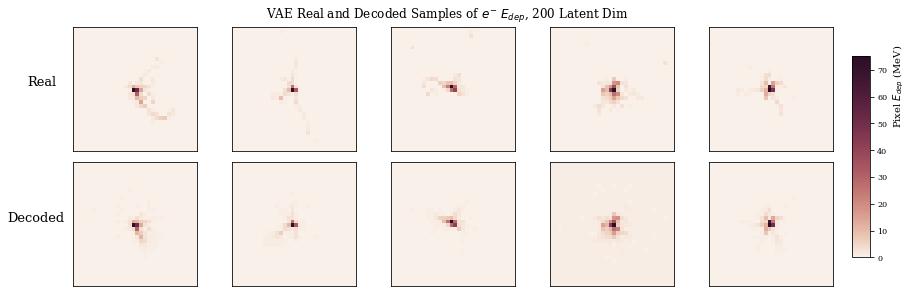

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


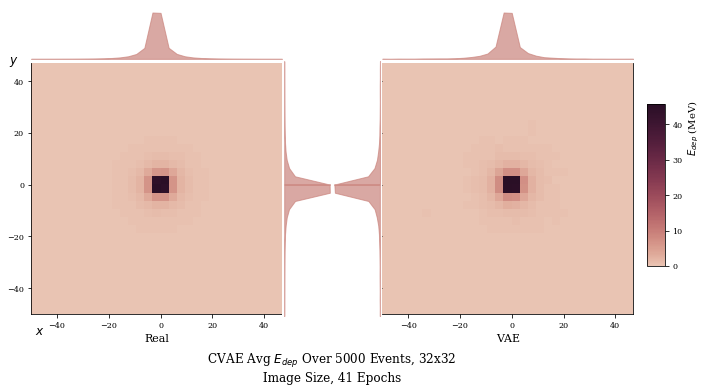

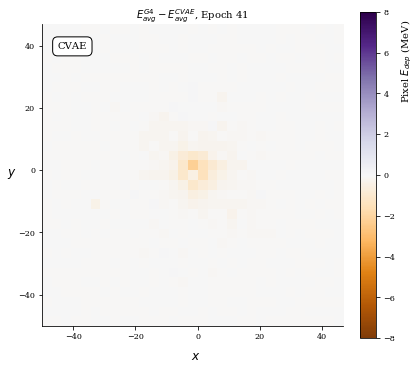

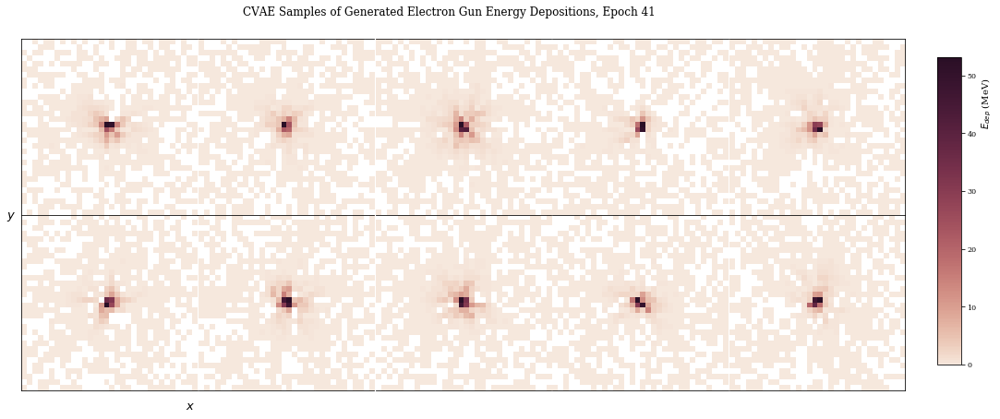

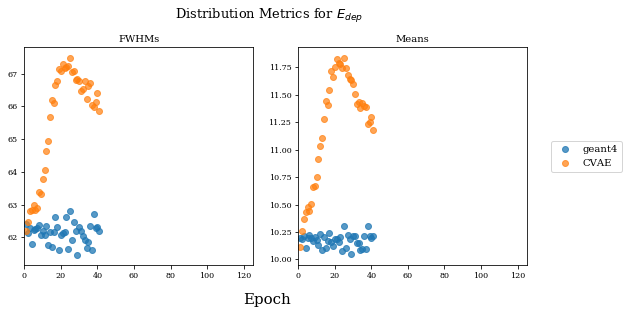

Train Epoch: 41 [0/15000 (0%)]	Loss: 181.241226
Train Epoch: 41 [6400/15000 (43%)]	Loss: 184.396011
Train Epoch: 41 [12800/15000 (85%)]	Loss: 187.272919
====> Epoch: 41 Average loss: 186.2450
====> Test set loss: 168.9460
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 42 [0/15000 (0%)]	Loss: 181.697815
Train Epoch: 42 [6400/15000 (43%)]	Loss: 184.024857
Train Epoch: 42 [12800/15000 (85%)]	Loss: 182.562286
====> Epoch: 42 Average loss: 185.8253
====> Test set loss: 166.3944
(5000, 32, 32)
(5000, 32, 32)


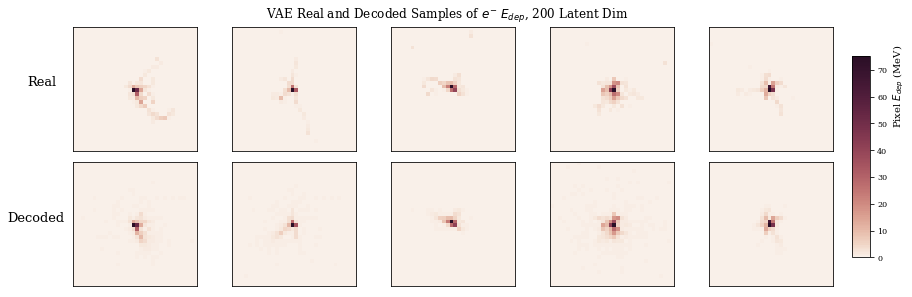

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


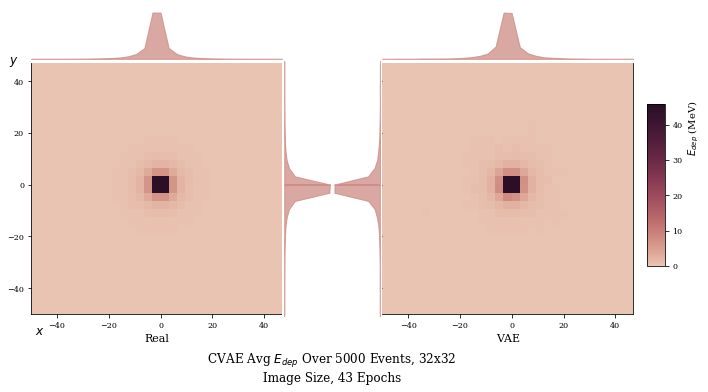

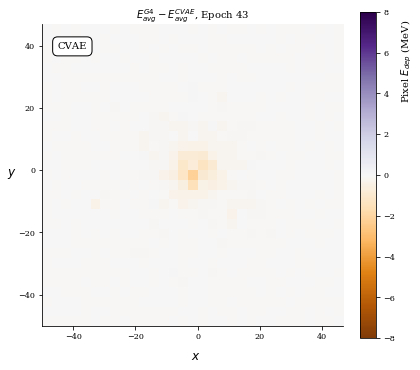

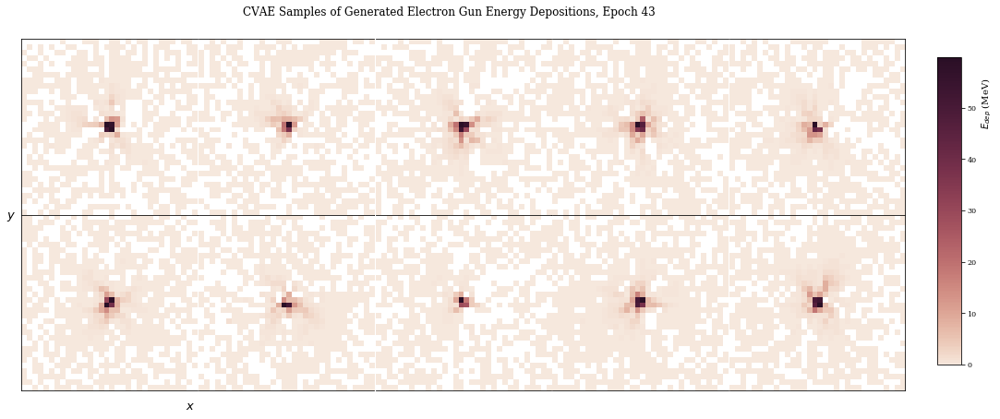

Train Epoch: 43 [0/15000 (0%)]	Loss: 181.896790
Train Epoch: 43 [6400/15000 (43%)]	Loss: 178.542679
Train Epoch: 43 [12800/15000 (85%)]	Loss: 177.942322
====> Epoch: 43 Average loss: 184.6409
====> Test set loss: 164.8345
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 44 [0/15000 (0%)]	Loss: 179.254272
Train Epoch: 44 [6400/15000 (43%)]	Loss: 184.610291
Train Epoch: 44 [12800/15000 (85%)]	Loss: 178.597473
====> Epoch: 44 Average loss: 184.1720
====> Test set loss: 166.1360
(5000, 32, 32)
(5000, 32, 32)


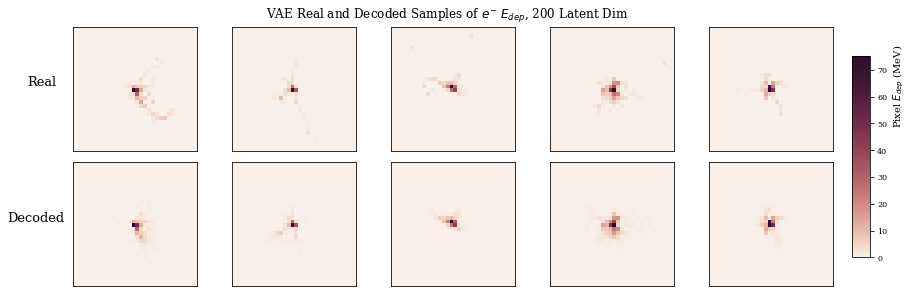

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


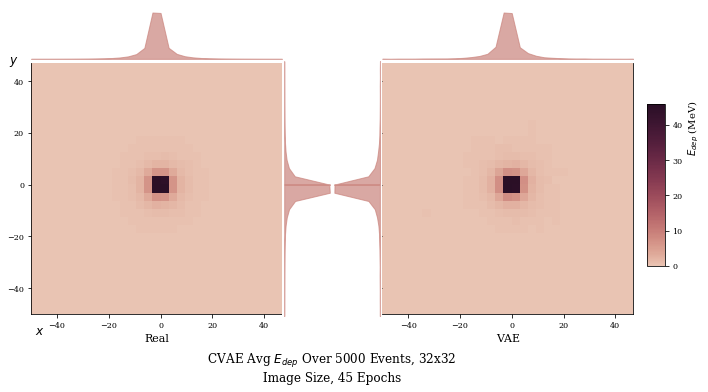

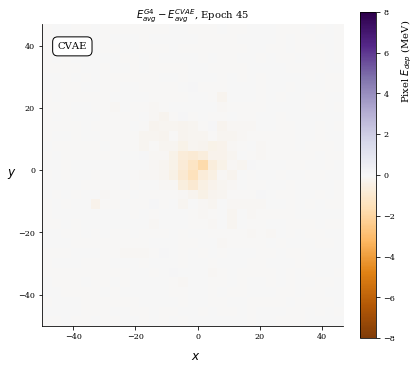

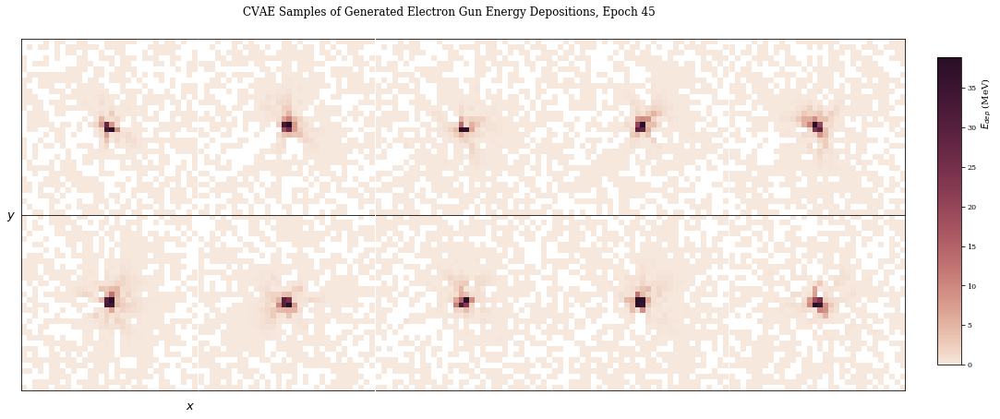

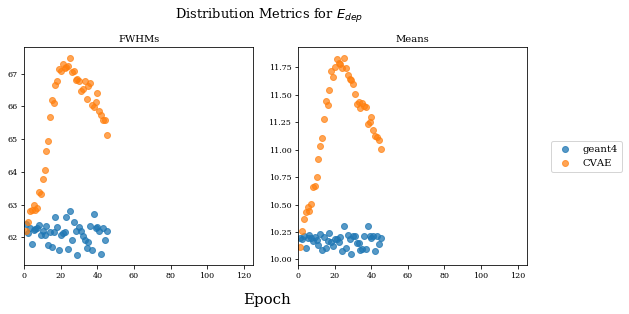

Train Epoch: 45 [0/15000 (0%)]	Loss: 174.872955
Train Epoch: 45 [6400/15000 (43%)]	Loss: 178.192780
Train Epoch: 45 [12800/15000 (85%)]	Loss: 182.461151
====> Epoch: 45 Average loss: 184.2925
====> Test set loss: 163.9028
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 46 [0/15000 (0%)]	Loss: 179.491669
Train Epoch: 46 [6400/15000 (43%)]	Loss: 181.244247
Train Epoch: 46 [12800/15000 (85%)]	Loss: 179.608994
====> Epoch: 46 Average loss: 183.2549
====> Test set loss: 164.2506
(5000, 32, 32)
(5000, 32, 32)


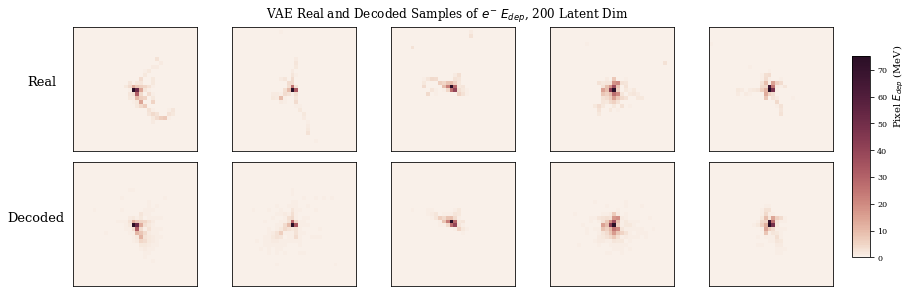

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


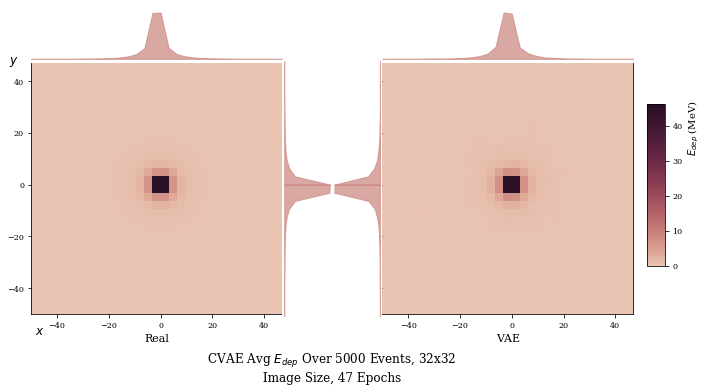

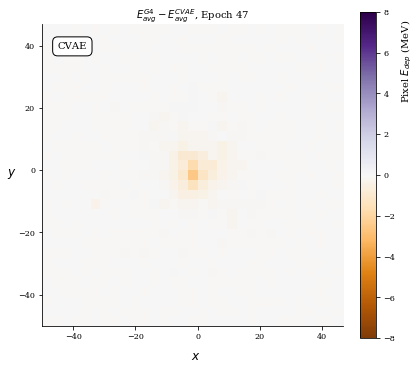

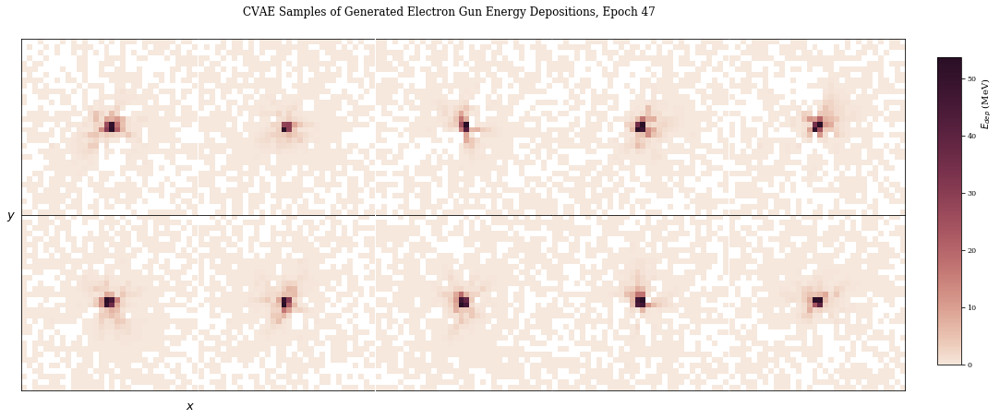

Train Epoch: 47 [0/15000 (0%)]	Loss: 177.556183
Train Epoch: 47 [6400/15000 (43%)]	Loss: 181.163483
Train Epoch: 47 [12800/15000 (85%)]	Loss: 182.167786
====> Epoch: 47 Average loss: 182.4442
====> Test set loss: 163.1368
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 48 [0/15000 (0%)]	Loss: 173.543732
Train Epoch: 48 [6400/15000 (43%)]	Loss: 182.413055
Train Epoch: 48 [12800/15000 (85%)]	Loss: 179.013428
====> Epoch: 48 Average loss: 182.5210
====> Test set loss: 162.8652
(5000, 32, 32)
(5000, 32, 32)


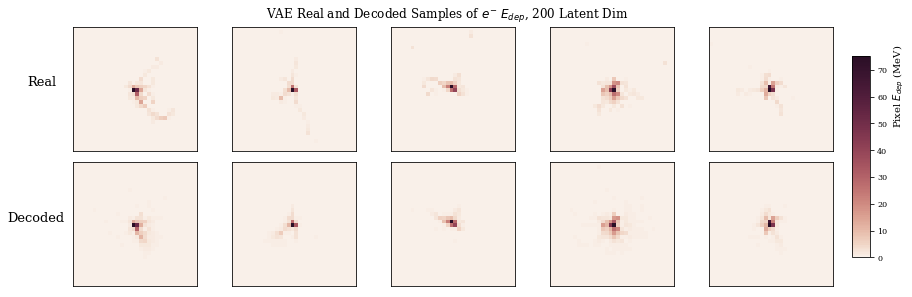

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


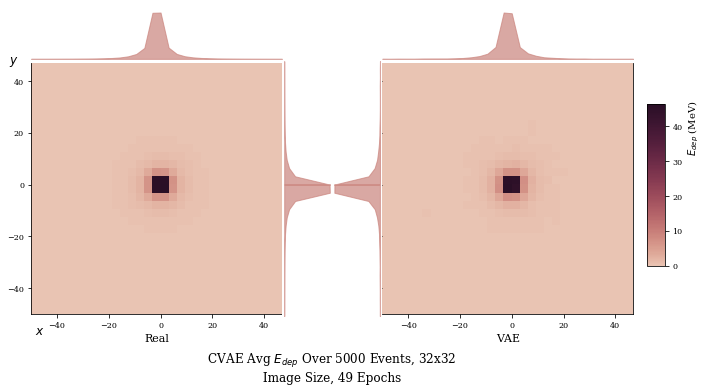

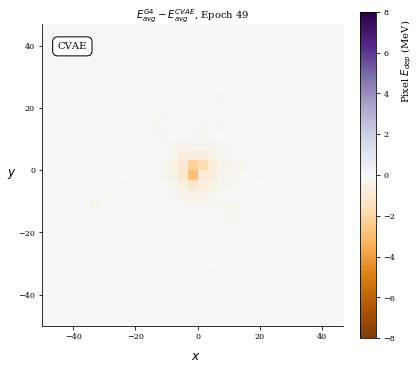

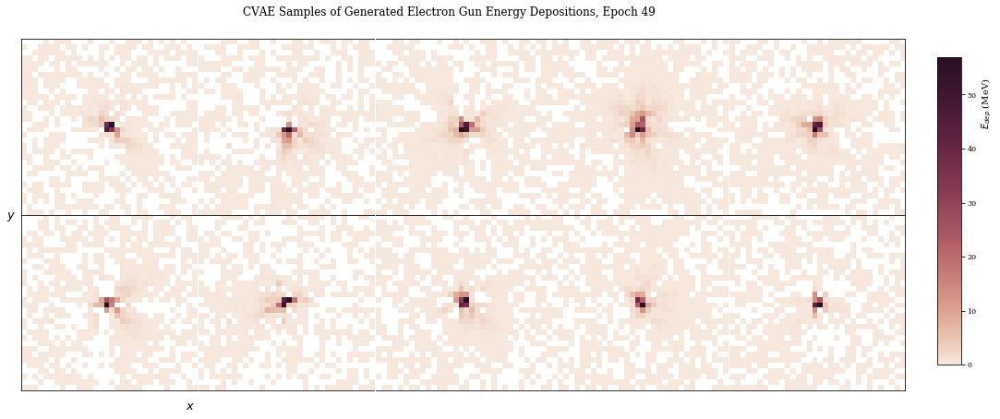

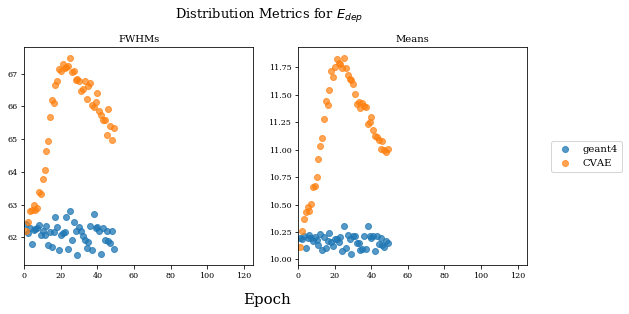

Train Epoch: 49 [0/15000 (0%)]	Loss: 178.574890
Train Epoch: 49 [6400/15000 (43%)]	Loss: 174.597046
Train Epoch: 49 [12800/15000 (85%)]	Loss: 175.045624
====> Epoch: 49 Average loss: 181.3002
====> Test set loss: 163.1861
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 50 [0/15000 (0%)]	Loss: 173.533157
Train Epoch: 50 [6400/15000 (43%)]	Loss: 176.681305
Train Epoch: 50 [12800/15000 (85%)]	Loss: 175.752594
====> Epoch: 50 Average loss: 180.7267
====> Test set loss: 162.7269
(5000, 32, 32)
(5000, 32, 32)


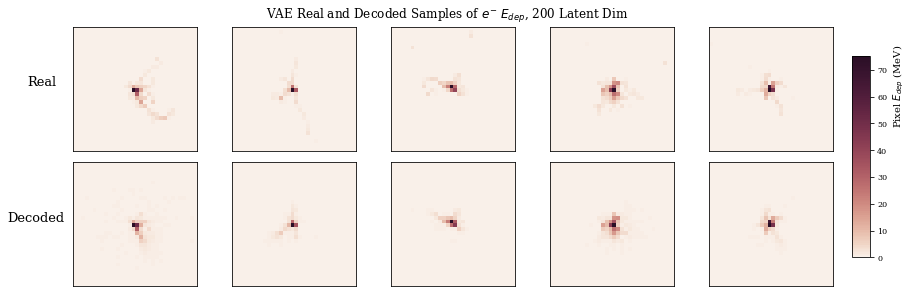

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


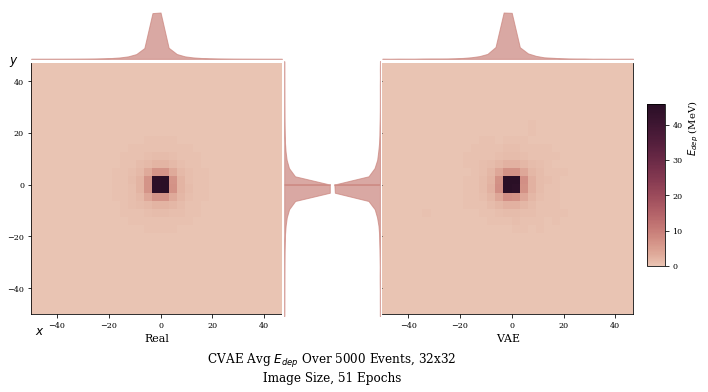

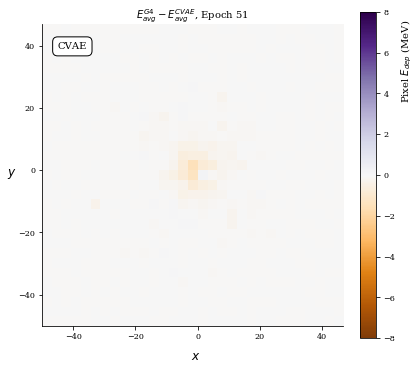

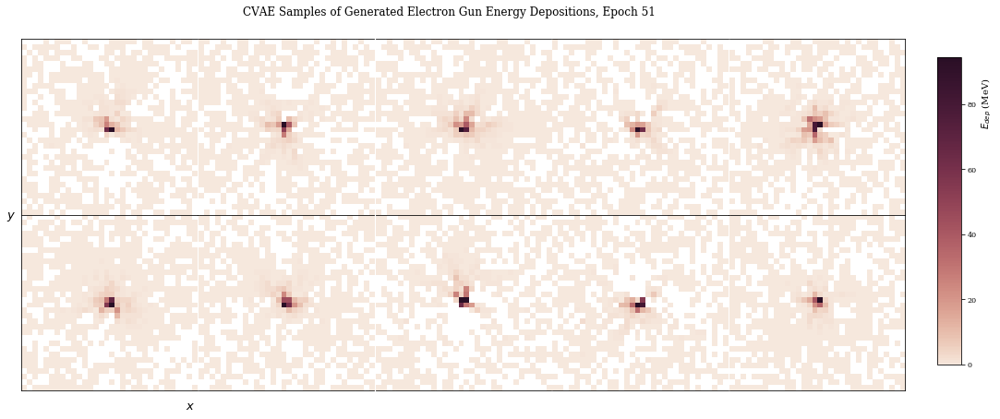

Train Epoch: 51 [0/15000 (0%)]	Loss: 172.526886
Train Epoch: 51 [6400/15000 (43%)]	Loss: 180.264282
Train Epoch: 51 [12800/15000 (85%)]	Loss: 179.935791
====> Epoch: 51 Average loss: 181.1568
====> Test set loss: 161.8900
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 52 [0/15000 (0%)]	Loss: 173.724426
Train Epoch: 52 [6400/15000 (43%)]	Loss: 178.943146
Train Epoch: 52 [12800/15000 (85%)]	Loss: 181.994720
====> Epoch: 52 Average loss: 180.7726
====> Test set loss: 161.9751
(5000, 32, 32)
(5000, 32, 32)


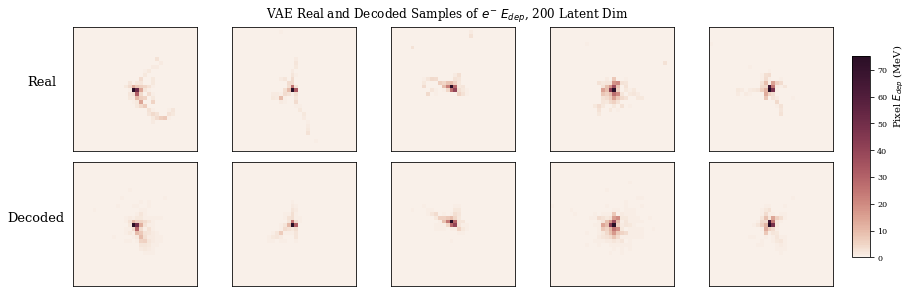

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


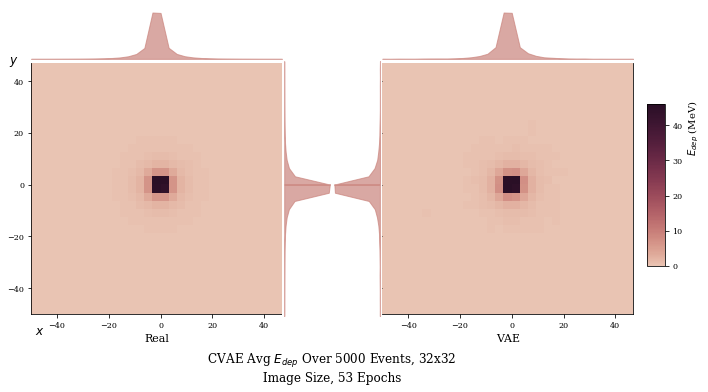

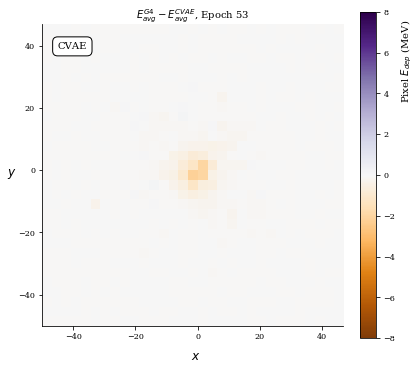

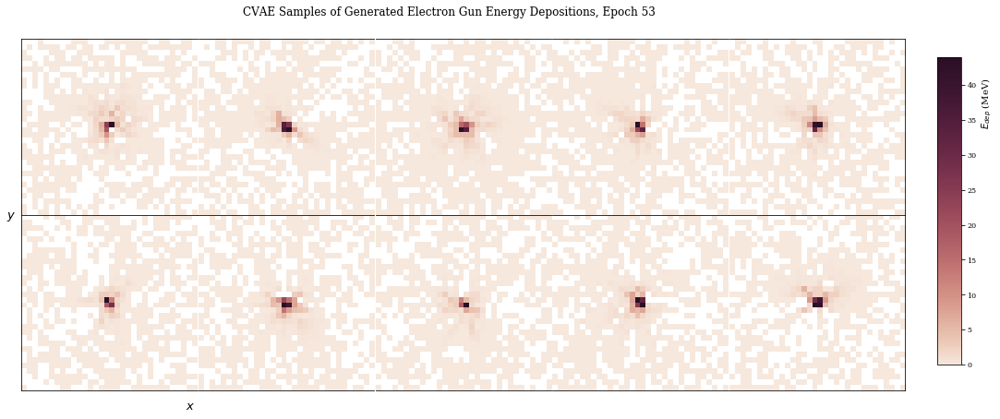

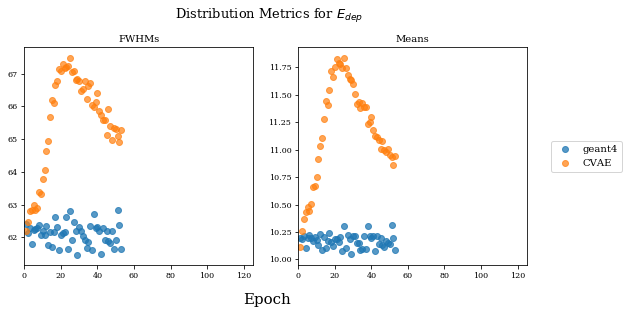

Train Epoch: 53 [0/15000 (0%)]	Loss: 175.750732
Train Epoch: 53 [6400/15000 (43%)]	Loss: 176.594452
Train Epoch: 53 [12800/15000 (85%)]	Loss: 173.296616
====> Epoch: 53 Average loss: 179.6006
====> Test set loss: 159.9070
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 54 [0/15000 (0%)]	Loss: 175.400330
Train Epoch: 54 [6400/15000 (43%)]	Loss: 177.306793
Train Epoch: 54 [12800/15000 (85%)]	Loss: 175.831116
====> Epoch: 54 Average loss: 179.6577
====> Test set loss: 162.4644
(5000, 32, 32)
(5000, 32, 32)


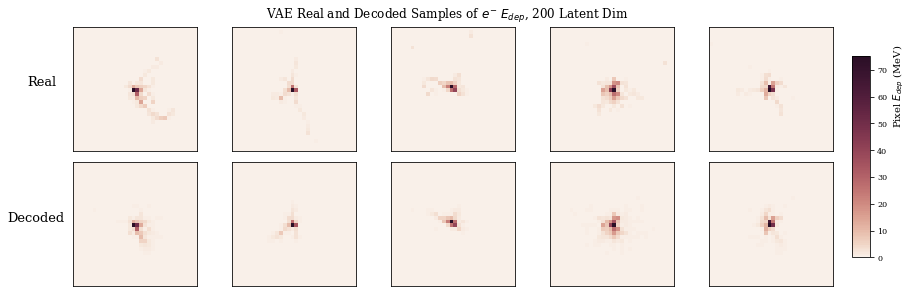

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


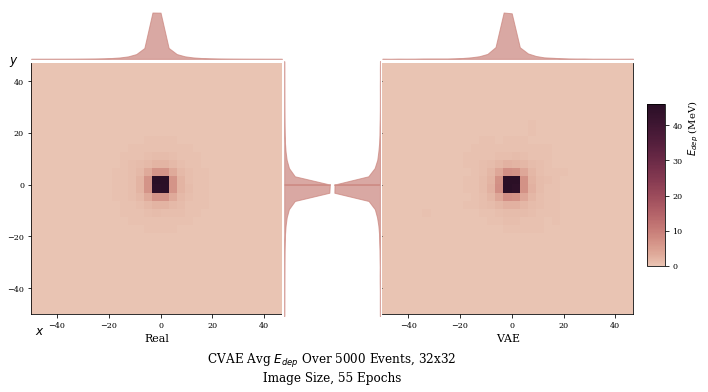

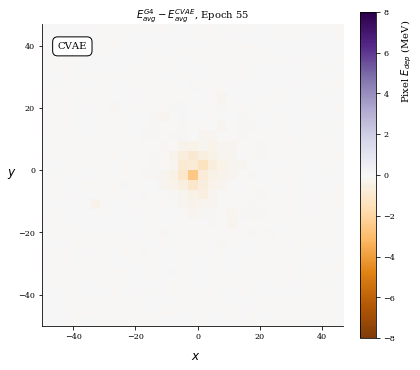

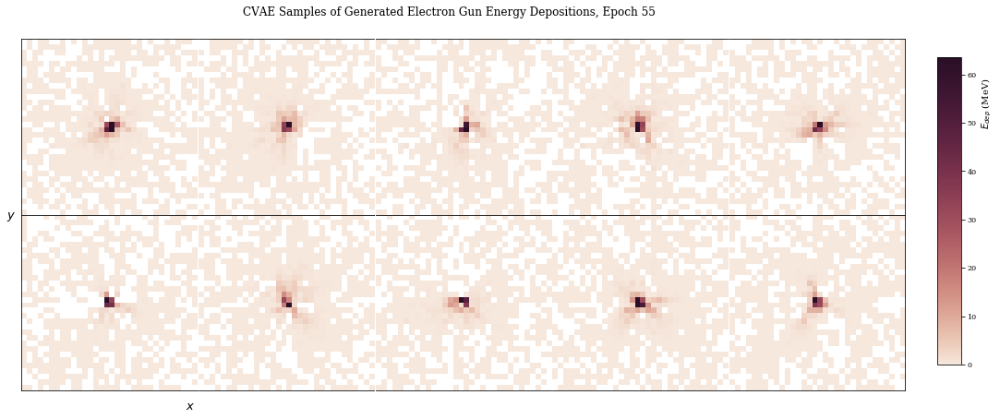

Train Epoch: 55 [0/15000 (0%)]	Loss: 174.796829
Train Epoch: 55 [6400/15000 (43%)]	Loss: 175.404587
Train Epoch: 55 [12800/15000 (85%)]	Loss: 178.785370
====> Epoch: 55 Average loss: 179.8279
====> Test set loss: 161.3349
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 56 [0/15000 (0%)]	Loss: 169.846298
Train Epoch: 56 [6400/15000 (43%)]	Loss: 174.107025
Train Epoch: 56 [12800/15000 (85%)]	Loss: 175.225128
====> Epoch: 56 Average loss: 178.7376
====> Test set loss: 161.2925
(5000, 32, 32)
(5000, 32, 32)


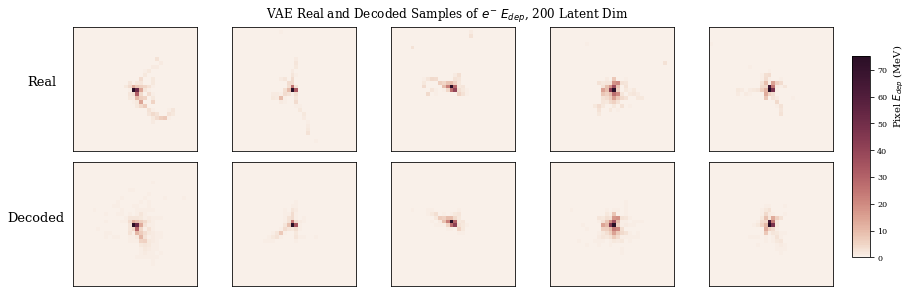

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


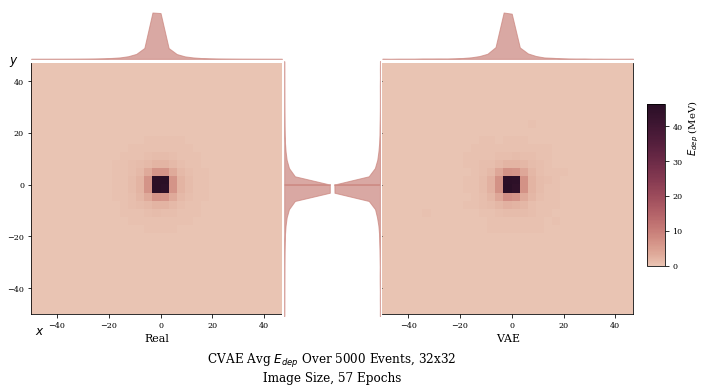

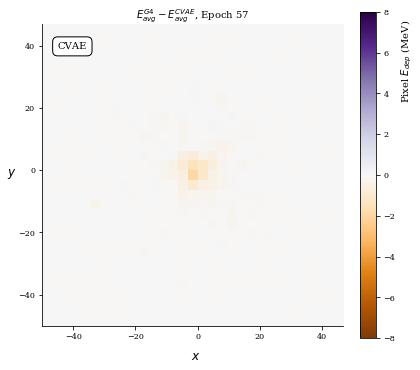

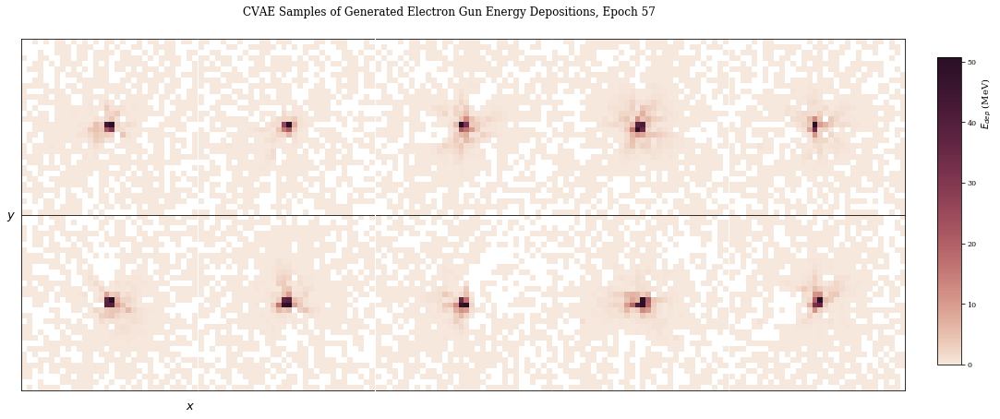

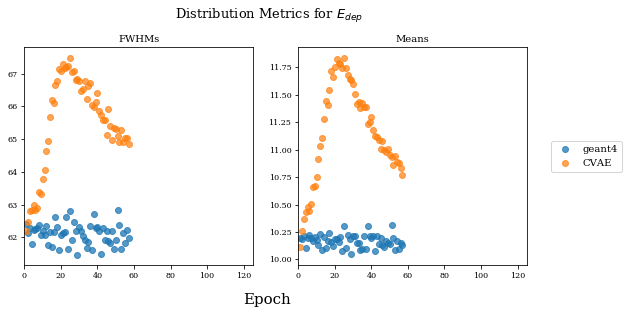

Train Epoch: 57 [0/15000 (0%)]	Loss: 175.182709
Train Epoch: 57 [6400/15000 (43%)]	Loss: 176.000809
Train Epoch: 57 [12800/15000 (85%)]	Loss: 174.499451
====> Epoch: 57 Average loss: 178.4640
====> Test set loss: 160.7357
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 58 [0/15000 (0%)]	Loss: 168.757645
Train Epoch: 58 [6400/15000 (43%)]	Loss: 172.187500
Train Epoch: 58 [12800/15000 (85%)]	Loss: 171.589874
====> Epoch: 58 Average loss: 177.7021
====> Test set loss: 161.5304
(5000, 32, 32)
(5000, 32, 32)


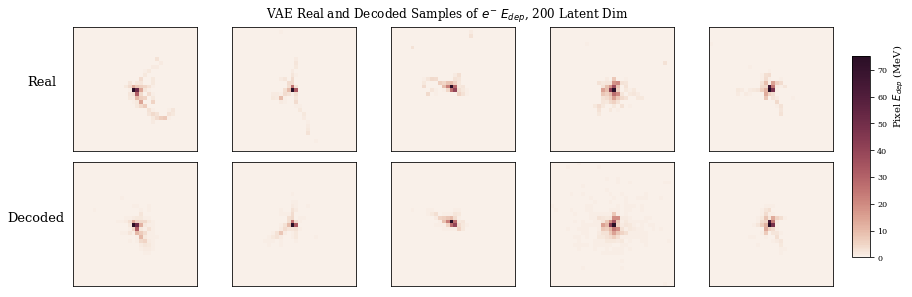

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


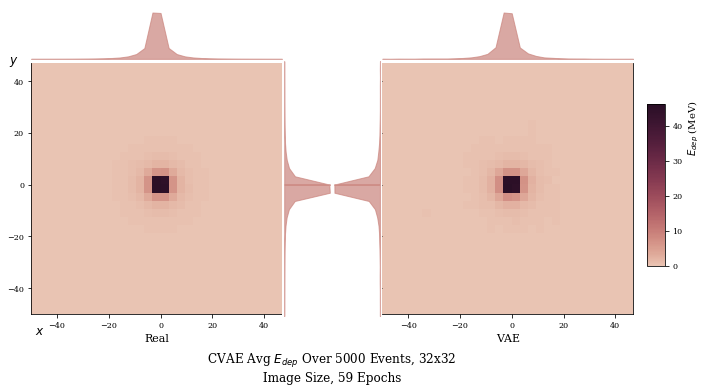

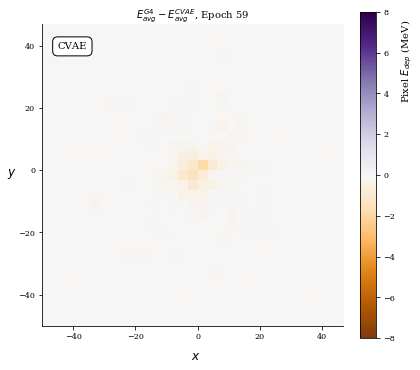

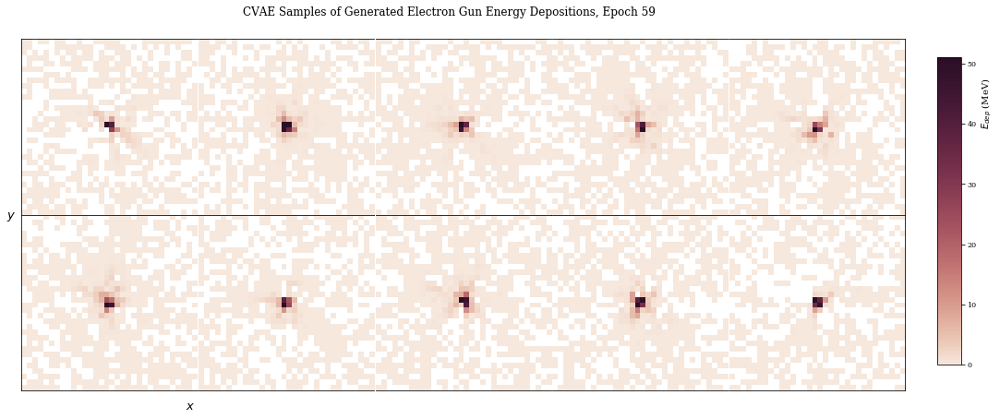

Train Epoch: 59 [0/15000 (0%)]	Loss: 172.593185
Train Epoch: 59 [6400/15000 (43%)]	Loss: 170.200348
Train Epoch: 59 [12800/15000 (85%)]	Loss: 174.931854
====> Epoch: 59 Average loss: 177.6114
====> Test set loss: 161.0663
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 60 [0/15000 (0%)]	Loss: 170.097534
Train Epoch: 60 [6400/15000 (43%)]	Loss: 170.651489
Train Epoch: 60 [12800/15000 (85%)]	Loss: 176.409790
====> Epoch: 60 Average loss: 177.0745
====> Test set loss: 158.7628
(5000, 32, 32)
(5000, 32, 32)


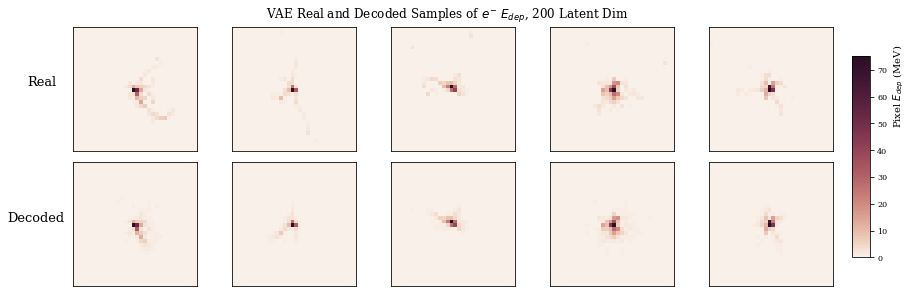

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


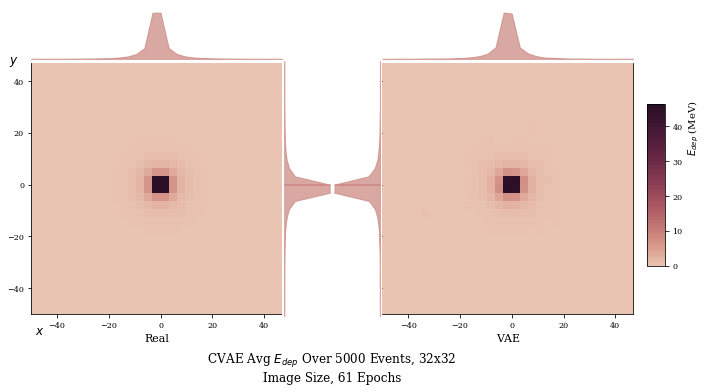

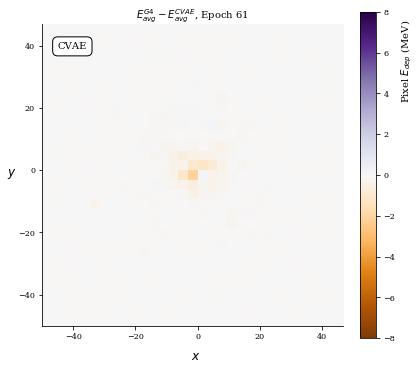

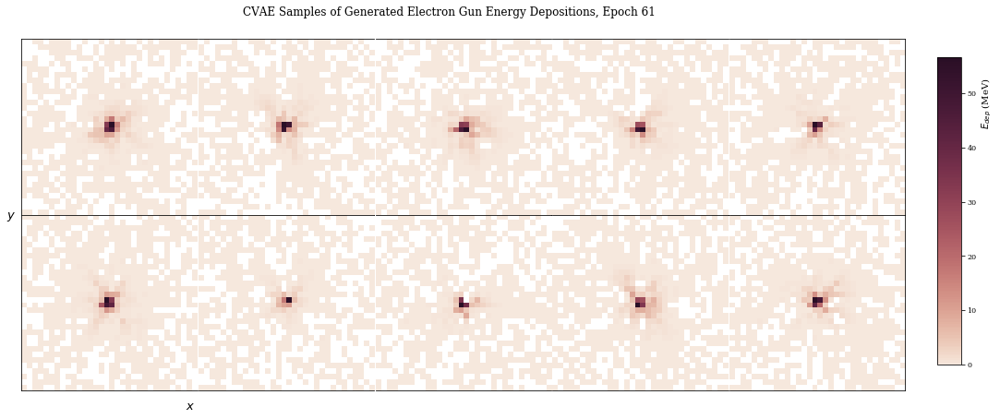

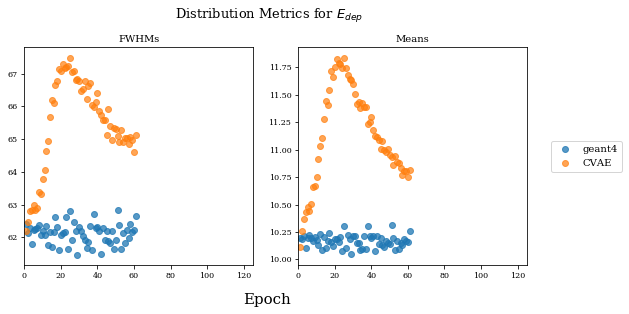

Train Epoch: 61 [0/15000 (0%)]	Loss: 170.184937
Train Epoch: 61 [6400/15000 (43%)]	Loss: 175.189056
Train Epoch: 61 [12800/15000 (85%)]	Loss: 174.165375
====> Epoch: 61 Average loss: 177.2158
====> Test set loss: 159.2398
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 62 [0/15000 (0%)]	Loss: 173.382111
Train Epoch: 62 [6400/15000 (43%)]	Loss: 175.963409
Train Epoch: 62 [12800/15000 (85%)]	Loss: 176.387573
====> Epoch: 62 Average loss: 177.0425
====> Test set loss: 160.7954
(5000, 32, 32)
(5000, 32, 32)


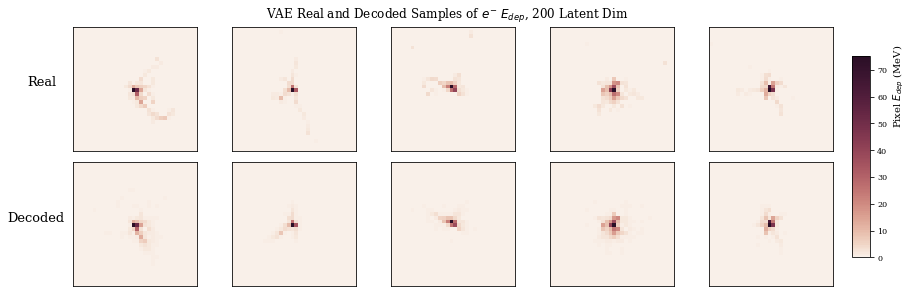

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


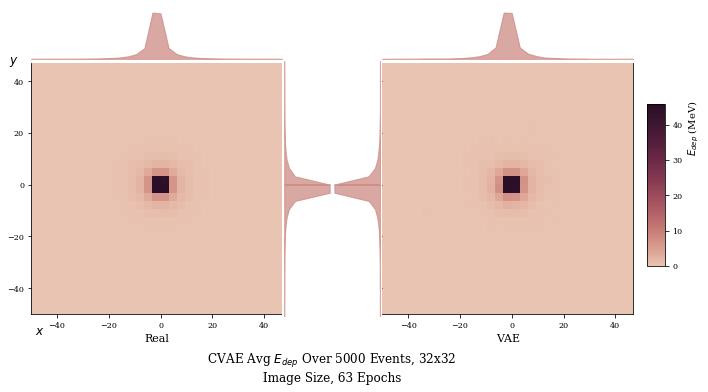

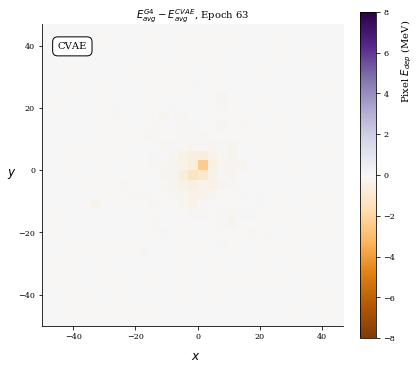

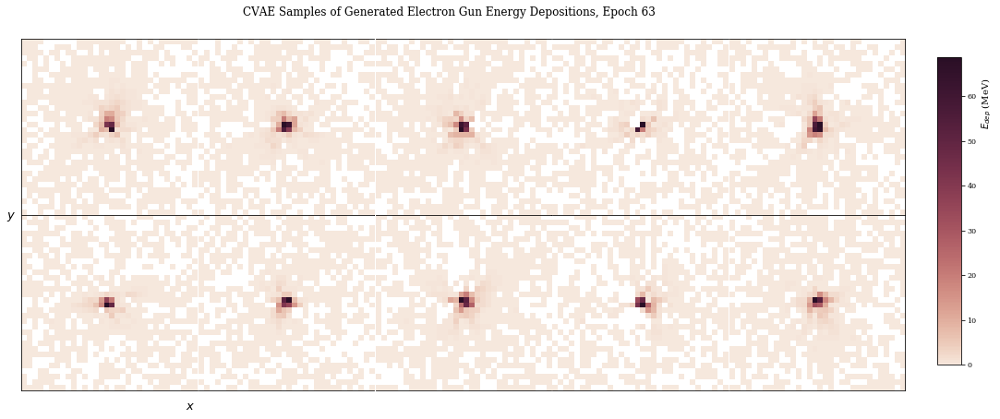

Train Epoch: 63 [0/15000 (0%)]	Loss: 171.987701
Train Epoch: 63 [6400/15000 (43%)]	Loss: 169.714905
Train Epoch: 63 [12800/15000 (85%)]	Loss: 172.014969
====> Epoch: 63 Average loss: 176.7279
====> Test set loss: 158.5751
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 64 [0/15000 (0%)]	Loss: 168.794067
Train Epoch: 64 [6400/15000 (43%)]	Loss: 166.649475
Train Epoch: 64 [12800/15000 (85%)]	Loss: 171.841980
====> Epoch: 64 Average loss: 176.1482
====> Test set loss: 159.1104
(5000, 32, 32)
(5000, 32, 32)


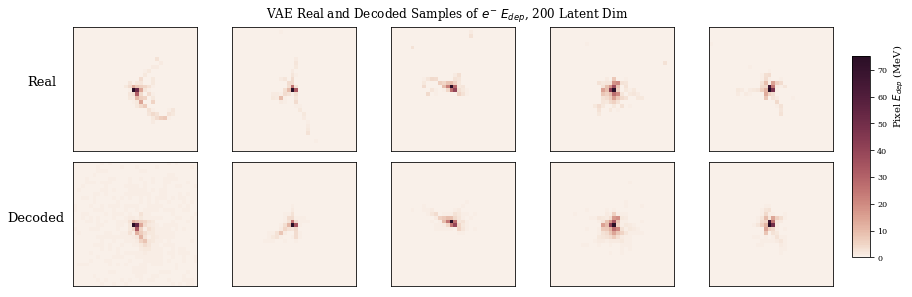

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


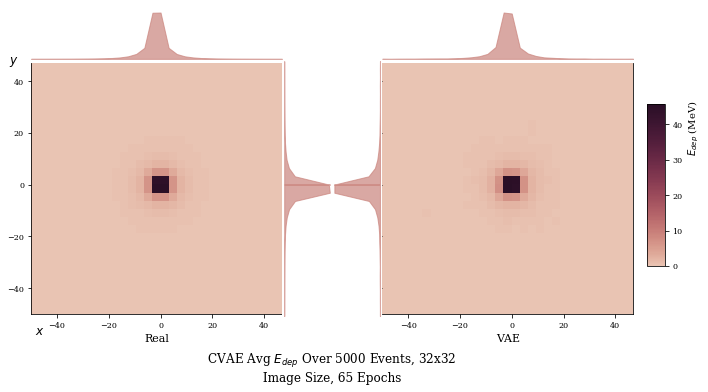

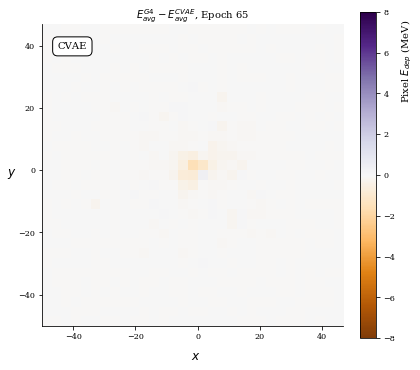

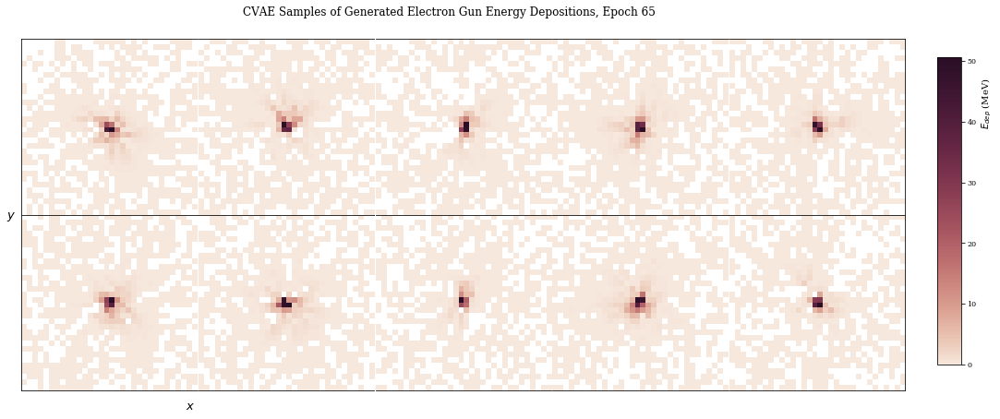

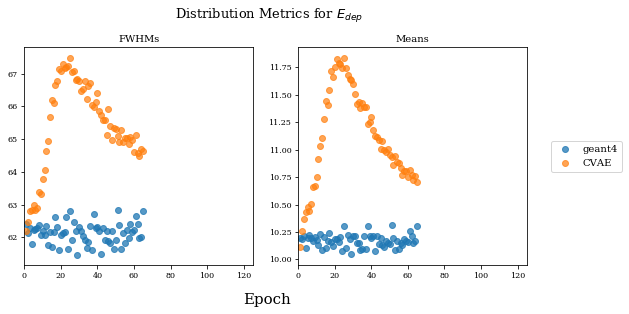

Train Epoch: 65 [0/15000 (0%)]	Loss: 168.599548
Train Epoch: 65 [6400/15000 (43%)]	Loss: 169.656464
Train Epoch: 65 [12800/15000 (85%)]	Loss: 176.653931
====> Epoch: 65 Average loss: 176.2841
====> Test set loss: 159.7431
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 66 [0/15000 (0%)]	Loss: 169.629089
Train Epoch: 66 [6400/15000 (43%)]	Loss: 174.058167
Train Epoch: 66 [12800/15000 (85%)]	Loss: 172.978485
====> Epoch: 66 Average loss: 175.3249
====> Test set loss: 160.0672
(5000, 32, 32)
(5000, 32, 32)


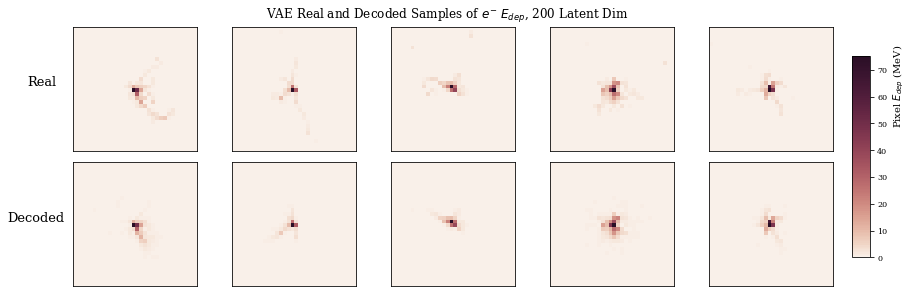

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


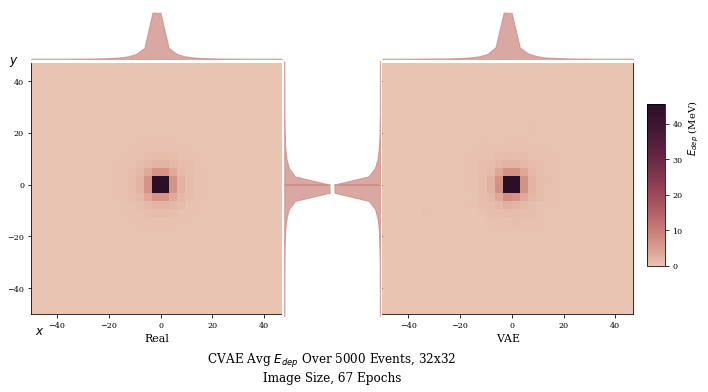

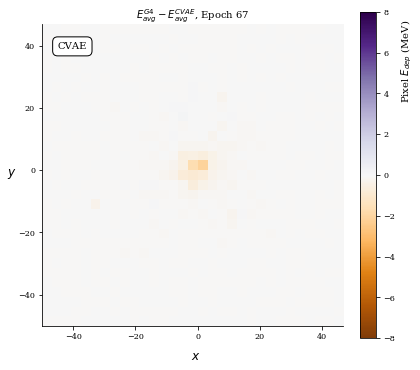

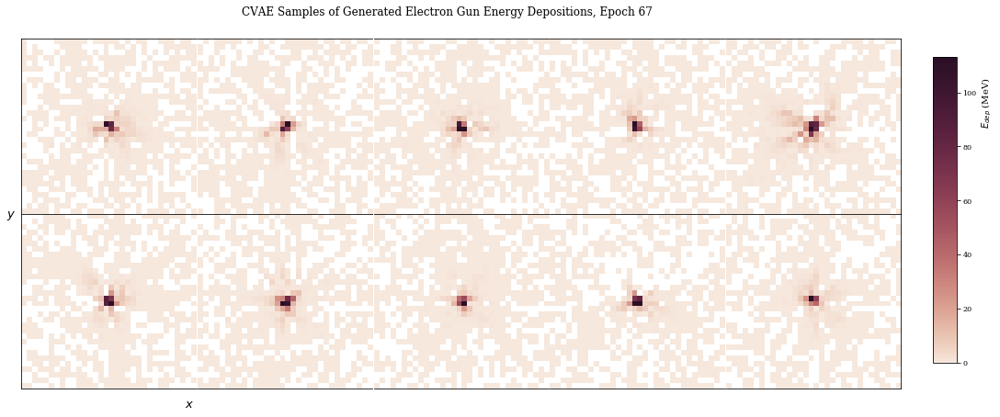

Train Epoch: 67 [0/15000 (0%)]	Loss: 172.295441
Train Epoch: 67 [6400/15000 (43%)]	Loss: 174.451080
Train Epoch: 67 [12800/15000 (85%)]	Loss: 170.694977
====> Epoch: 67 Average loss: 175.6880
====> Test set loss: 158.6686
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 68 [0/15000 (0%)]	Loss: 173.098892
Train Epoch: 68 [6400/15000 (43%)]	Loss: 172.899155
Train Epoch: 68 [12800/15000 (85%)]	Loss: 172.623825
====> Epoch: 68 Average loss: 175.2207
====> Test set loss: 158.7015
(5000, 32, 32)
(5000, 32, 32)


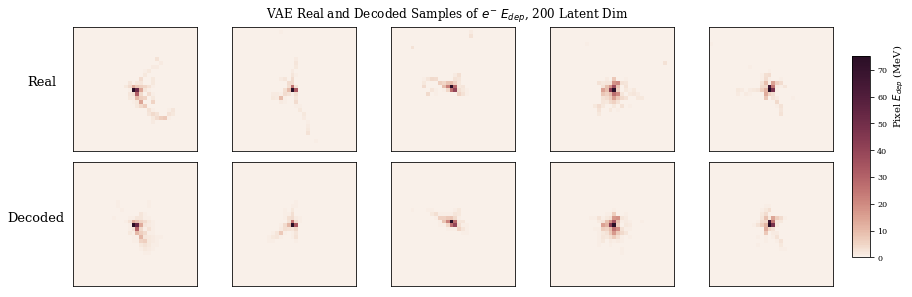

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


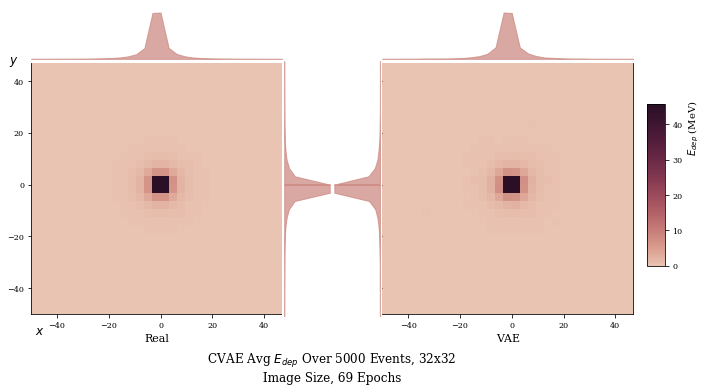

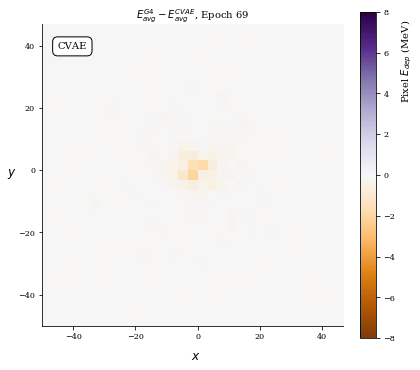

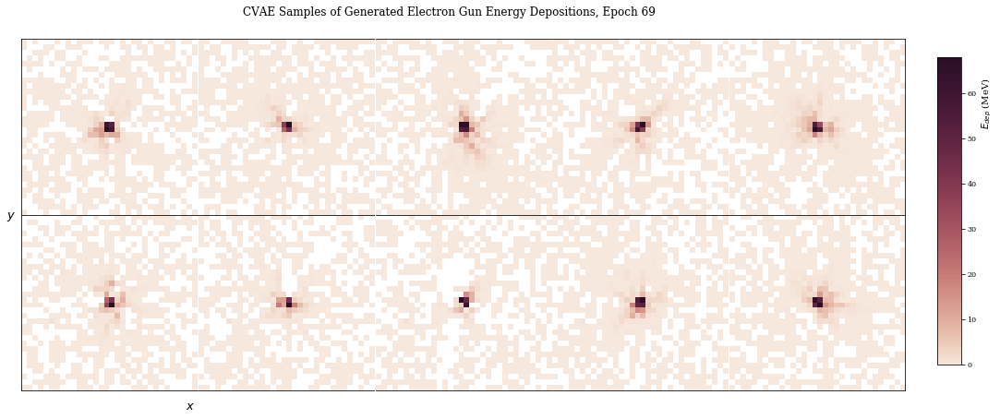

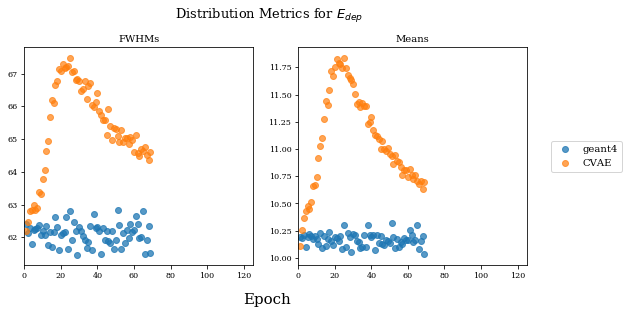

Train Epoch: 69 [0/15000 (0%)]	Loss: 168.869263
Train Epoch: 69 [6400/15000 (43%)]	Loss: 173.943634
Train Epoch: 69 [12800/15000 (85%)]	Loss: 171.521774
====> Epoch: 69 Average loss: 174.5982
====> Test set loss: 157.6575
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 70 [0/15000 (0%)]	Loss: 168.520462
Train Epoch: 70 [6400/15000 (43%)]	Loss: 173.693237
Train Epoch: 70 [12800/15000 (85%)]	Loss: 173.963989
====> Epoch: 70 Average loss: 174.6203
====> Test set loss: 157.2379
(5000, 32, 32)
(5000, 32, 32)


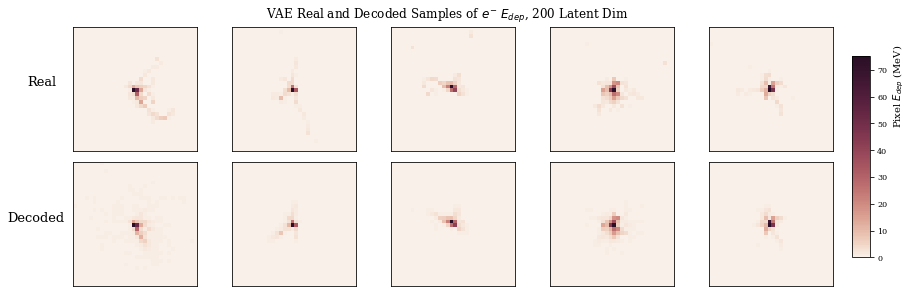

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


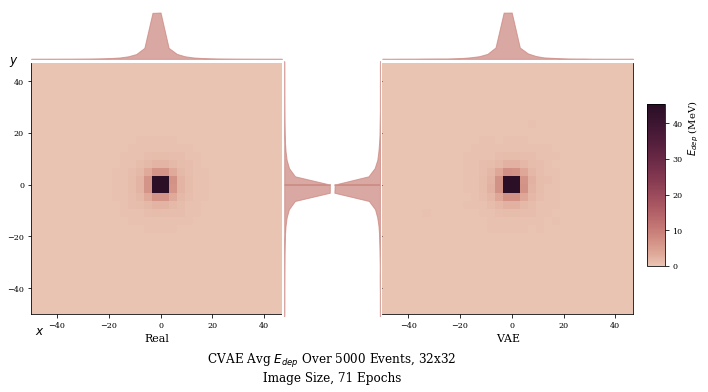

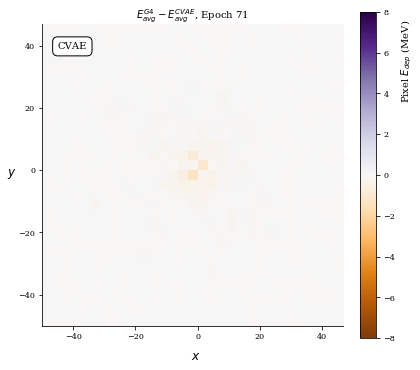

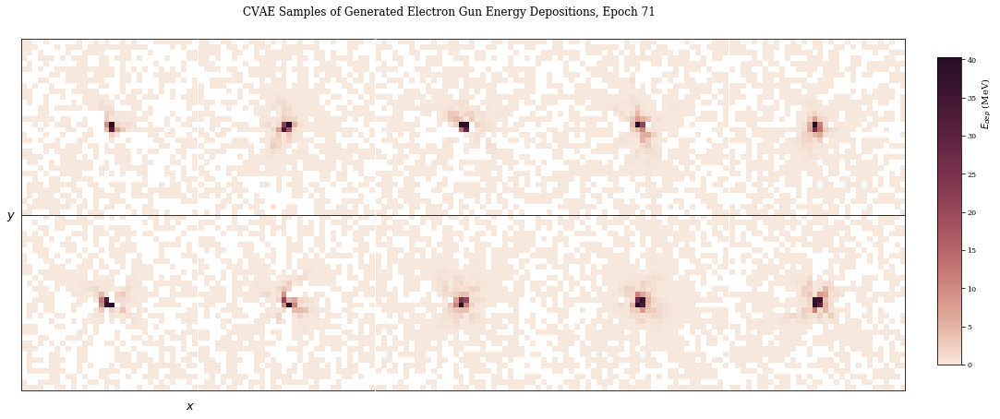

Train Epoch: 71 [0/15000 (0%)]	Loss: 167.002090
Train Epoch: 71 [6400/15000 (43%)]	Loss: 170.027039
Train Epoch: 71 [12800/15000 (85%)]	Loss: 168.649994
====> Epoch: 71 Average loss: 174.3478
====> Test set loss: 157.1980
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 72 [0/15000 (0%)]	Loss: 167.834198
Train Epoch: 72 [6400/15000 (43%)]	Loss: 167.460342
Train Epoch: 72 [12800/15000 (85%)]	Loss: 169.866211
====> Epoch: 72 Average loss: 173.7404
====> Test set loss: 157.9560
(5000, 32, 32)
(5000, 32, 32)


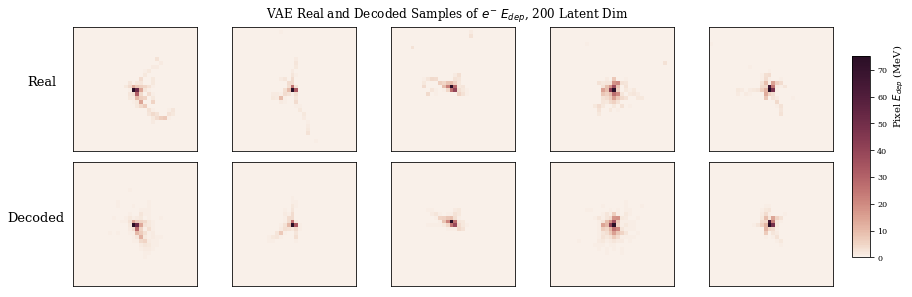

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


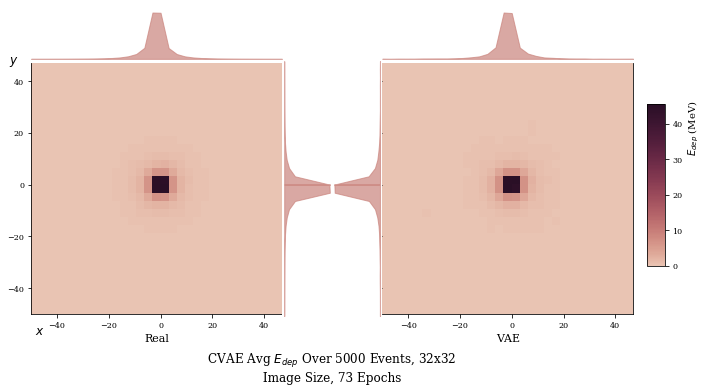

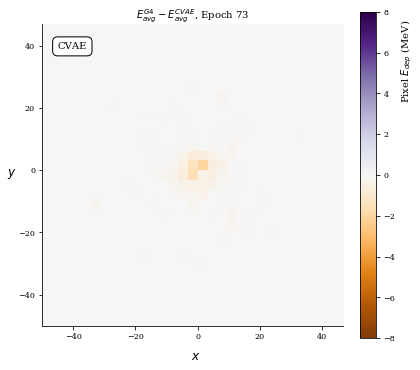

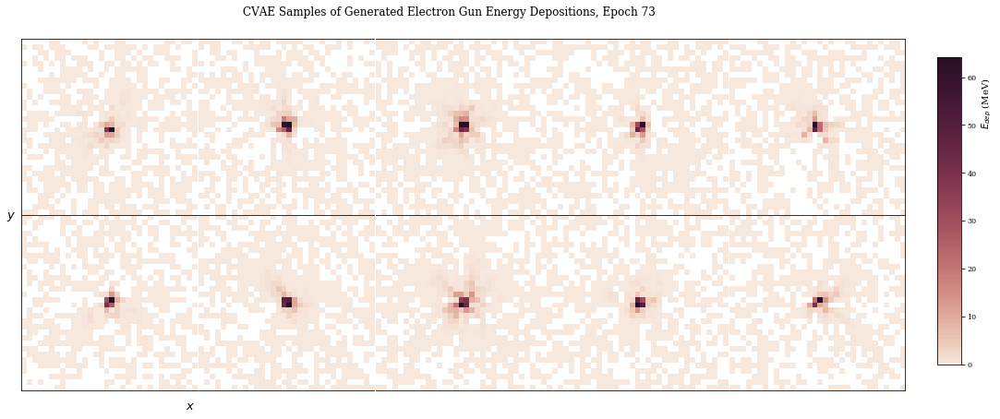

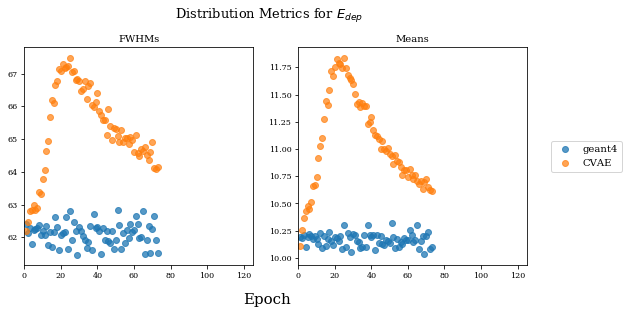

Train Epoch: 73 [0/15000 (0%)]	Loss: 166.330505
Train Epoch: 73 [6400/15000 (43%)]	Loss: 169.611267
Train Epoch: 73 [12800/15000 (85%)]	Loss: 169.579193
====> Epoch: 73 Average loss: 173.6112
====> Test set loss: 156.9034
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 74 [0/15000 (0%)]	Loss: 166.135406
Train Epoch: 74 [6400/15000 (43%)]	Loss: 170.925247
Train Epoch: 74 [12800/15000 (85%)]	Loss: 166.174500
====> Epoch: 74 Average loss: 174.0840
====> Test set loss: 157.6876
(5000, 32, 32)
(5000, 32, 32)


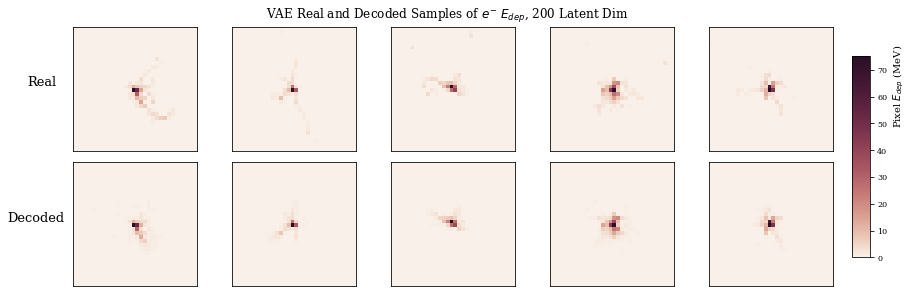

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


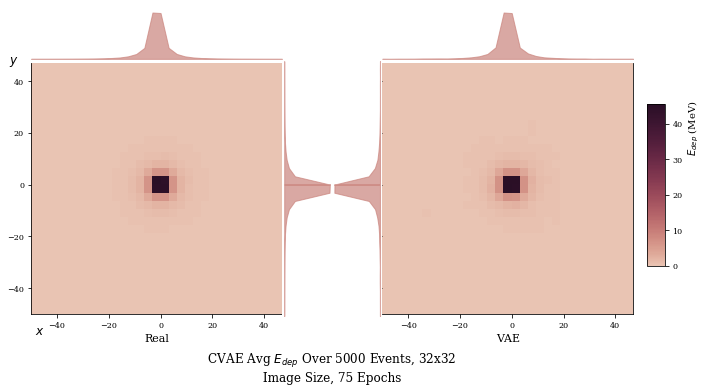

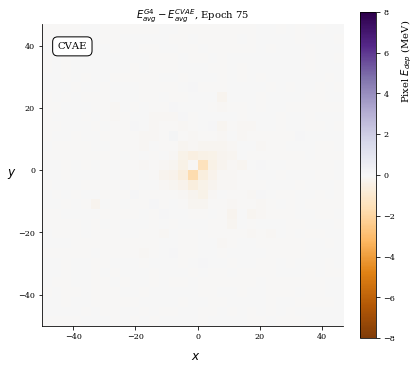

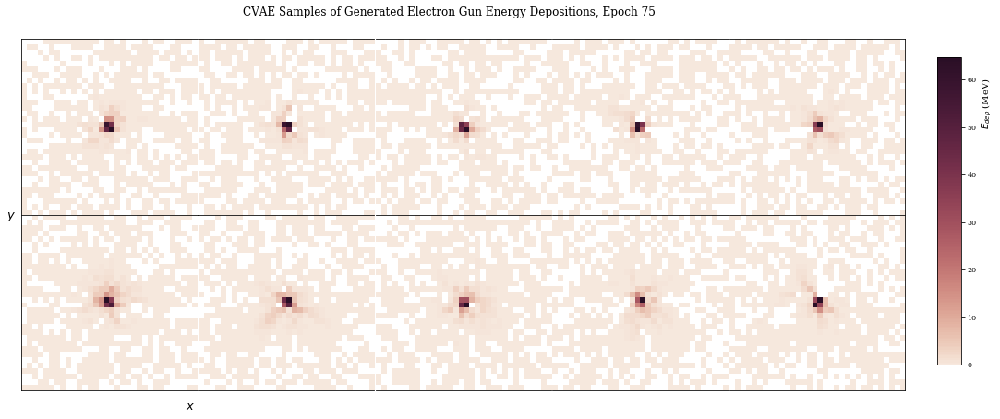

Train Epoch: 75 [0/15000 (0%)]	Loss: 167.834076
Train Epoch: 75 [6400/15000 (43%)]	Loss: 172.293121
Train Epoch: 75 [12800/15000 (85%)]	Loss: 174.129517
====> Epoch: 75 Average loss: 174.0325
====> Test set loss: 158.6643
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 76 [0/15000 (0%)]	Loss: 169.855515
Train Epoch: 76 [6400/15000 (43%)]	Loss: 174.805511
Train Epoch: 76 [12800/15000 (85%)]	Loss: 166.587769
====> Epoch: 76 Average loss: 173.8464
====> Test set loss: 156.9757
(5000, 32, 32)
(5000, 32, 32)


Exception NameError: "global name 'FileNotFoundError' is not defined" in <bound method _DataLoaderIter.__del__ of <torch.utils.data.dataloader._DataLoaderIter object at 0x7f4fc80cf590>> ignored


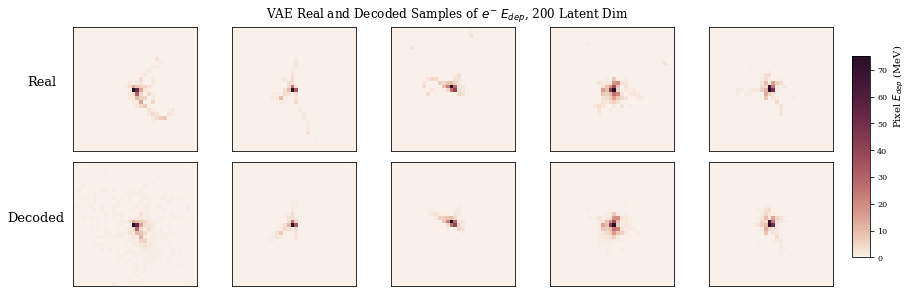

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


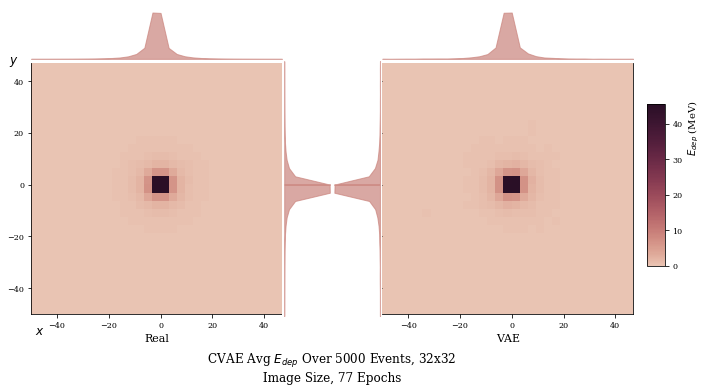

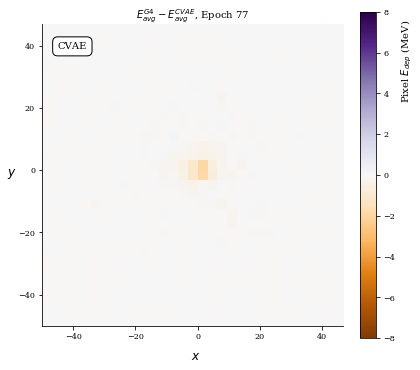

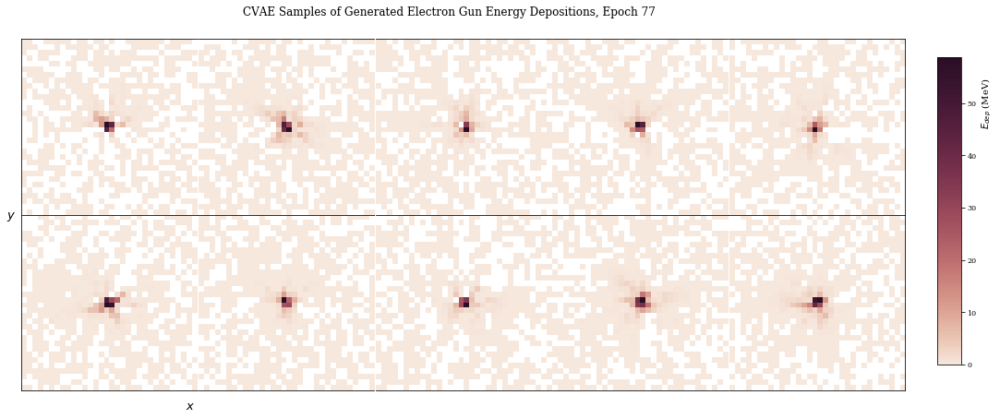

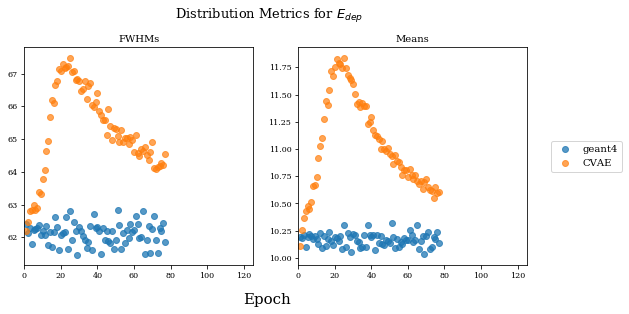

Train Epoch: 77 [0/15000 (0%)]	Loss: 169.037872
Train Epoch: 77 [6400/15000 (43%)]	Loss: 170.277100
Train Epoch: 77 [12800/15000 (85%)]	Loss: 149362738987008.000000
====> Epoch: 77 Average loss: 3623421817562328609244575694848.0000
====> Test set loss: 10426800040352856669890161682677760.0000
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 78 [0/15000 (0%)]	Loss: 12398645018099712.000000
Train Epoch: 78 [6400/15000 (43%)]	Loss: 159204920839825784832.000000
Train Epoch: 78 [12800/15000 (85%)]	Loss: nan
====> Epoch: 78 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


/home/chris/anaconda2/envs/pytorch04/lib/python2.7/site-packages/matplotlib/image.py:405: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
/home/chris/anaconda2/envs/pytorch04/lib/python2.7/site-packages/matplotlib/image.py:406: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
/home/chris/anaconda2/envs/pytorch04/lib/python2.7/site-packages/matplotlib/image.py:412: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/home/chris/anaconda2/envs/pytorch04/lib/python2.7/site-packages/matplotlib/image.py:417: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
/home/chris/anaconda2/envs/pytorch04/lib/python2.7/site-packages/matplotlib/colors.py:916: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
/home/chris/anaconda2/envs/pytorch04/lib/python2.7/site-packages/numpy/ma/core.py:710: UserWarning

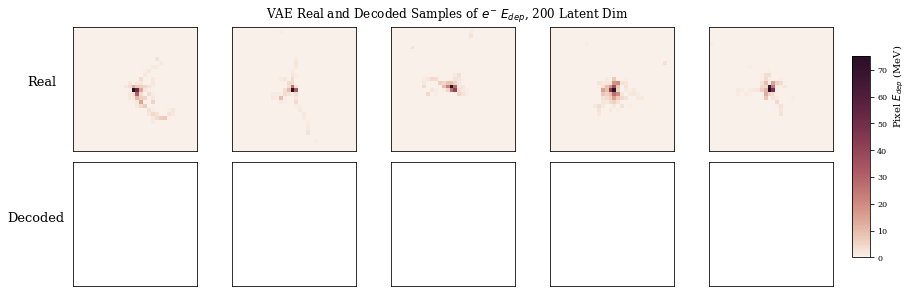

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


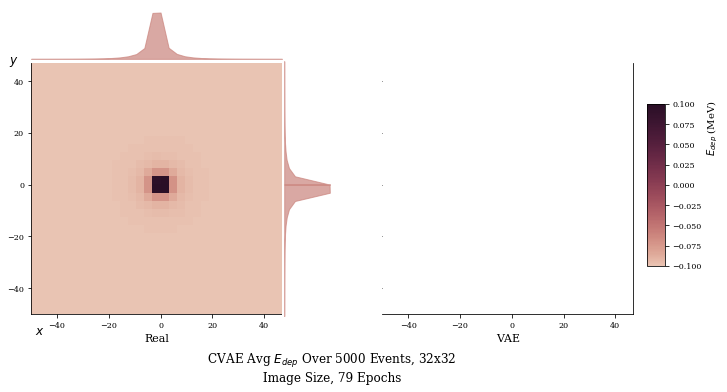

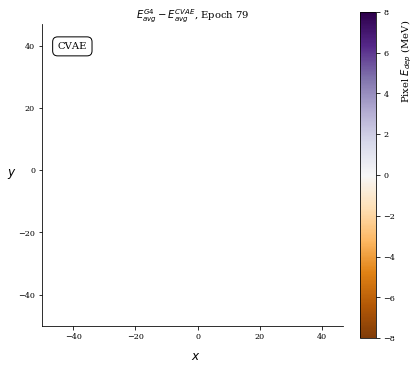

VAE_PCA_plots.py:373: RuntimeWarning: invalid value encountered in less_equal
  image_array[image_array <= 0] = np.nan


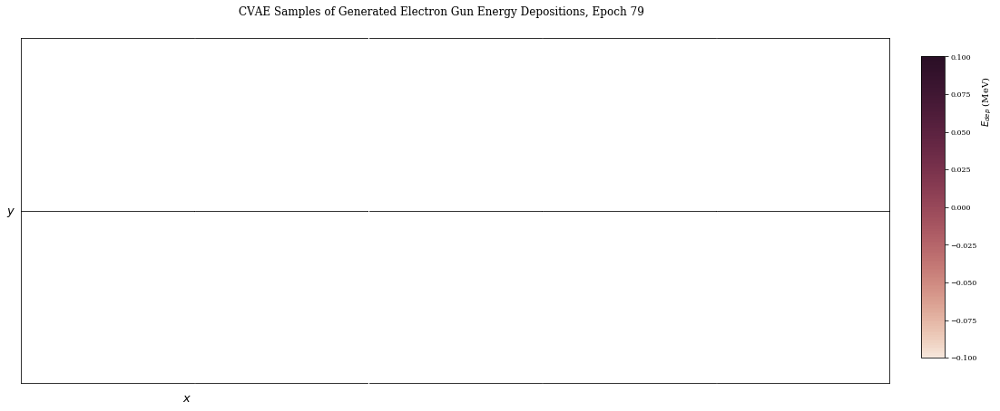

Train Epoch: 79 [0/15000 (0%)]	Loss: nan
Train Epoch: 79 [6400/15000 (43%)]	Loss: nan
Train Epoch: 79 [12800/15000 (85%)]	Loss: nan
====> Epoch: 79 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 80 [0/15000 (0%)]	Loss: nan
Train Epoch: 80 [6400/15000 (43%)]	Loss: nan
Train Epoch: 80 [12800/15000 (85%)]	Loss: nan
====> Epoch: 80 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


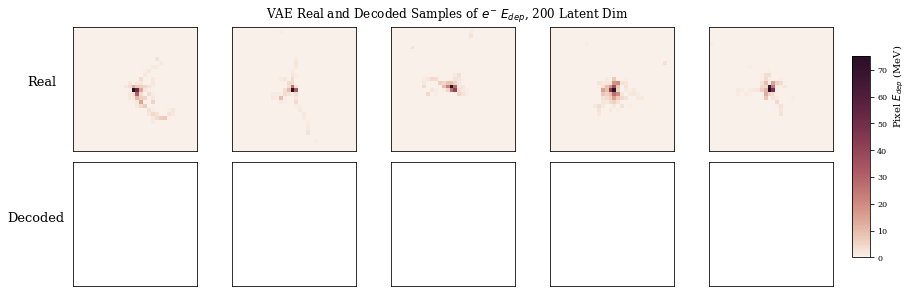

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


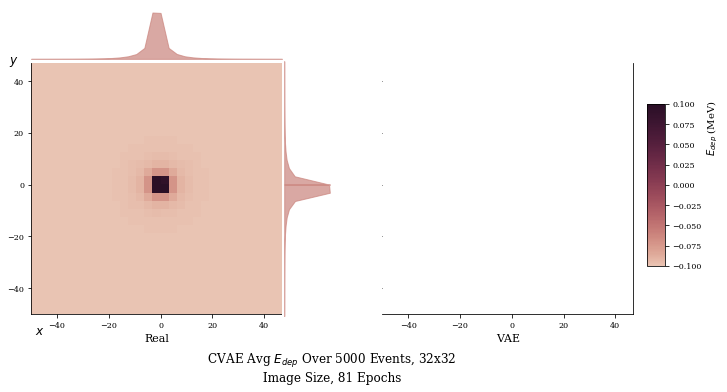

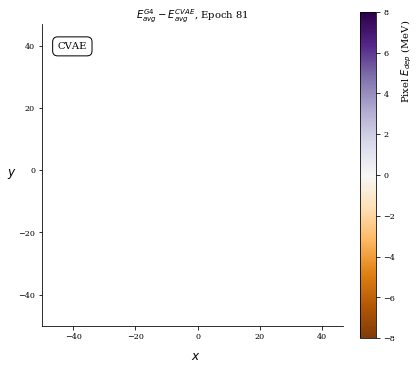

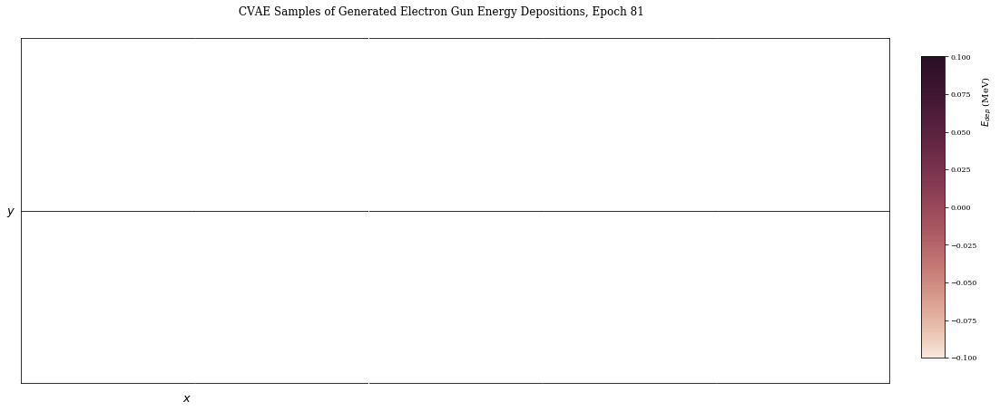

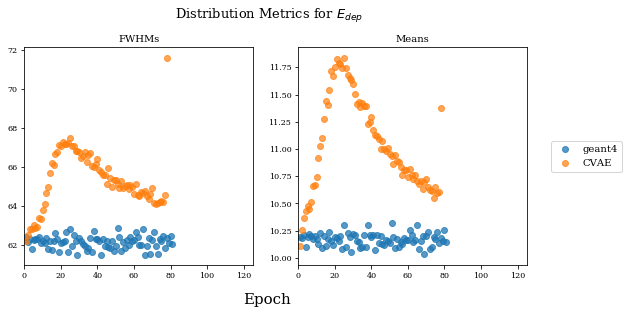

Train Epoch: 81 [0/15000 (0%)]	Loss: nan
Train Epoch: 81 [6400/15000 (43%)]	Loss: nan
Train Epoch: 81 [12800/15000 (85%)]	Loss: nan
====> Epoch: 81 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 82 [0/15000 (0%)]	Loss: nan
Train Epoch: 82 [6400/15000 (43%)]	Loss: nan
Train Epoch: 82 [12800/15000 (85%)]	Loss: nan
====> Epoch: 82 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


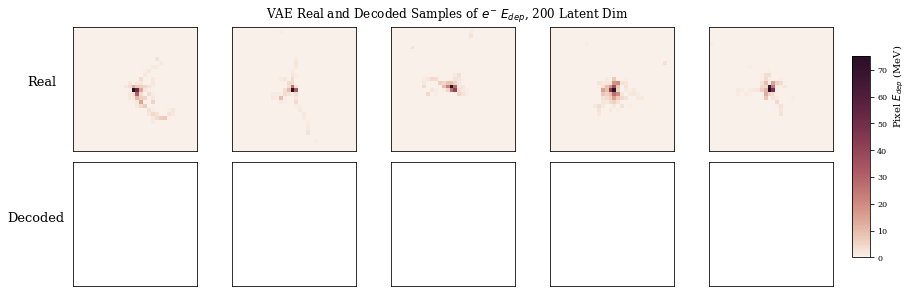

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


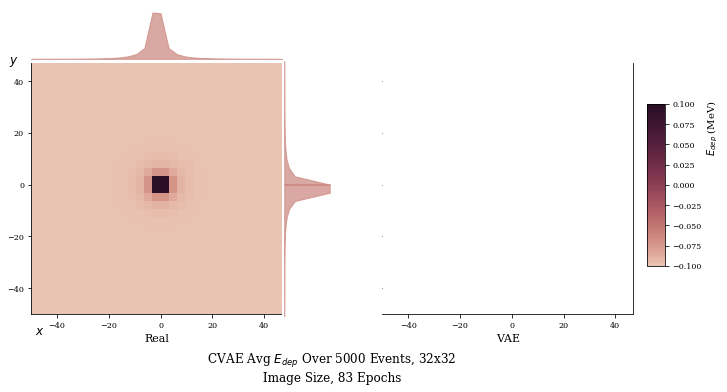

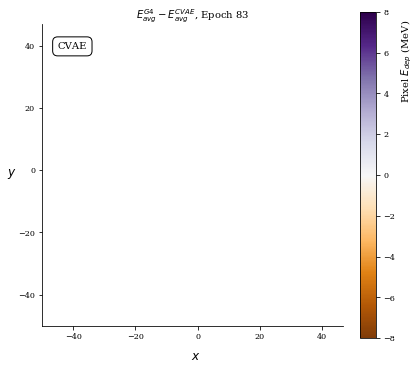

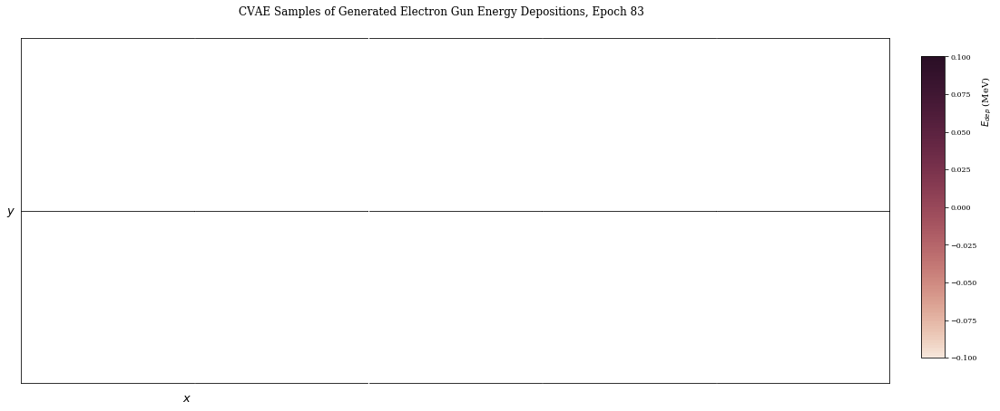

Train Epoch: 83 [0/15000 (0%)]	Loss: nan
Train Epoch: 83 [6400/15000 (43%)]	Loss: nan
Train Epoch: 83 [12800/15000 (85%)]	Loss: nan
====> Epoch: 83 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 84 [0/15000 (0%)]	Loss: nan
Train Epoch: 84 [6400/15000 (43%)]	Loss: nan
Train Epoch: 84 [12800/15000 (85%)]	Loss: nan
====> Epoch: 84 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


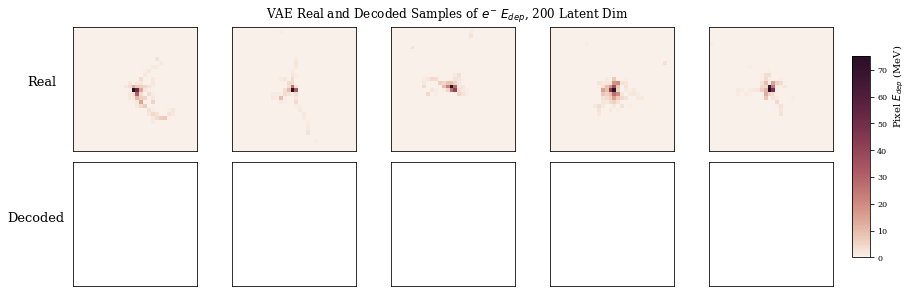

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


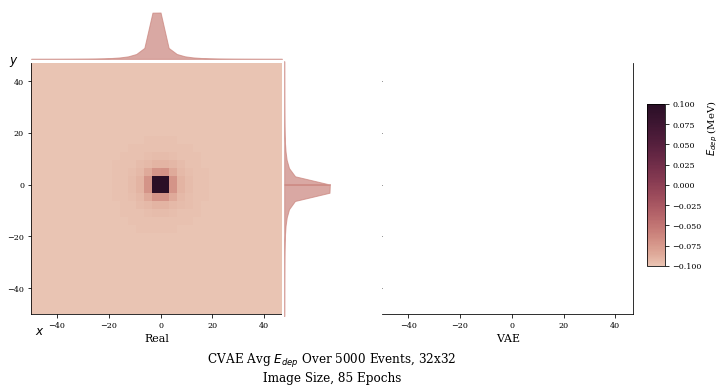

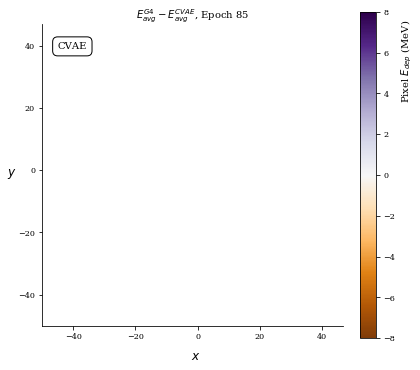

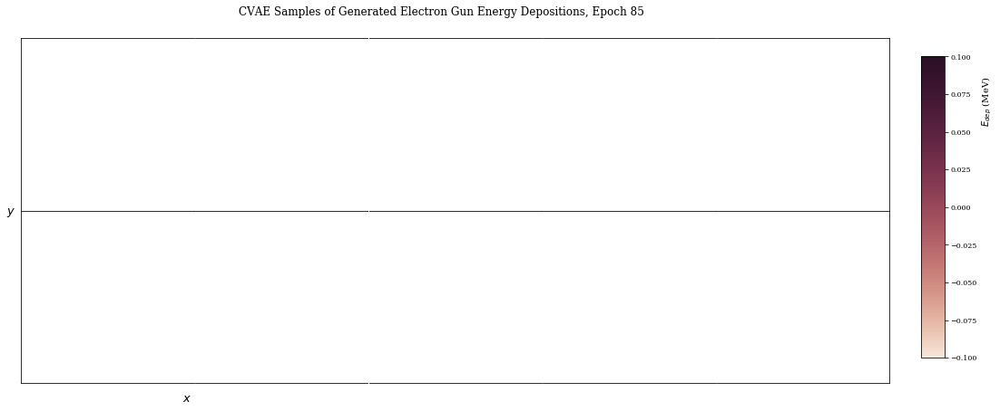

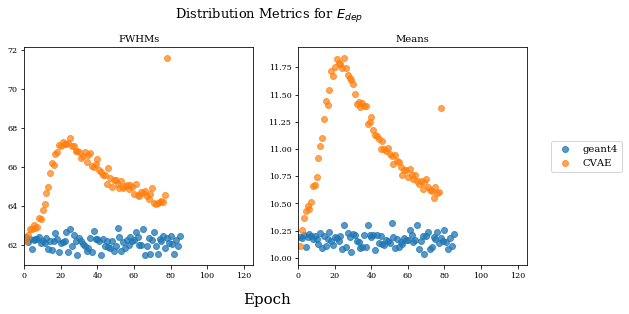

Train Epoch: 85 [0/15000 (0%)]	Loss: nan
Train Epoch: 85 [6400/15000 (43%)]	Loss: nan
Train Epoch: 85 [12800/15000 (85%)]	Loss: nan
====> Epoch: 85 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 86 [0/15000 (0%)]	Loss: nan
Train Epoch: 86 [6400/15000 (43%)]	Loss: nan
Train Epoch: 86 [12800/15000 (85%)]	Loss: nan
====> Epoch: 86 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


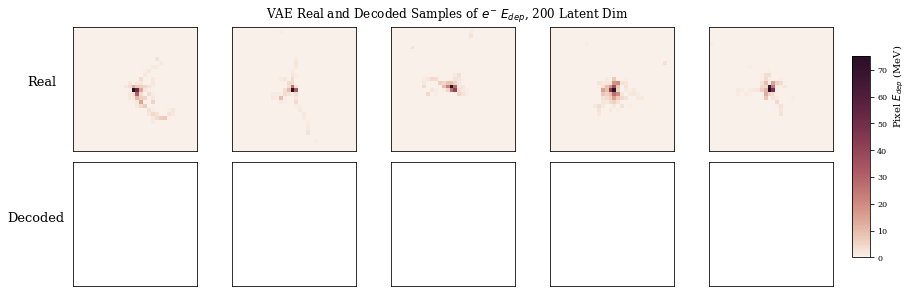

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


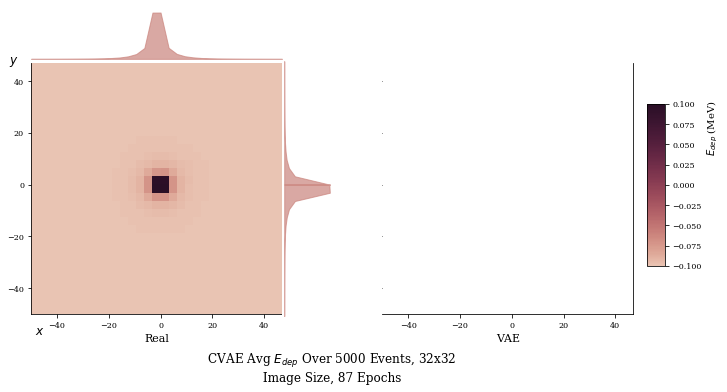

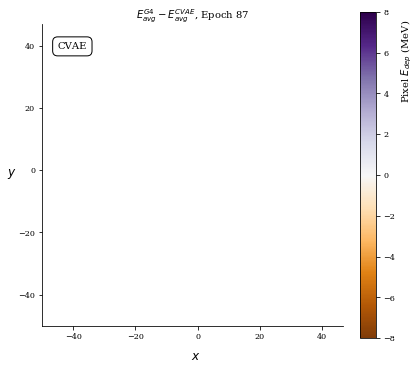

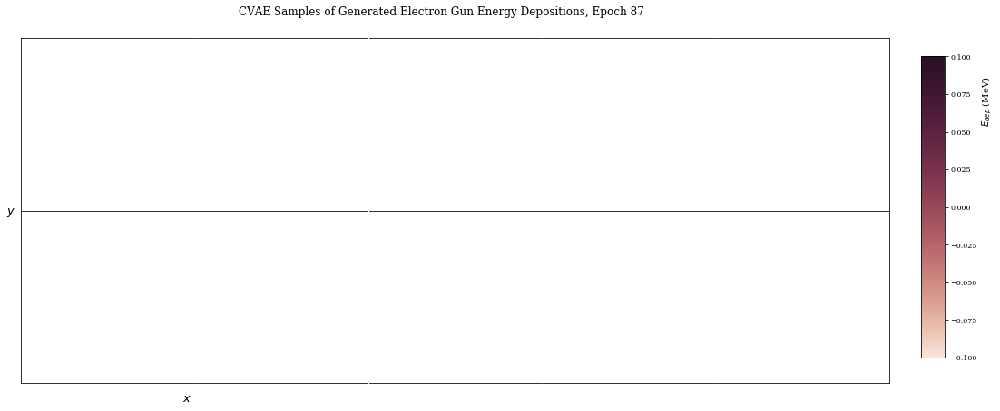

Train Epoch: 87 [0/15000 (0%)]	Loss: nan
Train Epoch: 87 [6400/15000 (43%)]	Loss: nan
Train Epoch: 87 [12800/15000 (85%)]	Loss: nan
====> Epoch: 87 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 88 [0/15000 (0%)]	Loss: nan
Train Epoch: 88 [6400/15000 (43%)]	Loss: nan
Train Epoch: 88 [12800/15000 (85%)]	Loss: nan
====> Epoch: 88 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


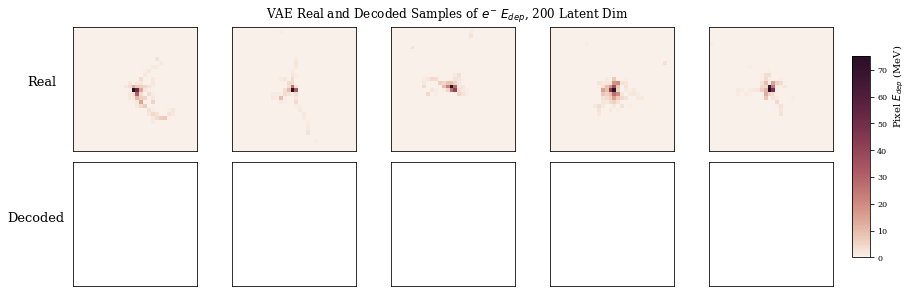

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


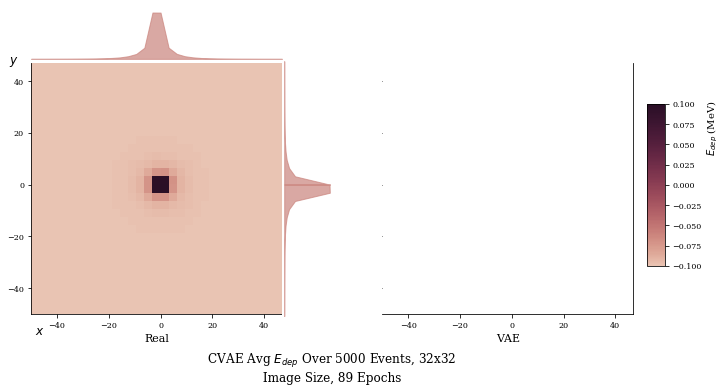

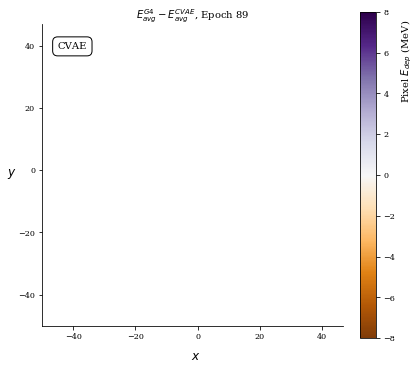

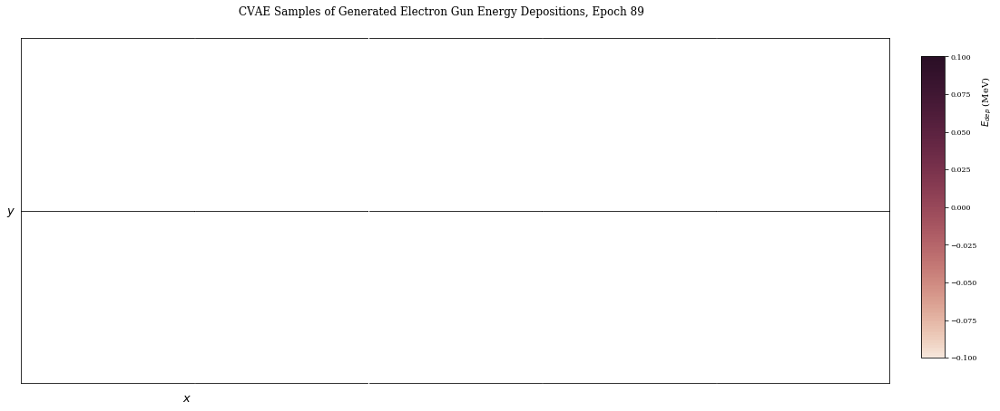

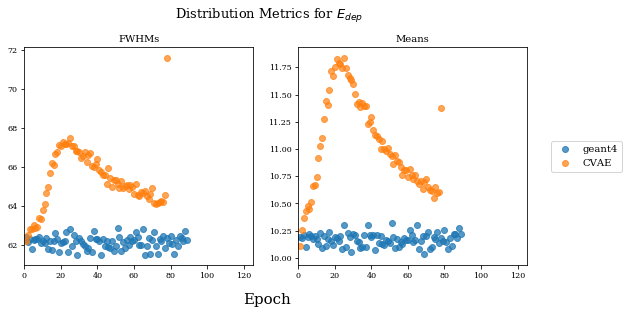

Train Epoch: 89 [0/15000 (0%)]	Loss: nan
Train Epoch: 89 [6400/15000 (43%)]	Loss: nan
Train Epoch: 89 [12800/15000 (85%)]	Loss: nan
====> Epoch: 89 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 90 [0/15000 (0%)]	Loss: nan
Train Epoch: 90 [6400/15000 (43%)]	Loss: nan
Train Epoch: 90 [12800/15000 (85%)]	Loss: nan
====> Epoch: 90 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


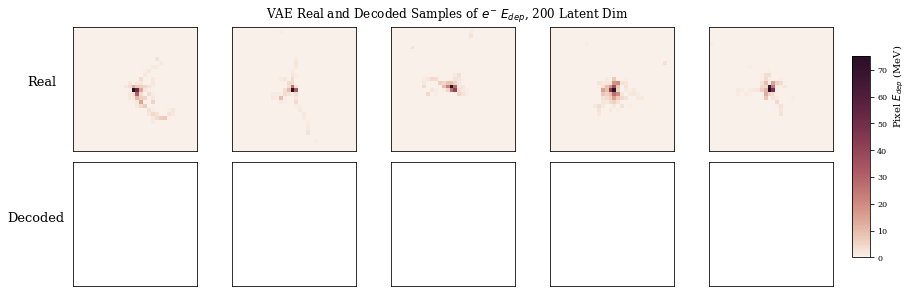

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


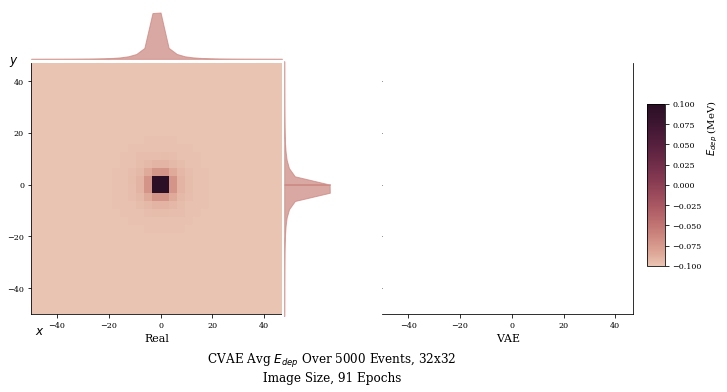

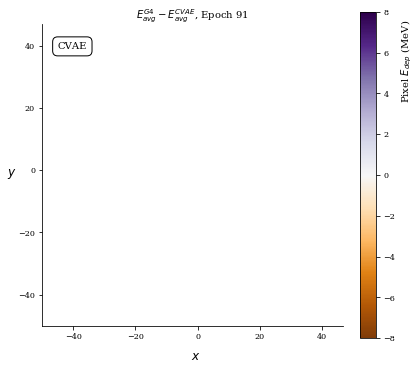

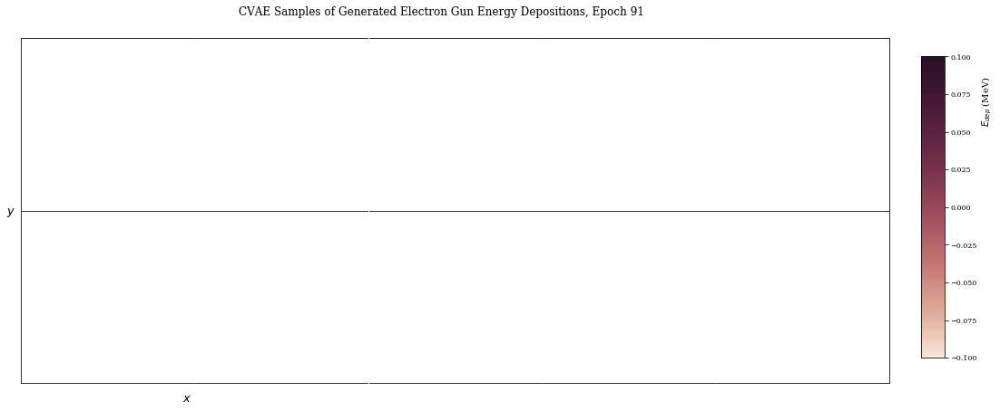

Train Epoch: 91 [0/15000 (0%)]	Loss: nan
Train Epoch: 91 [6400/15000 (43%)]	Loss: nan
Train Epoch: 91 [12800/15000 (85%)]	Loss: nan
====> Epoch: 91 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 92 [0/15000 (0%)]	Loss: nan
Train Epoch: 92 [6400/15000 (43%)]	Loss: nan
Train Epoch: 92 [12800/15000 (85%)]	Loss: nan
====> Epoch: 92 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


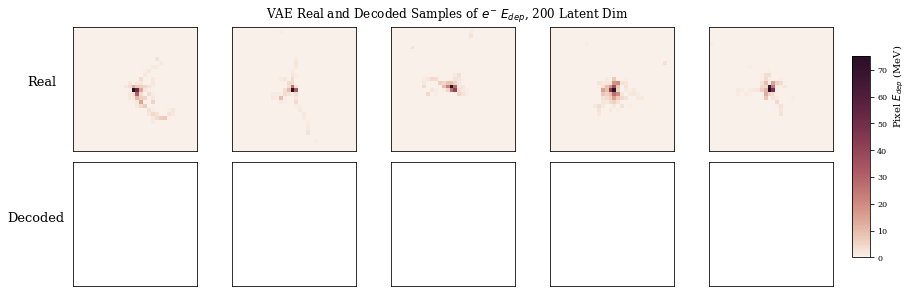

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


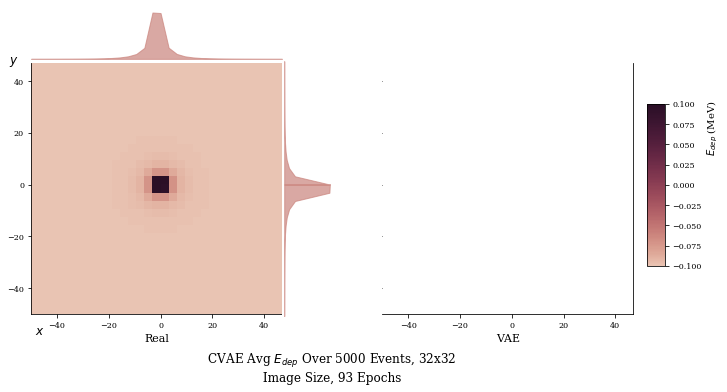

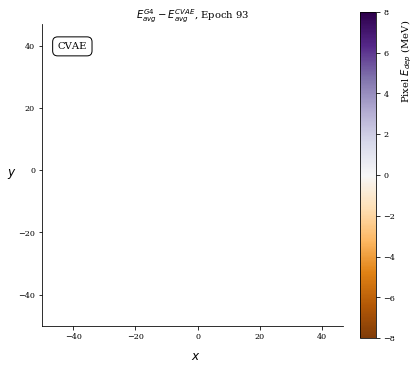

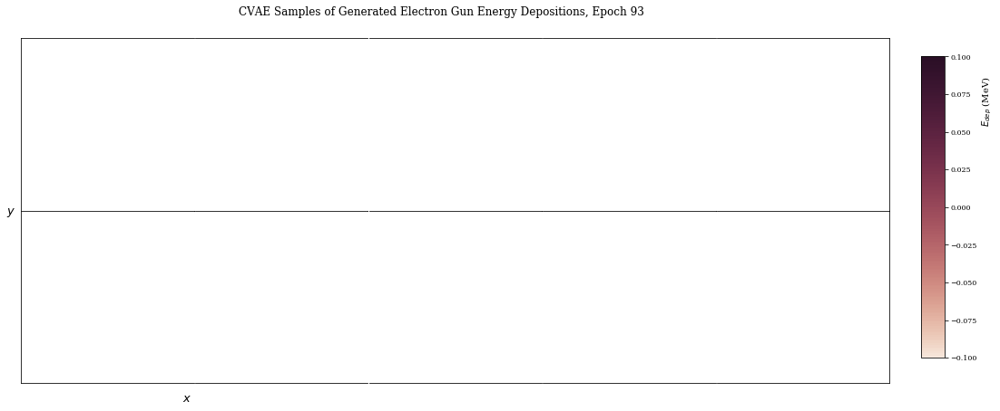

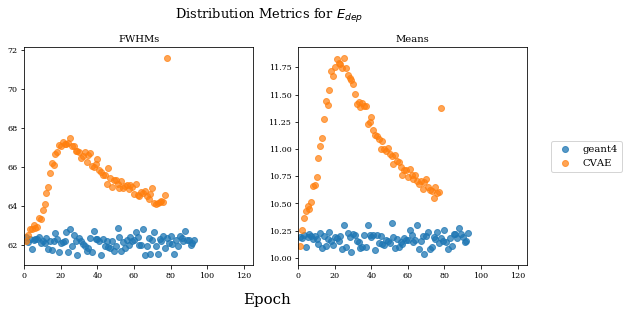

Train Epoch: 93 [0/15000 (0%)]	Loss: nan
Train Epoch: 93 [6400/15000 (43%)]	Loss: nan
Train Epoch: 93 [12800/15000 (85%)]	Loss: nan
====> Epoch: 93 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 94 [0/15000 (0%)]	Loss: nan
Train Epoch: 94 [6400/15000 (43%)]	Loss: nan
Train Epoch: 94 [12800/15000 (85%)]	Loss: nan
====> Epoch: 94 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


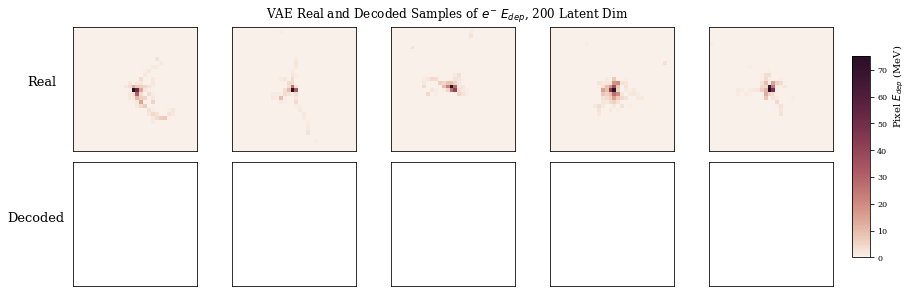

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


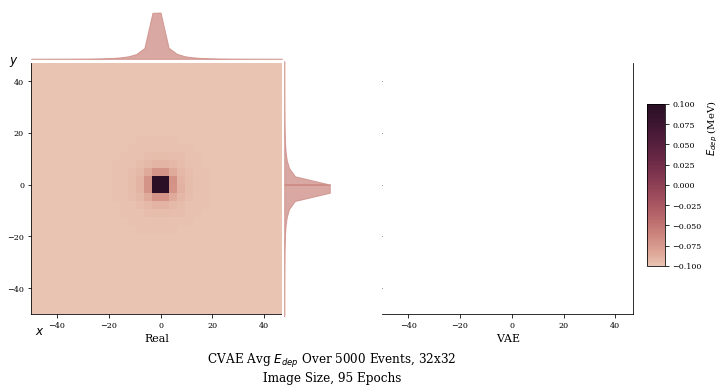

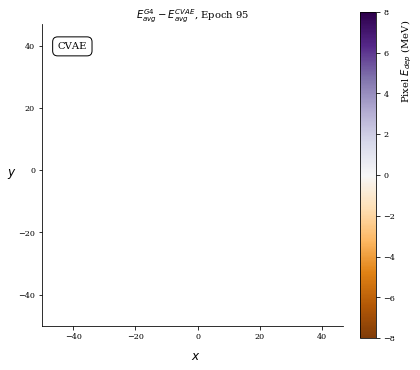

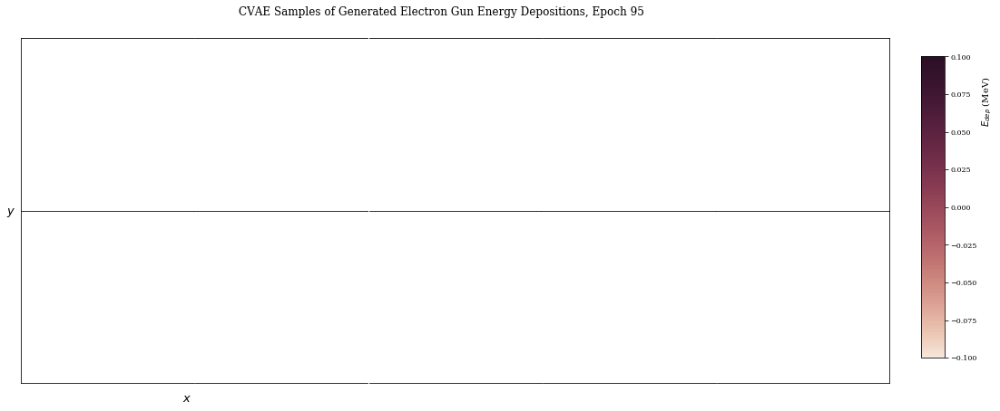

Train Epoch: 95 [0/15000 (0%)]	Loss: nan
Train Epoch: 95 [6400/15000 (43%)]	Loss: nan
Train Epoch: 95 [12800/15000 (85%)]	Loss: nan
====> Epoch: 95 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 96 [0/15000 (0%)]	Loss: nan
Train Epoch: 96 [6400/15000 (43%)]	Loss: nan
Train Epoch: 96 [12800/15000 (85%)]	Loss: nan
====> Epoch: 96 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


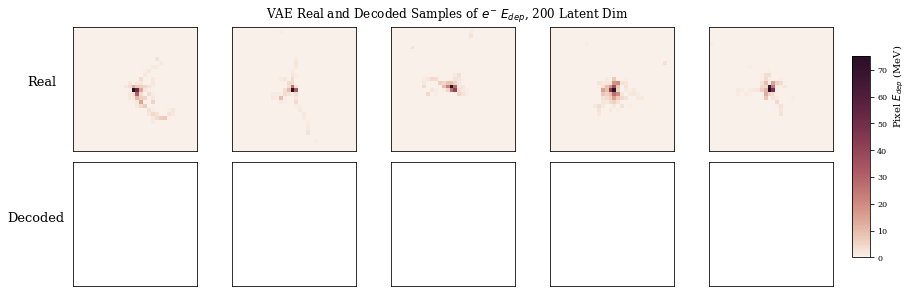

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


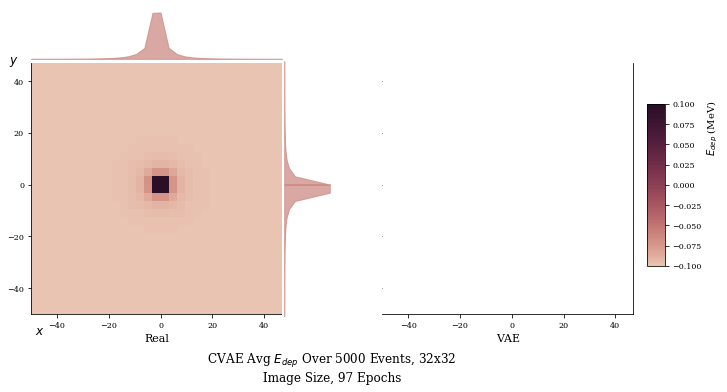

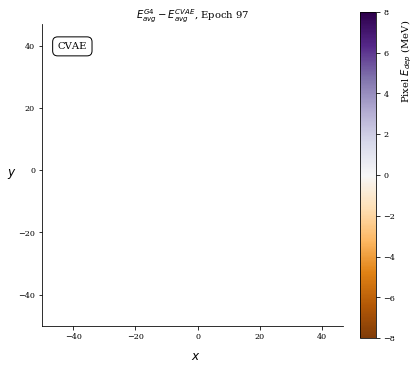

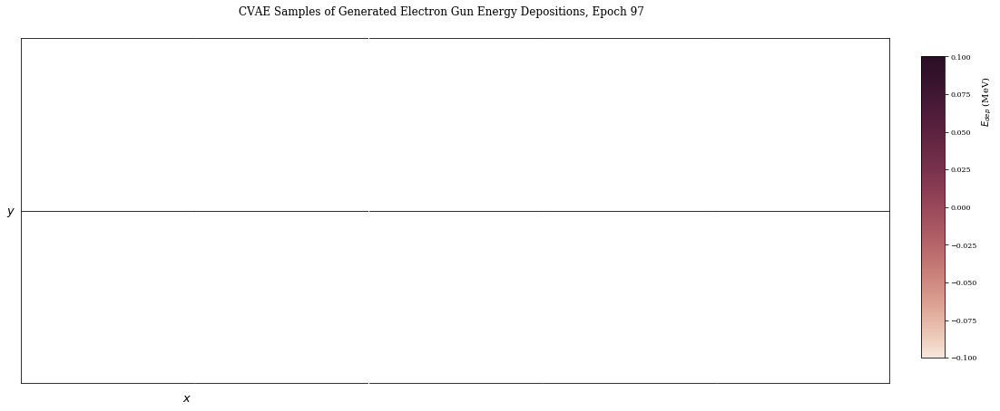

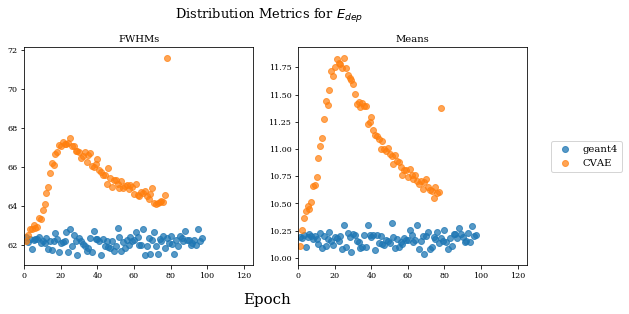

Train Epoch: 97 [0/15000 (0%)]	Loss: nan
Train Epoch: 97 [6400/15000 (43%)]	Loss: nan
Train Epoch: 97 [12800/15000 (85%)]	Loss: nan
====> Epoch: 97 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 98 [0/15000 (0%)]	Loss: nan
Train Epoch: 98 [6400/15000 (43%)]	Loss: nan
Train Epoch: 98 [12800/15000 (85%)]	Loss: nan
====> Epoch: 98 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


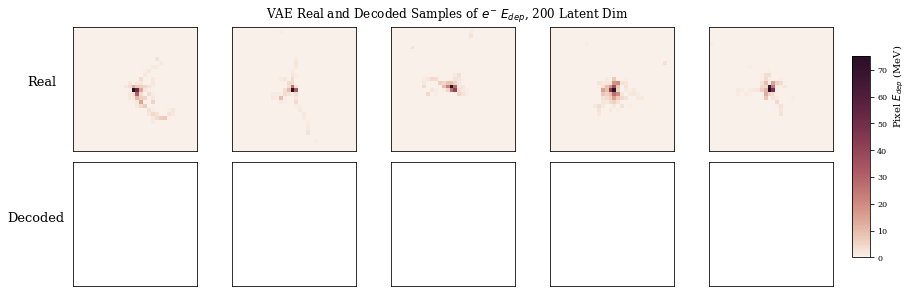

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


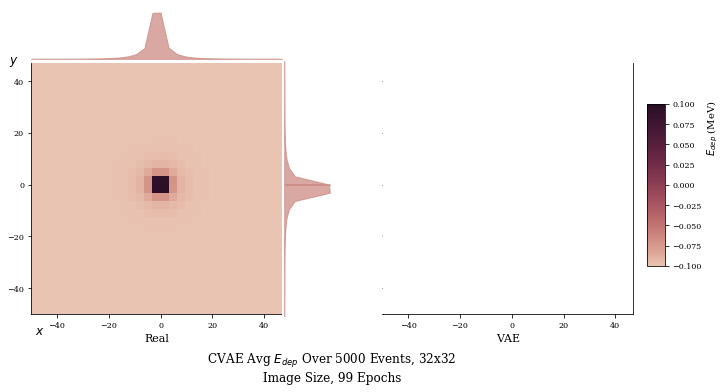

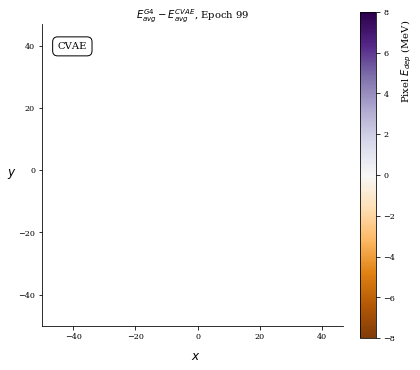

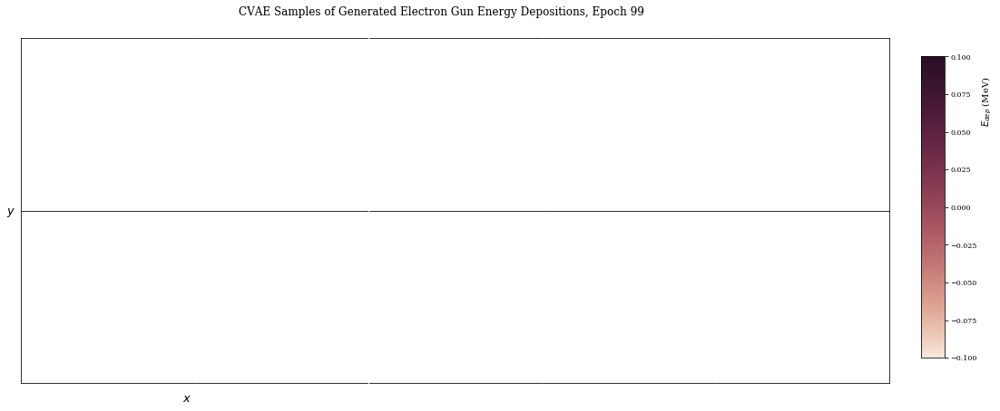

Train Epoch: 99 [0/15000 (0%)]	Loss: nan
Train Epoch: 99 [6400/15000 (43%)]	Loss: nan
Train Epoch: 99 [12800/15000 (85%)]	Loss: nan
====> Epoch: 99 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 100 [0/15000 (0%)]	Loss: nan
Train Epoch: 100 [6400/15000 (43%)]	Loss: nan
Train Epoch: 100 [12800/15000 (85%)]	Loss: nan
====> Epoch: 100 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


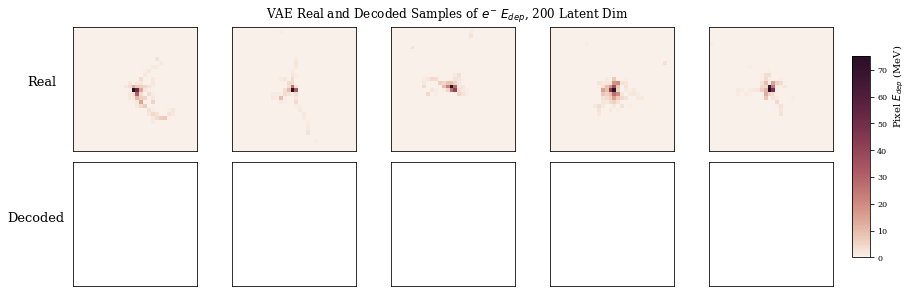

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


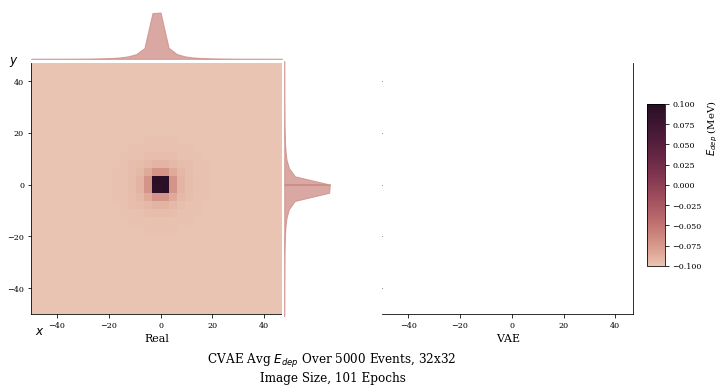

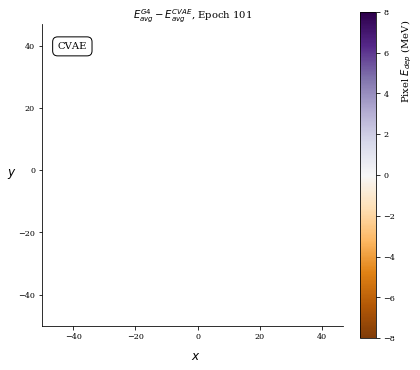

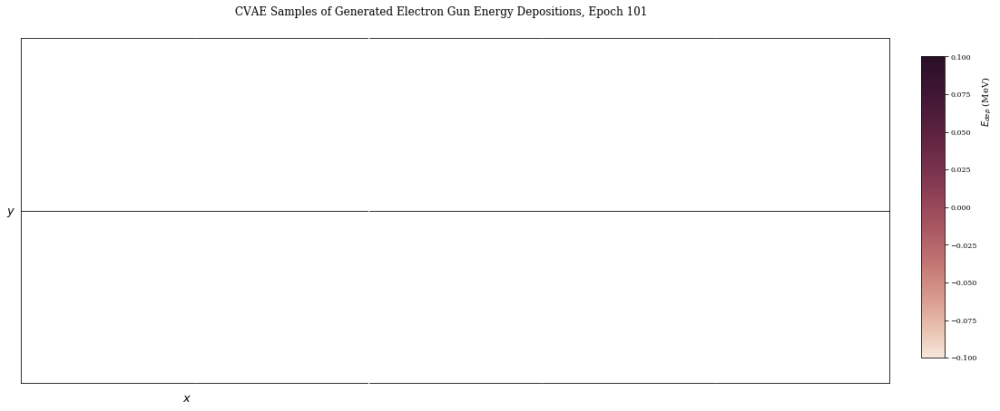

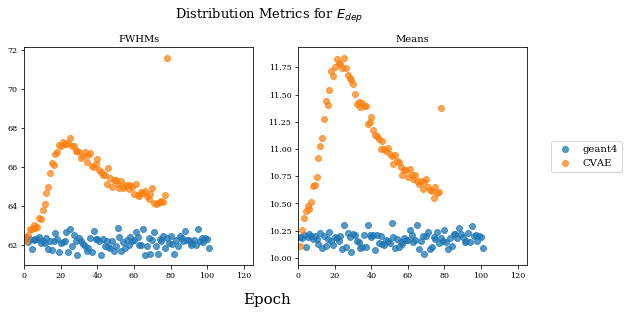

Train Epoch: 101 [0/15000 (0%)]	Loss: nan
Train Epoch: 101 [6400/15000 (43%)]	Loss: nan
Train Epoch: 101 [12800/15000 (85%)]	Loss: nan
====> Epoch: 101 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 102 [0/15000 (0%)]	Loss: nan
Train Epoch: 102 [6400/15000 (43%)]	Loss: nan
Train Epoch: 102 [12800/15000 (85%)]	Loss: nan
====> Epoch: 102 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


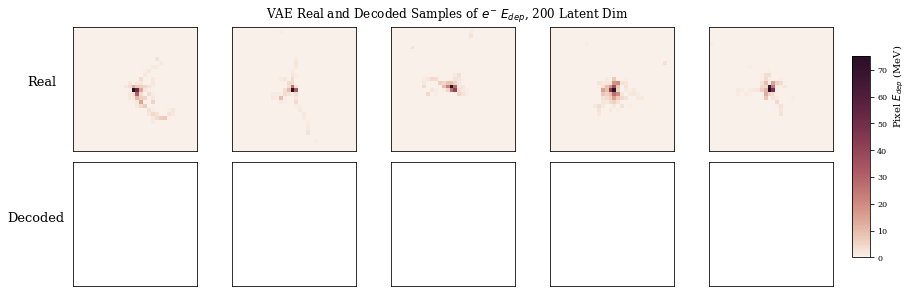

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


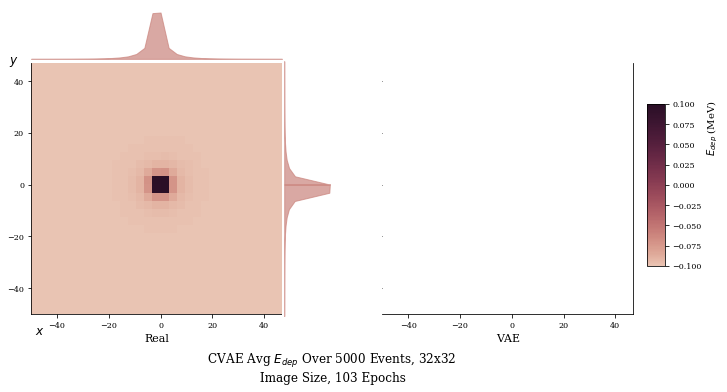

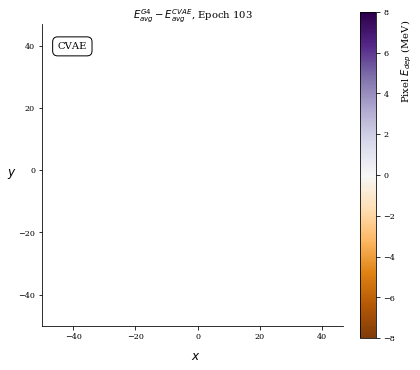

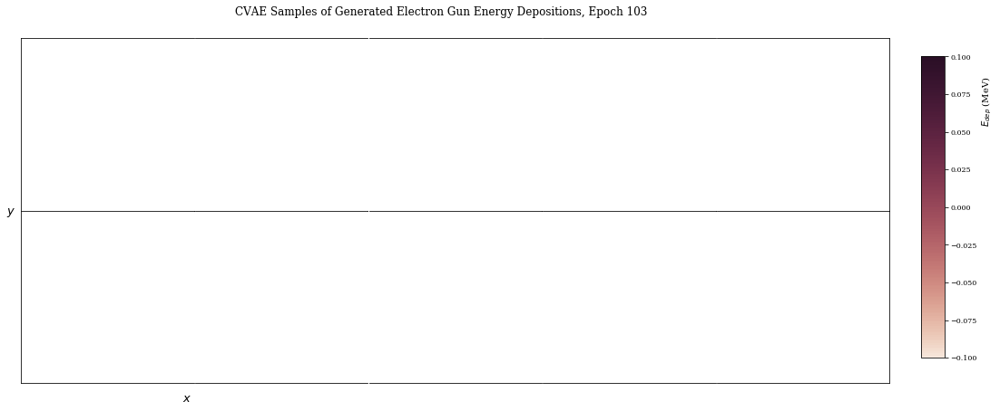

Train Epoch: 103 [0/15000 (0%)]	Loss: nan
Train Epoch: 103 [6400/15000 (43%)]	Loss: nan
Train Epoch: 103 [12800/15000 (85%)]	Loss: nan
====> Epoch: 103 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 104 [0/15000 (0%)]	Loss: nan
Train Epoch: 104 [6400/15000 (43%)]	Loss: nan
Train Epoch: 104 [12800/15000 (85%)]	Loss: nan
====> Epoch: 104 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


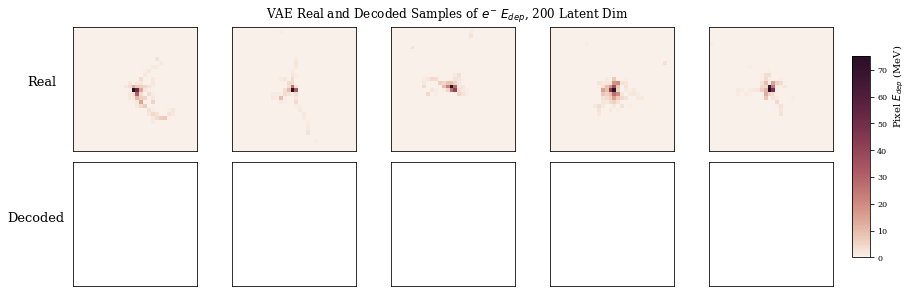

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


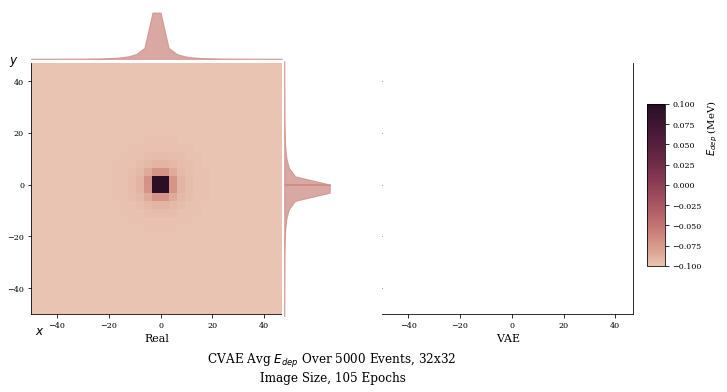

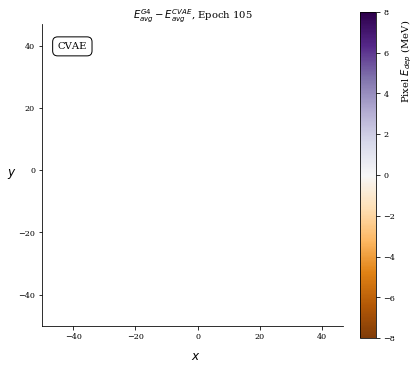

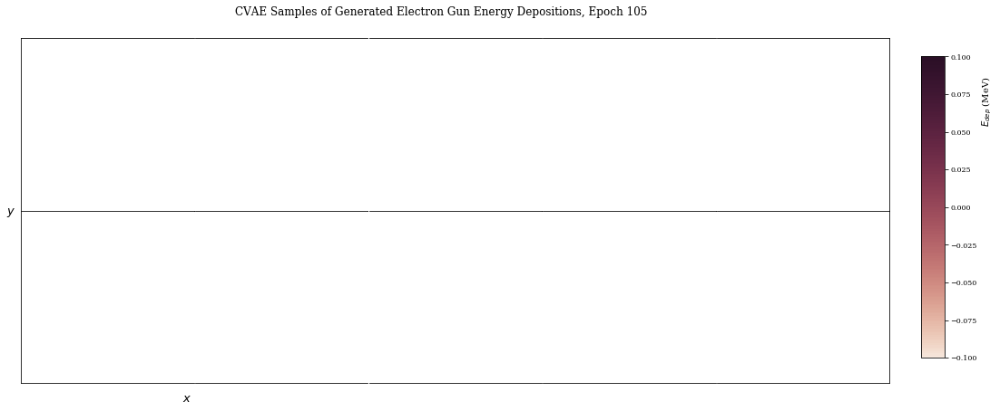

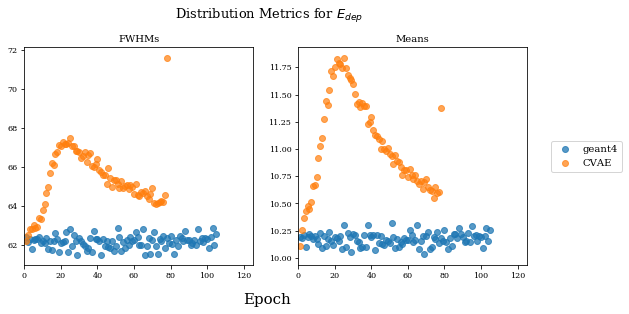

Train Epoch: 105 [0/15000 (0%)]	Loss: nan
Train Epoch: 105 [6400/15000 (43%)]	Loss: nan
Train Epoch: 105 [12800/15000 (85%)]	Loss: nan
====> Epoch: 105 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 106 [0/15000 (0%)]	Loss: nan
Train Epoch: 106 [6400/15000 (43%)]	Loss: nan
Train Epoch: 106 [12800/15000 (85%)]	Loss: nan
====> Epoch: 106 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


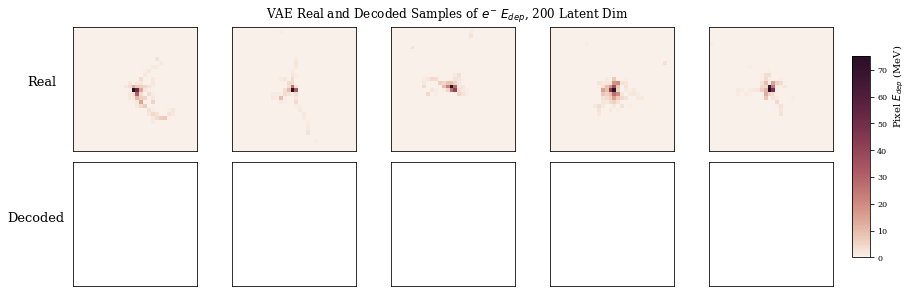

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


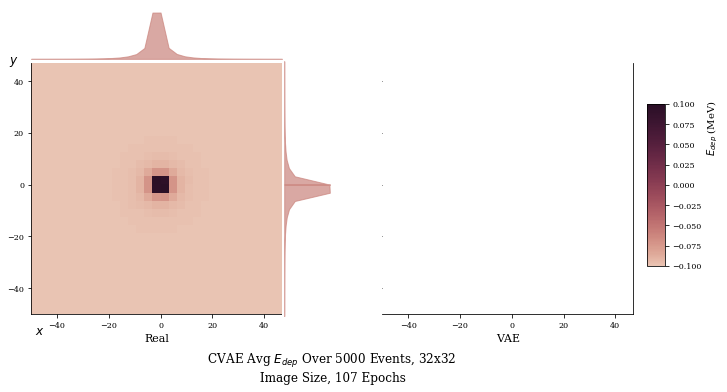

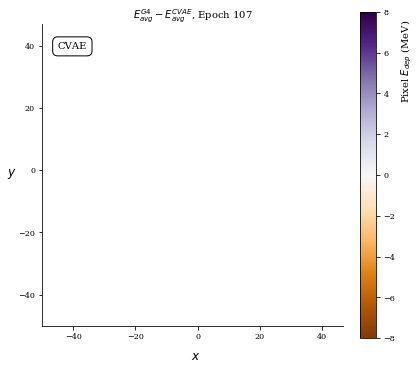

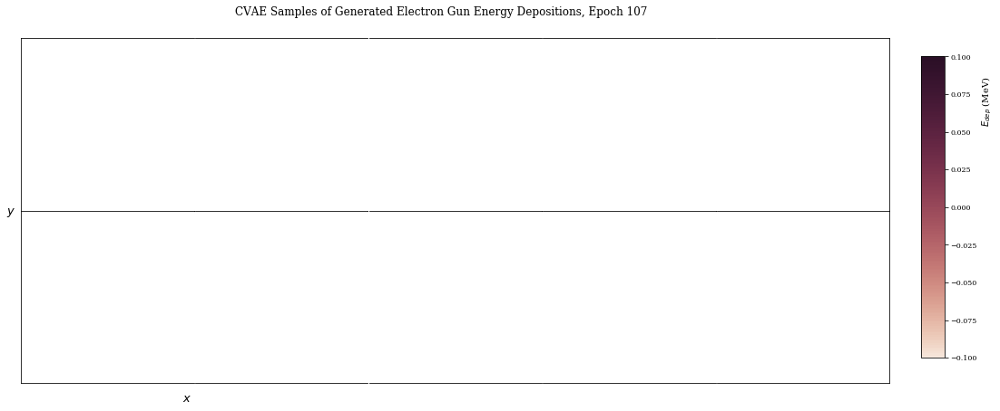

Train Epoch: 107 [0/15000 (0%)]	Loss: nan
Train Epoch: 107 [6400/15000 (43%)]	Loss: nan
Train Epoch: 107 [12800/15000 (85%)]	Loss: nan
====> Epoch: 107 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 108 [0/15000 (0%)]	Loss: nan
Train Epoch: 108 [6400/15000 (43%)]	Loss: nan
Train Epoch: 108 [12800/15000 (85%)]	Loss: nan
====> Epoch: 108 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


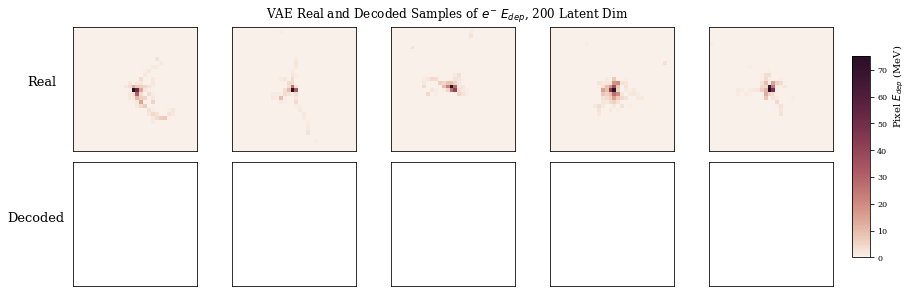

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


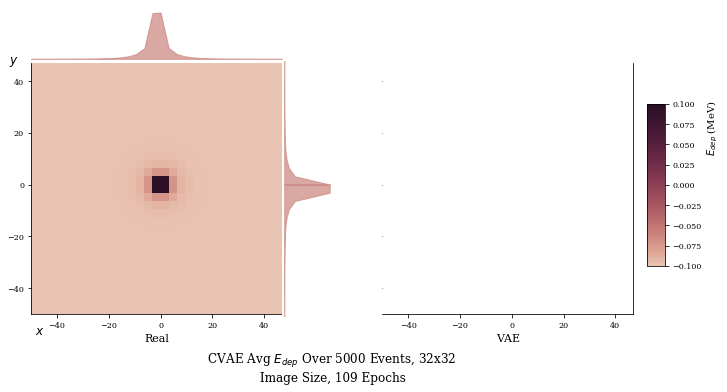

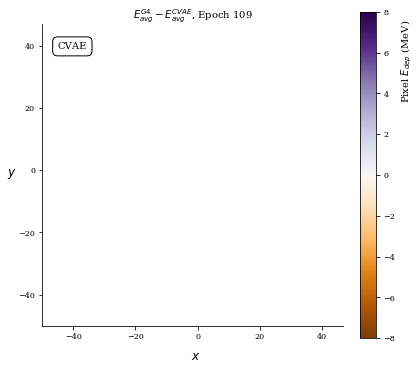

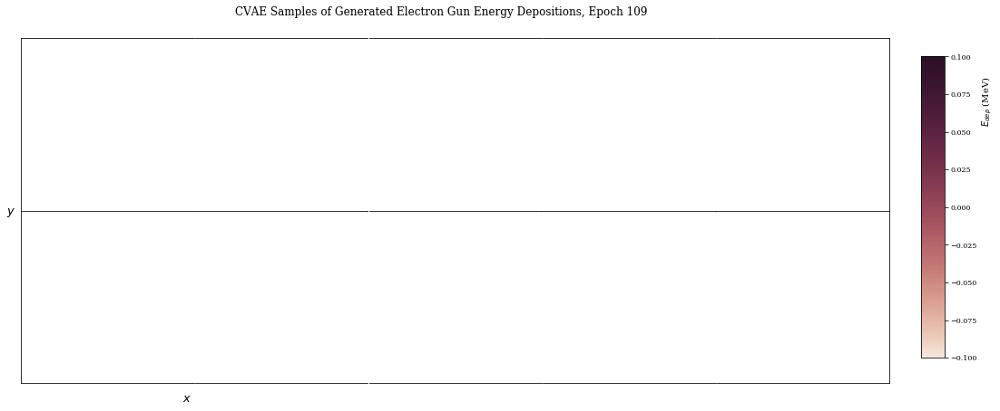

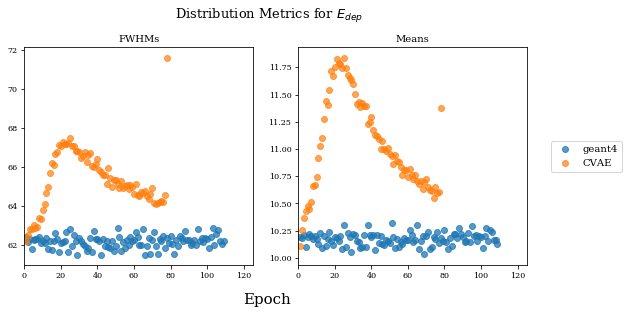

Train Epoch: 109 [0/15000 (0%)]	Loss: nan
Train Epoch: 109 [6400/15000 (43%)]	Loss: nan
Train Epoch: 109 [12800/15000 (85%)]	Loss: nan
====> Epoch: 109 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 110 [0/15000 (0%)]	Loss: nan
Train Epoch: 110 [6400/15000 (43%)]	Loss: nan
Train Epoch: 110 [12800/15000 (85%)]	Loss: nan
====> Epoch: 110 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


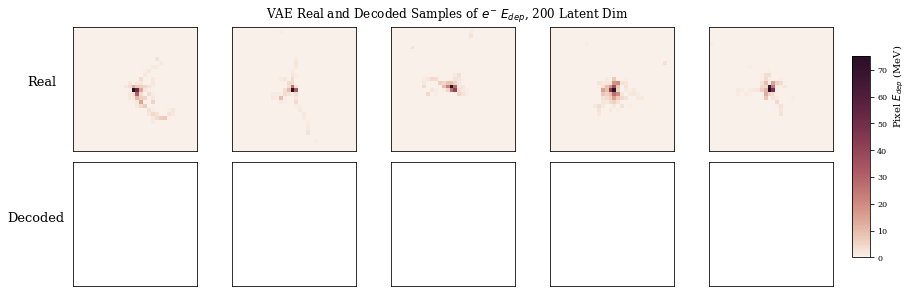

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


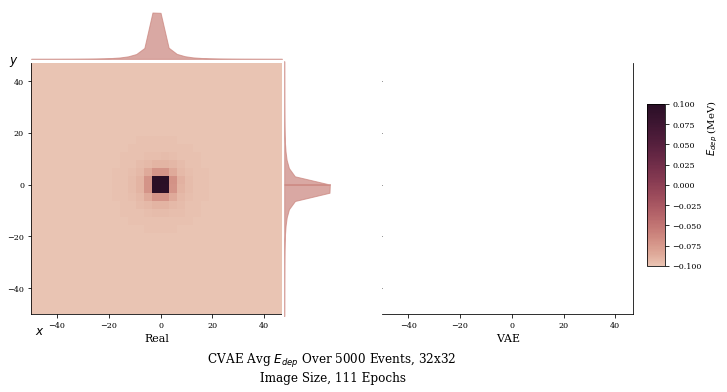

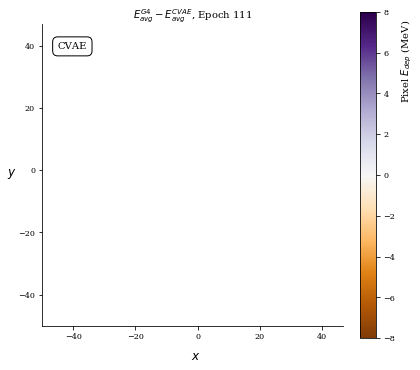

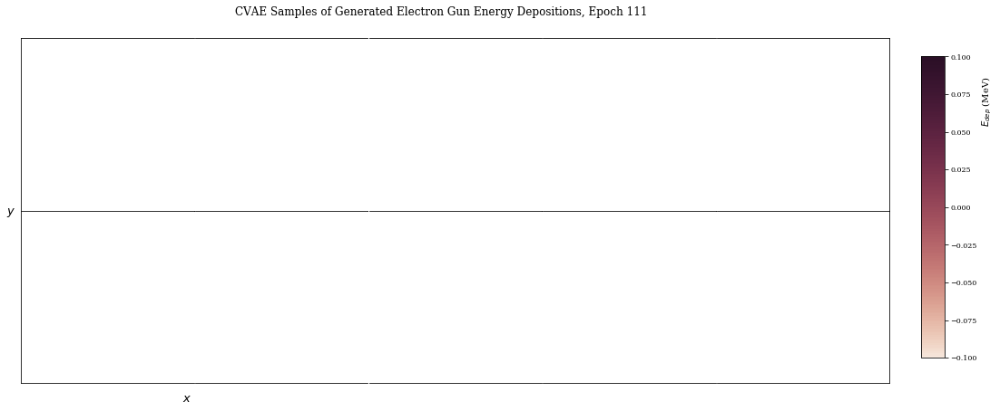

Train Epoch: 111 [0/15000 (0%)]	Loss: nan
Train Epoch: 111 [6400/15000 (43%)]	Loss: nan
Train Epoch: 111 [12800/15000 (85%)]	Loss: nan
====> Epoch: 111 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 112 [0/15000 (0%)]	Loss: nan
Train Epoch: 112 [6400/15000 (43%)]	Loss: nan
Train Epoch: 112 [12800/15000 (85%)]	Loss: nan
====> Epoch: 112 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


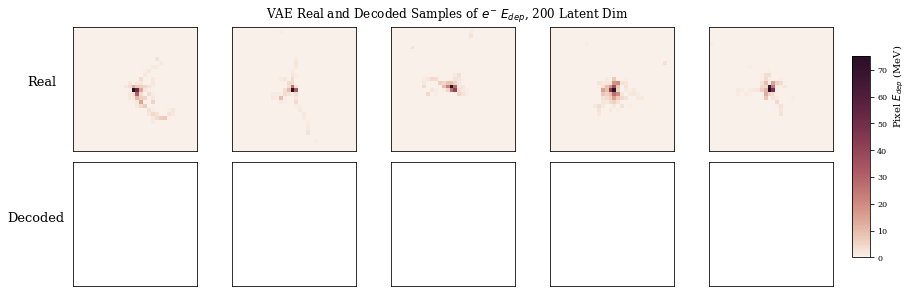

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


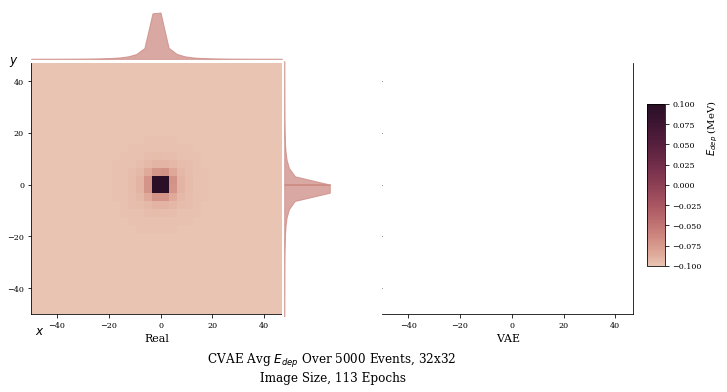

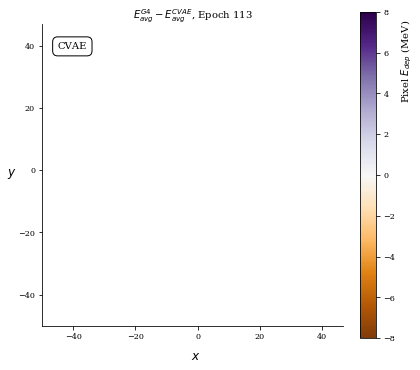

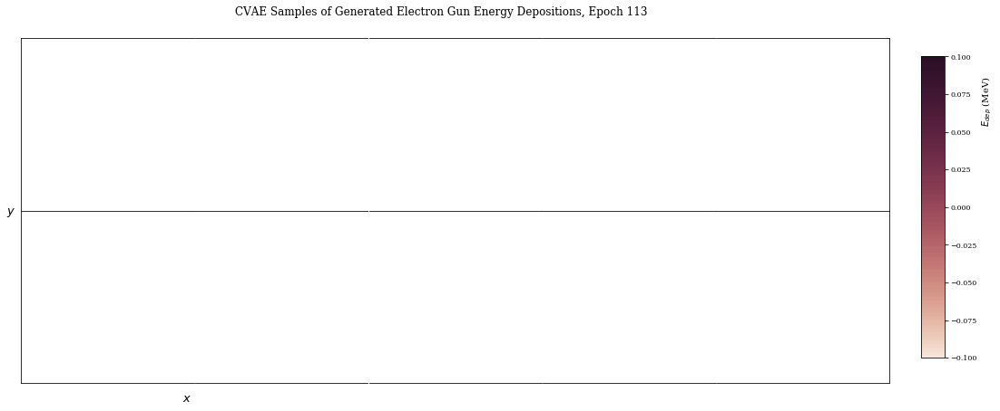

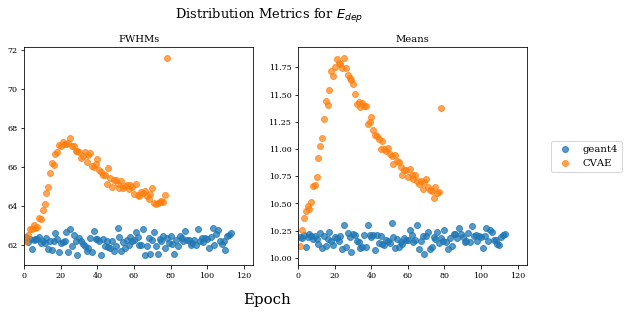

Train Epoch: 113 [0/15000 (0%)]	Loss: nan
Train Epoch: 113 [6400/15000 (43%)]	Loss: nan
Train Epoch: 113 [12800/15000 (85%)]	Loss: nan
====> Epoch: 113 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 114 [0/15000 (0%)]	Loss: nan
Train Epoch: 114 [6400/15000 (43%)]	Loss: nan
Train Epoch: 114 [12800/15000 (85%)]	Loss: nan
====> Epoch: 114 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


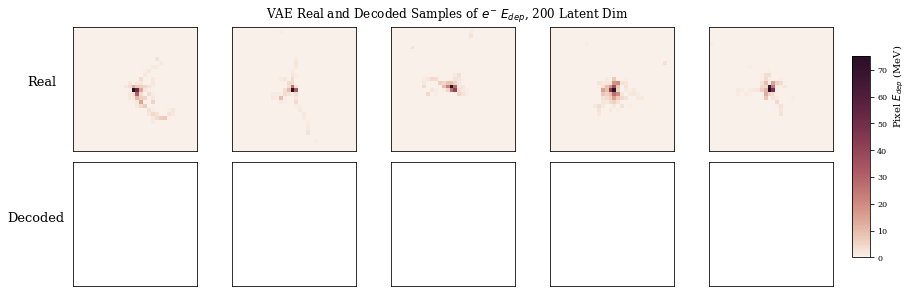

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


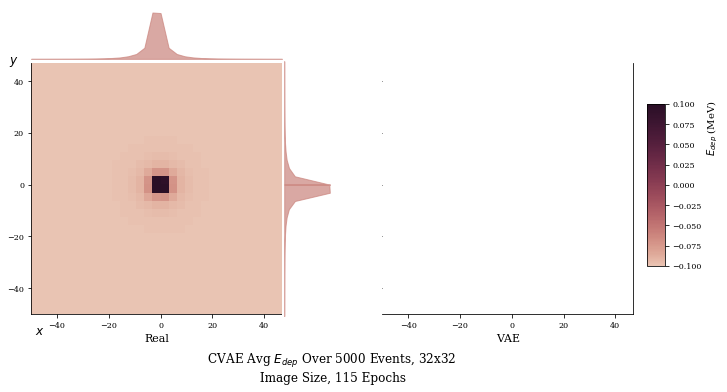

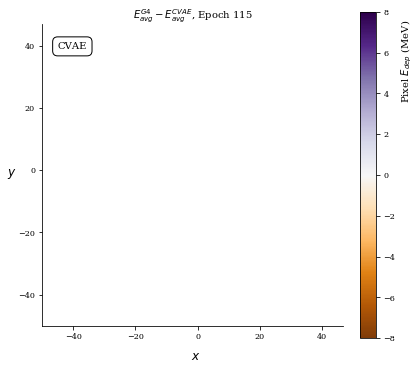

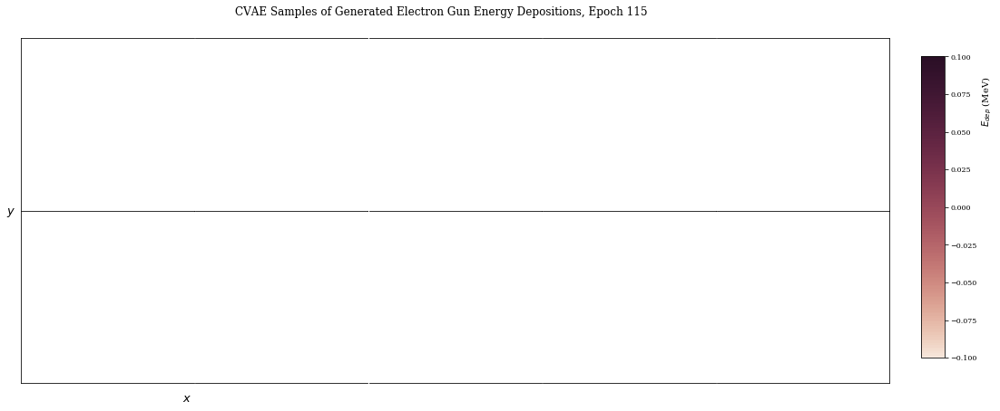

Train Epoch: 115 [0/15000 (0%)]	Loss: nan
Train Epoch: 115 [6400/15000 (43%)]	Loss: nan
Train Epoch: 115 [12800/15000 (85%)]	Loss: nan
====> Epoch: 115 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 116 [0/15000 (0%)]	Loss: nan
Train Epoch: 116 [6400/15000 (43%)]	Loss: nan
Train Epoch: 116 [12800/15000 (85%)]	Loss: nan
====> Epoch: 116 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


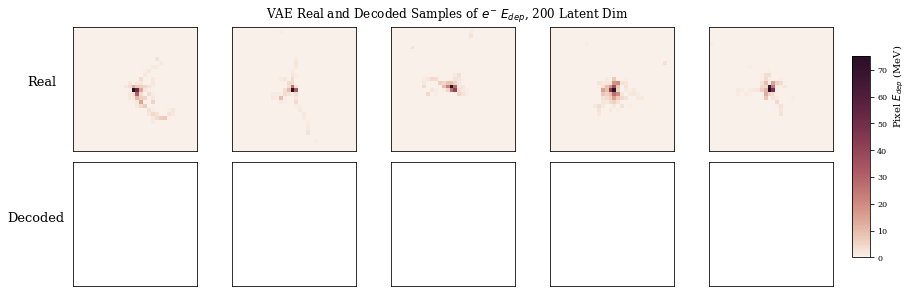

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


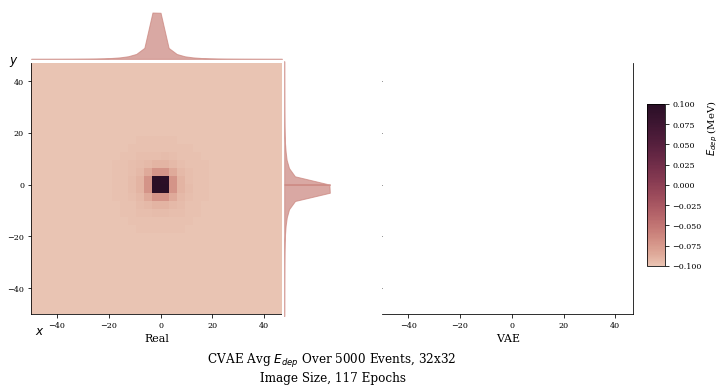

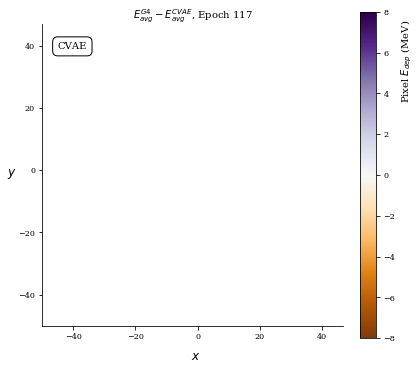

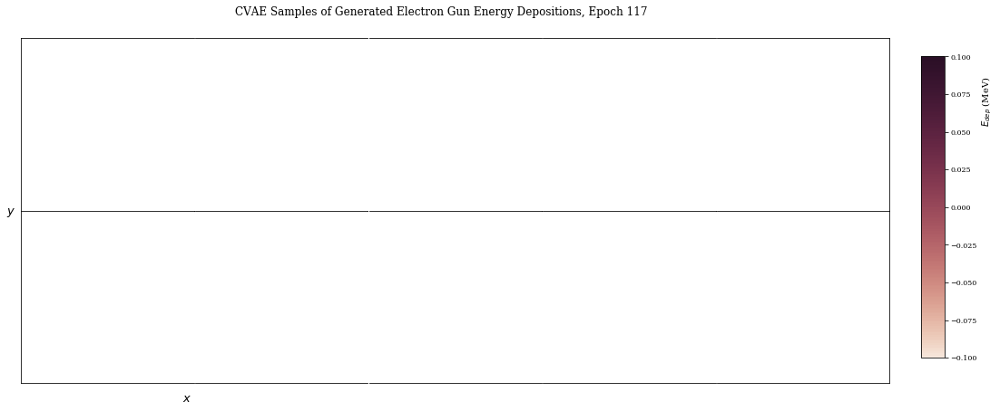

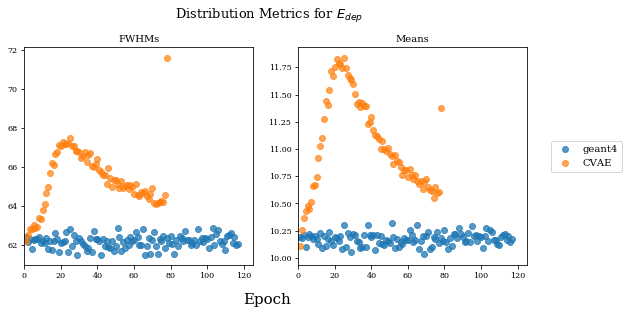

Train Epoch: 117 [0/15000 (0%)]	Loss: nan
Train Epoch: 117 [6400/15000 (43%)]	Loss: nan
Train Epoch: 117 [12800/15000 (85%)]	Loss: nan
====> Epoch: 117 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 118 [0/15000 (0%)]	Loss: nan
Train Epoch: 118 [6400/15000 (43%)]	Loss: nan
Train Epoch: 118 [12800/15000 (85%)]	Loss: nan
====> Epoch: 118 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


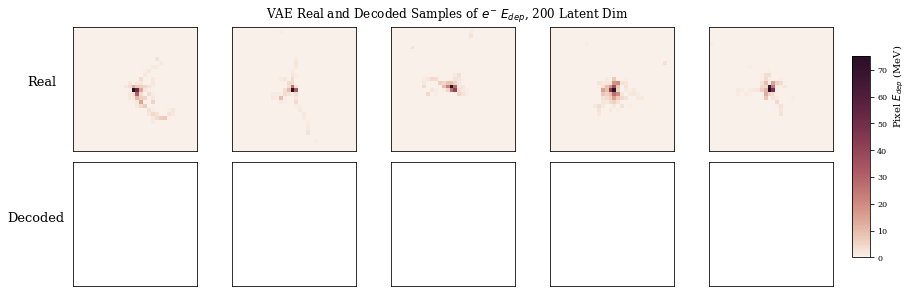

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


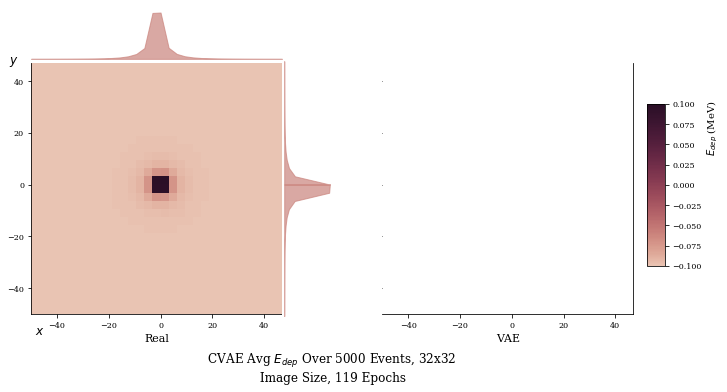

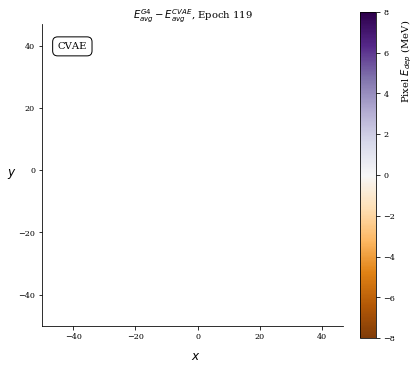

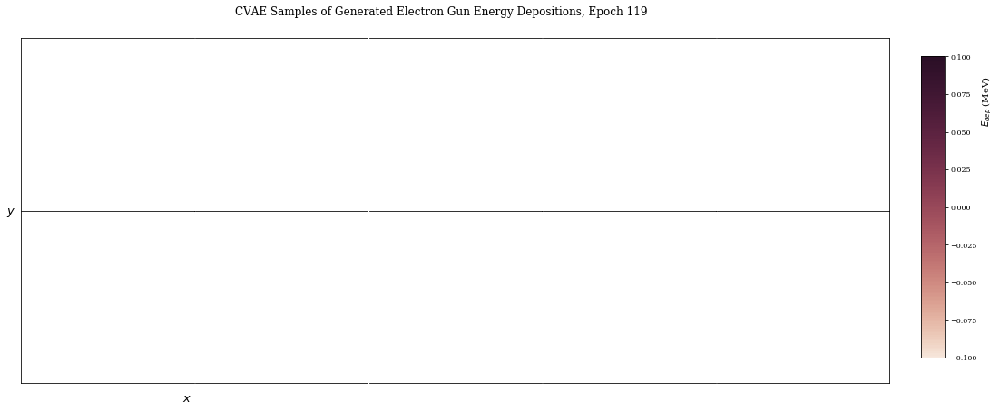

Train Epoch: 119 [0/15000 (0%)]	Loss: nan
Train Epoch: 119 [6400/15000 (43%)]	Loss: nan
Train Epoch: 119 [12800/15000 (85%)]	Loss: nan
====> Epoch: 119 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 120 [0/15000 (0%)]	Loss: nan
Train Epoch: 120 [6400/15000 (43%)]	Loss: nan
Train Epoch: 120 [12800/15000 (85%)]	Loss: nan
====> Epoch: 120 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


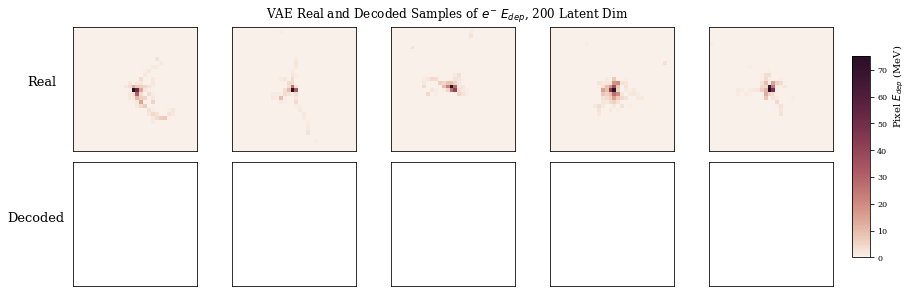

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


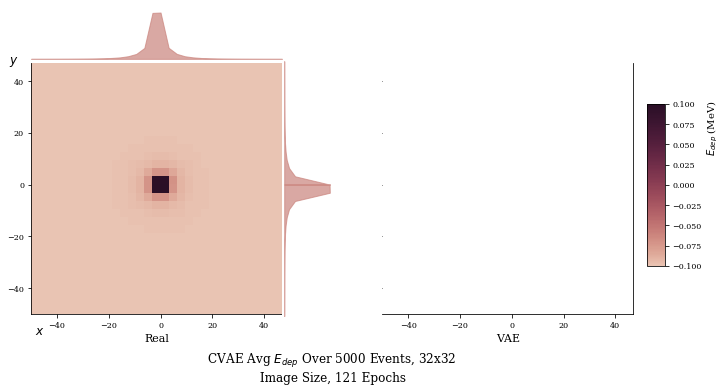

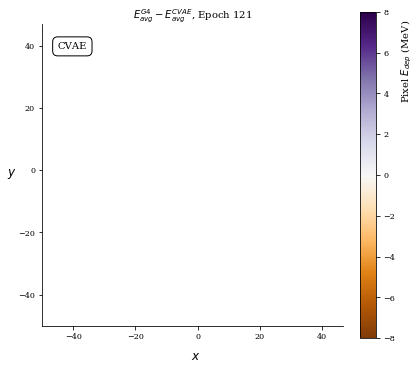

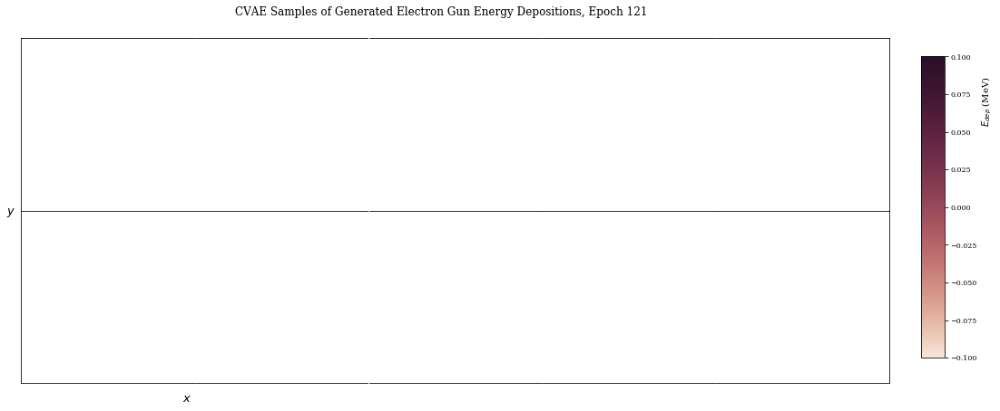

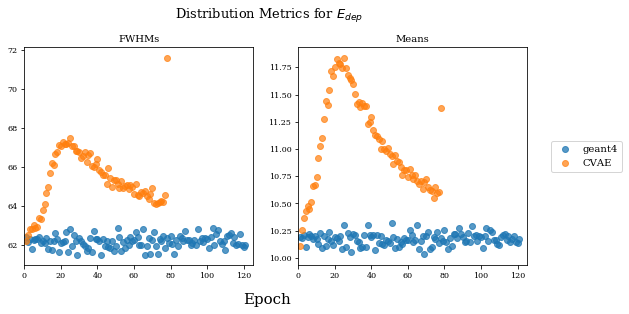

Train Epoch: 121 [0/15000 (0%)]	Loss: nan
Train Epoch: 121 [6400/15000 (43%)]	Loss: nan
Train Epoch: 121 [12800/15000 (85%)]	Loss: nan
====> Epoch: 121 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 122 [0/15000 (0%)]	Loss: nan
Train Epoch: 122 [6400/15000 (43%)]	Loss: nan
Train Epoch: 122 [12800/15000 (85%)]	Loss: nan
====> Epoch: 122 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


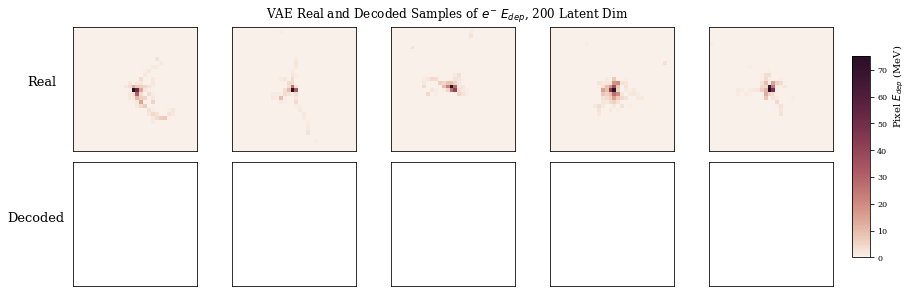

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


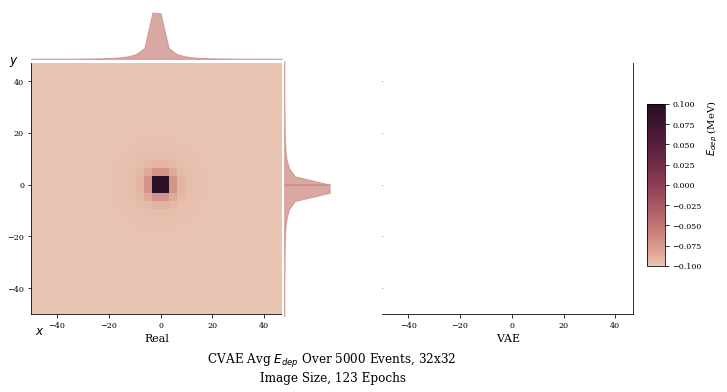

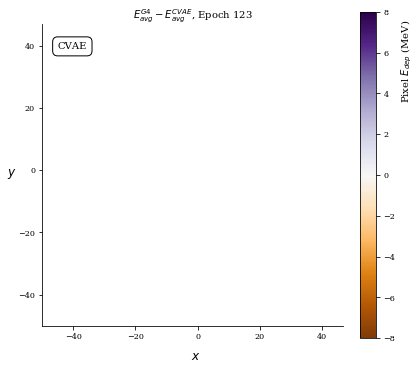

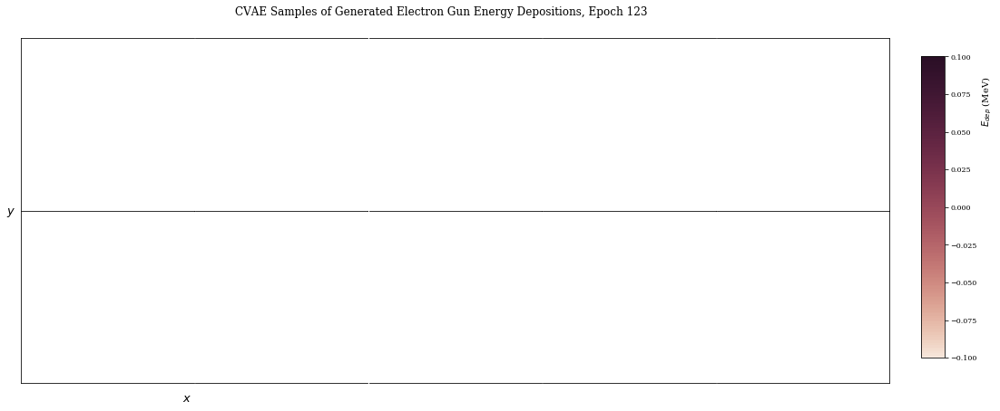

Train Epoch: 123 [0/15000 (0%)]	Loss: nan
Train Epoch: 123 [6400/15000 (43%)]	Loss: nan
Train Epoch: 123 [12800/15000 (85%)]	Loss: nan
====> Epoch: 123 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 124 [0/15000 (0%)]	Loss: nan
Train Epoch: 124 [6400/15000 (43%)]	Loss: nan
Train Epoch: 124 [12800/15000 (85%)]	Loss: nan
====> Epoch: 124 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


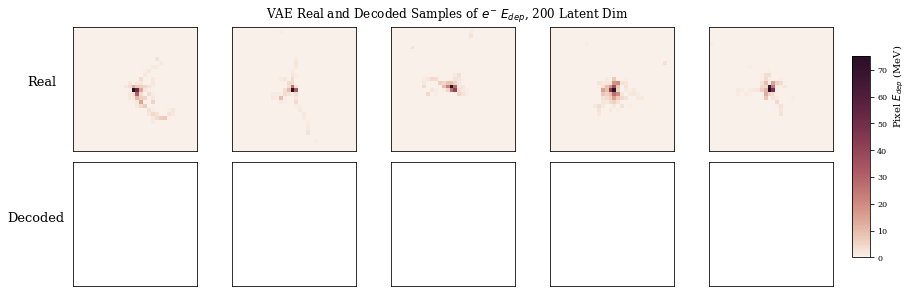

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


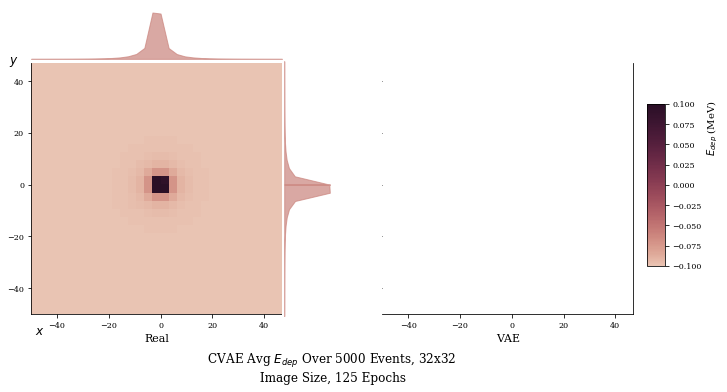

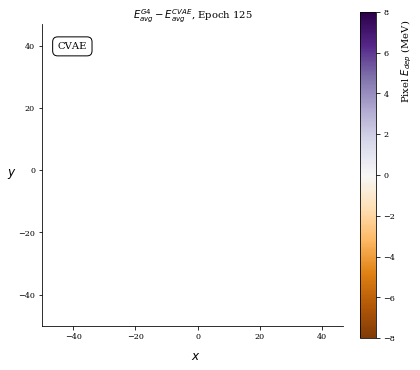

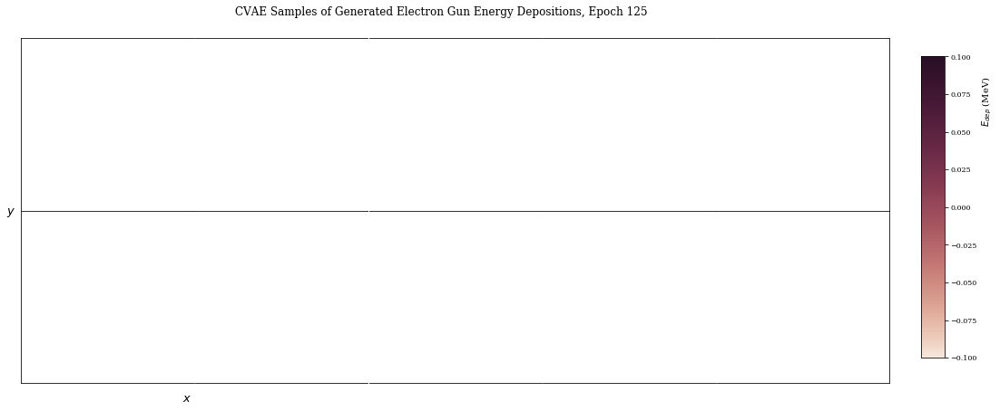

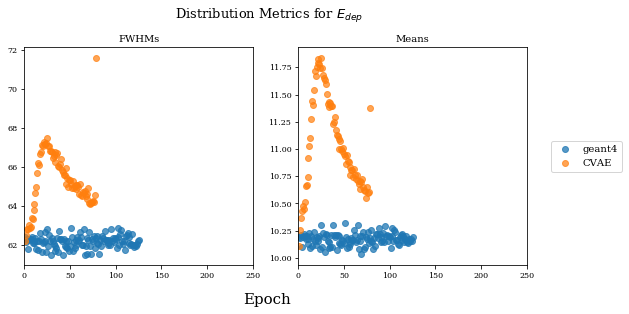

Train Epoch: 125 [0/15000 (0%)]	Loss: nan
Train Epoch: 125 [6400/15000 (43%)]	Loss: nan
Train Epoch: 125 [12800/15000 (85%)]	Loss: nan
====> Epoch: 125 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 126 [0/15000 (0%)]	Loss: nan
Train Epoch: 126 [6400/15000 (43%)]	Loss: nan
Train Epoch: 126 [12800/15000 (85%)]	Loss: nan
====> Epoch: 126 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


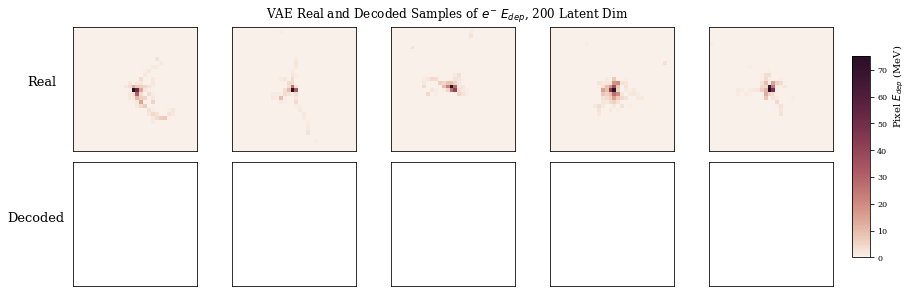

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


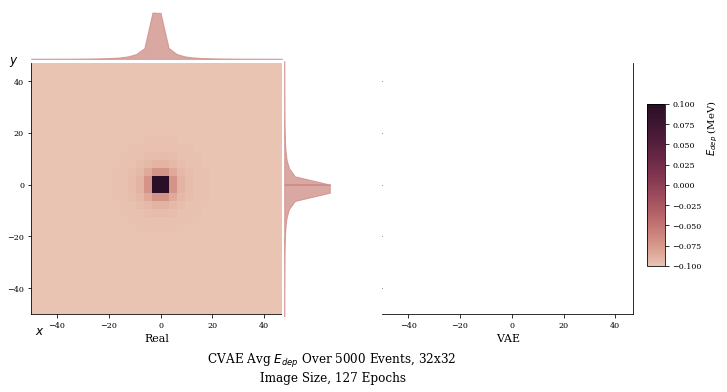

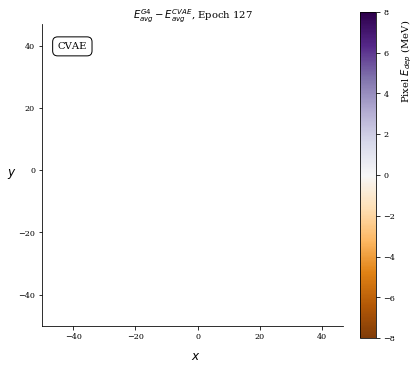

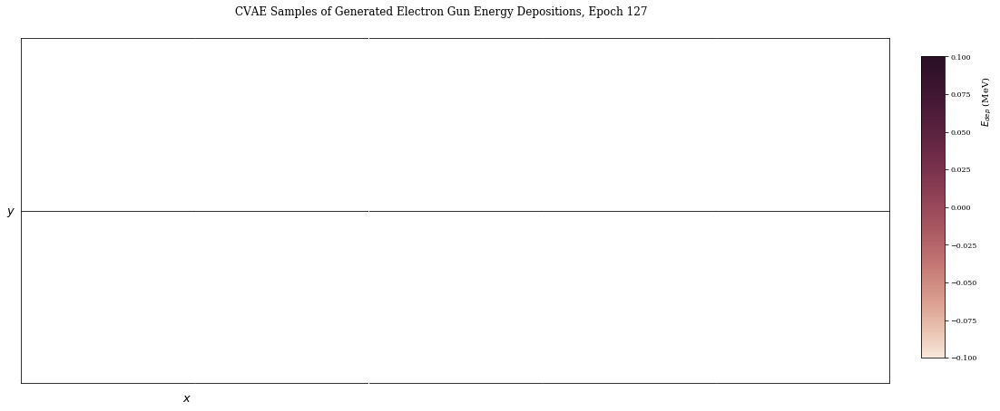

Train Epoch: 127 [0/15000 (0%)]	Loss: nan
Train Epoch: 127 [6400/15000 (43%)]	Loss: nan
Train Epoch: 127 [12800/15000 (85%)]	Loss: nan
====> Epoch: 127 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 128 [0/15000 (0%)]	Loss: nan
Train Epoch: 128 [6400/15000 (43%)]	Loss: nan
Train Epoch: 128 [12800/15000 (85%)]	Loss: nan
====> Epoch: 128 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


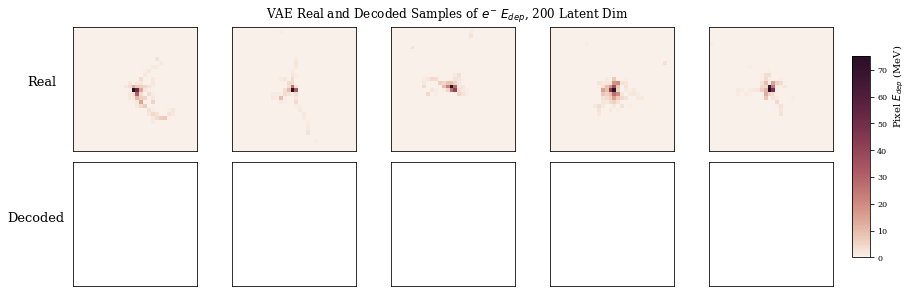

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


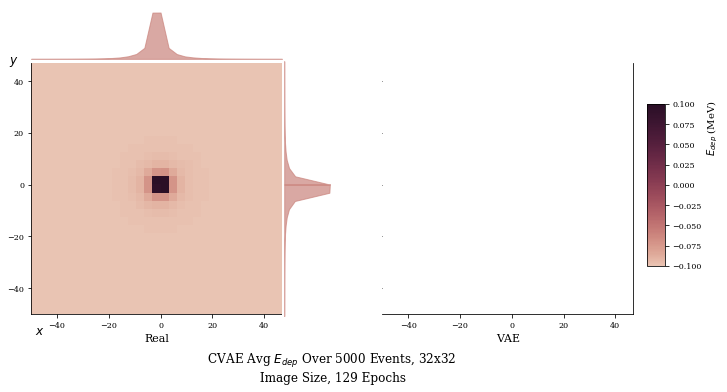

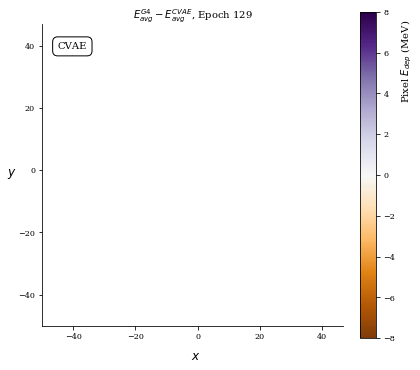

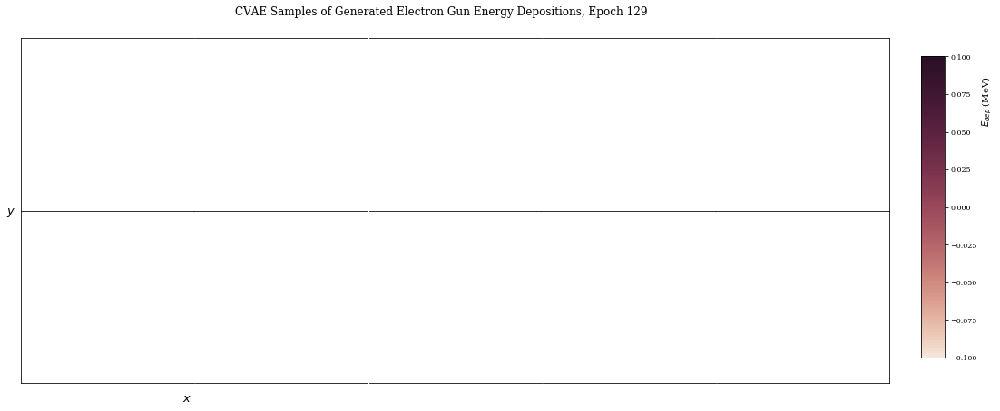

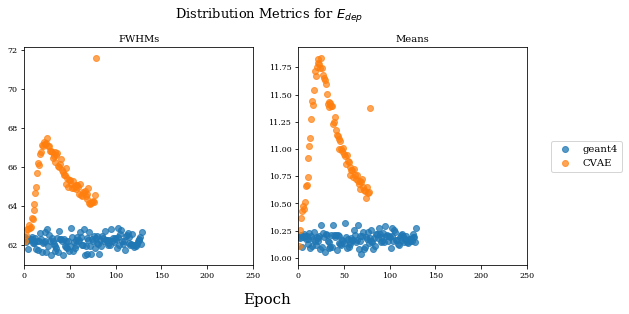

Train Epoch: 129 [0/15000 (0%)]	Loss: nan
Train Epoch: 129 [6400/15000 (43%)]	Loss: nan
Train Epoch: 129 [12800/15000 (85%)]	Loss: nan
====> Epoch: 129 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 130 [0/15000 (0%)]	Loss: nan
Train Epoch: 130 [6400/15000 (43%)]	Loss: nan
Train Epoch: 130 [12800/15000 (85%)]	Loss: nan
====> Epoch: 130 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


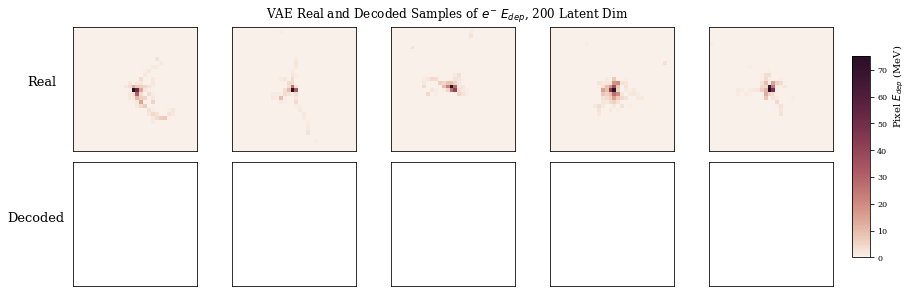

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


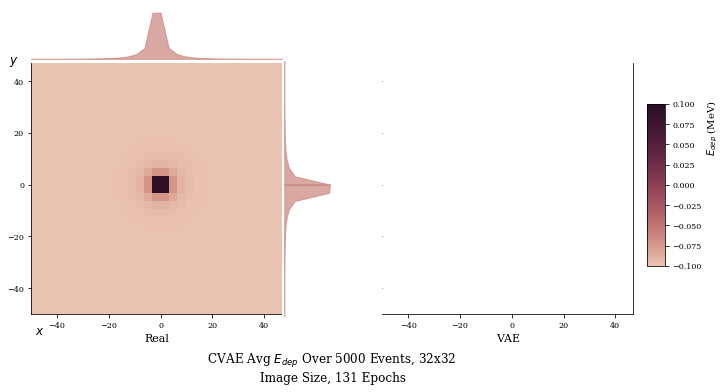

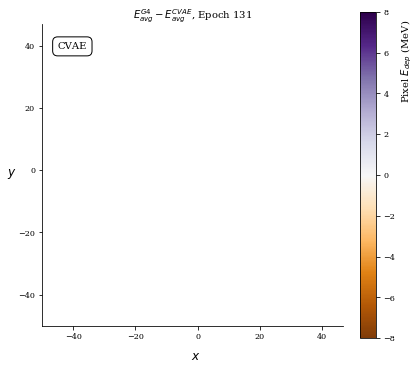

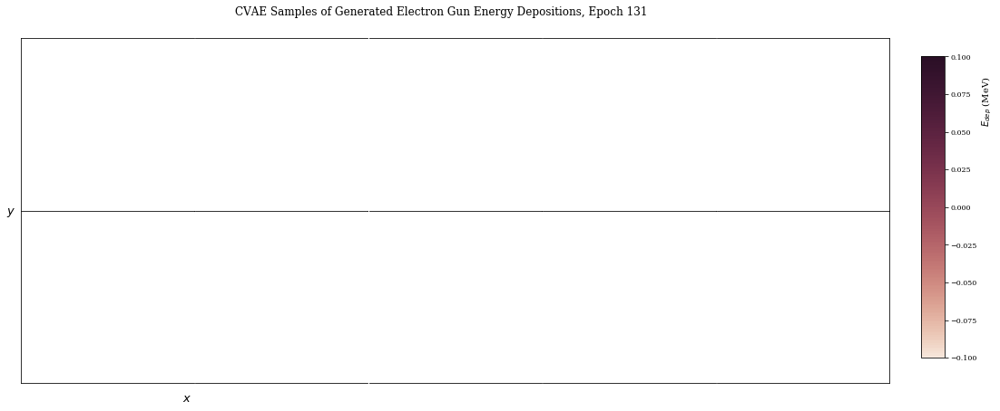

Train Epoch: 131 [0/15000 (0%)]	Loss: nan
Train Epoch: 131 [6400/15000 (43%)]	Loss: nan
Train Epoch: 131 [12800/15000 (85%)]	Loss: nan
====> Epoch: 131 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 132 [0/15000 (0%)]	Loss: nan
Train Epoch: 132 [6400/15000 (43%)]	Loss: nan
Train Epoch: 132 [12800/15000 (85%)]	Loss: nan
====> Epoch: 132 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


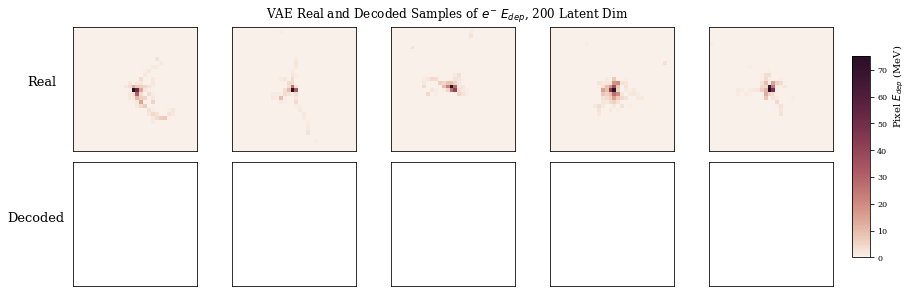

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


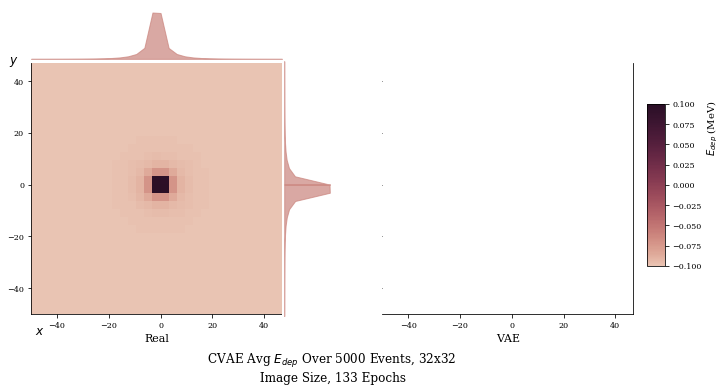

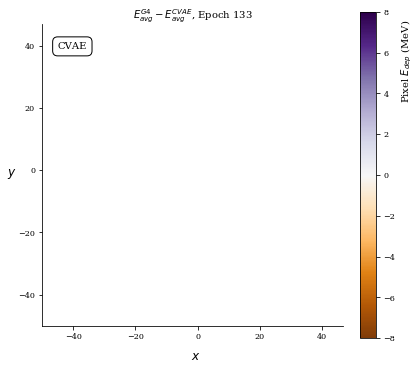

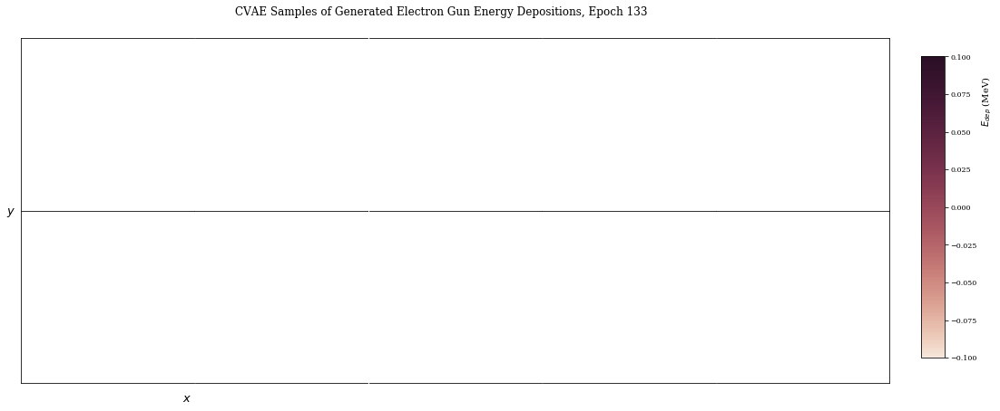

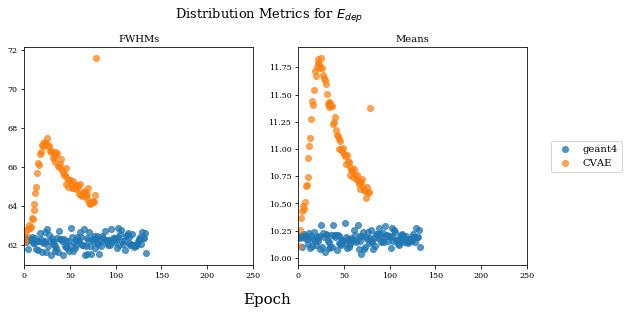

Train Epoch: 133 [0/15000 (0%)]	Loss: nan
Train Epoch: 133 [6400/15000 (43%)]	Loss: nan
Train Epoch: 133 [12800/15000 (85%)]	Loss: nan
====> Epoch: 133 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 134 [0/15000 (0%)]	Loss: nan
Train Epoch: 134 [6400/15000 (43%)]	Loss: nan
Train Epoch: 134 [12800/15000 (85%)]	Loss: nan
====> Epoch: 134 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


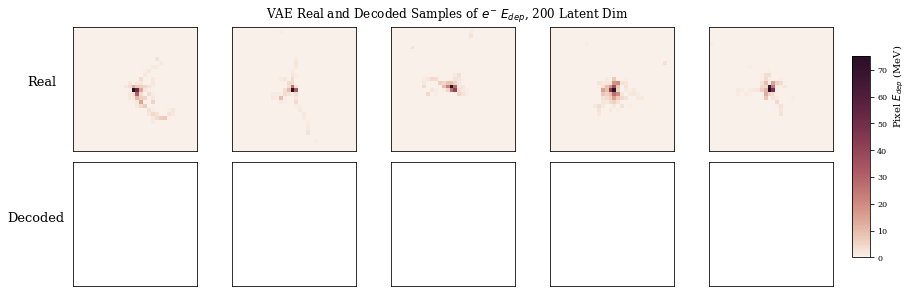

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


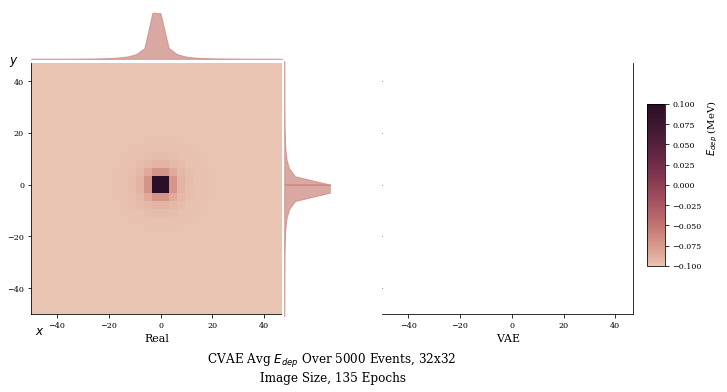

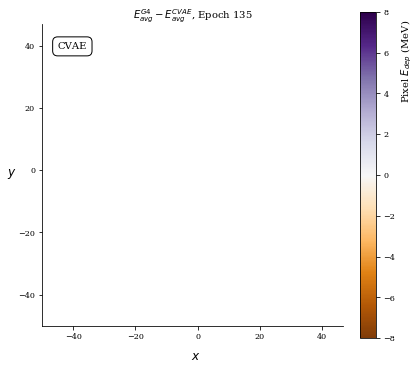

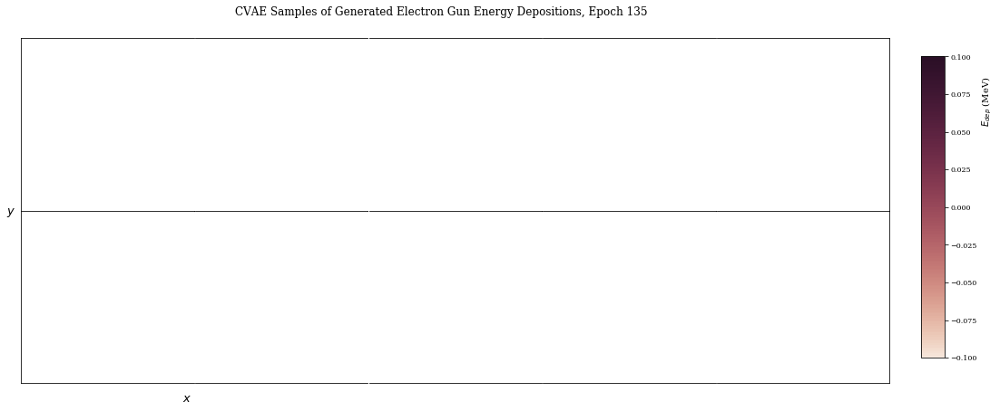

Train Epoch: 135 [0/15000 (0%)]	Loss: nan
Train Epoch: 135 [6400/15000 (43%)]	Loss: nan
Train Epoch: 135 [12800/15000 (85%)]	Loss: nan
====> Epoch: 135 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 136 [0/15000 (0%)]	Loss: nan
Train Epoch: 136 [6400/15000 (43%)]	Loss: nan
Train Epoch: 136 [12800/15000 (85%)]	Loss: nan
====> Epoch: 136 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


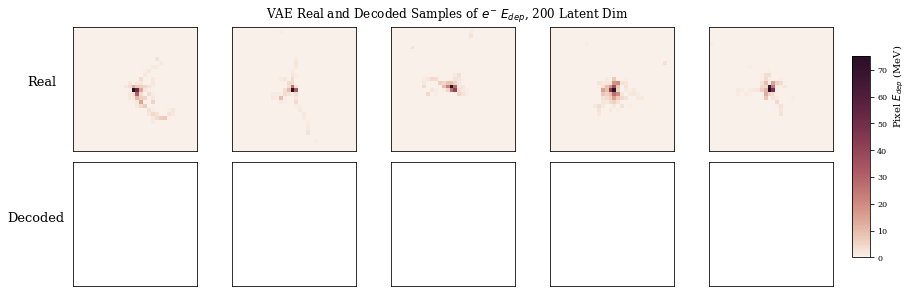

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


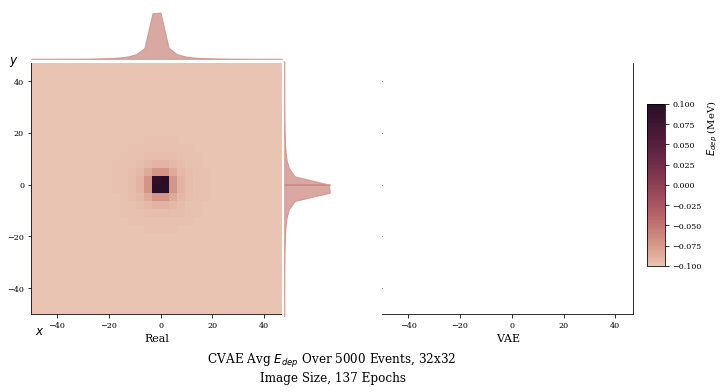

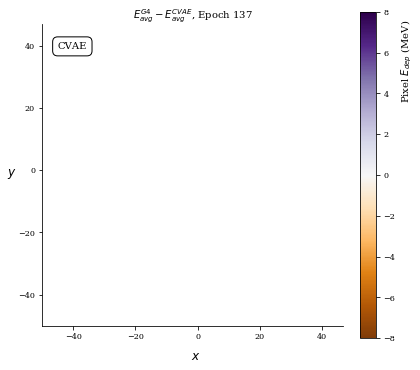

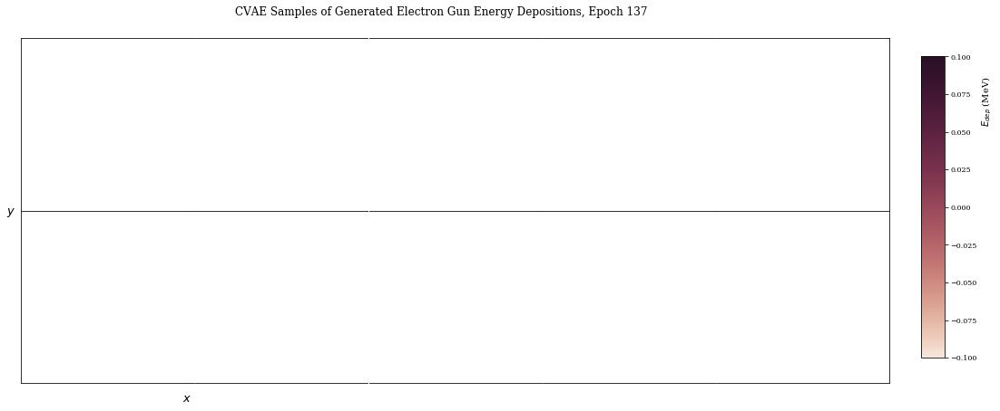

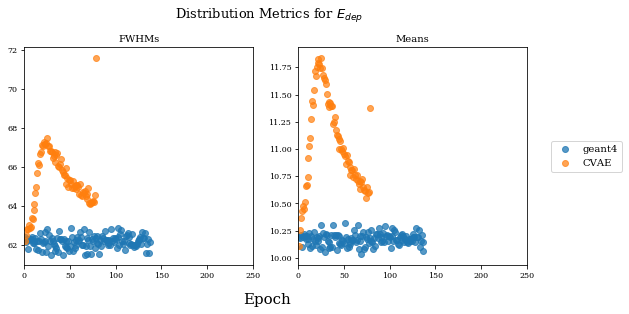

Train Epoch: 137 [0/15000 (0%)]	Loss: nan
Train Epoch: 137 [6400/15000 (43%)]	Loss: nan
Train Epoch: 137 [12800/15000 (85%)]	Loss: nan
====> Epoch: 137 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 138 [0/15000 (0%)]	Loss: nan
Train Epoch: 138 [6400/15000 (43%)]	Loss: nan
Train Epoch: 138 [12800/15000 (85%)]	Loss: nan
====> Epoch: 138 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


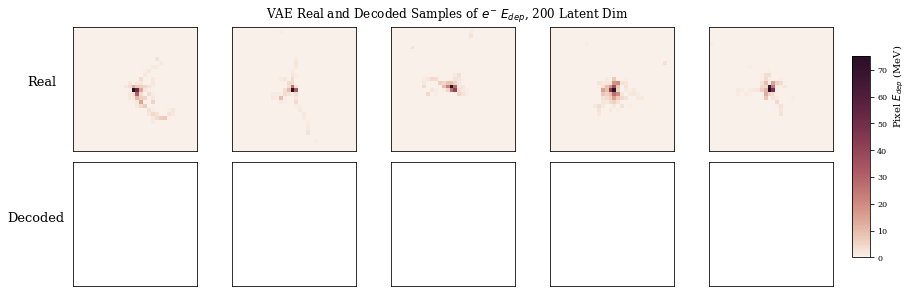

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


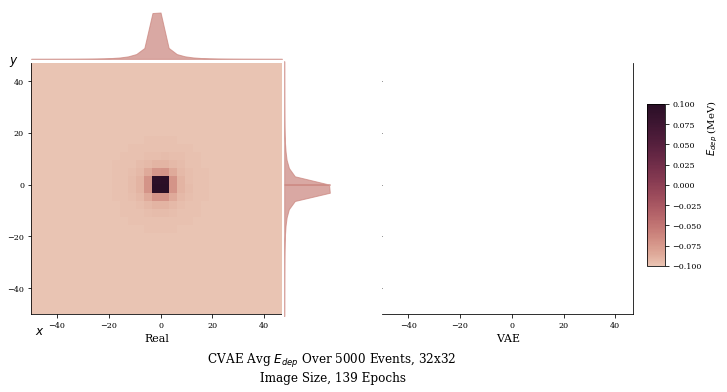

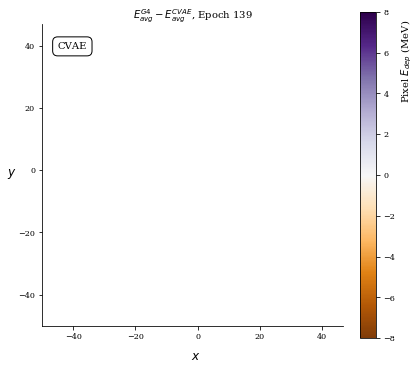

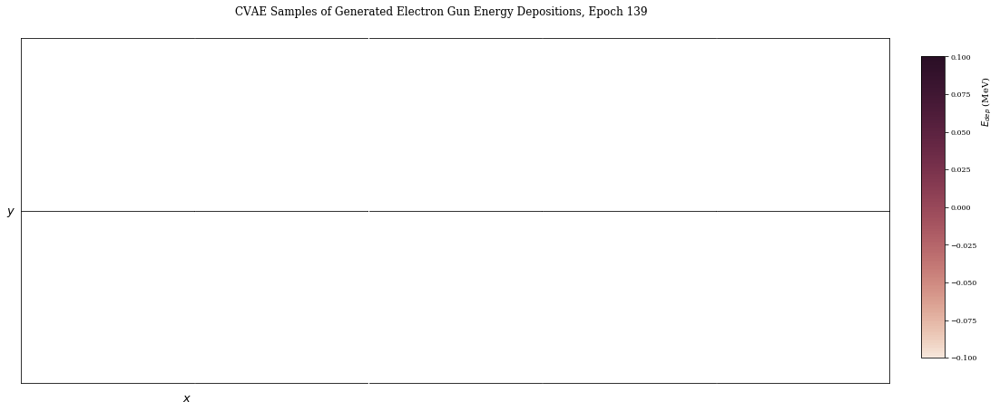

Train Epoch: 139 [0/15000 (0%)]	Loss: nan
Train Epoch: 139 [6400/15000 (43%)]	Loss: nan
Train Epoch: 139 [12800/15000 (85%)]	Loss: nan
====> Epoch: 139 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 140 [0/15000 (0%)]	Loss: nan
Train Epoch: 140 [6400/15000 (43%)]	Loss: nan
Train Epoch: 140 [12800/15000 (85%)]	Loss: nan
====> Epoch: 140 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


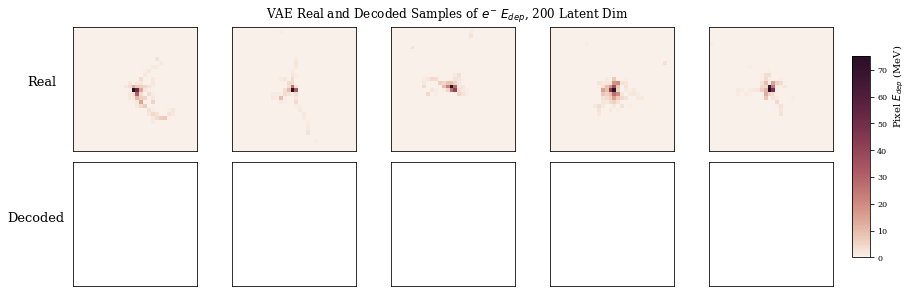

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


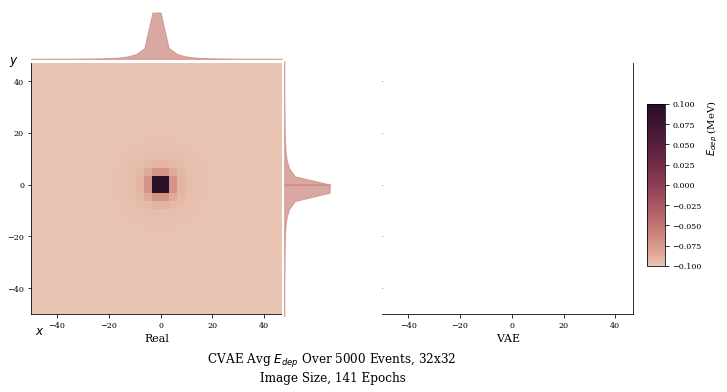

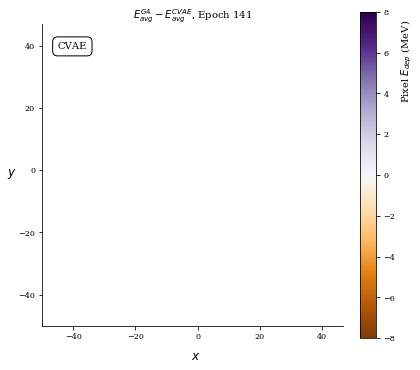

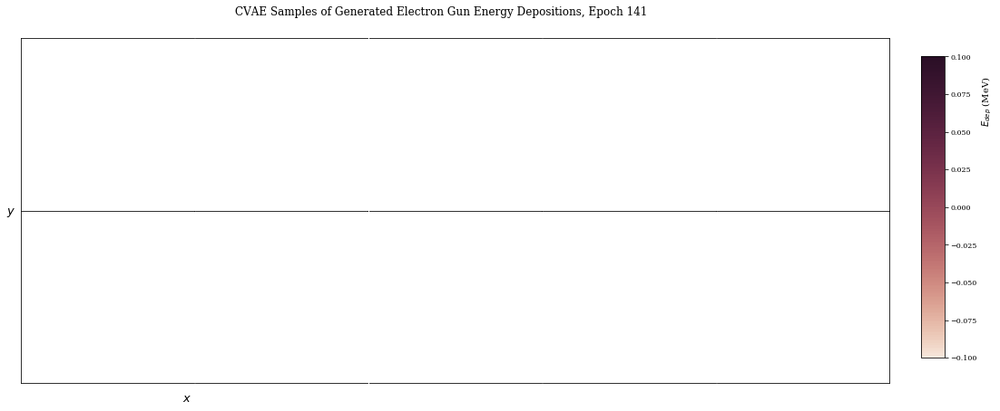

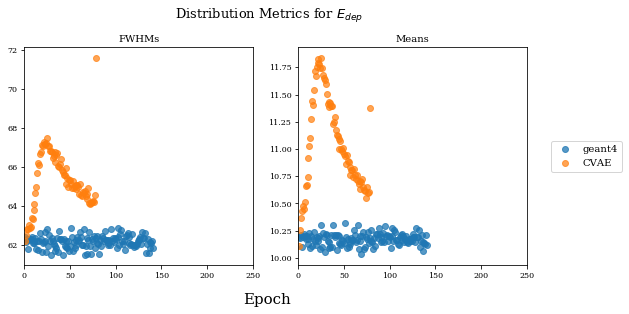

Train Epoch: 141 [0/15000 (0%)]	Loss: nan
Train Epoch: 141 [6400/15000 (43%)]	Loss: nan
Train Epoch: 141 [12800/15000 (85%)]	Loss: nan
====> Epoch: 141 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 142 [0/15000 (0%)]	Loss: nan
Train Epoch: 142 [6400/15000 (43%)]	Loss: nan
Train Epoch: 142 [12800/15000 (85%)]	Loss: nan
====> Epoch: 142 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


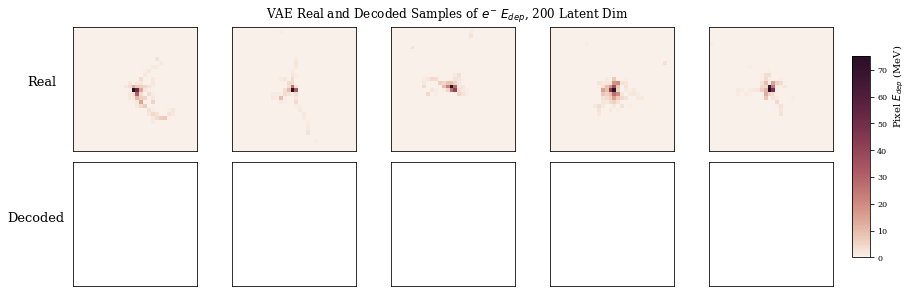

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


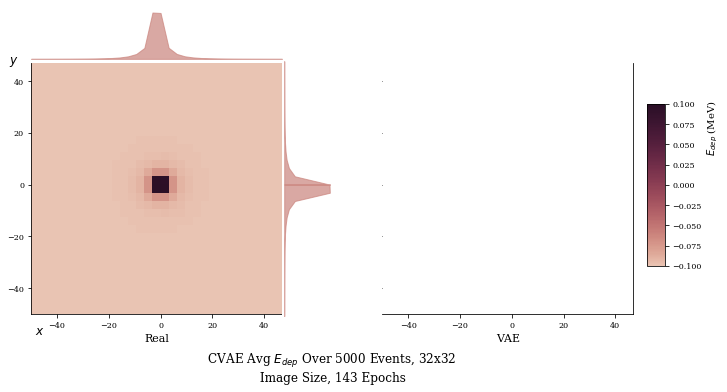

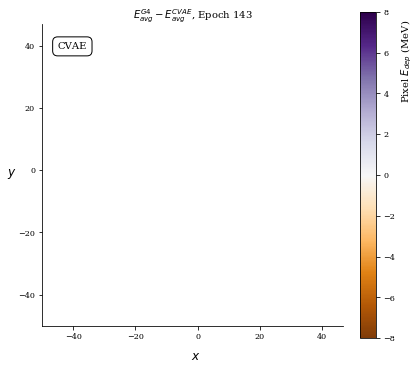

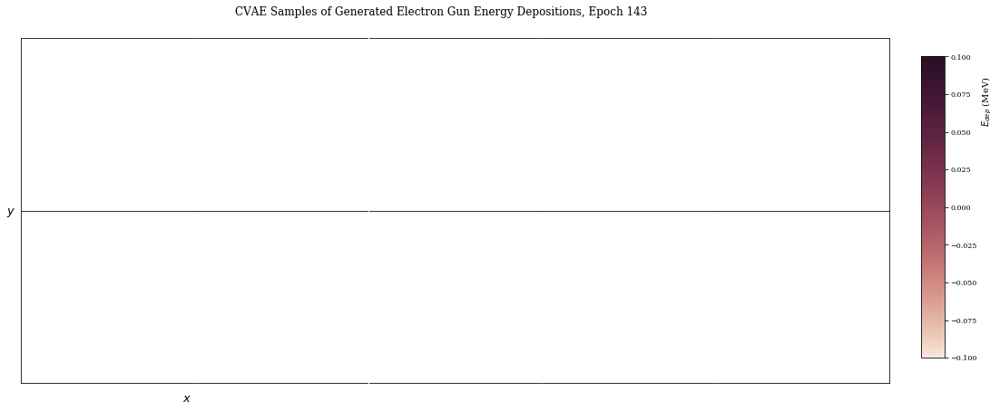

Train Epoch: 143 [0/15000 (0%)]	Loss: nan
Train Epoch: 143 [6400/15000 (43%)]	Loss: nan
Train Epoch: 143 [12800/15000 (85%)]	Loss: nan
====> Epoch: 143 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 144 [0/15000 (0%)]	Loss: nan
Train Epoch: 144 [6400/15000 (43%)]	Loss: nan
Train Epoch: 144 [12800/15000 (85%)]	Loss: nan
====> Epoch: 144 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


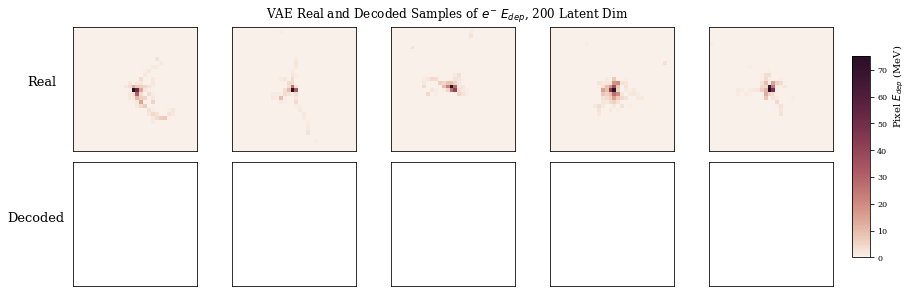

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


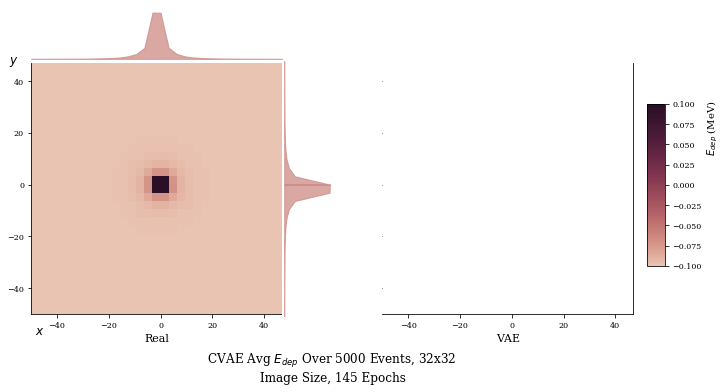

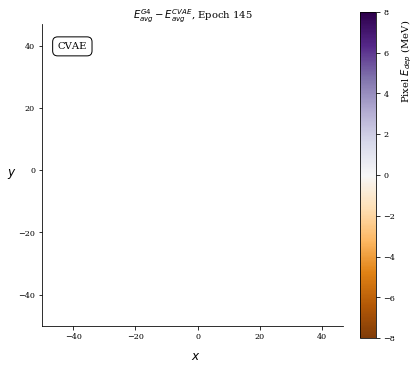

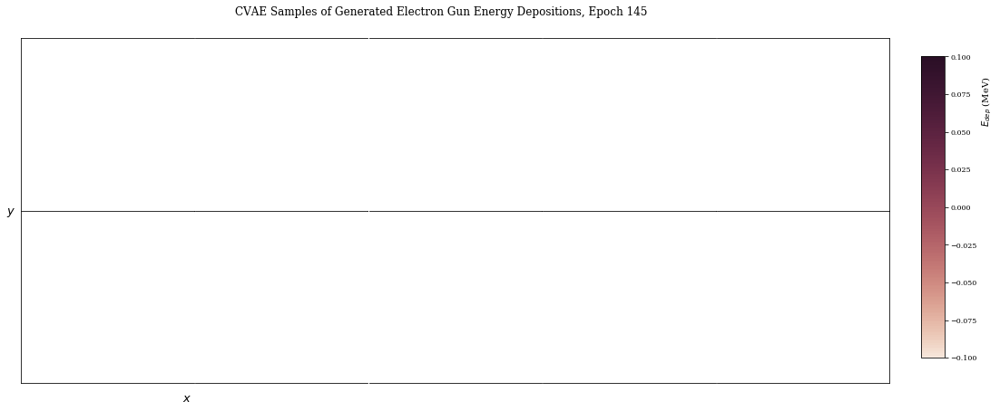

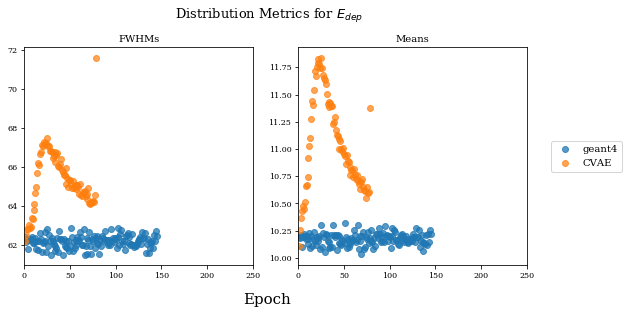

Train Epoch: 145 [0/15000 (0%)]	Loss: nan
Train Epoch: 145 [6400/15000 (43%)]	Loss: nan
Train Epoch: 145 [12800/15000 (85%)]	Loss: nan
====> Epoch: 145 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 146 [0/15000 (0%)]	Loss: nan
Train Epoch: 146 [6400/15000 (43%)]	Loss: nan
Train Epoch: 146 [12800/15000 (85%)]	Loss: nan
====> Epoch: 146 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


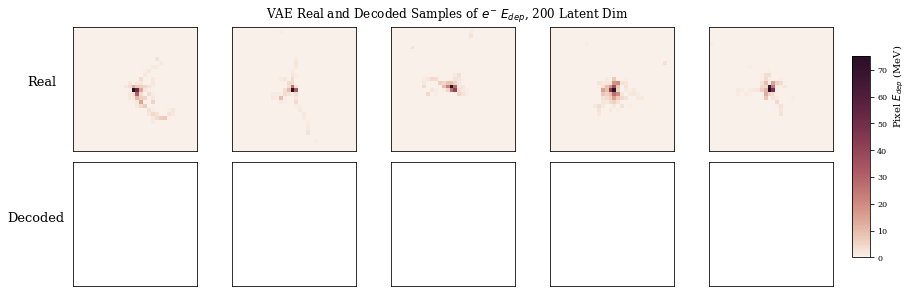

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


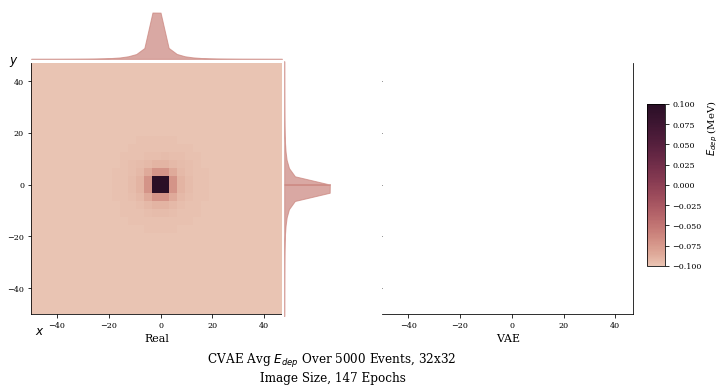

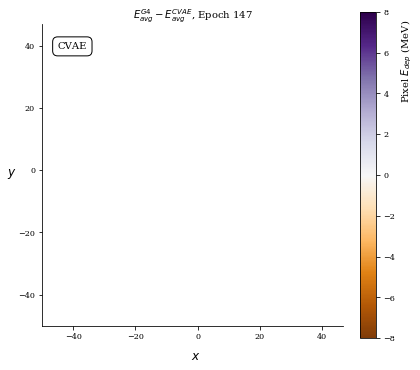

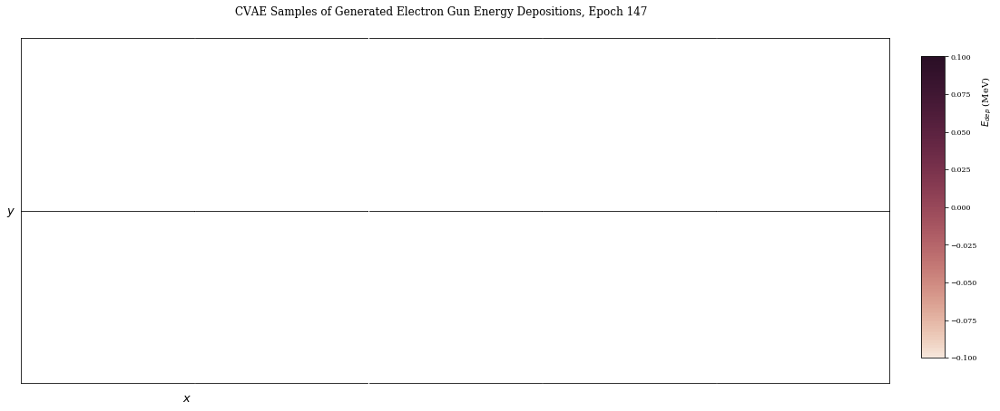

Train Epoch: 147 [0/15000 (0%)]	Loss: nan
Train Epoch: 147 [6400/15000 (43%)]	Loss: nan
Train Epoch: 147 [12800/15000 (85%)]	Loss: nan
====> Epoch: 147 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 148 [0/15000 (0%)]	Loss: nan
Train Epoch: 148 [6400/15000 (43%)]	Loss: nan
Train Epoch: 148 [12800/15000 (85%)]	Loss: nan
====> Epoch: 148 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


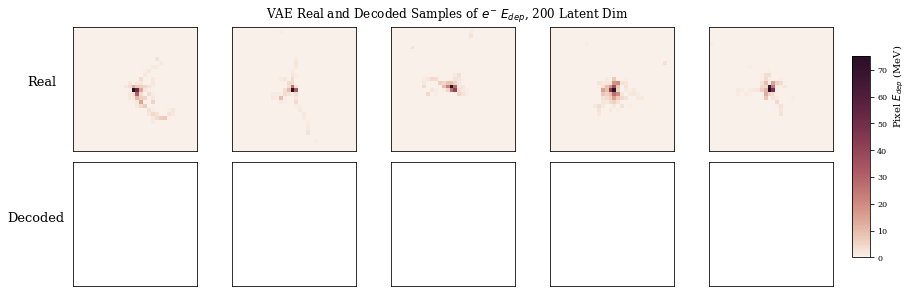

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


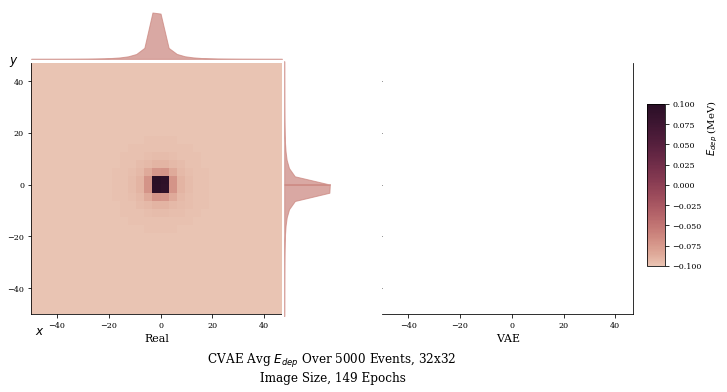

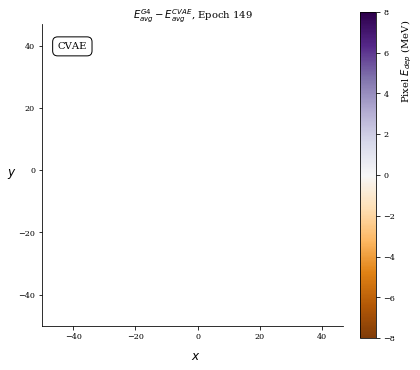

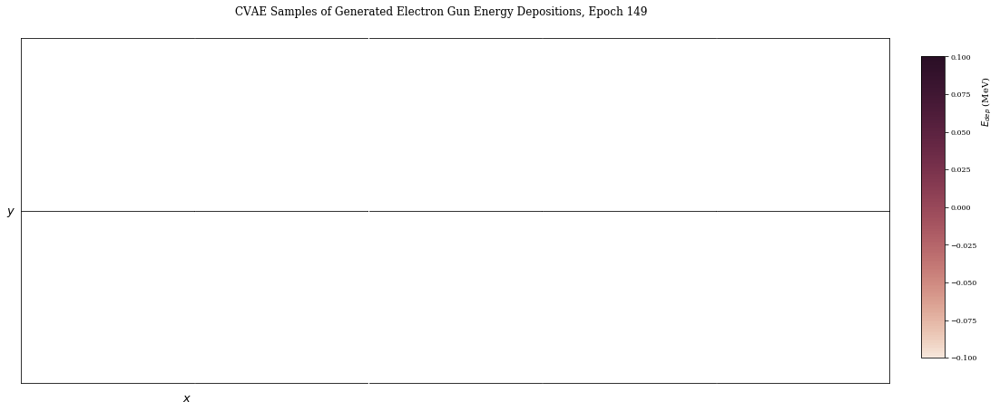

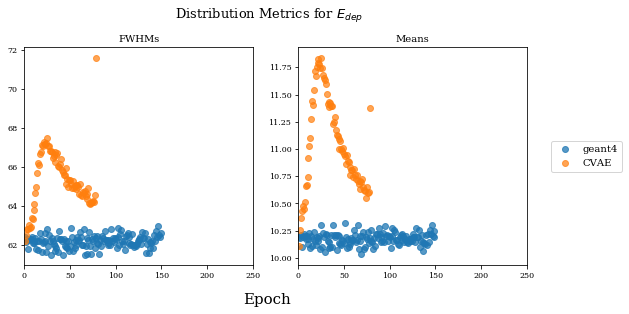

Train Epoch: 149 [0/15000 (0%)]	Loss: nan
Train Epoch: 149 [6400/15000 (43%)]	Loss: nan
Train Epoch: 149 [12800/15000 (85%)]	Loss: nan
====> Epoch: 149 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 150 [0/15000 (0%)]	Loss: nan
Train Epoch: 150 [6400/15000 (43%)]	Loss: nan
Train Epoch: 150 [12800/15000 (85%)]	Loss: nan
====> Epoch: 150 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


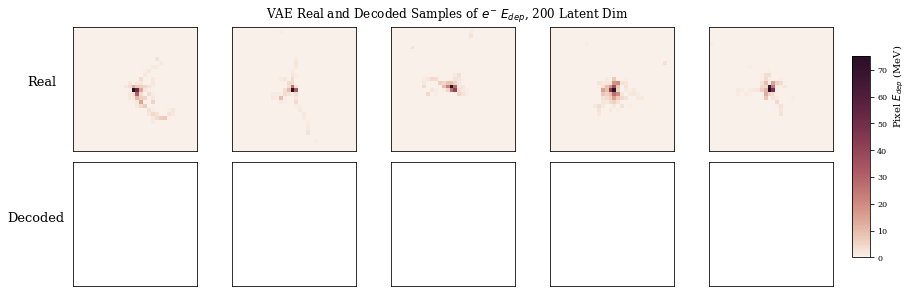

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


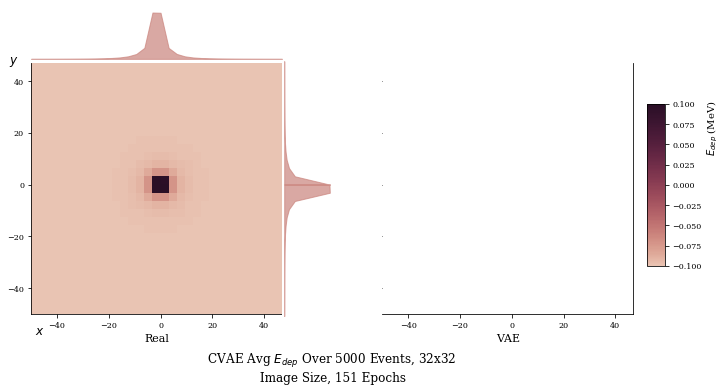

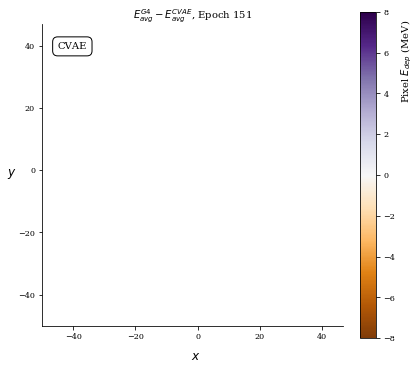

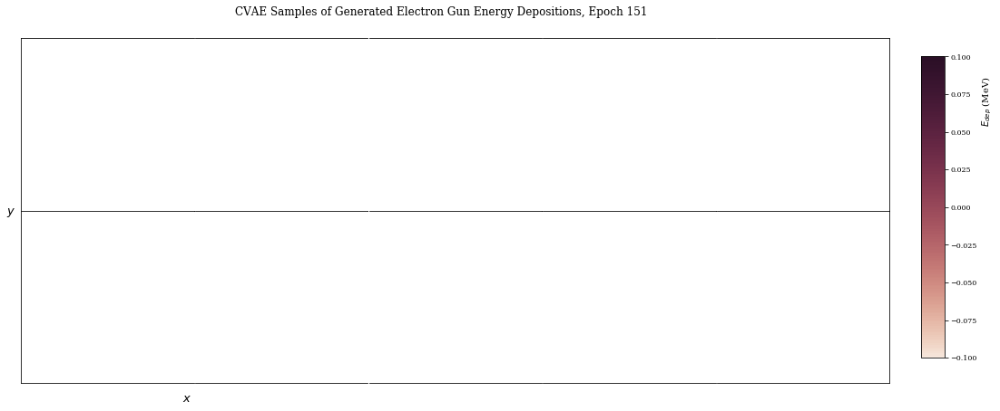

Train Epoch: 151 [0/15000 (0%)]	Loss: nan
Train Epoch: 151 [6400/15000 (43%)]	Loss: nan
Train Epoch: 151 [12800/15000 (85%)]	Loss: nan
====> Epoch: 151 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 152 [0/15000 (0%)]	Loss: nan
Train Epoch: 152 [6400/15000 (43%)]	Loss: nan
Train Epoch: 152 [12800/15000 (85%)]	Loss: nan
====> Epoch: 152 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


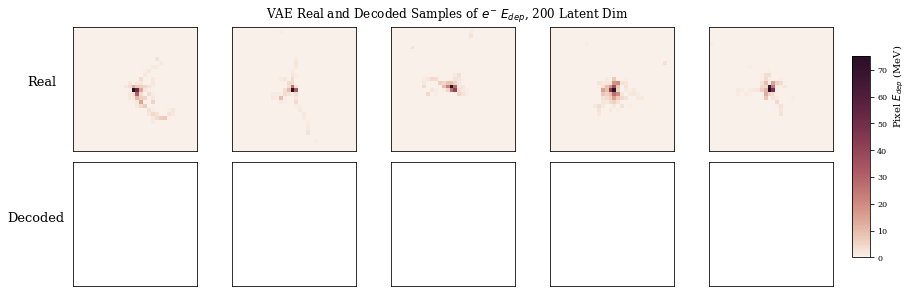

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


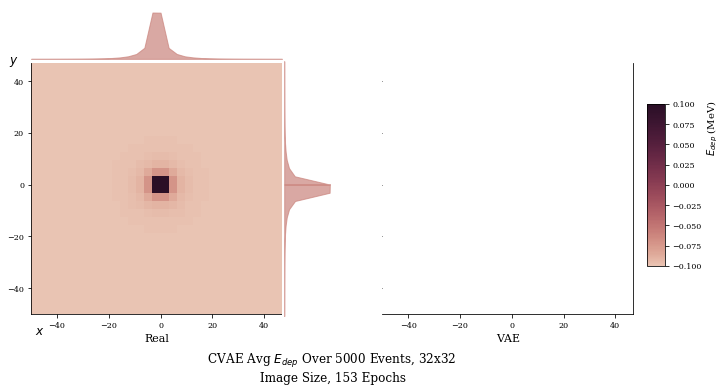

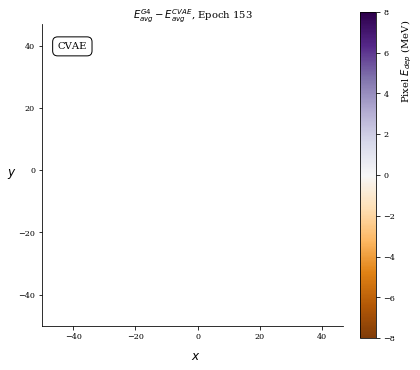

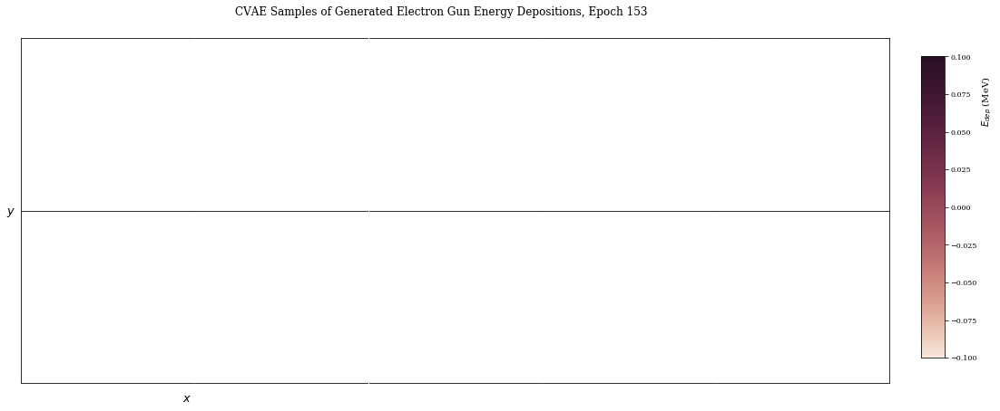

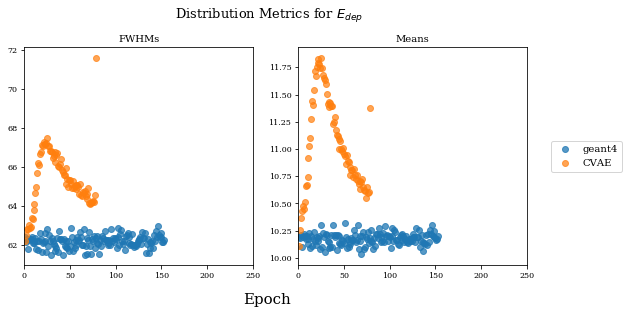

Train Epoch: 153 [0/15000 (0%)]	Loss: nan
Train Epoch: 153 [6400/15000 (43%)]	Loss: nan
Train Epoch: 153 [12800/15000 (85%)]	Loss: nan
====> Epoch: 153 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 154 [0/15000 (0%)]	Loss: nan
Train Epoch: 154 [6400/15000 (43%)]	Loss: nan
Train Epoch: 154 [12800/15000 (85%)]	Loss: nan
====> Epoch: 154 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


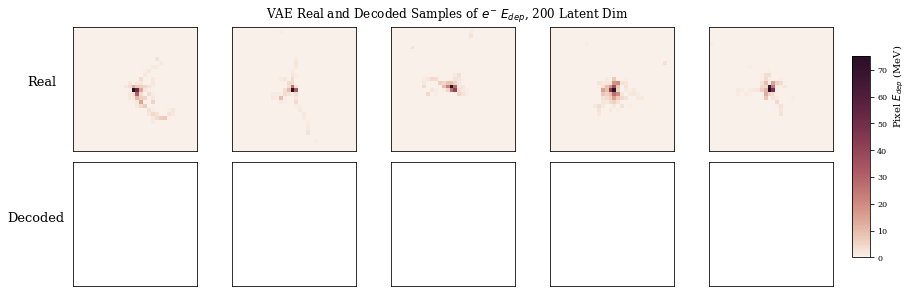

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


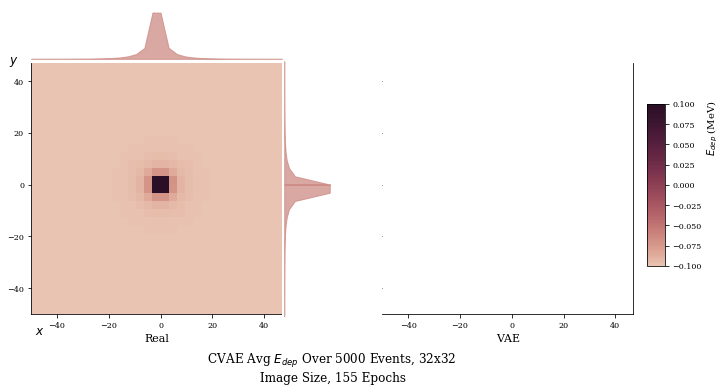

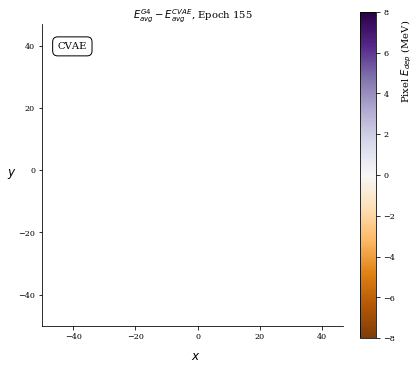

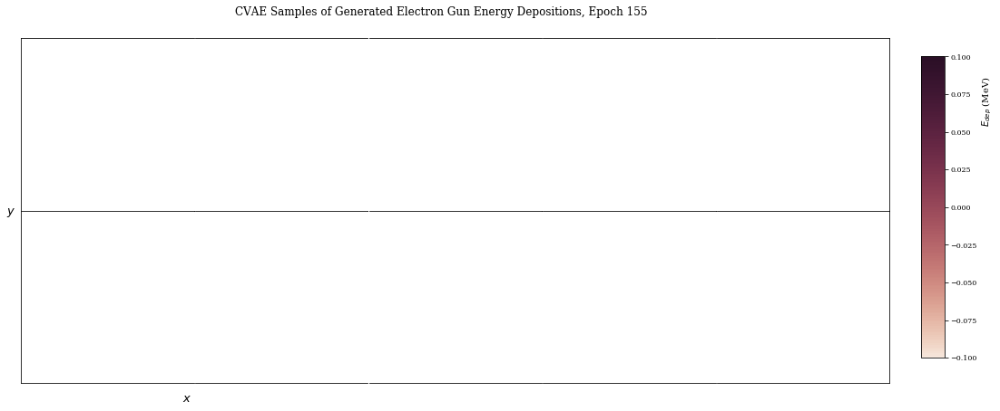

Train Epoch: 155 [0/15000 (0%)]	Loss: nan
Train Epoch: 155 [6400/15000 (43%)]	Loss: nan
Train Epoch: 155 [12800/15000 (85%)]	Loss: nan
====> Epoch: 155 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 156 [0/15000 (0%)]	Loss: nan
Train Epoch: 156 [6400/15000 (43%)]	Loss: nan
Train Epoch: 156 [12800/15000 (85%)]	Loss: nan
====> Epoch: 156 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


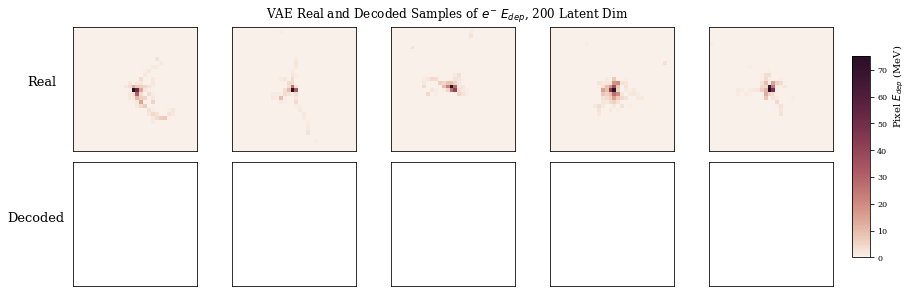

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


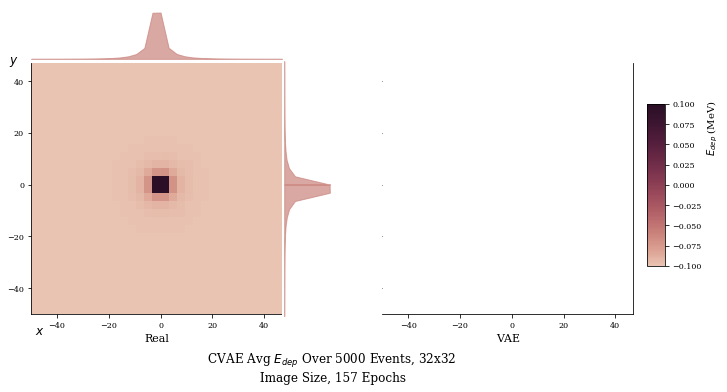

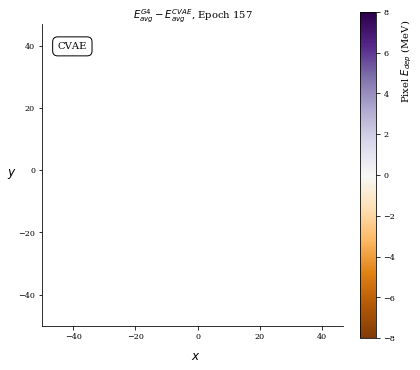

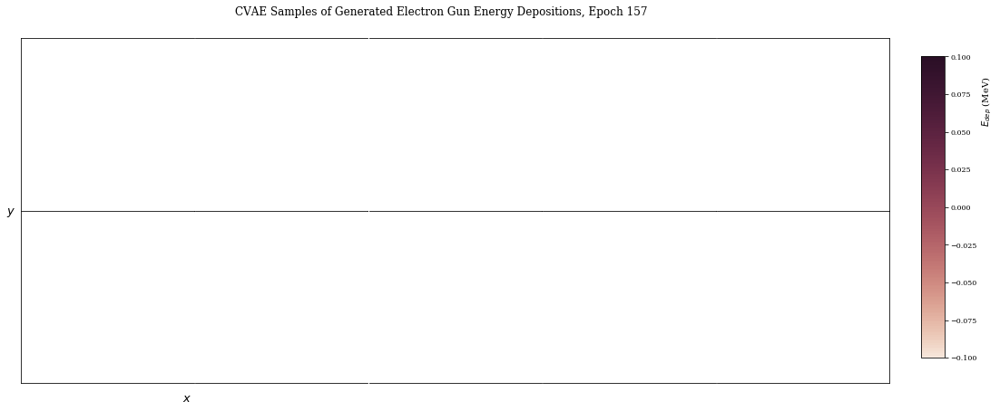

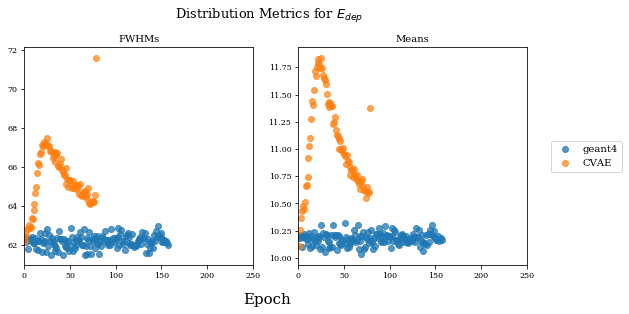

Train Epoch: 157 [0/15000 (0%)]	Loss: nan
Train Epoch: 157 [6400/15000 (43%)]	Loss: nan
Train Epoch: 157 [12800/15000 (85%)]	Loss: nan
====> Epoch: 157 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 158 [0/15000 (0%)]	Loss: nan
Train Epoch: 158 [6400/15000 (43%)]	Loss: nan
Train Epoch: 158 [12800/15000 (85%)]	Loss: nan
====> Epoch: 158 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


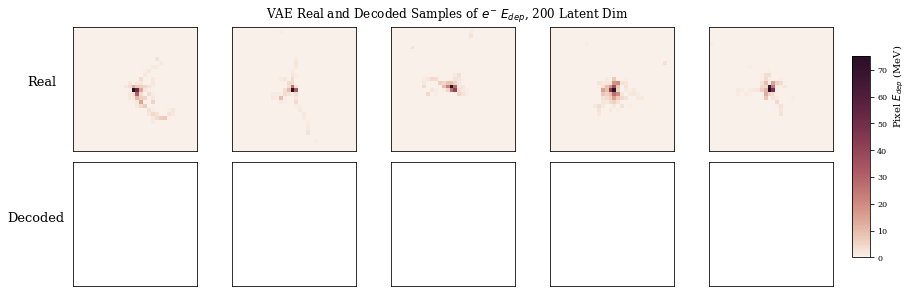

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


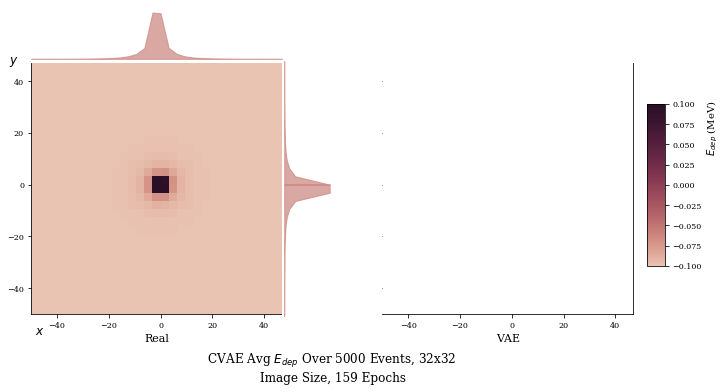

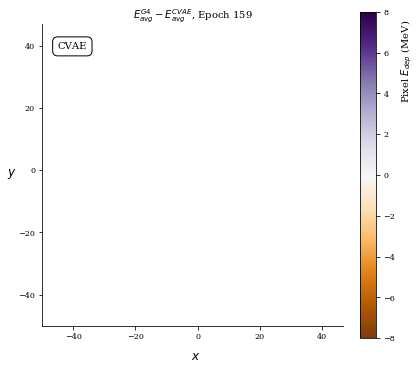

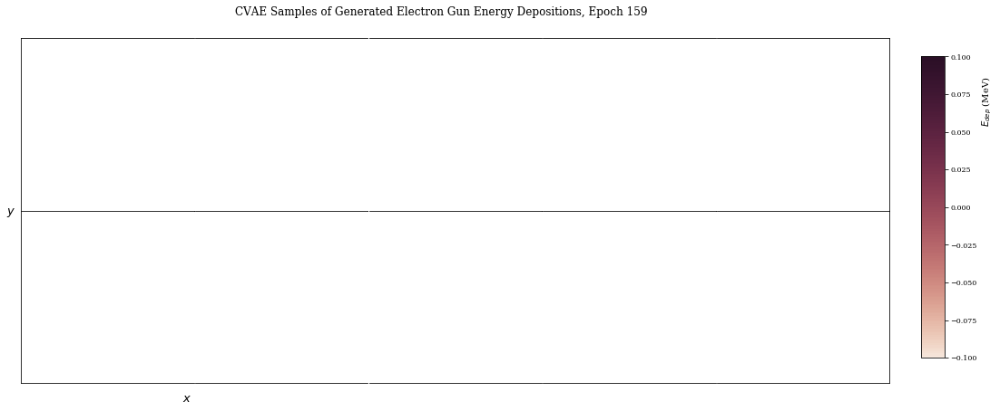

Train Epoch: 159 [0/15000 (0%)]	Loss: nan
Train Epoch: 159 [6400/15000 (43%)]	Loss: nan
Train Epoch: 159 [12800/15000 (85%)]	Loss: nan
====> Epoch: 159 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 160 [0/15000 (0%)]	Loss: nan
Train Epoch: 160 [6400/15000 (43%)]	Loss: nan
Train Epoch: 160 [12800/15000 (85%)]	Loss: nan
====> Epoch: 160 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


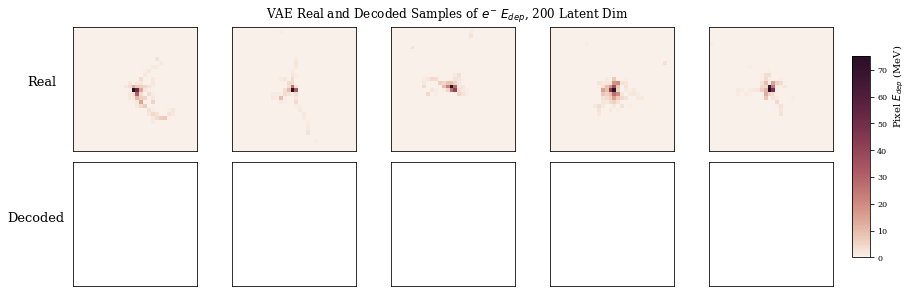

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


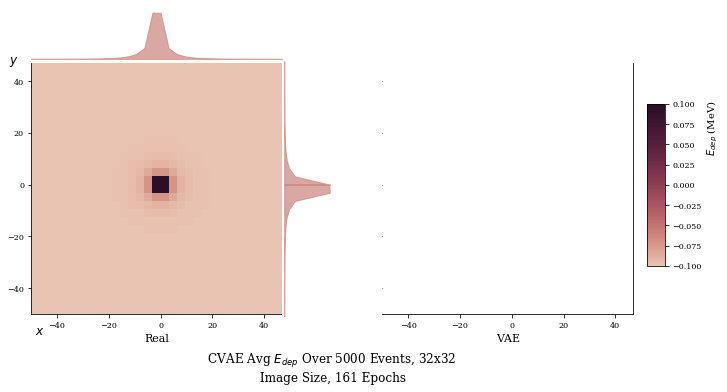

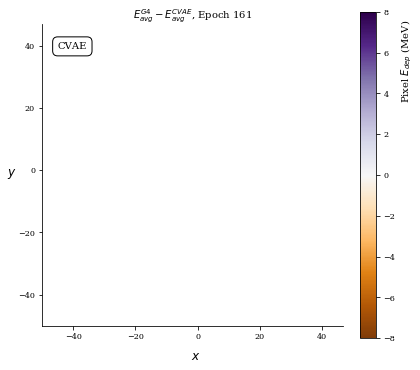

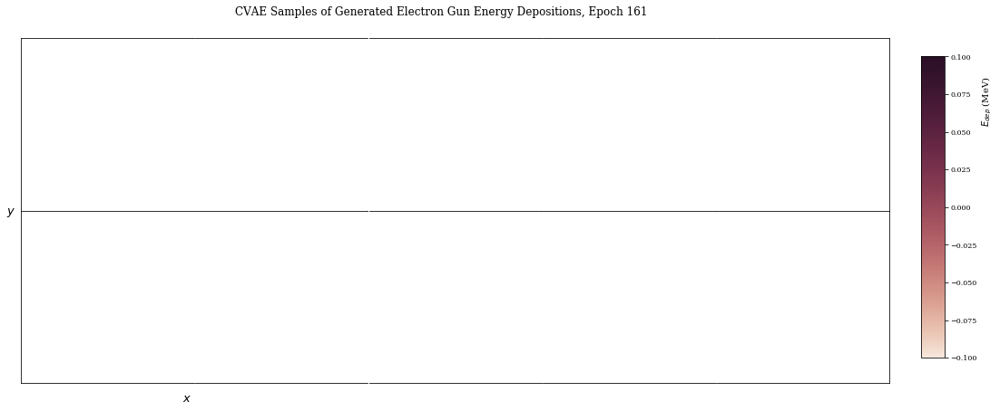

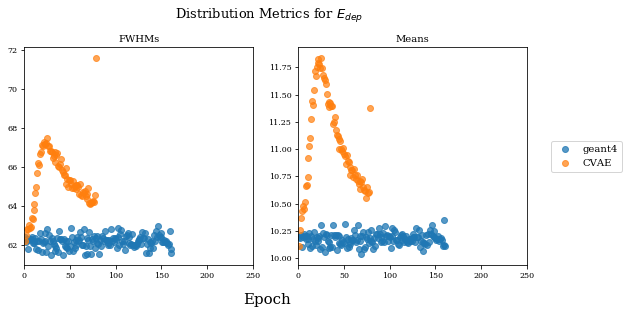

Train Epoch: 161 [0/15000 (0%)]	Loss: nan
Train Epoch: 161 [6400/15000 (43%)]	Loss: nan
Train Epoch: 161 [12800/15000 (85%)]	Loss: nan
====> Epoch: 161 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 162 [0/15000 (0%)]	Loss: nan
Train Epoch: 162 [6400/15000 (43%)]	Loss: nan
Train Epoch: 162 [12800/15000 (85%)]	Loss: nan
====> Epoch: 162 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


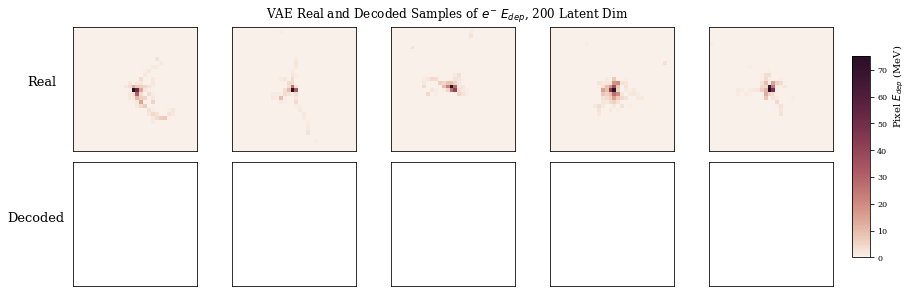

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


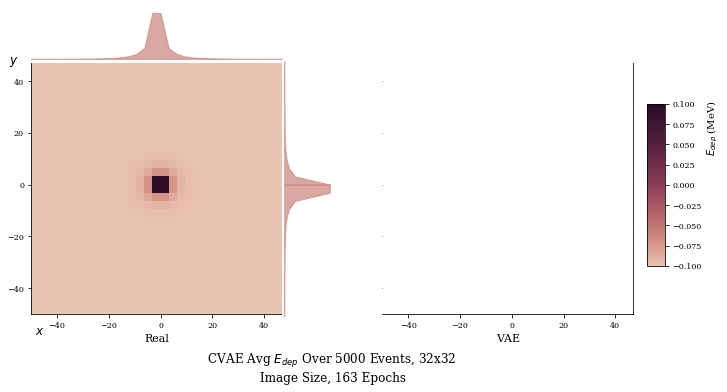

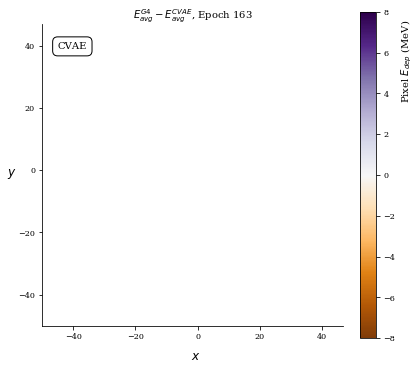

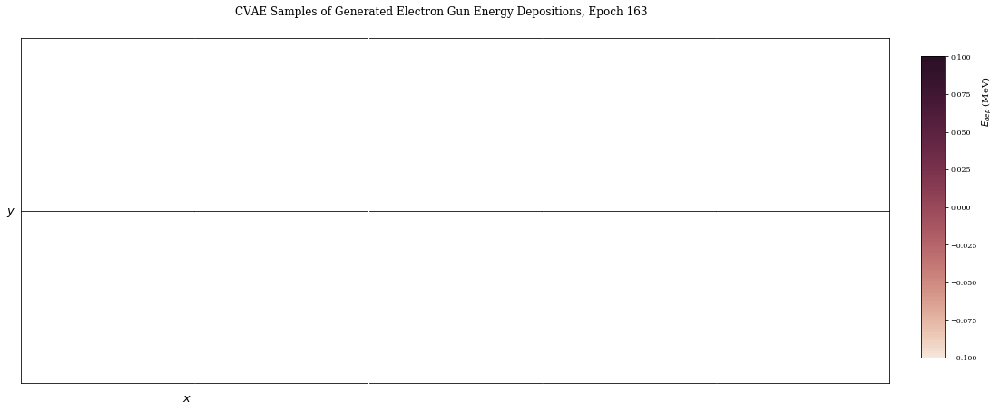

Train Epoch: 163 [0/15000 (0%)]	Loss: nan
Train Epoch: 163 [6400/15000 (43%)]	Loss: nan
Train Epoch: 163 [12800/15000 (85%)]	Loss: nan
====> Epoch: 163 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 164 [0/15000 (0%)]	Loss: nan
Train Epoch: 164 [6400/15000 (43%)]	Loss: nan
Train Epoch: 164 [12800/15000 (85%)]	Loss: nan
====> Epoch: 164 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


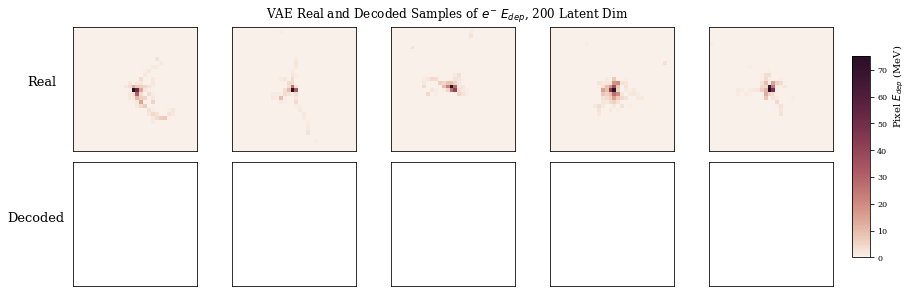

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


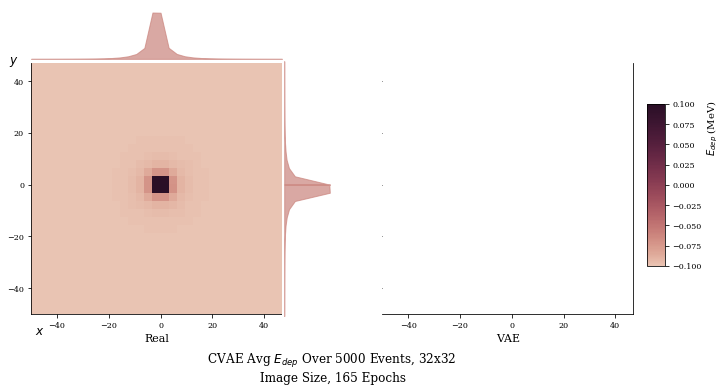

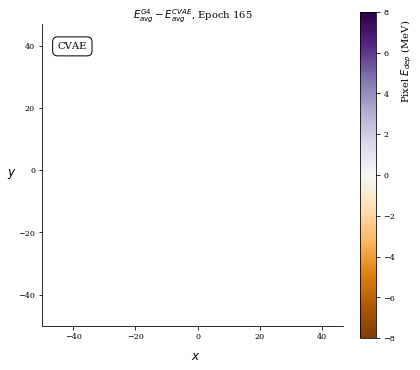

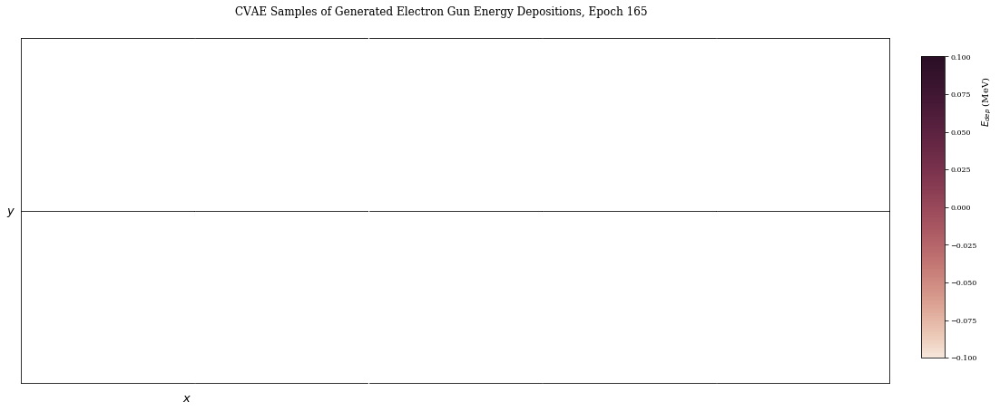

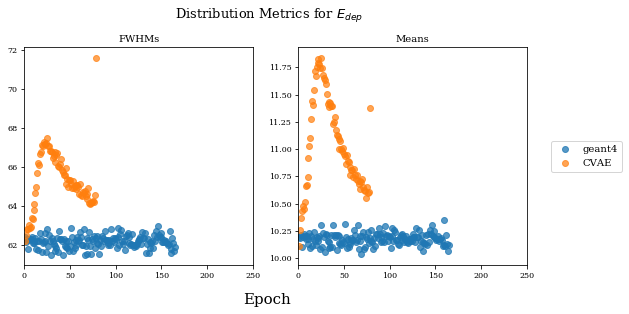

Train Epoch: 165 [0/15000 (0%)]	Loss: nan
Train Epoch: 165 [6400/15000 (43%)]	Loss: nan
Train Epoch: 165 [12800/15000 (85%)]	Loss: nan
====> Epoch: 165 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 166 [0/15000 (0%)]	Loss: nan
Train Epoch: 166 [6400/15000 (43%)]	Loss: nan
Train Epoch: 166 [12800/15000 (85%)]	Loss: nan
====> Epoch: 166 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


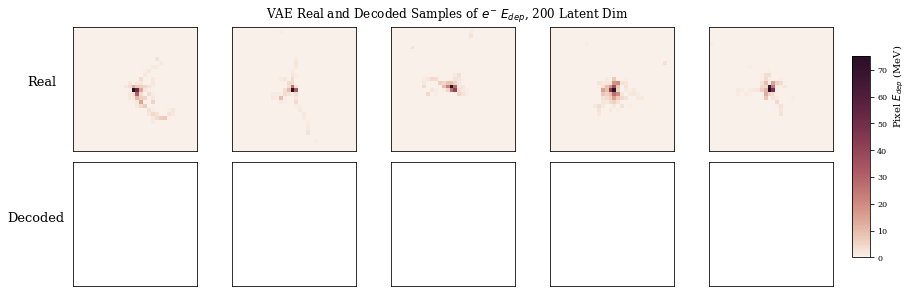

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


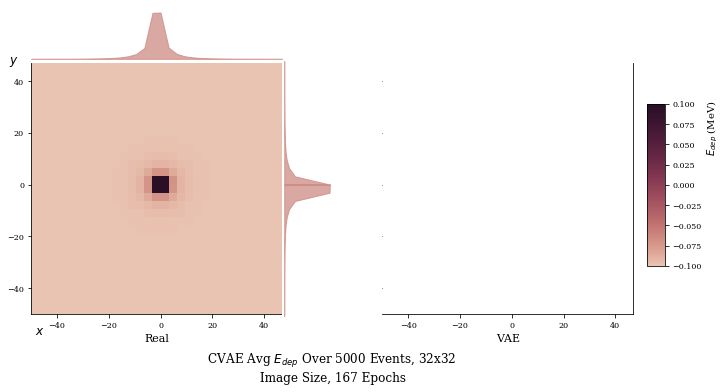

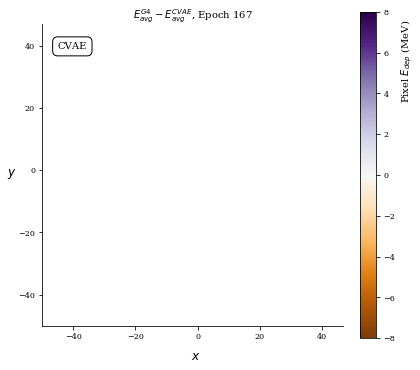

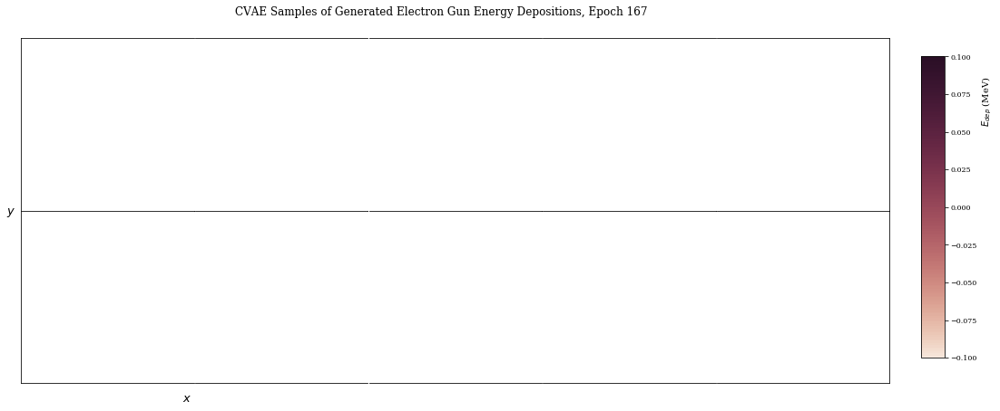

Train Epoch: 167 [0/15000 (0%)]	Loss: nan
Train Epoch: 167 [6400/15000 (43%)]	Loss: nan
Train Epoch: 167 [12800/15000 (85%)]	Loss: nan
====> Epoch: 167 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 168 [0/15000 (0%)]	Loss: nan
Train Epoch: 168 [6400/15000 (43%)]	Loss: nan
Train Epoch: 168 [12800/15000 (85%)]	Loss: nan
====> Epoch: 168 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


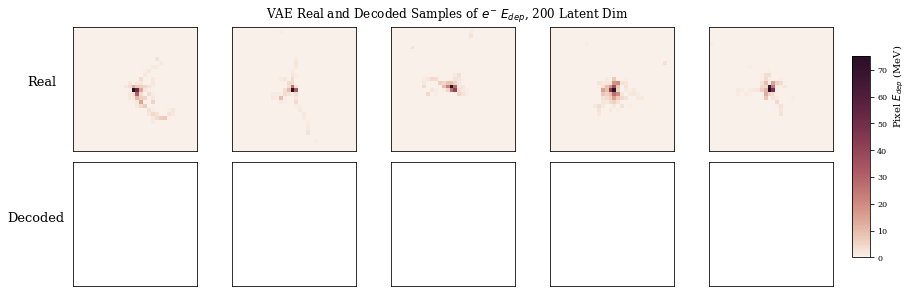

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


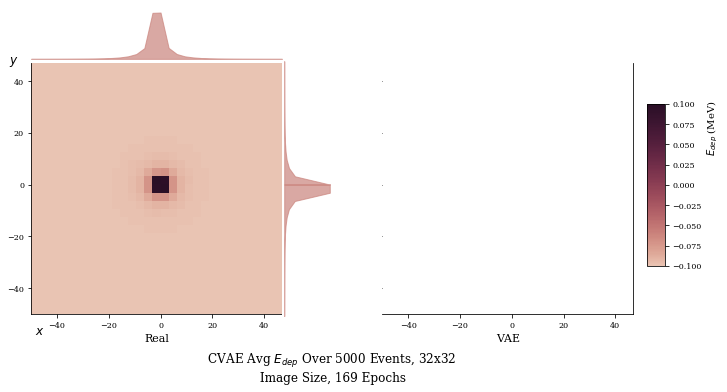

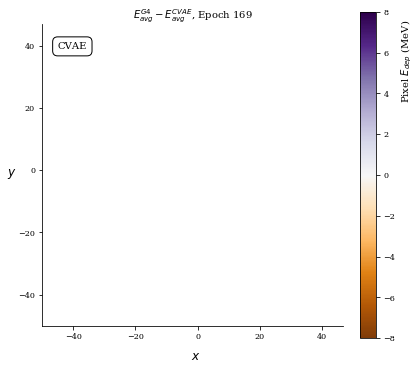

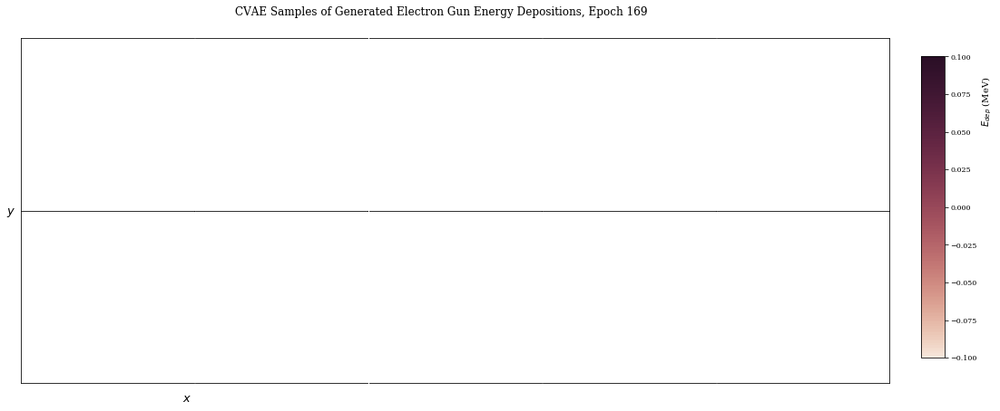

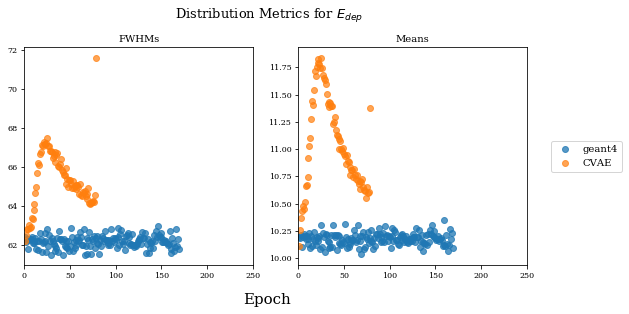

Train Epoch: 169 [0/15000 (0%)]	Loss: nan
Train Epoch: 169 [6400/15000 (43%)]	Loss: nan
Train Epoch: 169 [12800/15000 (85%)]	Loss: nan
====> Epoch: 169 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 170 [0/15000 (0%)]	Loss: nan
Train Epoch: 170 [6400/15000 (43%)]	Loss: nan
Train Epoch: 170 [12800/15000 (85%)]	Loss: nan
====> Epoch: 170 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


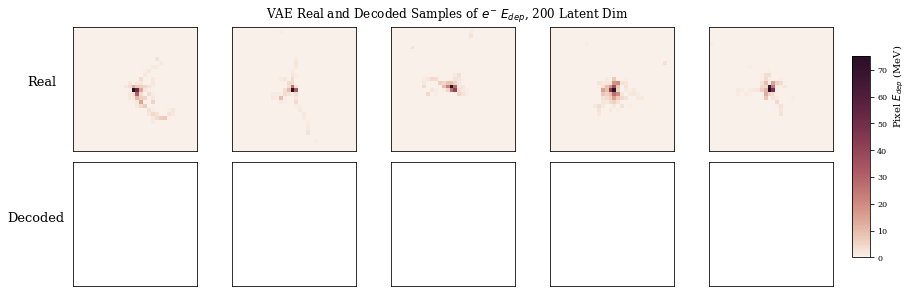

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


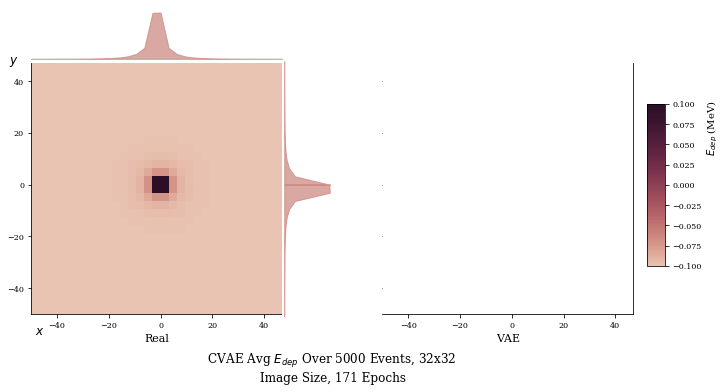

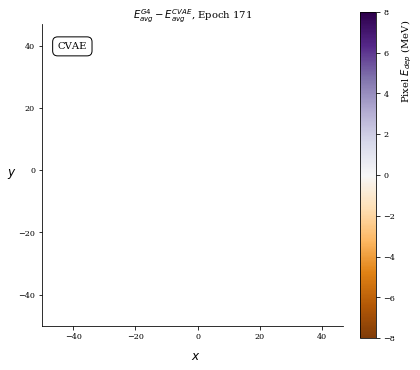

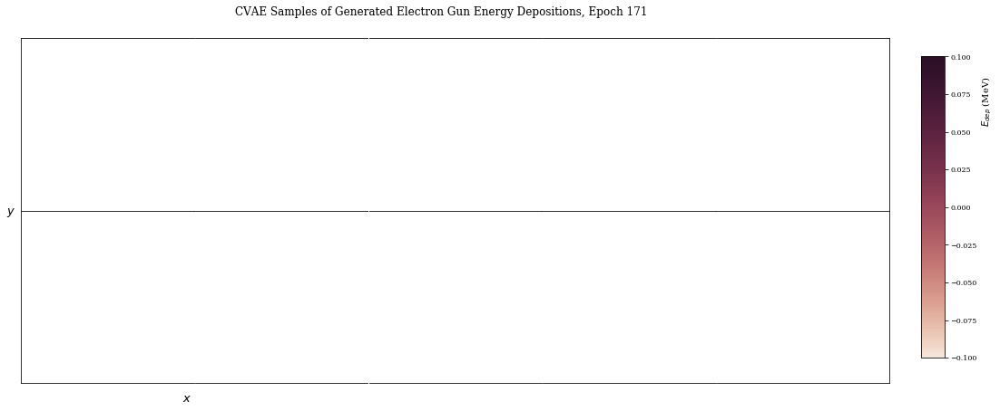

Train Epoch: 171 [0/15000 (0%)]	Loss: nan
Train Epoch: 171 [6400/15000 (43%)]	Loss: nan
Train Epoch: 171 [12800/15000 (85%)]	Loss: nan
====> Epoch: 171 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 172 [0/15000 (0%)]	Loss: nan
Train Epoch: 172 [6400/15000 (43%)]	Loss: nan
Train Epoch: 172 [12800/15000 (85%)]	Loss: nan
====> Epoch: 172 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


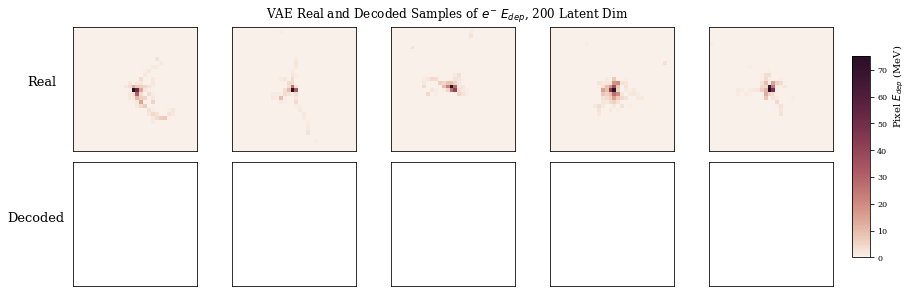

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


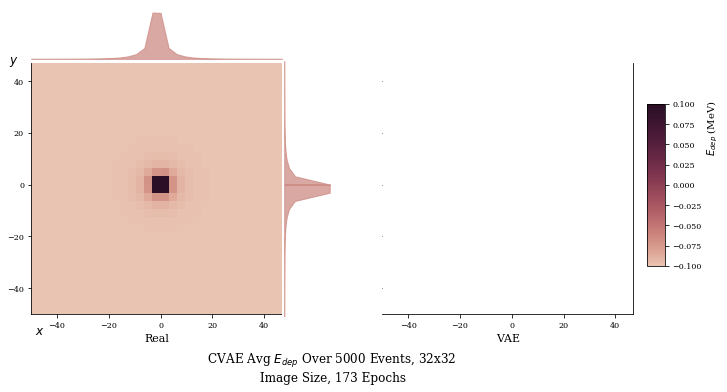

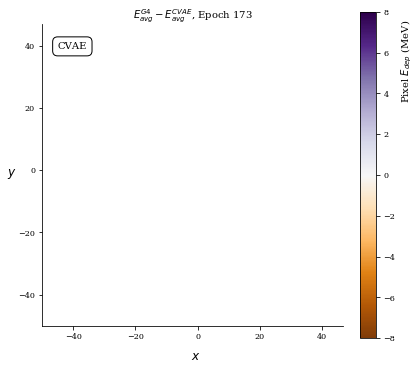

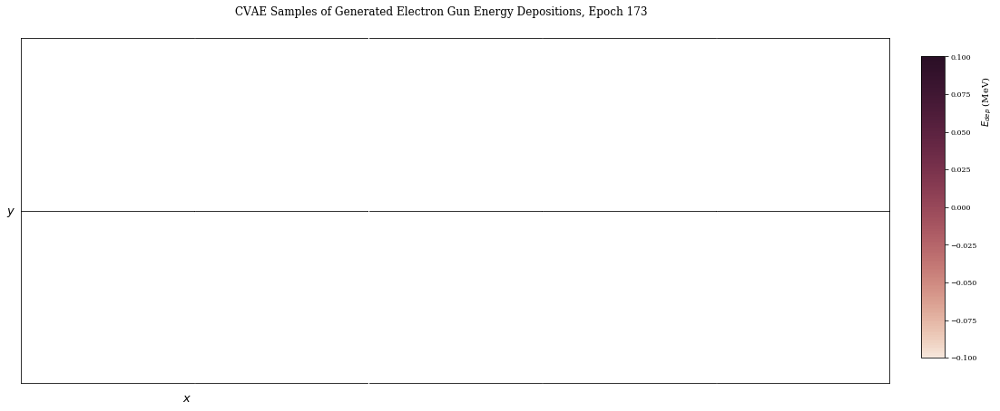

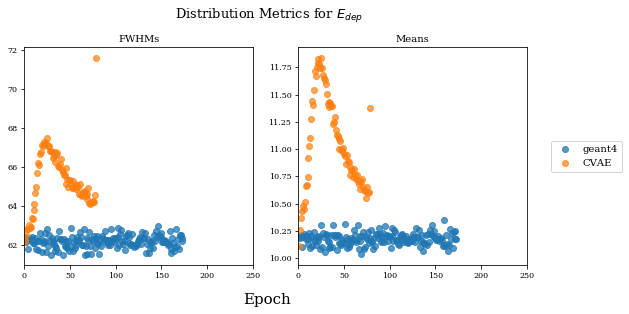

Train Epoch: 173 [0/15000 (0%)]	Loss: nan
Train Epoch: 173 [6400/15000 (43%)]	Loss: nan
Train Epoch: 173 [12800/15000 (85%)]	Loss: nan
====> Epoch: 173 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 174 [0/15000 (0%)]	Loss: nan
Train Epoch: 174 [6400/15000 (43%)]	Loss: nan
Train Epoch: 174 [12800/15000 (85%)]	Loss: nan
====> Epoch: 174 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


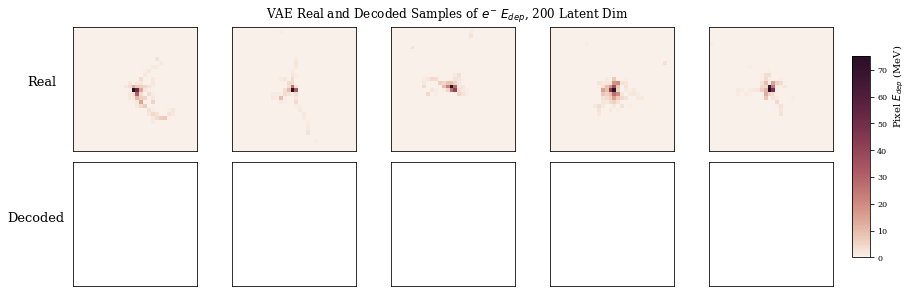

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


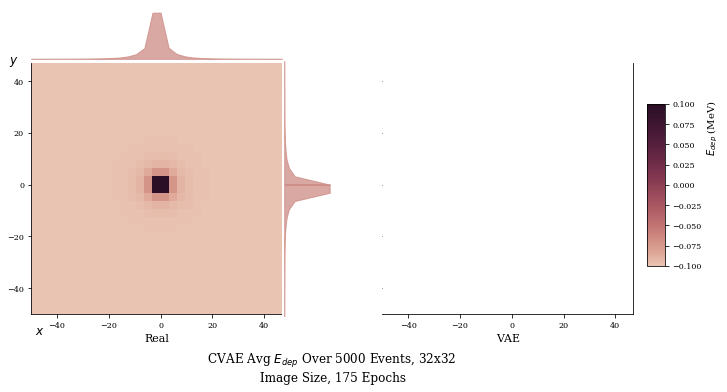

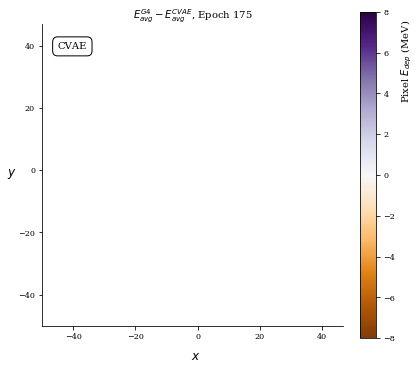

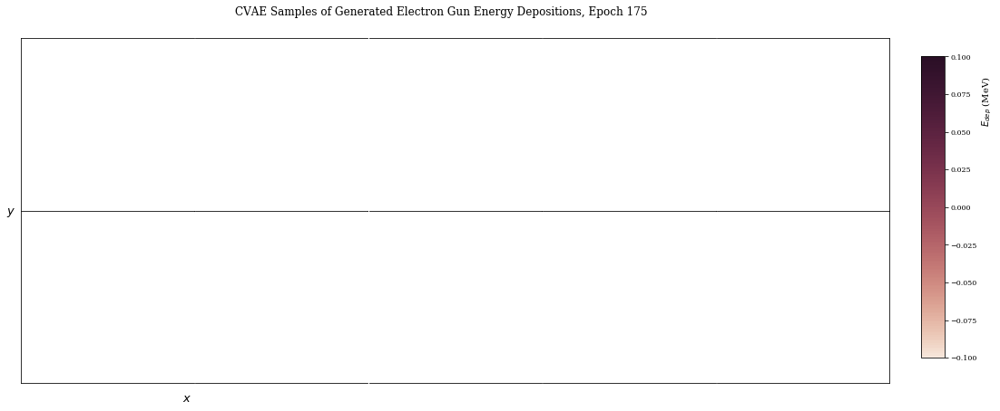

Train Epoch: 175 [0/15000 (0%)]	Loss: nan
Train Epoch: 175 [6400/15000 (43%)]	Loss: nan
Train Epoch: 175 [12800/15000 (85%)]	Loss: nan
====> Epoch: 175 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 176 [0/15000 (0%)]	Loss: nan
Train Epoch: 176 [6400/15000 (43%)]	Loss: nan
Train Epoch: 176 [12800/15000 (85%)]	Loss: nan
====> Epoch: 176 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


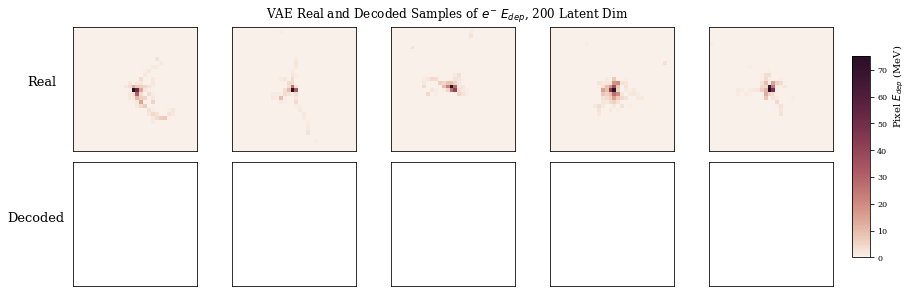

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


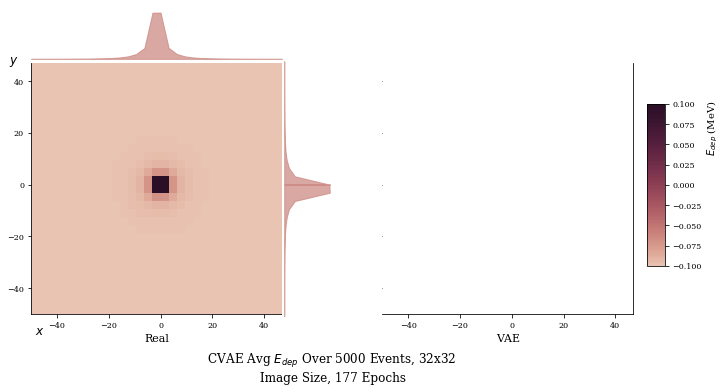

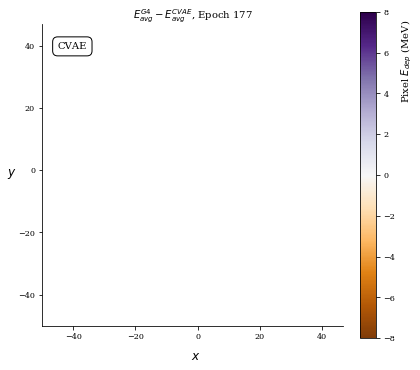

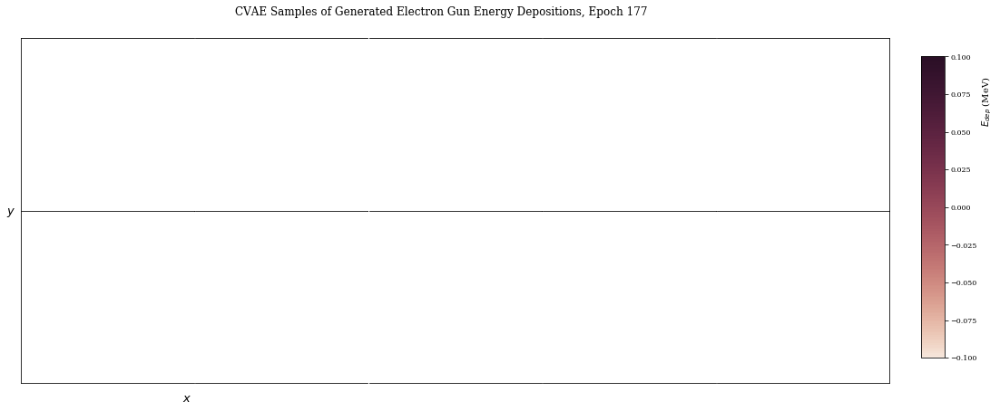

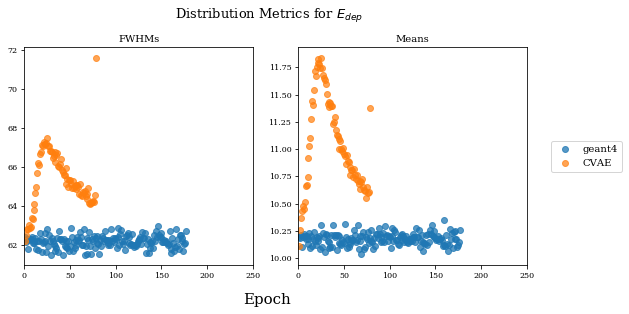

Train Epoch: 177 [0/15000 (0%)]	Loss: nan
Train Epoch: 177 [6400/15000 (43%)]	Loss: nan
Train Epoch: 177 [12800/15000 (85%)]	Loss: nan
====> Epoch: 177 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 178 [0/15000 (0%)]	Loss: nan
Train Epoch: 178 [6400/15000 (43%)]	Loss: nan
Train Epoch: 178 [12800/15000 (85%)]	Loss: nan
====> Epoch: 178 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


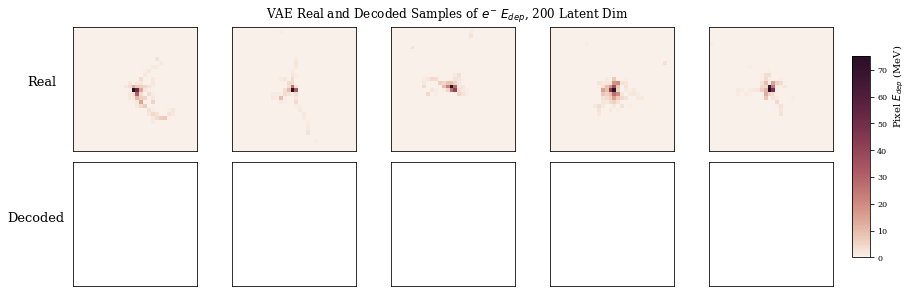

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


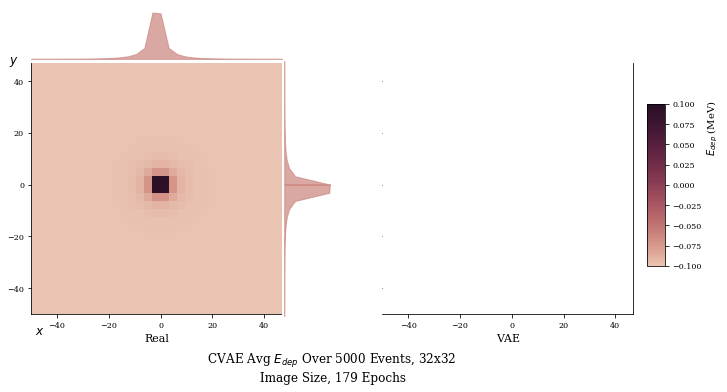

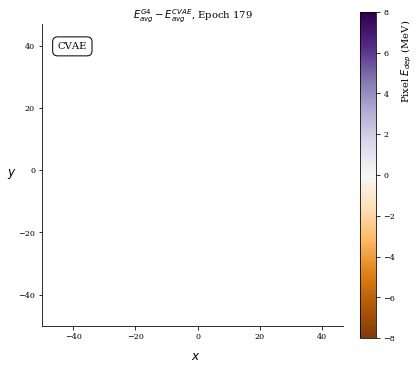

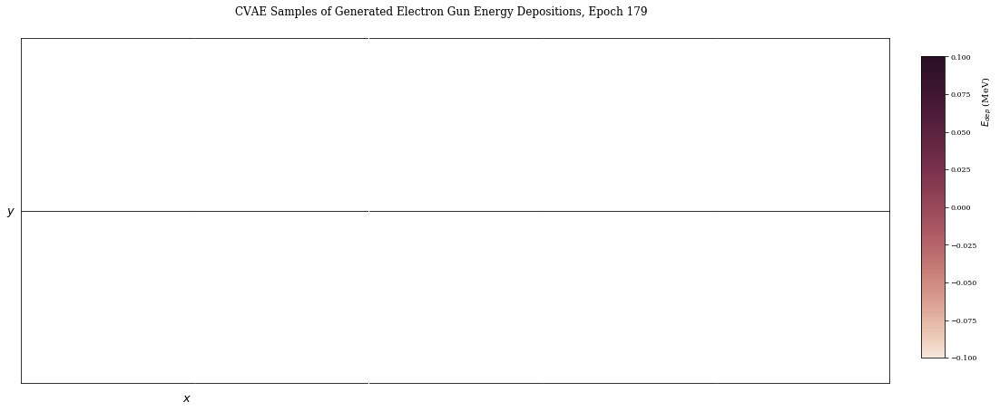

Train Epoch: 179 [0/15000 (0%)]	Loss: nan
Train Epoch: 179 [6400/15000 (43%)]	Loss: nan
Train Epoch: 179 [12800/15000 (85%)]	Loss: nan
====> Epoch: 179 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 180 [0/15000 (0%)]	Loss: nan
Train Epoch: 180 [6400/15000 (43%)]	Loss: nan
Train Epoch: 180 [12800/15000 (85%)]	Loss: nan
====> Epoch: 180 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


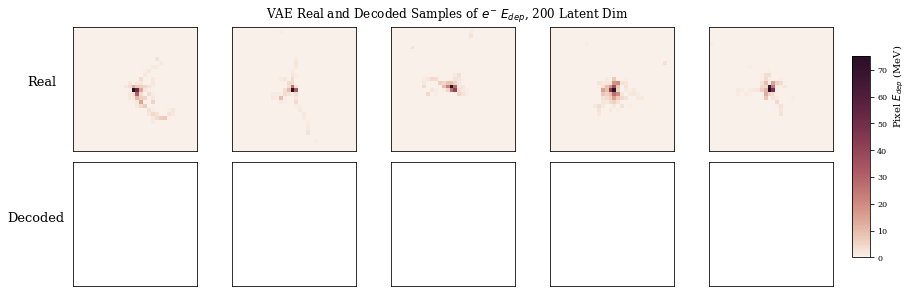

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


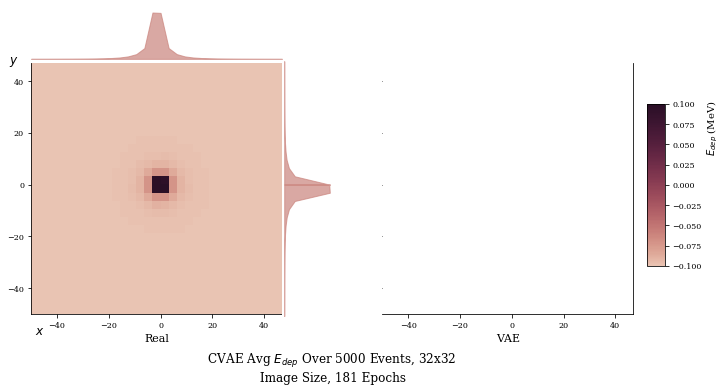

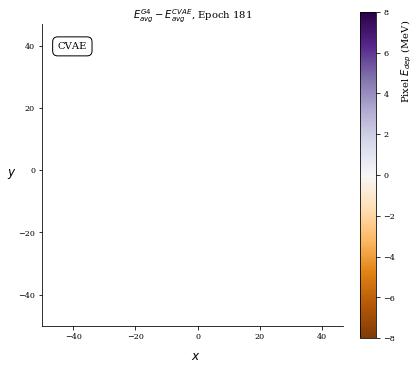

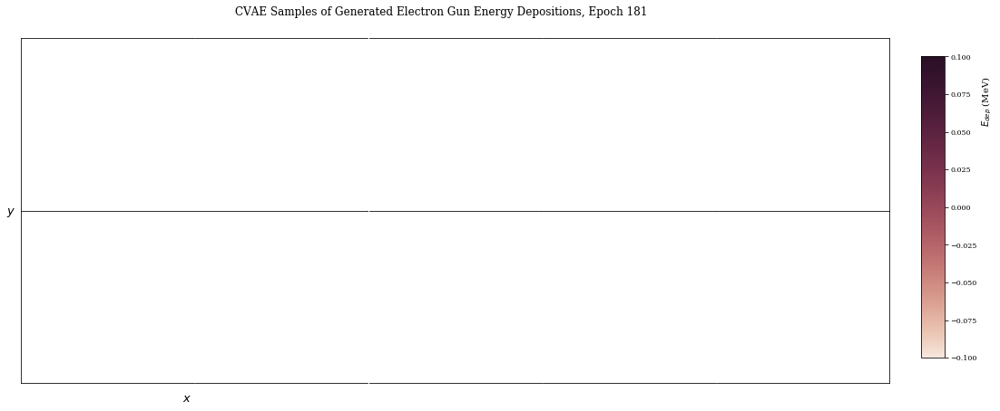

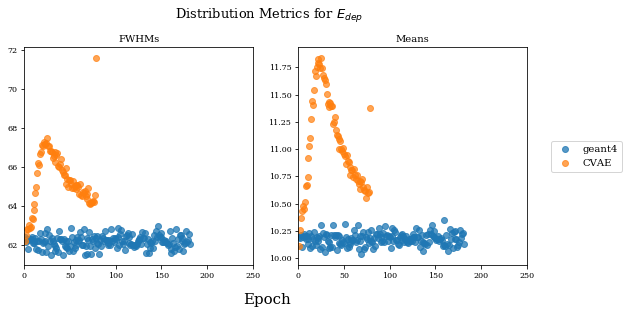

Train Epoch: 181 [0/15000 (0%)]	Loss: nan
Train Epoch: 181 [6400/15000 (43%)]	Loss: nan
Train Epoch: 181 [12800/15000 (85%)]	Loss: nan
====> Epoch: 181 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 182 [0/15000 (0%)]	Loss: nan
Train Epoch: 182 [6400/15000 (43%)]	Loss: nan
Train Epoch: 182 [12800/15000 (85%)]	Loss: nan
====> Epoch: 182 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


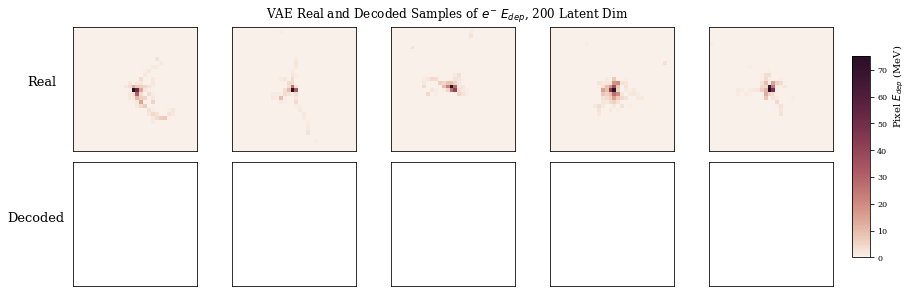

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


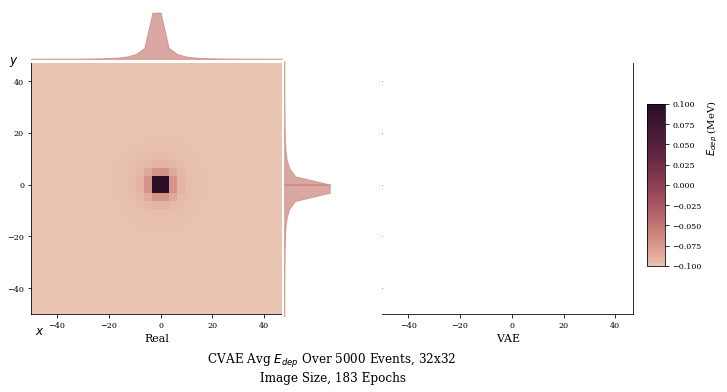

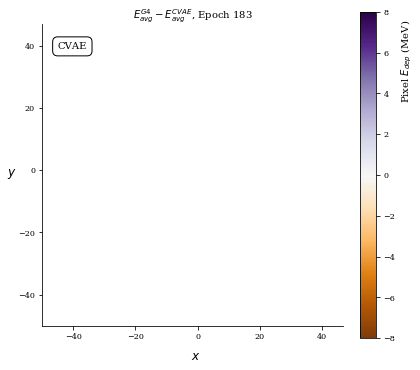

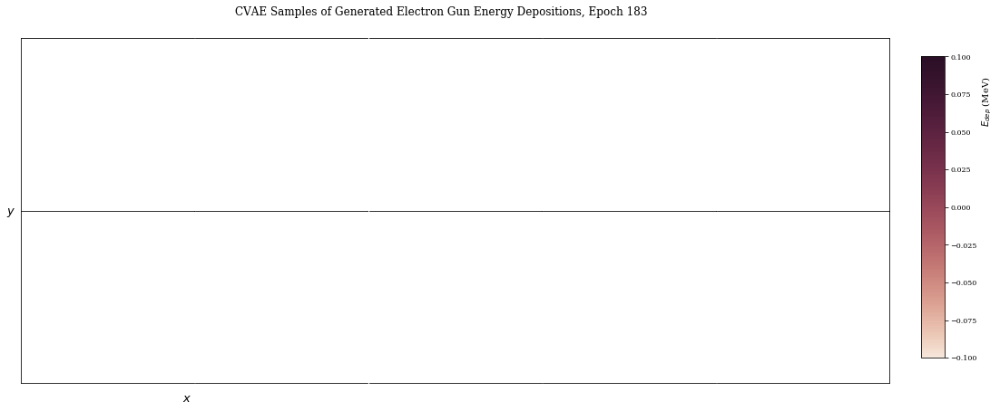

Train Epoch: 183 [0/15000 (0%)]	Loss: nan
Train Epoch: 183 [6400/15000 (43%)]	Loss: nan
Train Epoch: 183 [12800/15000 (85%)]	Loss: nan
====> Epoch: 183 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 184 [0/15000 (0%)]	Loss: nan
Train Epoch: 184 [6400/15000 (43%)]	Loss: nan
Train Epoch: 184 [12800/15000 (85%)]	Loss: nan
====> Epoch: 184 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


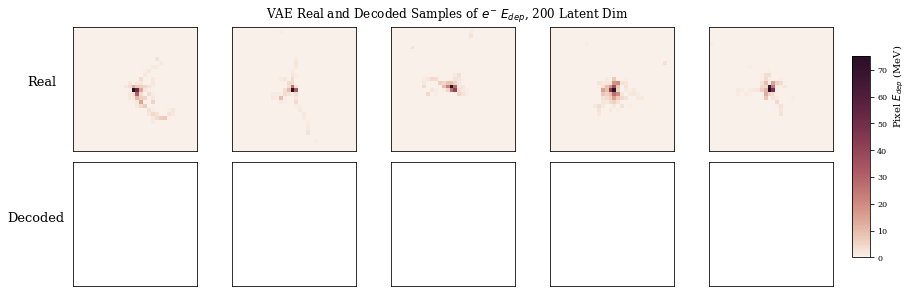

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


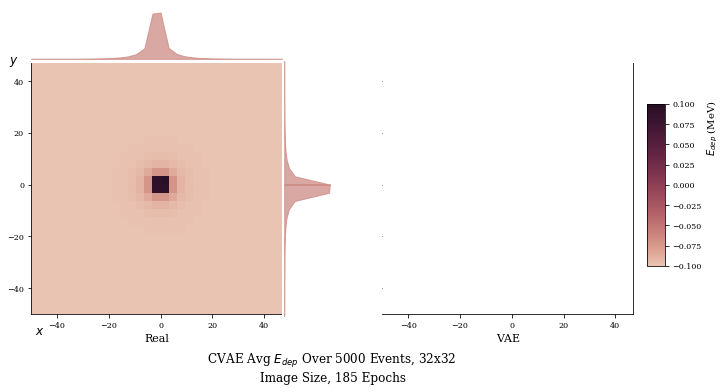

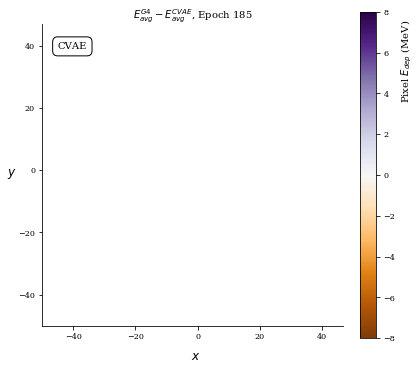

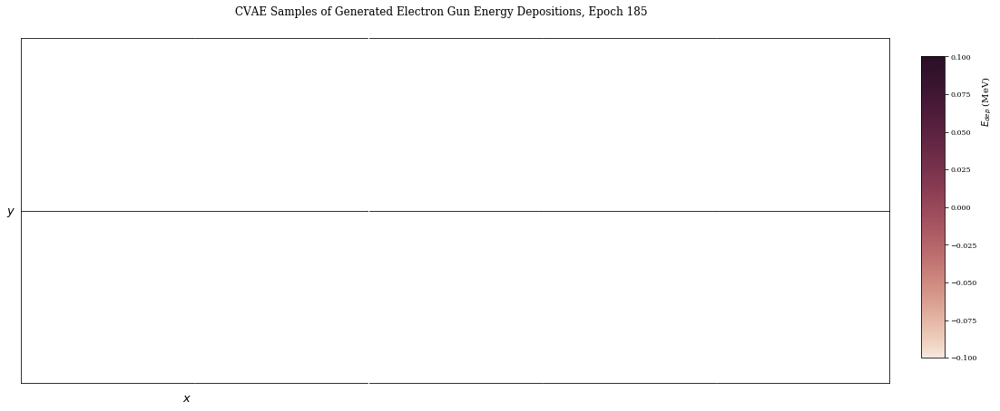

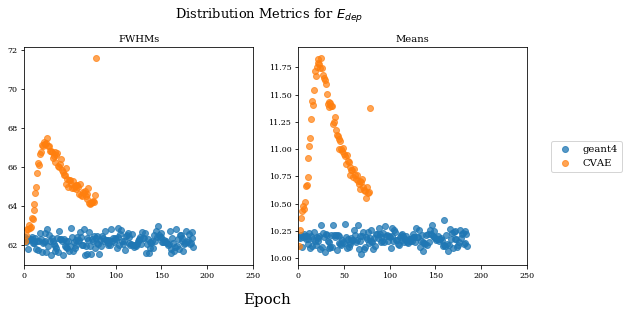

Train Epoch: 185 [0/15000 (0%)]	Loss: nan
Train Epoch: 185 [6400/15000 (43%)]	Loss: nan
Train Epoch: 185 [12800/15000 (85%)]	Loss: nan
====> Epoch: 185 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 186 [0/15000 (0%)]	Loss: nan
Train Epoch: 186 [6400/15000 (43%)]	Loss: nan
Train Epoch: 186 [12800/15000 (85%)]	Loss: nan
====> Epoch: 186 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


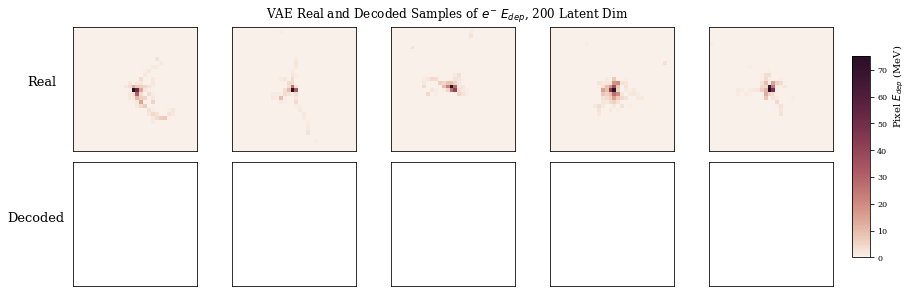

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


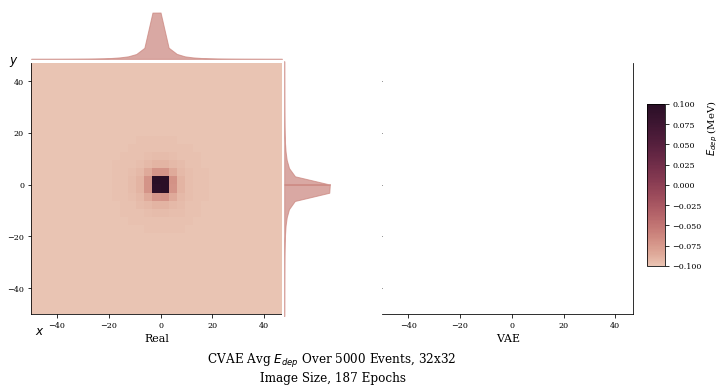

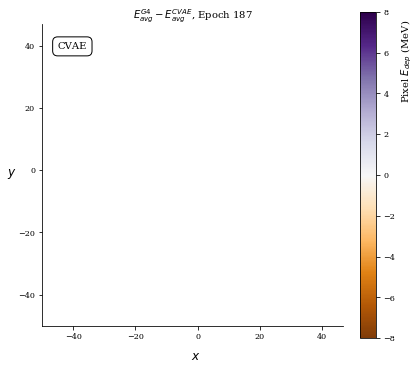

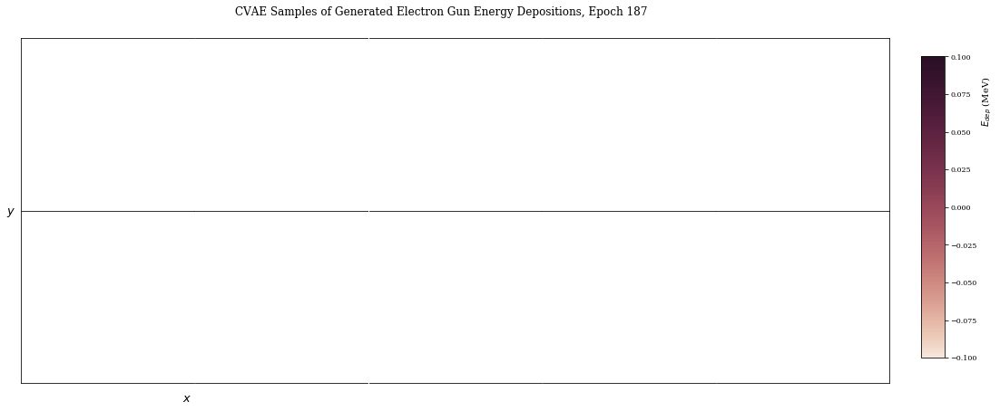

Train Epoch: 187 [0/15000 (0%)]	Loss: nan
Train Epoch: 187 [6400/15000 (43%)]	Loss: nan
Train Epoch: 187 [12800/15000 (85%)]	Loss: nan
====> Epoch: 187 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 188 [0/15000 (0%)]	Loss: nan
Train Epoch: 188 [6400/15000 (43%)]	Loss: nan
Train Epoch: 188 [12800/15000 (85%)]	Loss: nan
====> Epoch: 188 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


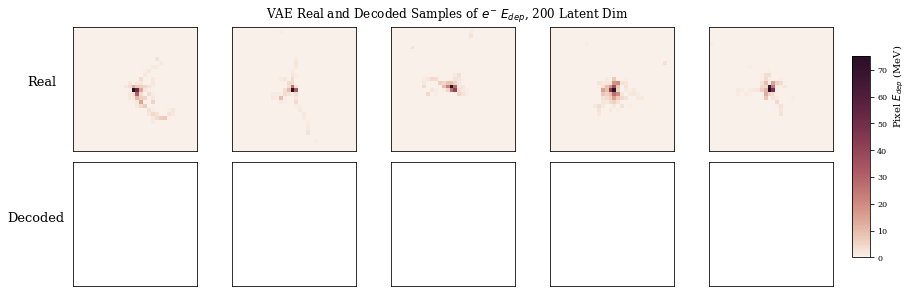

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


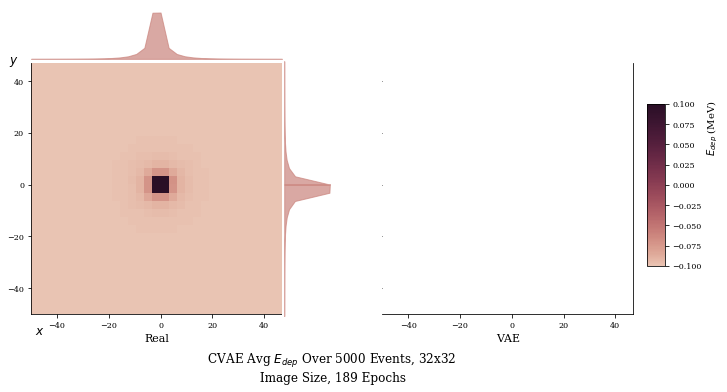

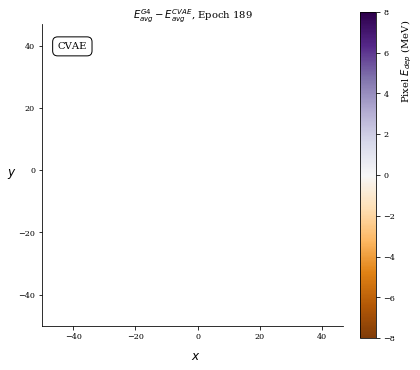

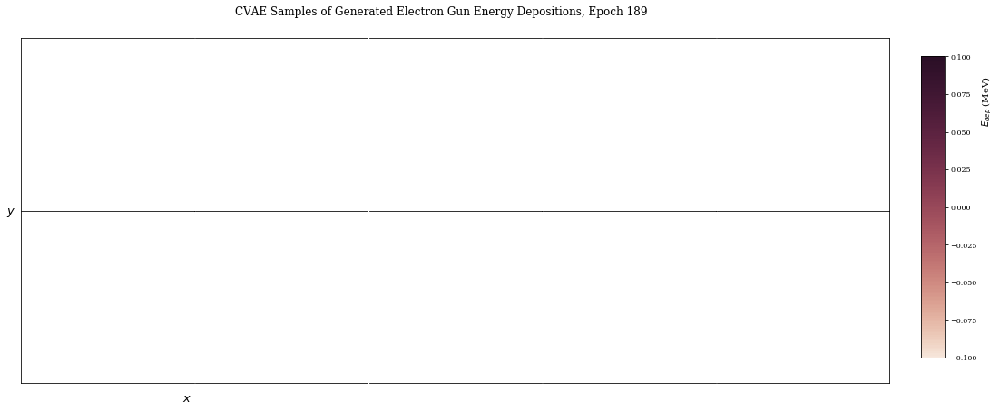

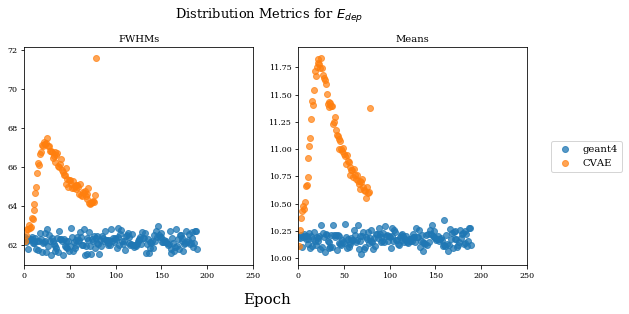

Train Epoch: 189 [0/15000 (0%)]	Loss: nan
Train Epoch: 189 [6400/15000 (43%)]	Loss: nan
Train Epoch: 189 [12800/15000 (85%)]	Loss: nan
====> Epoch: 189 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 190 [0/15000 (0%)]	Loss: nan
Train Epoch: 190 [6400/15000 (43%)]	Loss: nan
Train Epoch: 190 [12800/15000 (85%)]	Loss: nan
====> Epoch: 190 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


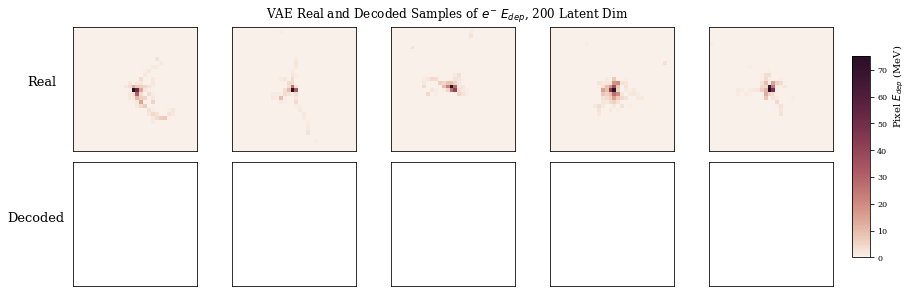

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


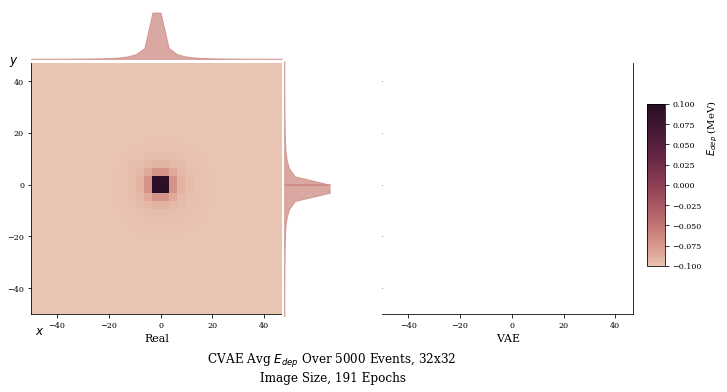

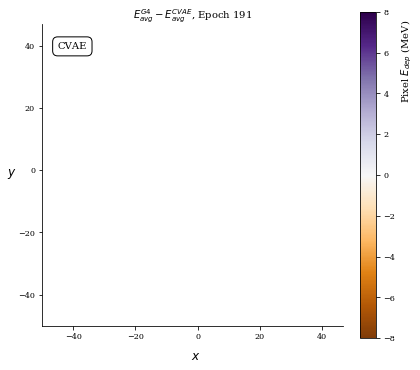

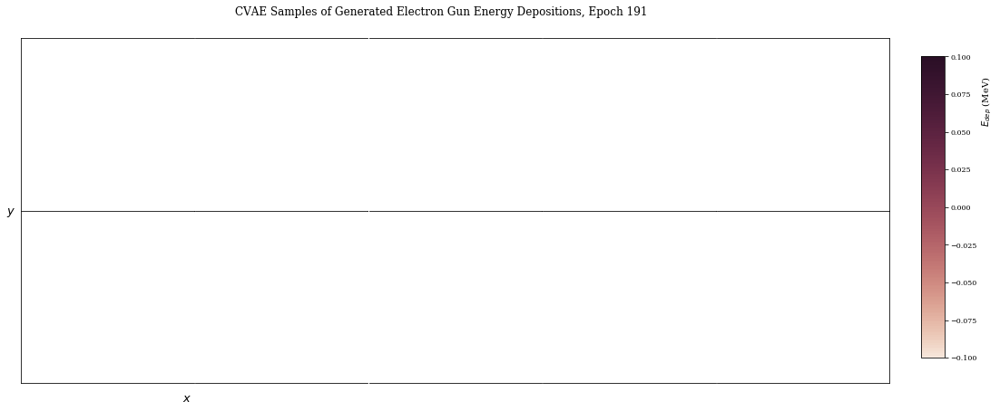

Train Epoch: 191 [0/15000 (0%)]	Loss: nan
Train Epoch: 191 [6400/15000 (43%)]	Loss: nan
Train Epoch: 191 [12800/15000 (85%)]	Loss: nan
====> Epoch: 191 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 192 [0/15000 (0%)]	Loss: nan
Train Epoch: 192 [6400/15000 (43%)]	Loss: nan
Train Epoch: 192 [12800/15000 (85%)]	Loss: nan
====> Epoch: 192 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


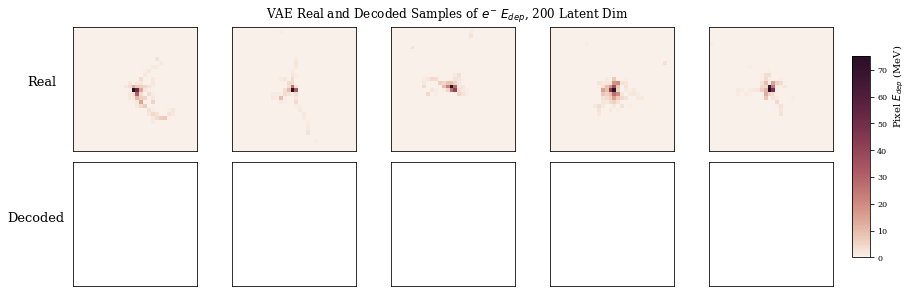

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


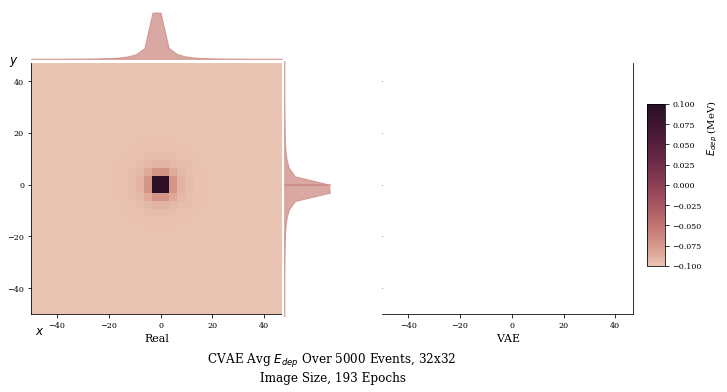

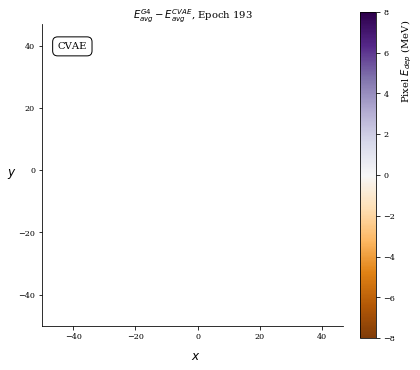

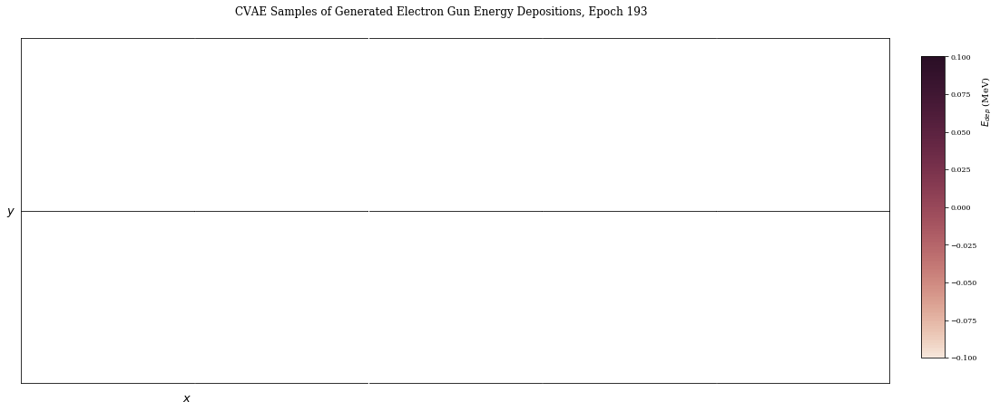

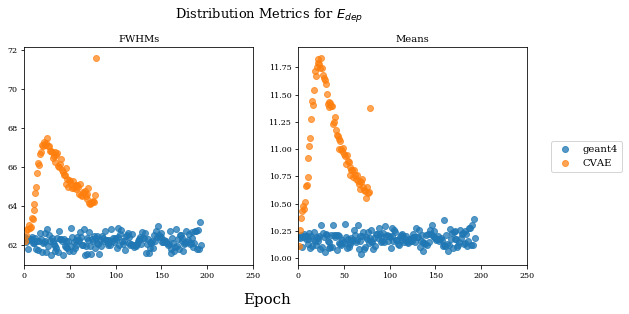

Train Epoch: 193 [0/15000 (0%)]	Loss: nan
Train Epoch: 193 [6400/15000 (43%)]	Loss: nan
Train Epoch: 193 [12800/15000 (85%)]	Loss: nan
====> Epoch: 193 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 194 [0/15000 (0%)]	Loss: nan
Train Epoch: 194 [6400/15000 (43%)]	Loss: nan
Train Epoch: 194 [12800/15000 (85%)]	Loss: nan
====> Epoch: 194 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


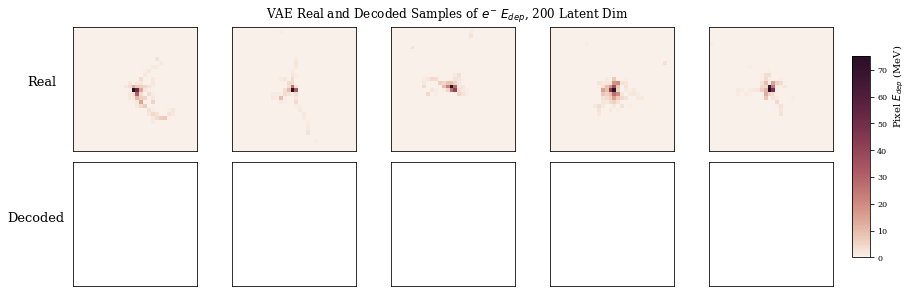

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


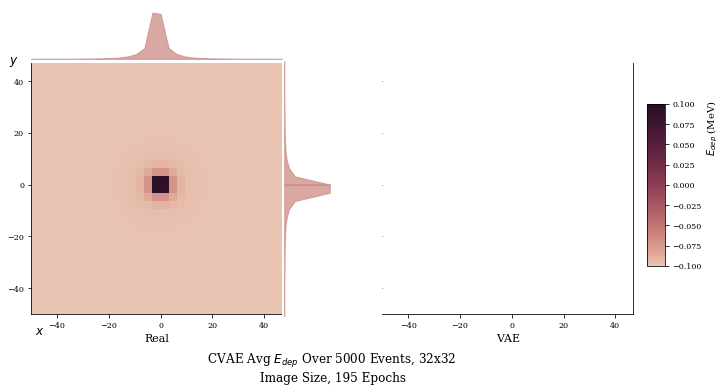

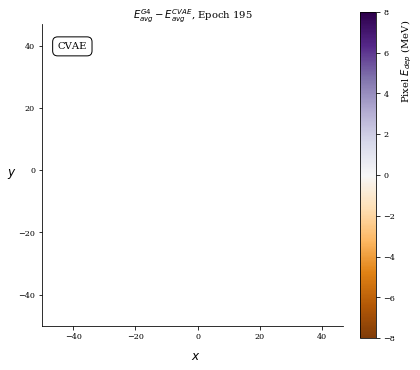

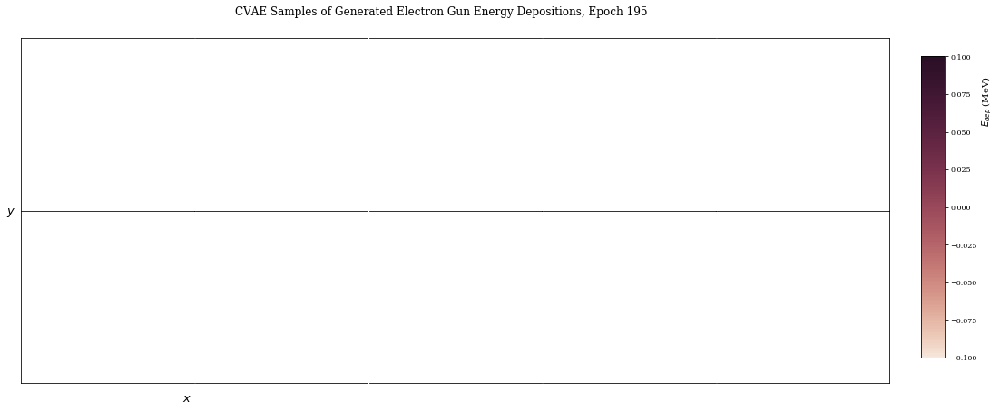

Train Epoch: 195 [0/15000 (0%)]	Loss: nan
Train Epoch: 195 [6400/15000 (43%)]	Loss: nan
Train Epoch: 195 [12800/15000 (85%)]	Loss: nan
====> Epoch: 195 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 196 [0/15000 (0%)]	Loss: nan
Train Epoch: 196 [6400/15000 (43%)]	Loss: nan
Train Epoch: 196 [12800/15000 (85%)]	Loss: nan
====> Epoch: 196 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


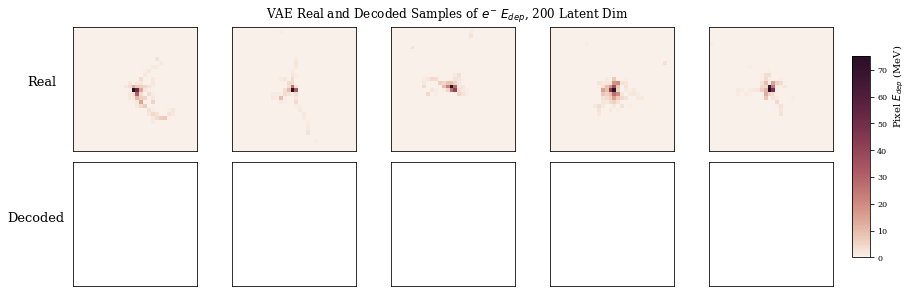

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


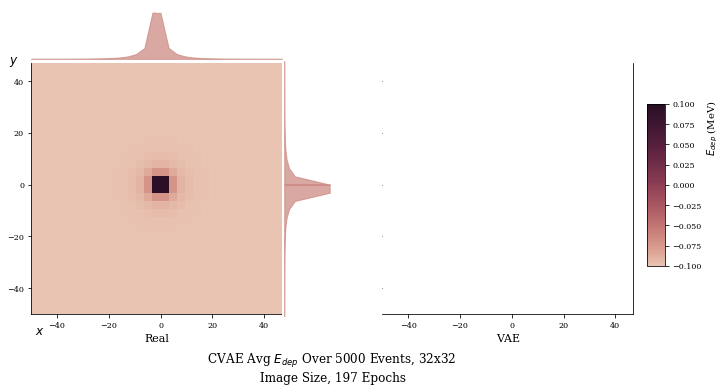

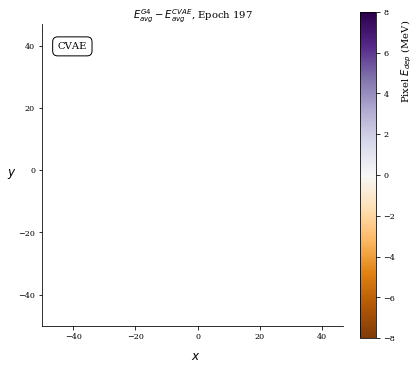

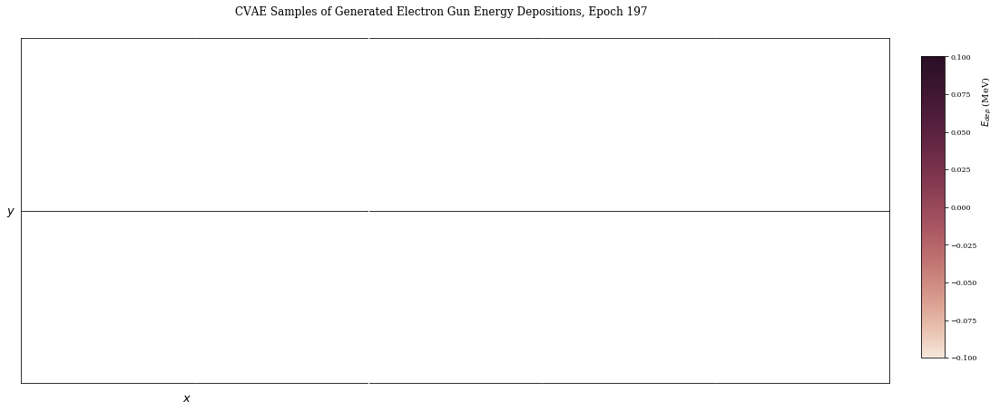

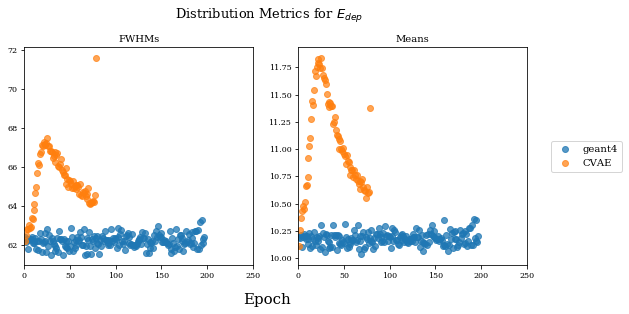

Train Epoch: 197 [0/15000 (0%)]	Loss: nan
Train Epoch: 197 [6400/15000 (43%)]	Loss: nan
Train Epoch: 197 [12800/15000 (85%)]	Loss: nan
====> Epoch: 197 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 198 [0/15000 (0%)]	Loss: nan
Train Epoch: 198 [6400/15000 (43%)]	Loss: nan
Train Epoch: 198 [12800/15000 (85%)]	Loss: nan
====> Epoch: 198 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


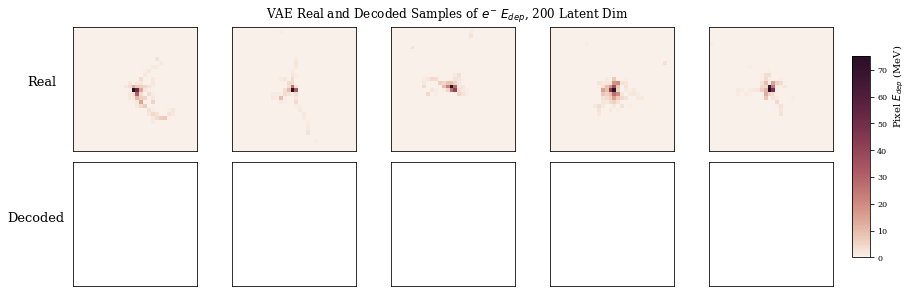

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


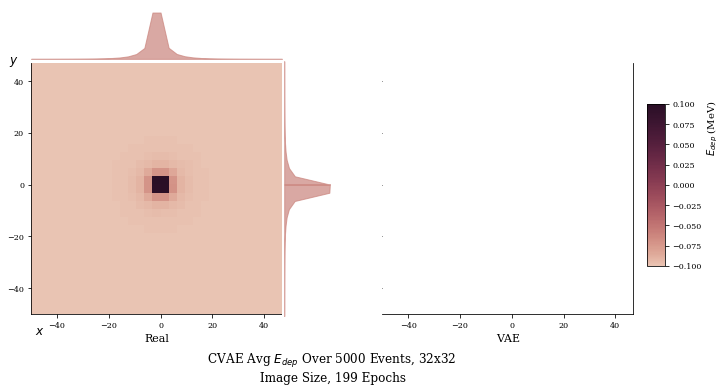

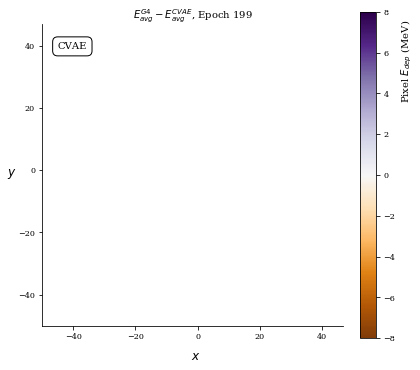

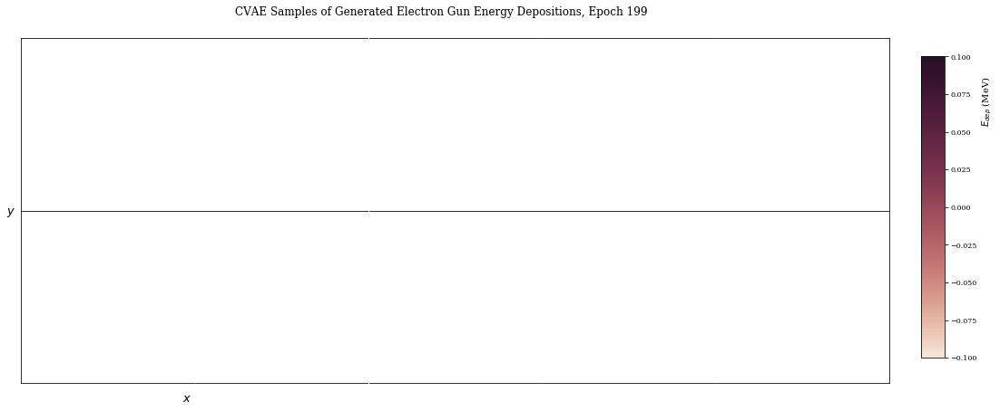

Train Epoch: 199 [0/15000 (0%)]	Loss: nan
Train Epoch: 199 [6400/15000 (43%)]	Loss: nan
Train Epoch: 199 [12800/15000 (85%)]	Loss: nan
====> Epoch: 199 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 200 [0/15000 (0%)]	Loss: nan
Train Epoch: 200 [6400/15000 (43%)]	Loss: nan
Train Epoch: 200 [12800/15000 (85%)]	Loss: nan
====> Epoch: 200 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


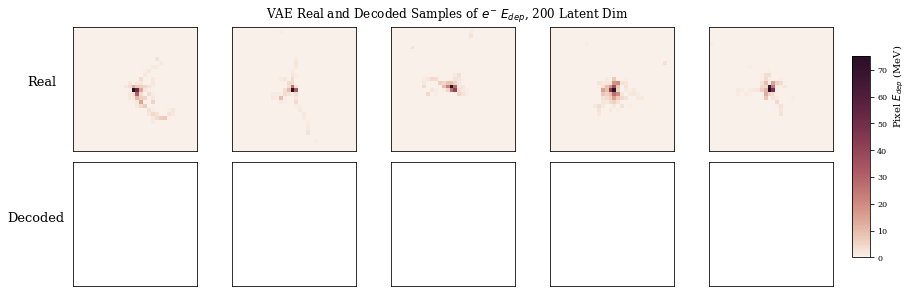

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


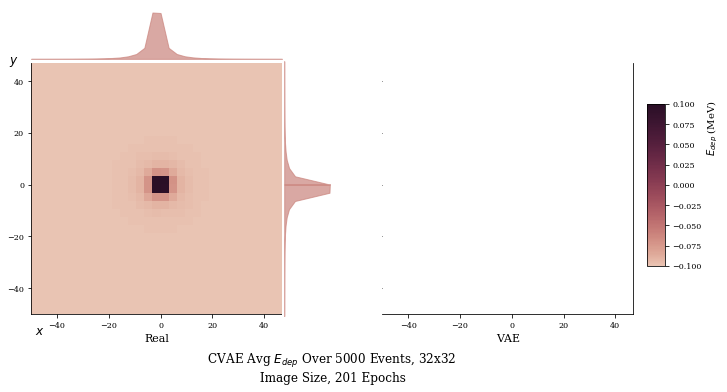

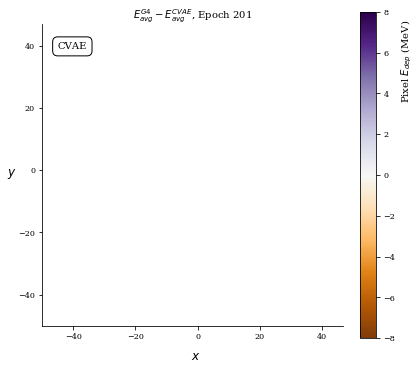

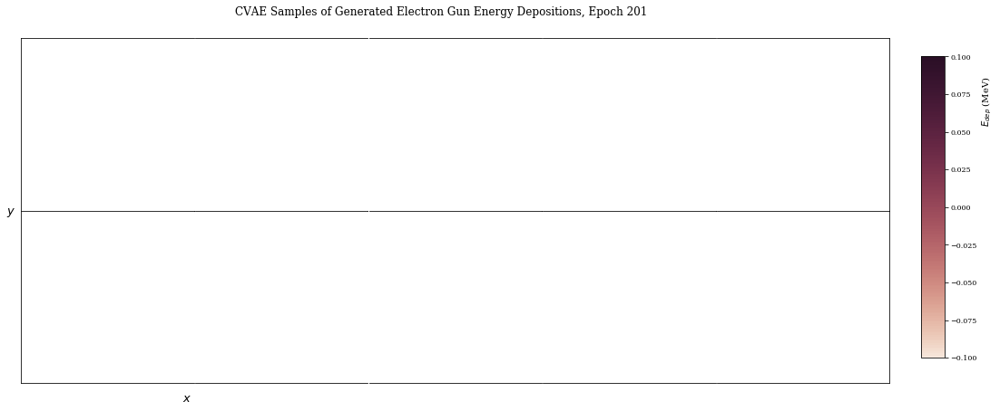

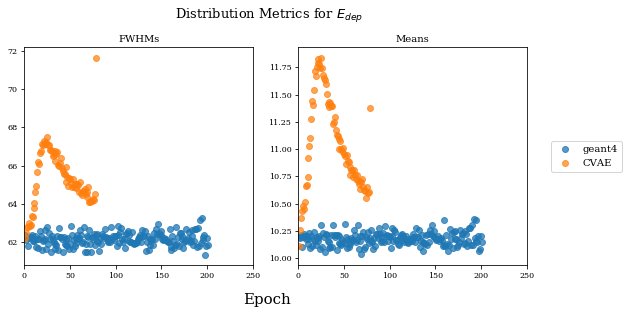

Train Epoch: 201 [0/15000 (0%)]	Loss: nan
Train Epoch: 201 [6400/15000 (43%)]	Loss: nan
Train Epoch: 201 [12800/15000 (85%)]	Loss: nan
====> Epoch: 201 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 202 [0/15000 (0%)]	Loss: nan
Train Epoch: 202 [6400/15000 (43%)]	Loss: nan
Train Epoch: 202 [12800/15000 (85%)]	Loss: nan
====> Epoch: 202 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


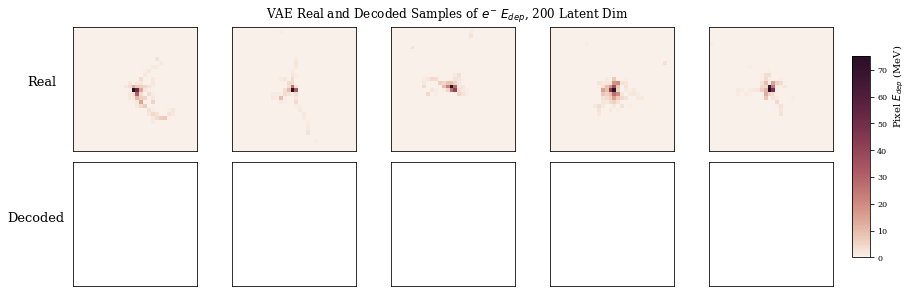

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


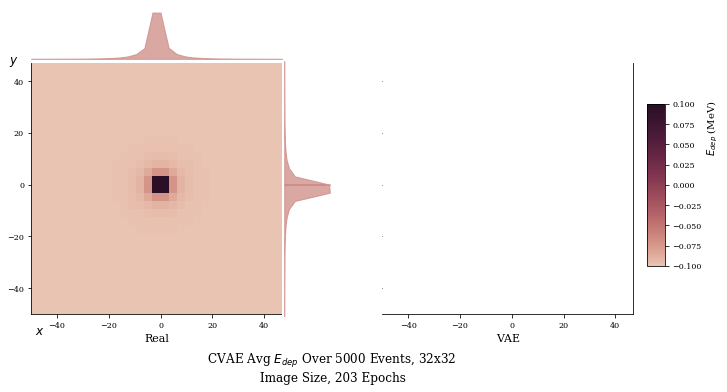

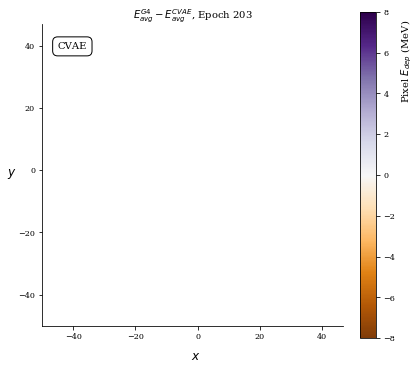

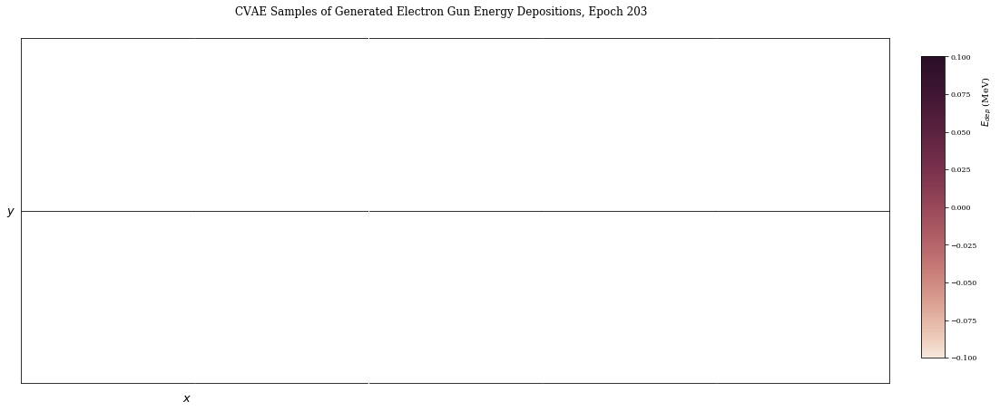

Train Epoch: 203 [0/15000 (0%)]	Loss: nan
Train Epoch: 203 [6400/15000 (43%)]	Loss: nan
Train Epoch: 203 [12800/15000 (85%)]	Loss: nan
====> Epoch: 203 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 204 [0/15000 (0%)]	Loss: nan
Train Epoch: 204 [6400/15000 (43%)]	Loss: nan
Train Epoch: 204 [12800/15000 (85%)]	Loss: nan
====> Epoch: 204 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


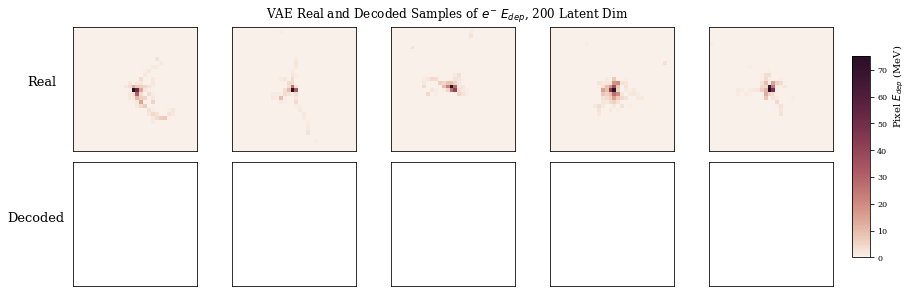

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


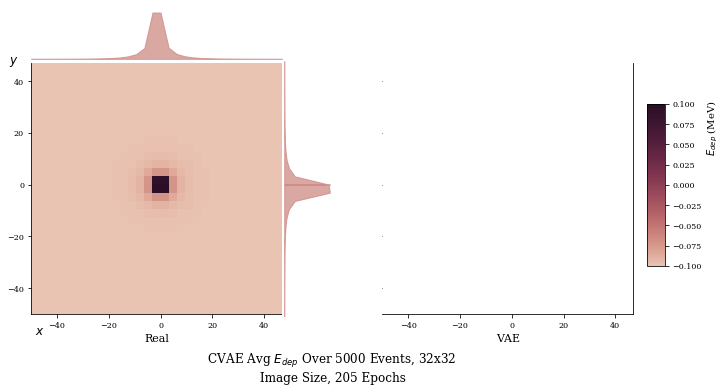

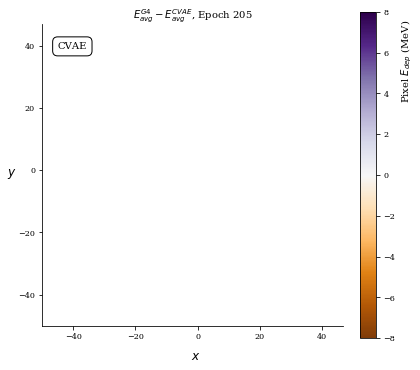

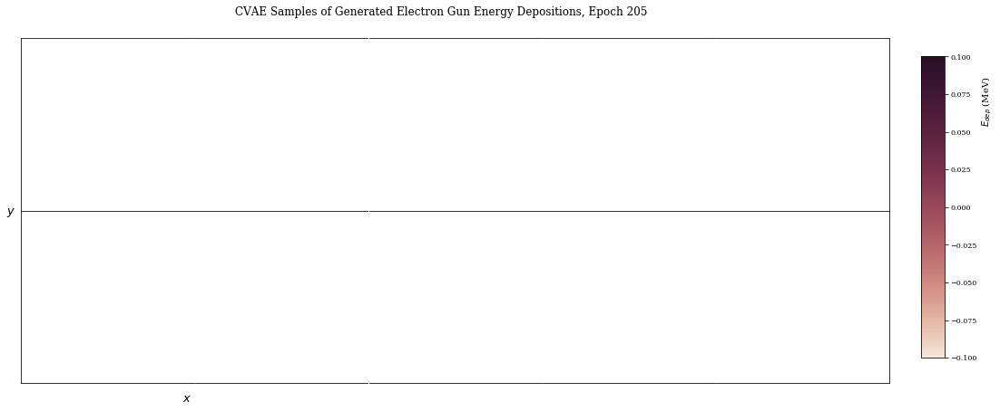

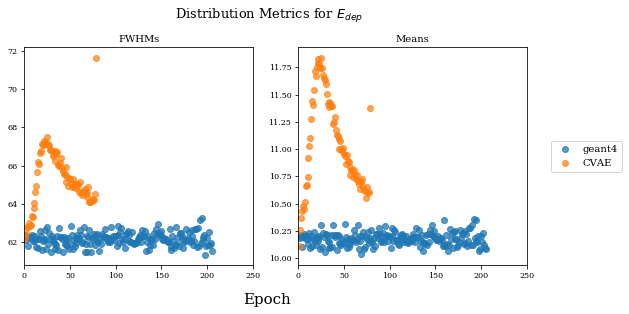

Train Epoch: 205 [0/15000 (0%)]	Loss: nan
Train Epoch: 205 [6400/15000 (43%)]	Loss: nan
Train Epoch: 205 [12800/15000 (85%)]	Loss: nan
====> Epoch: 205 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 206 [0/15000 (0%)]	Loss: nan
Train Epoch: 206 [6400/15000 (43%)]	Loss: nan
Train Epoch: 206 [12800/15000 (85%)]	Loss: nan
====> Epoch: 206 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


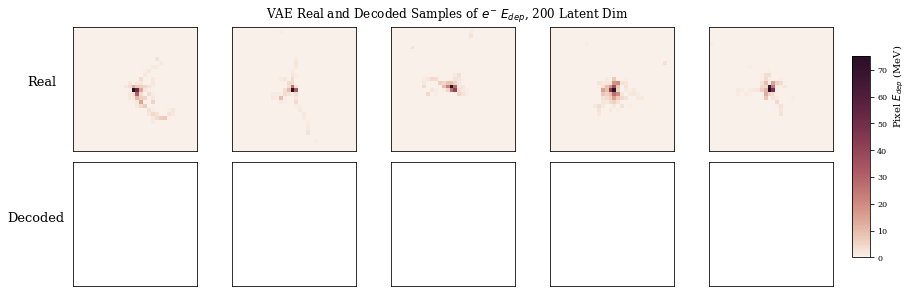

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


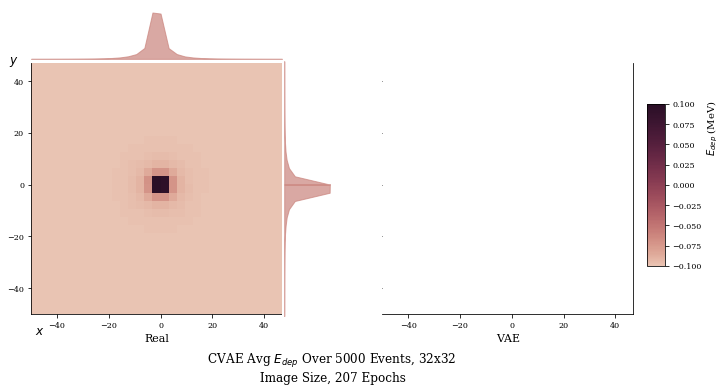

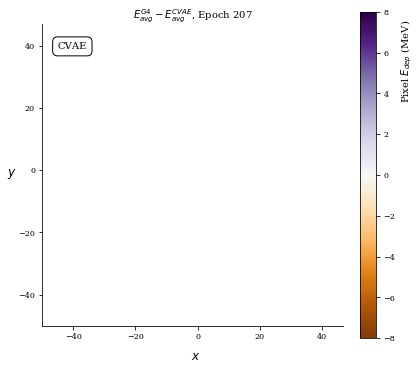

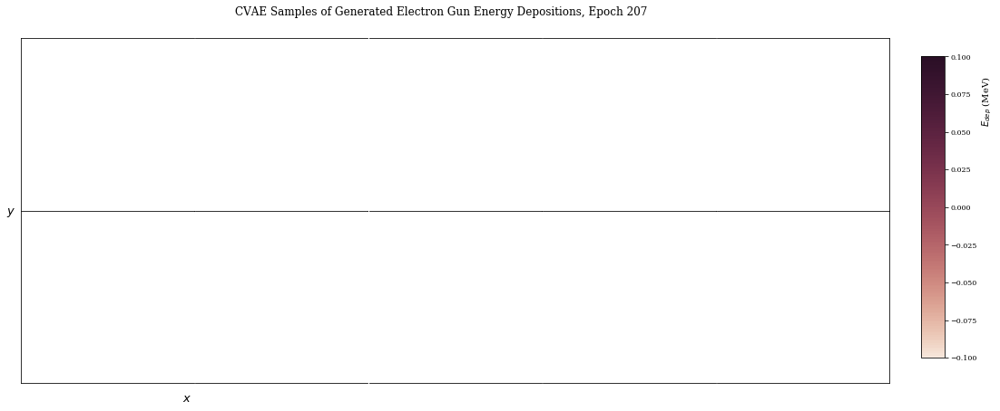

Train Epoch: 207 [0/15000 (0%)]	Loss: nan
Train Epoch: 207 [6400/15000 (43%)]	Loss: nan
Train Epoch: 207 [12800/15000 (85%)]	Loss: nan
====> Epoch: 207 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 208 [0/15000 (0%)]	Loss: nan
Train Epoch: 208 [6400/15000 (43%)]	Loss: nan
Train Epoch: 208 [12800/15000 (85%)]	Loss: nan
====> Epoch: 208 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


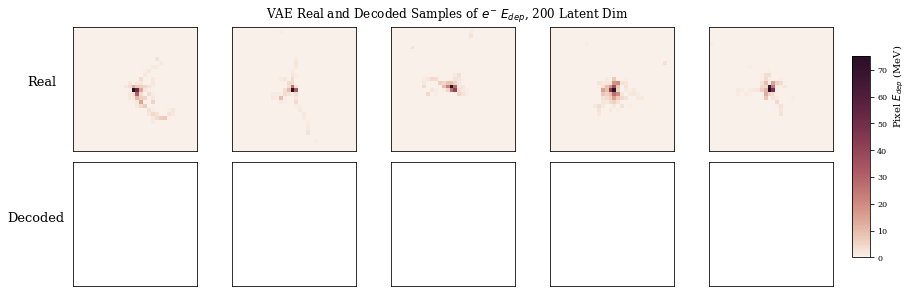

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


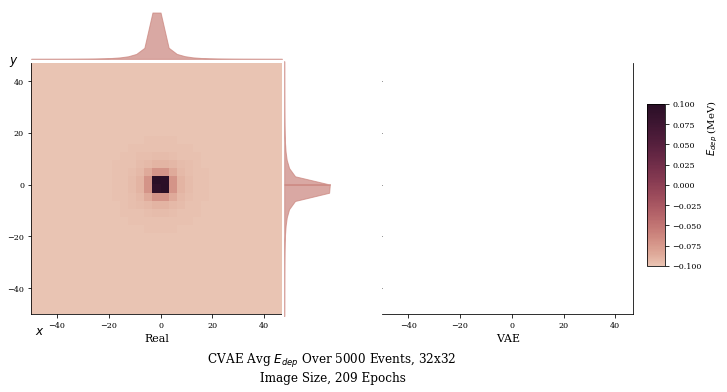

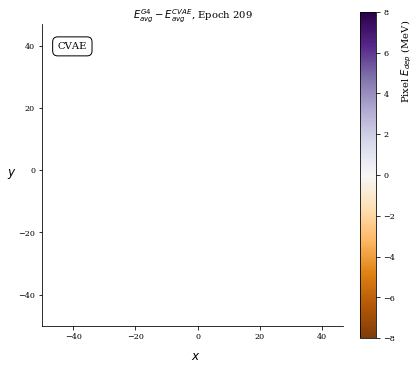

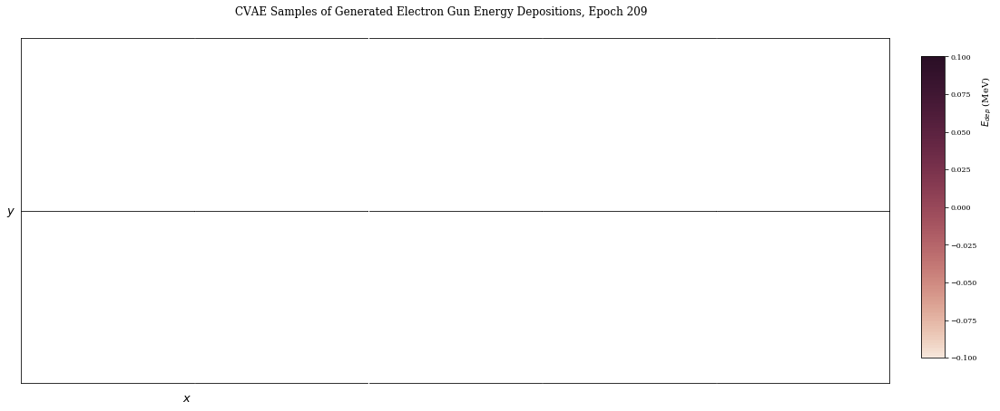

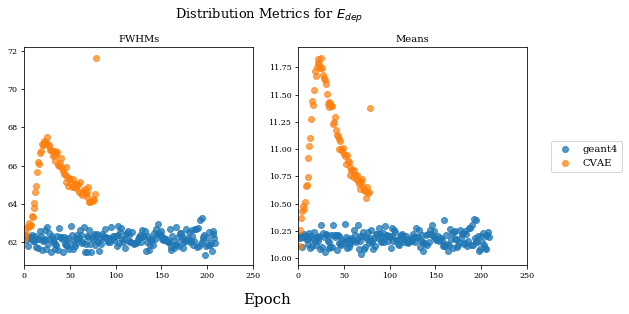

Train Epoch: 209 [0/15000 (0%)]	Loss: nan
Train Epoch: 209 [6400/15000 (43%)]	Loss: nan
Train Epoch: 209 [12800/15000 (85%)]	Loss: nan
====> Epoch: 209 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 210 [0/15000 (0%)]	Loss: nan
Train Epoch: 210 [6400/15000 (43%)]	Loss: nan
Train Epoch: 210 [12800/15000 (85%)]	Loss: nan
====> Epoch: 210 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


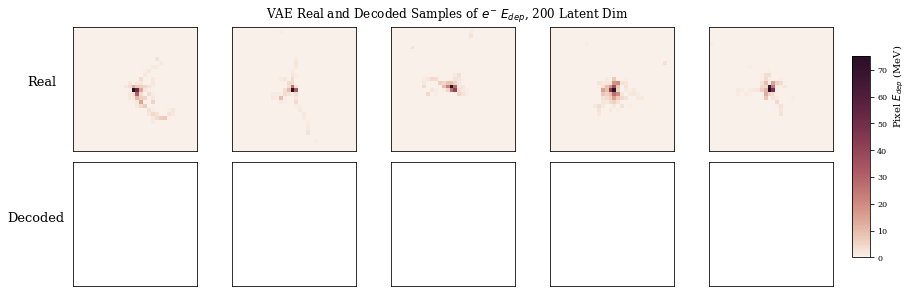

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


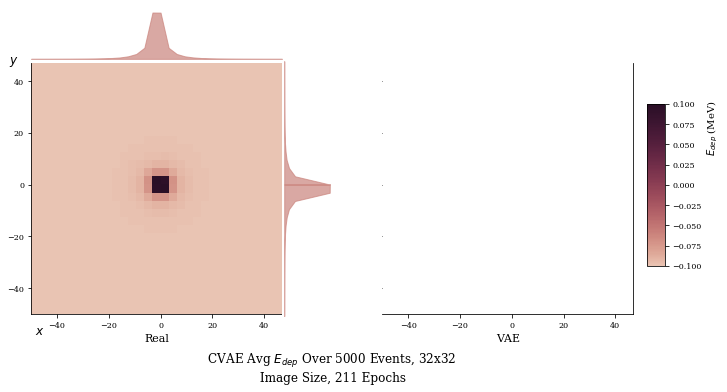

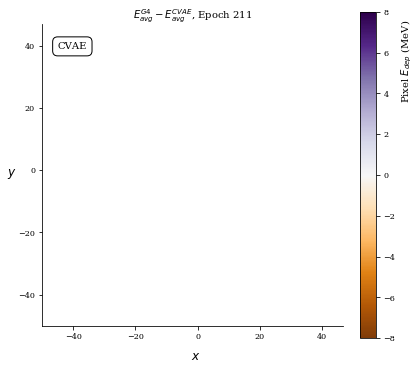

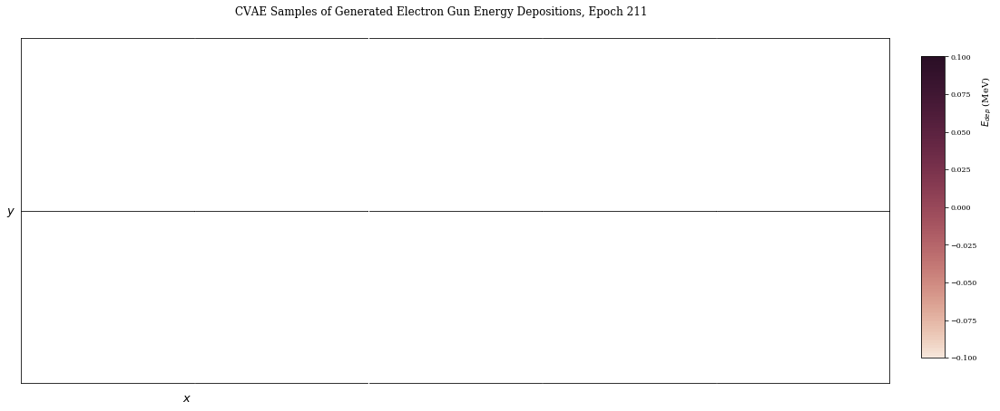

Train Epoch: 211 [0/15000 (0%)]	Loss: nan
Train Epoch: 211 [6400/15000 (43%)]	Loss: nan
Train Epoch: 211 [12800/15000 (85%)]	Loss: nan
====> Epoch: 211 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 212 [0/15000 (0%)]	Loss: nan
Train Epoch: 212 [6400/15000 (43%)]	Loss: nan
Train Epoch: 212 [12800/15000 (85%)]	Loss: nan
====> Epoch: 212 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


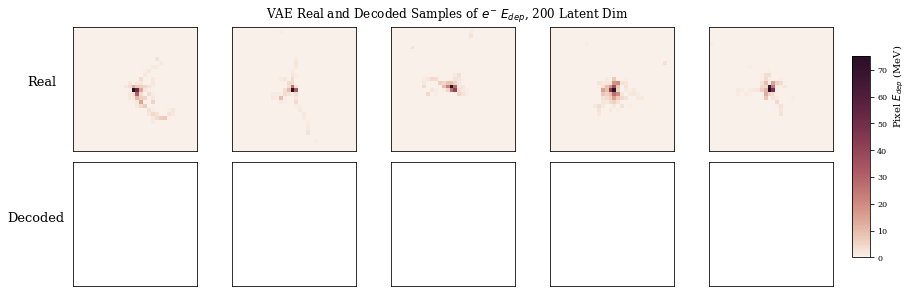

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


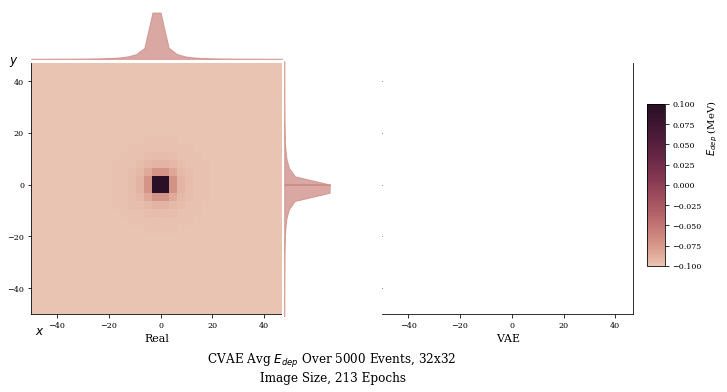

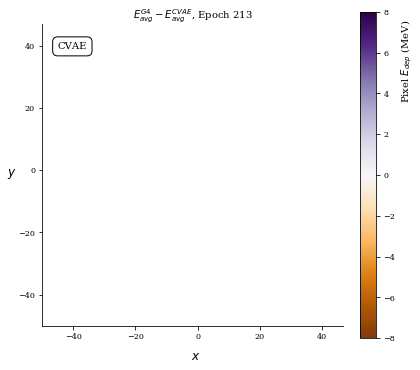

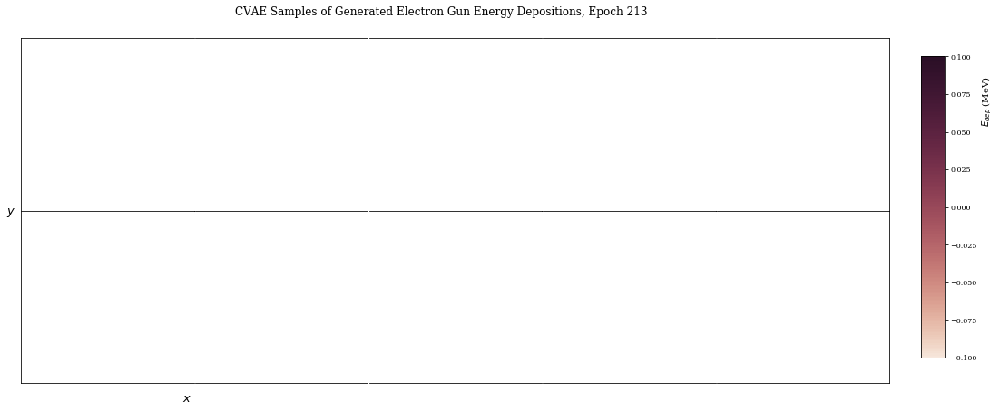

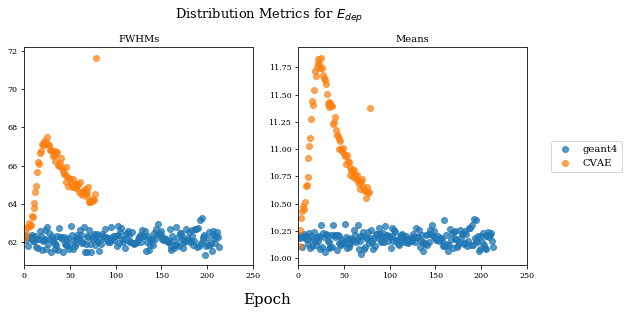

Train Epoch: 213 [0/15000 (0%)]	Loss: nan
Train Epoch: 213 [6400/15000 (43%)]	Loss: nan
Train Epoch: 213 [12800/15000 (85%)]	Loss: nan
====> Epoch: 213 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 214 [0/15000 (0%)]	Loss: nan
Train Epoch: 214 [6400/15000 (43%)]	Loss: nan
Train Epoch: 214 [12800/15000 (85%)]	Loss: nan
====> Epoch: 214 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


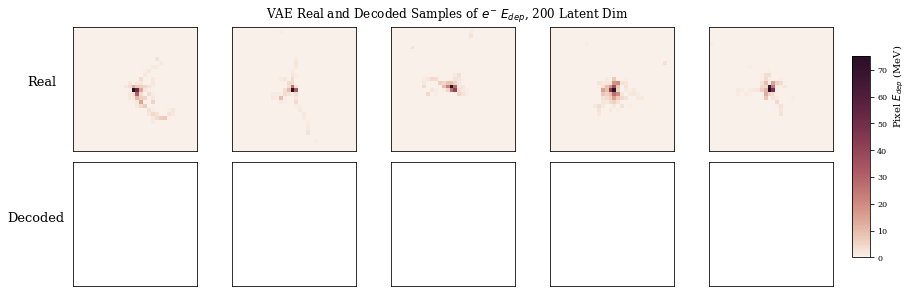

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


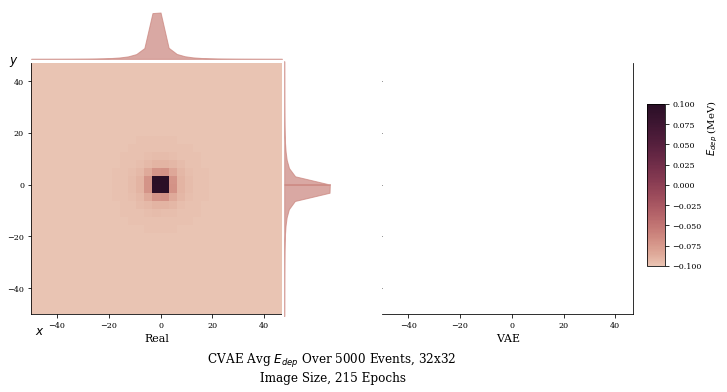

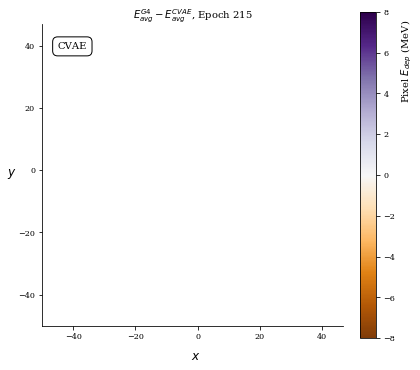

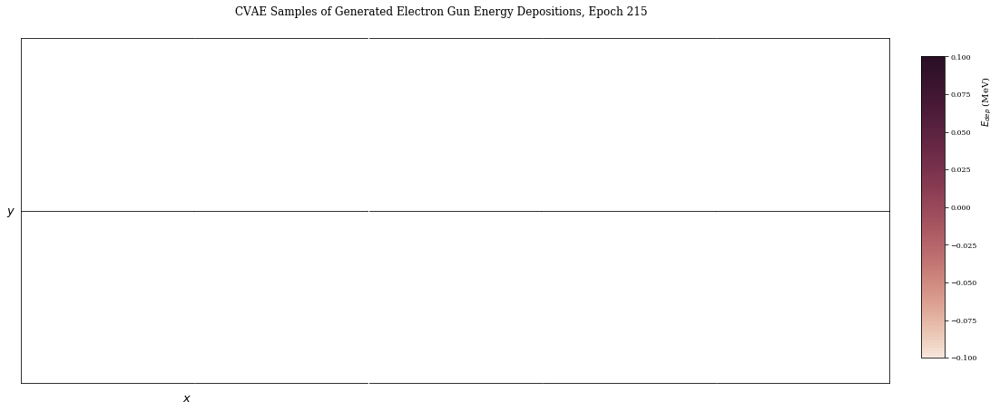

Train Epoch: 215 [0/15000 (0%)]	Loss: nan
Train Epoch: 215 [6400/15000 (43%)]	Loss: nan
Train Epoch: 215 [12800/15000 (85%)]	Loss: nan
====> Epoch: 215 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 216 [0/15000 (0%)]	Loss: nan
Train Epoch: 216 [6400/15000 (43%)]	Loss: nan
Train Epoch: 216 [12800/15000 (85%)]	Loss: nan
====> Epoch: 216 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


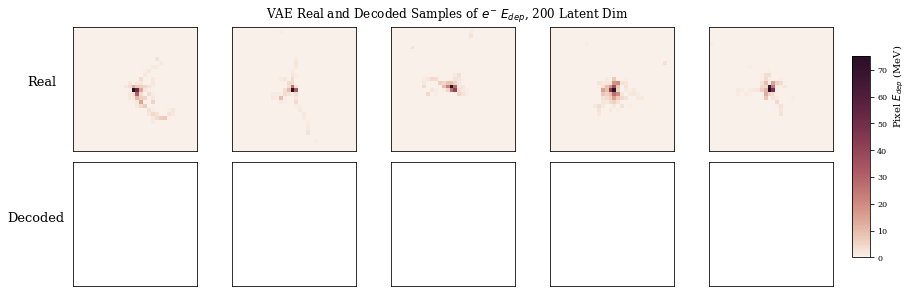

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


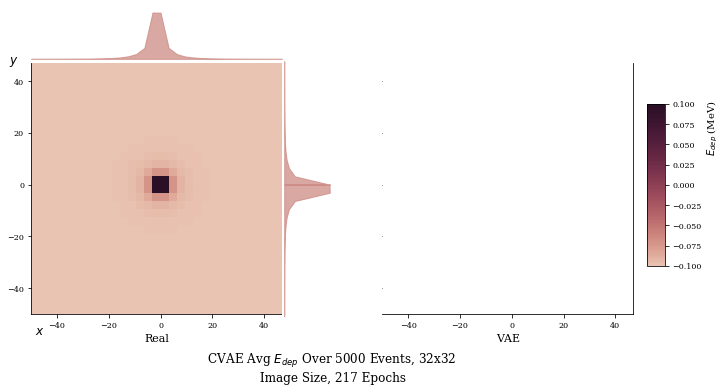

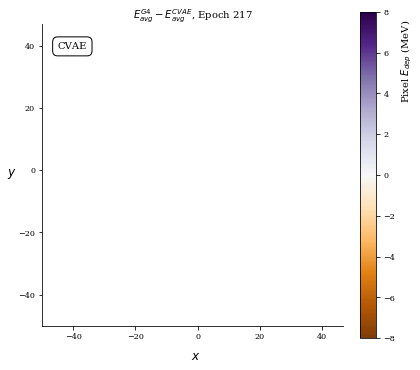

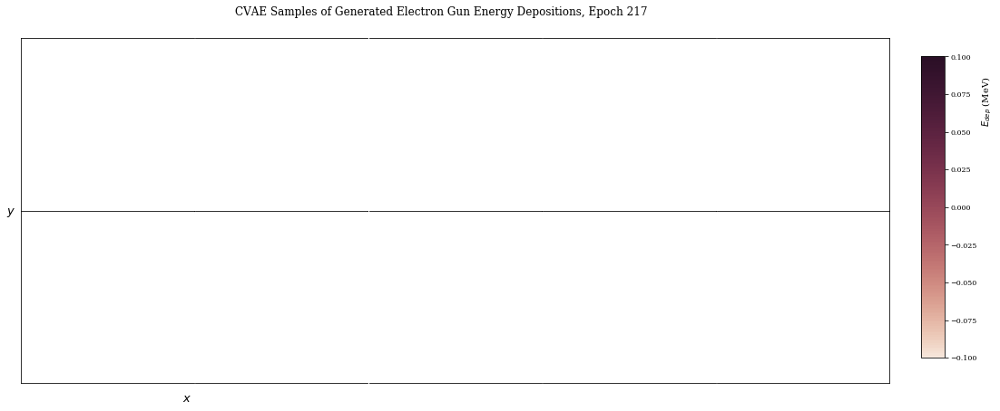

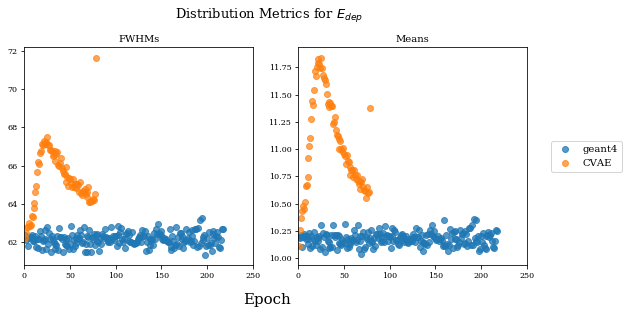

Train Epoch: 217 [0/15000 (0%)]	Loss: nan
Train Epoch: 217 [6400/15000 (43%)]	Loss: nan
Train Epoch: 217 [12800/15000 (85%)]	Loss: nan
====> Epoch: 217 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 218 [0/15000 (0%)]	Loss: nan
Train Epoch: 218 [6400/15000 (43%)]	Loss: nan
Train Epoch: 218 [12800/15000 (85%)]	Loss: nan
====> Epoch: 218 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


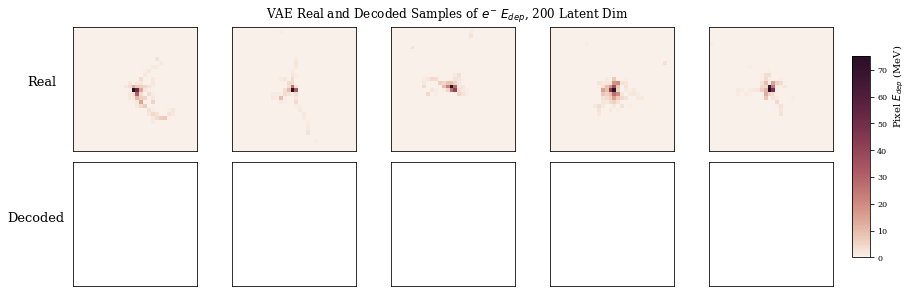

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


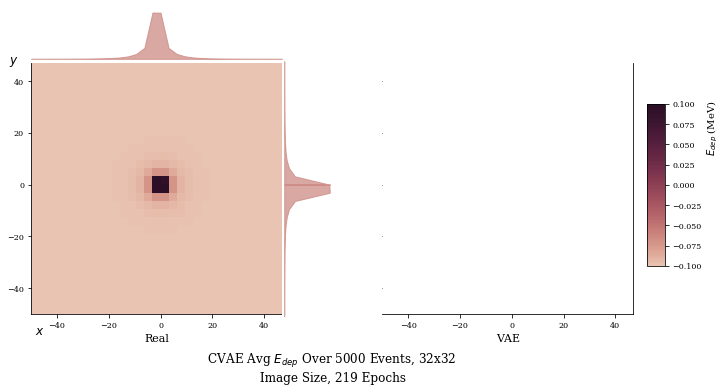

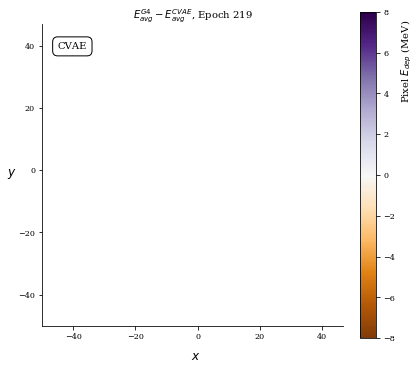

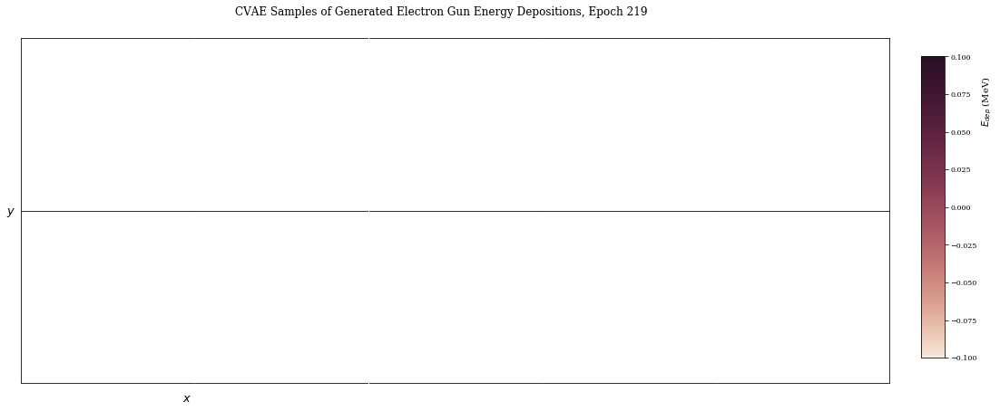

Train Epoch: 219 [0/15000 (0%)]	Loss: nan
Train Epoch: 219 [6400/15000 (43%)]	Loss: nan
Train Epoch: 219 [12800/15000 (85%)]	Loss: nan
====> Epoch: 219 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 220 [0/15000 (0%)]	Loss: nan
Train Epoch: 220 [6400/15000 (43%)]	Loss: nan
Train Epoch: 220 [12800/15000 (85%)]	Loss: nan
====> Epoch: 220 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


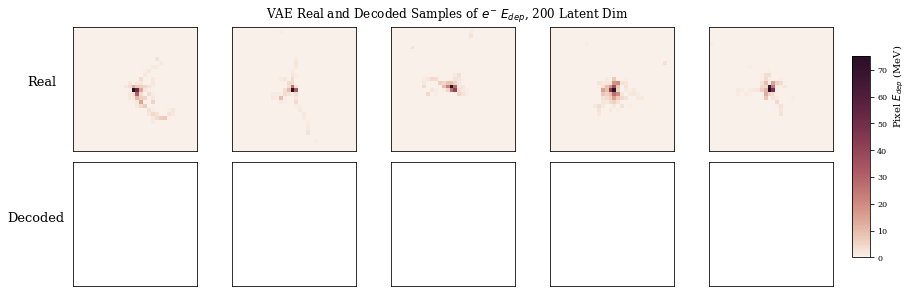

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


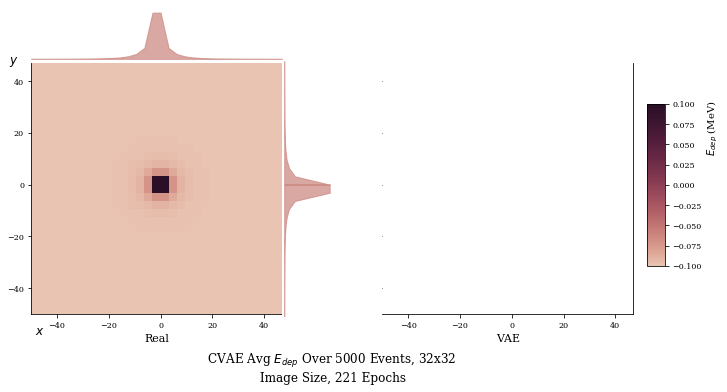

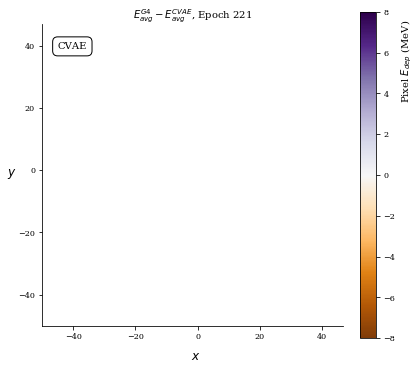

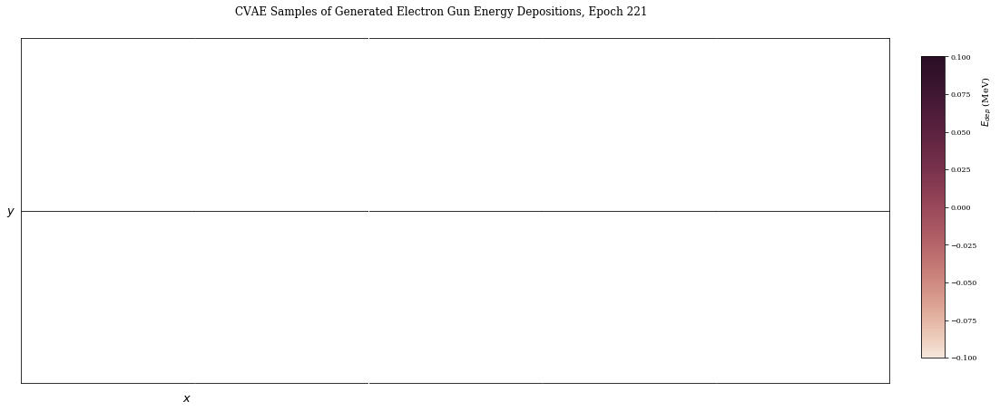

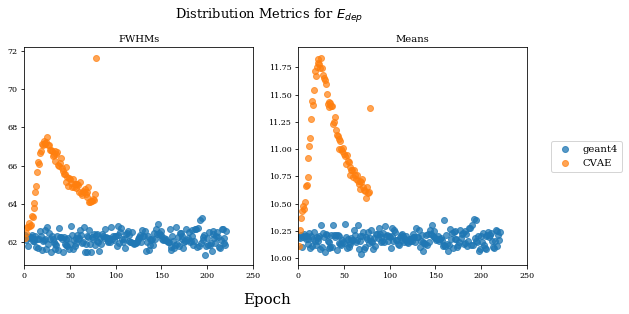

Train Epoch: 221 [0/15000 (0%)]	Loss: nan
Train Epoch: 221 [6400/15000 (43%)]	Loss: nan
Train Epoch: 221 [12800/15000 (85%)]	Loss: nan
====> Epoch: 221 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 222 [0/15000 (0%)]	Loss: nan
Train Epoch: 222 [6400/15000 (43%)]	Loss: nan
Train Epoch: 222 [12800/15000 (85%)]	Loss: nan
====> Epoch: 222 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


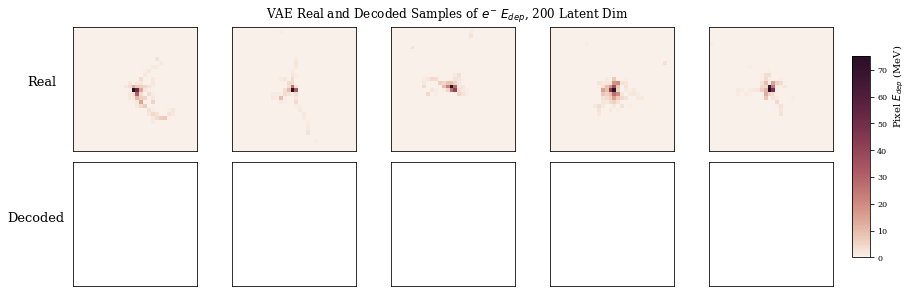

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


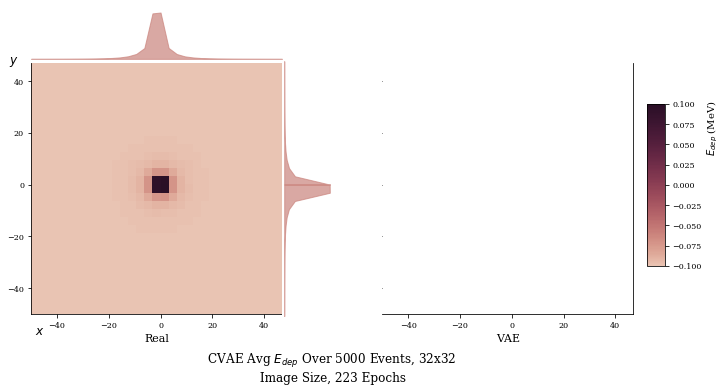

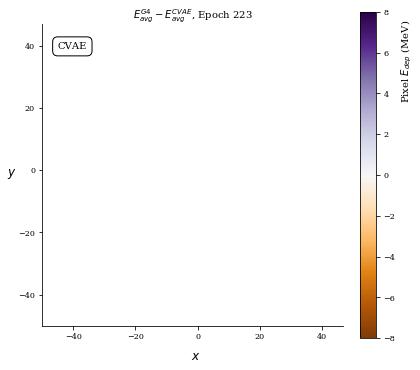

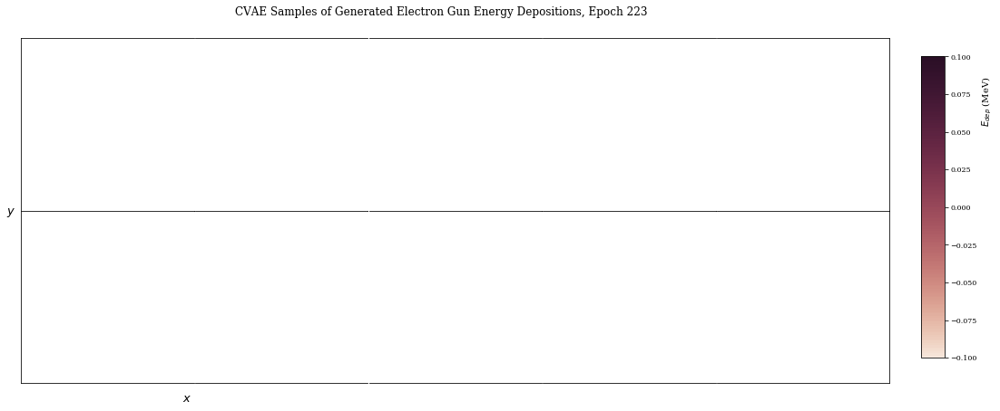

Train Epoch: 223 [0/15000 (0%)]	Loss: nan
Train Epoch: 223 [6400/15000 (43%)]	Loss: nan
Train Epoch: 223 [12800/15000 (85%)]	Loss: nan
====> Epoch: 223 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 224 [0/15000 (0%)]	Loss: nan
Train Epoch: 224 [6400/15000 (43%)]	Loss: nan
Train Epoch: 224 [12800/15000 (85%)]	Loss: nan
====> Epoch: 224 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


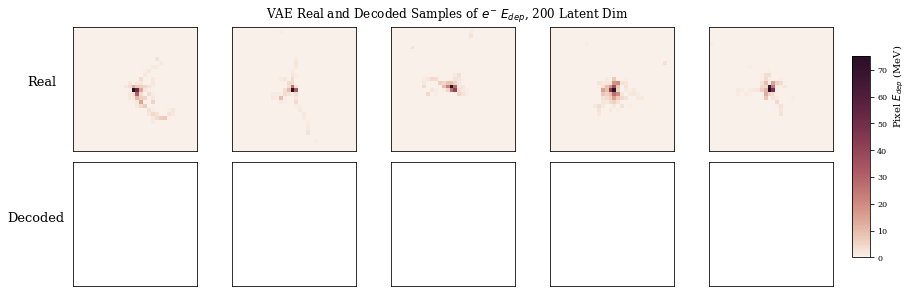

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


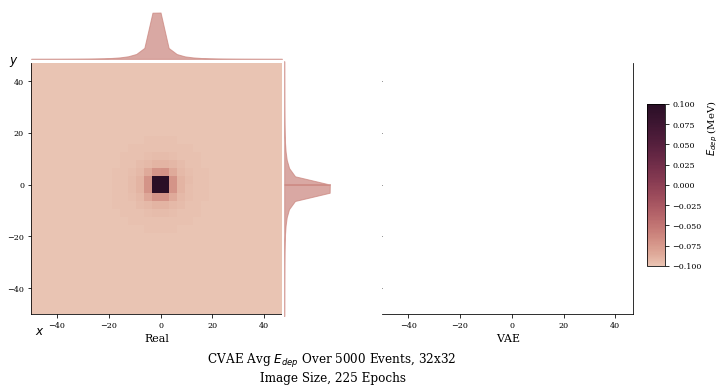

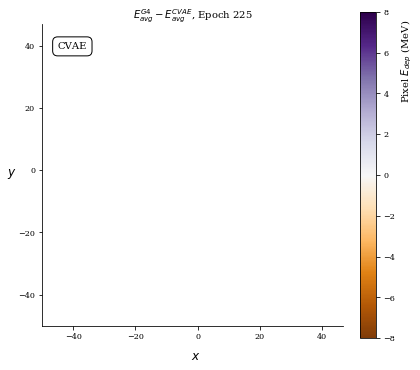

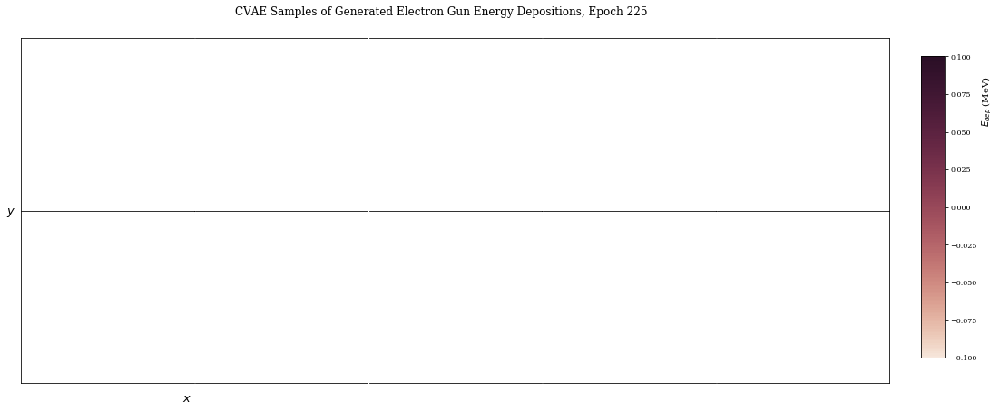

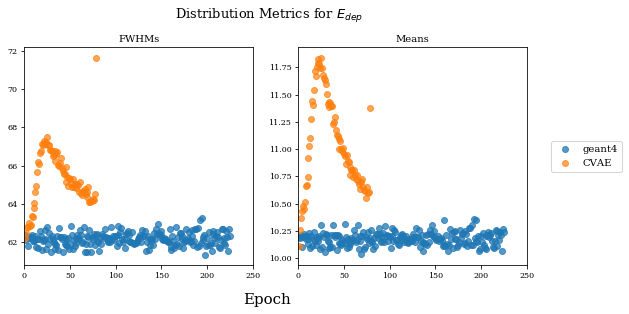

Train Epoch: 225 [0/15000 (0%)]	Loss: nan
Train Epoch: 225 [6400/15000 (43%)]	Loss: nan
Train Epoch: 225 [12800/15000 (85%)]	Loss: nan
====> Epoch: 225 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 226 [0/15000 (0%)]	Loss: nan
Train Epoch: 226 [6400/15000 (43%)]	Loss: nan
Train Epoch: 226 [12800/15000 (85%)]	Loss: nan
====> Epoch: 226 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


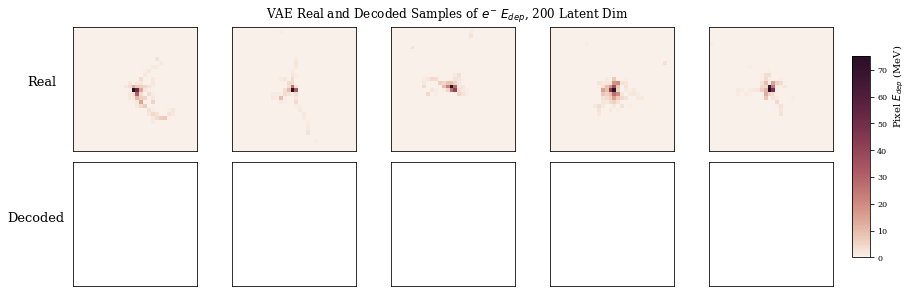

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


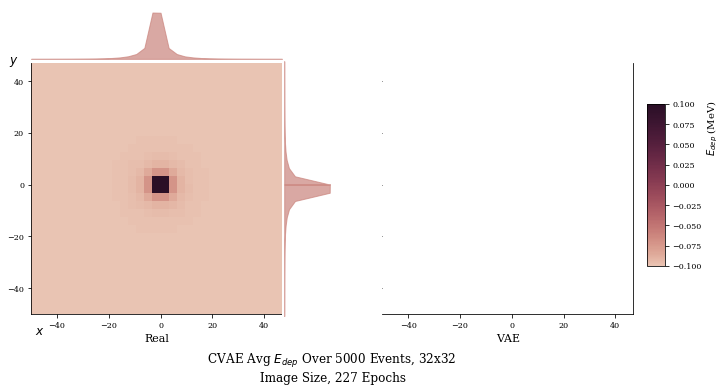

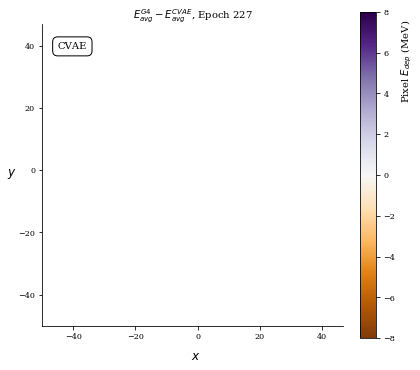

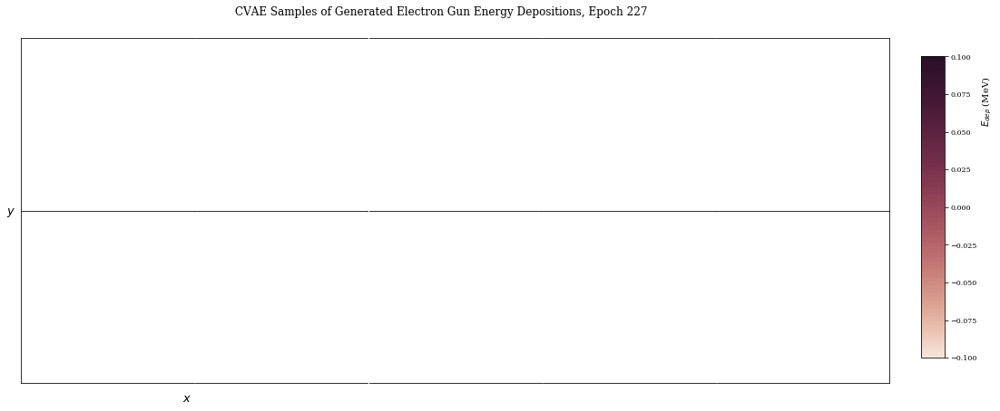

Train Epoch: 227 [0/15000 (0%)]	Loss: nan
Train Epoch: 227 [6400/15000 (43%)]	Loss: nan
Train Epoch: 227 [12800/15000 (85%)]	Loss: nan
====> Epoch: 227 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 228 [0/15000 (0%)]	Loss: nan
Train Epoch: 228 [6400/15000 (43%)]	Loss: nan
Train Epoch: 228 [12800/15000 (85%)]	Loss: nan
====> Epoch: 228 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


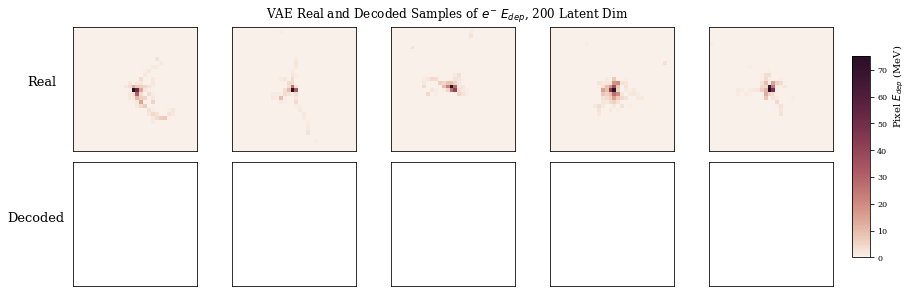

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


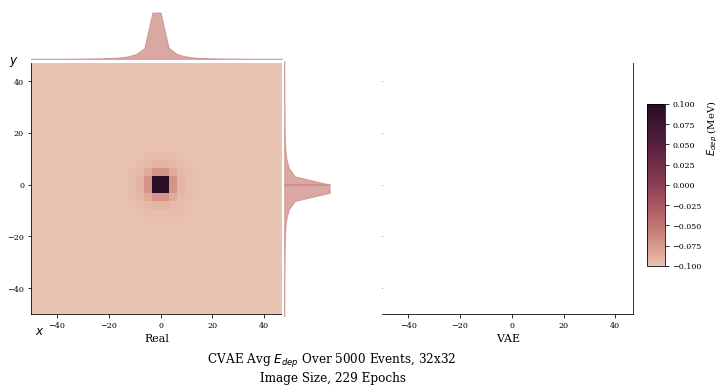

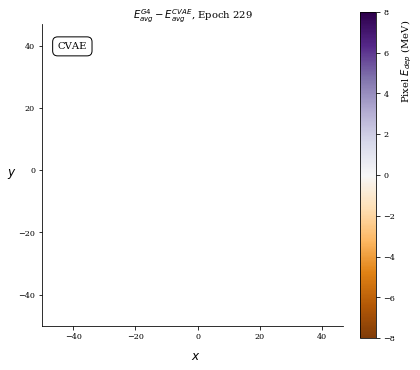

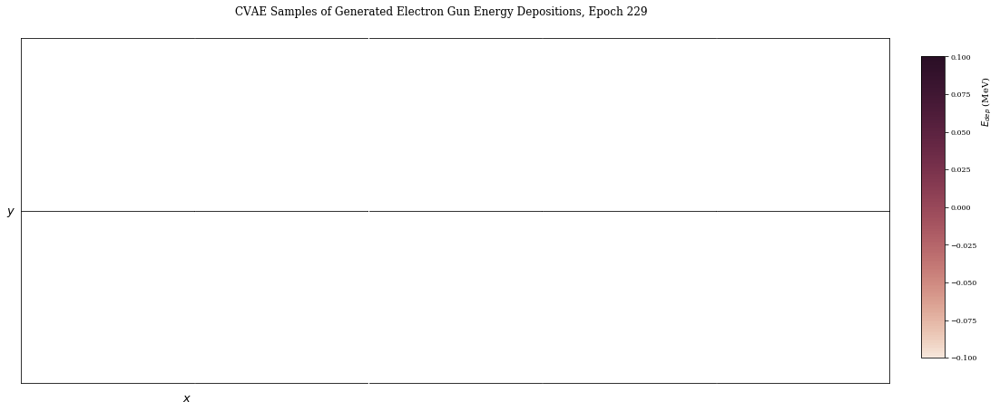

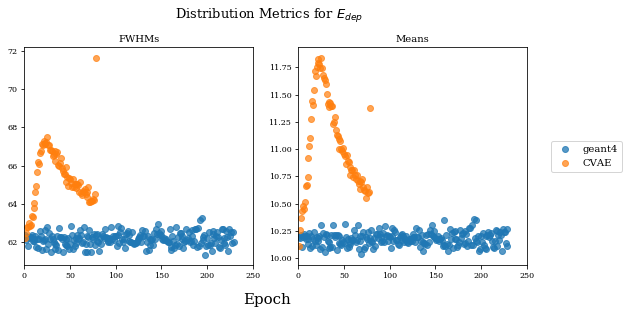

Train Epoch: 229 [0/15000 (0%)]	Loss: nan
Train Epoch: 229 [6400/15000 (43%)]	Loss: nan
Train Epoch: 229 [12800/15000 (85%)]	Loss: nan
====> Epoch: 229 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 230 [0/15000 (0%)]	Loss: nan
Train Epoch: 230 [6400/15000 (43%)]	Loss: nan
Train Epoch: 230 [12800/15000 (85%)]	Loss: nan
====> Epoch: 230 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


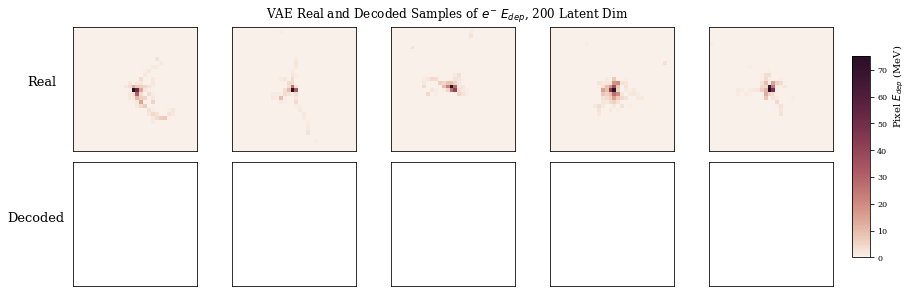

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


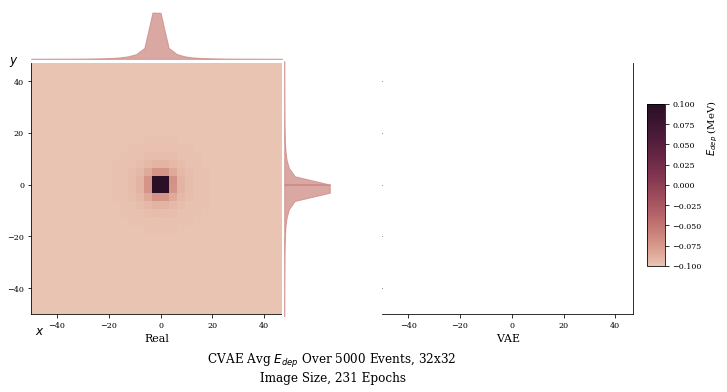

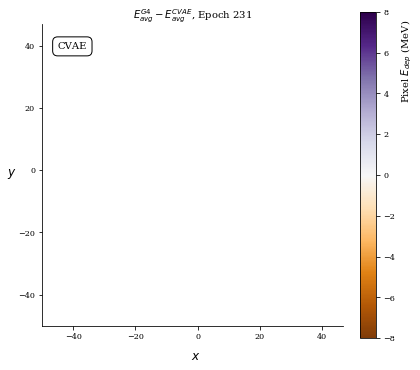

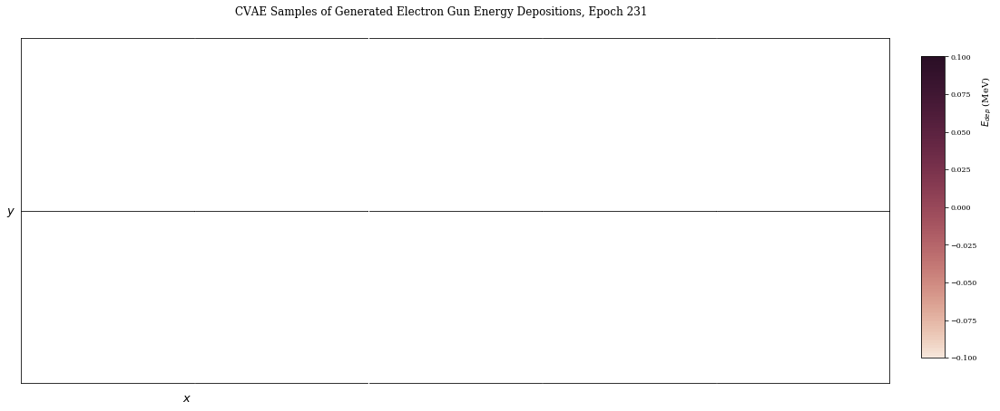

Train Epoch: 231 [0/15000 (0%)]	Loss: nan
Train Epoch: 231 [6400/15000 (43%)]	Loss: nan
Train Epoch: 231 [12800/15000 (85%)]	Loss: nan
====> Epoch: 231 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 232 [0/15000 (0%)]	Loss: nan
Train Epoch: 232 [6400/15000 (43%)]	Loss: nan
Train Epoch: 232 [12800/15000 (85%)]	Loss: nan
====> Epoch: 232 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


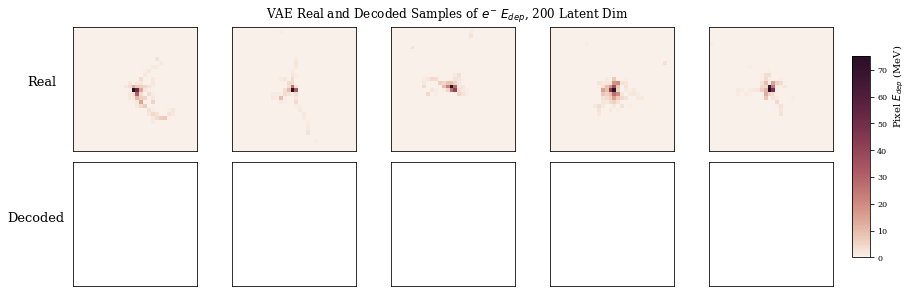

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


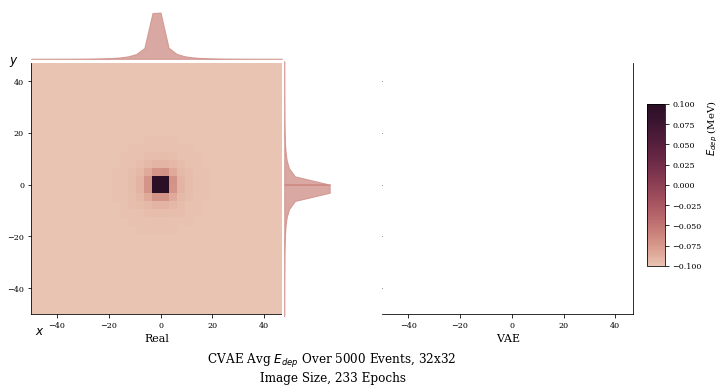

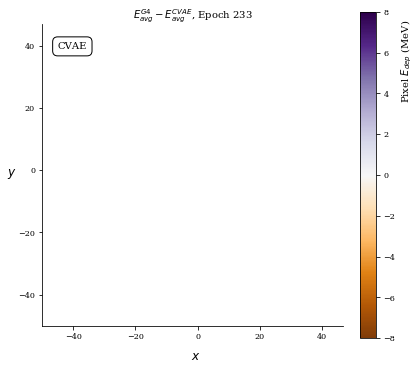

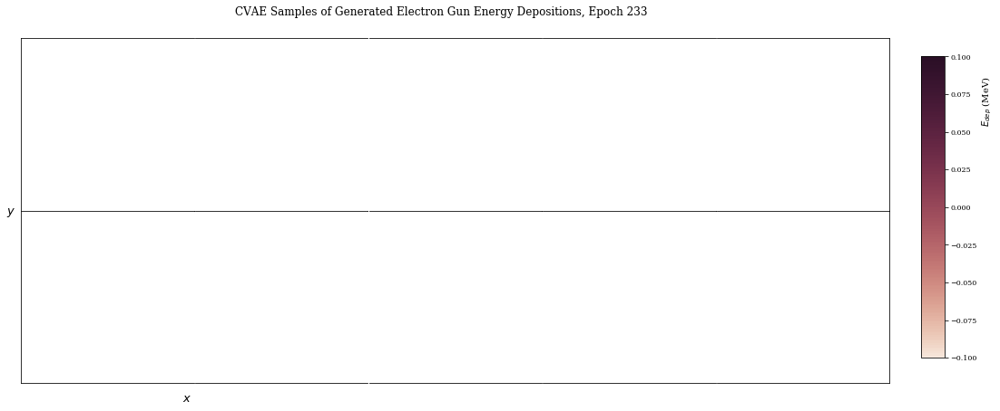

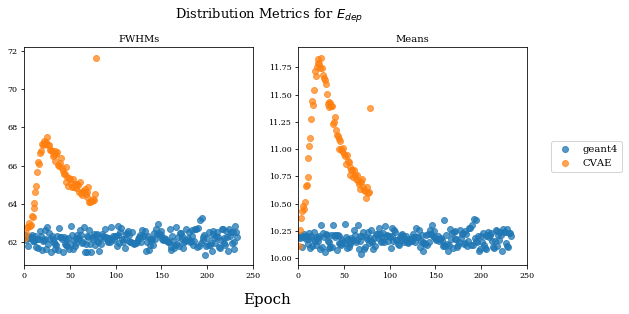

Train Epoch: 233 [0/15000 (0%)]	Loss: nan
Train Epoch: 233 [6400/15000 (43%)]	Loss: nan
Train Epoch: 233 [12800/15000 (85%)]	Loss: nan
====> Epoch: 233 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 234 [0/15000 (0%)]	Loss: nan
Train Epoch: 234 [6400/15000 (43%)]	Loss: nan
Train Epoch: 234 [12800/15000 (85%)]	Loss: nan
====> Epoch: 234 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


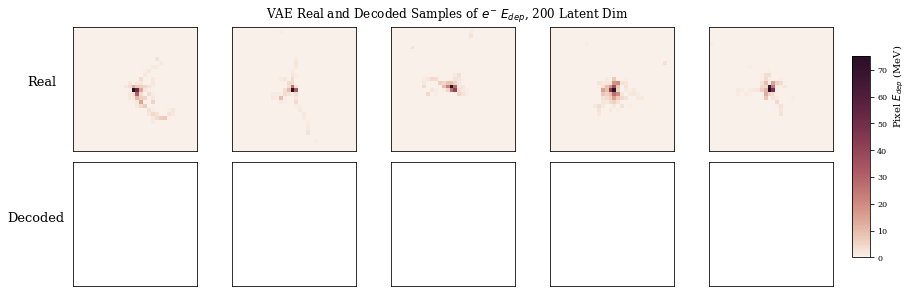

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


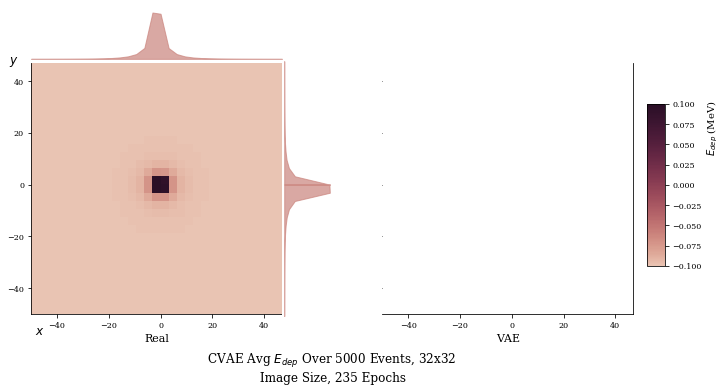

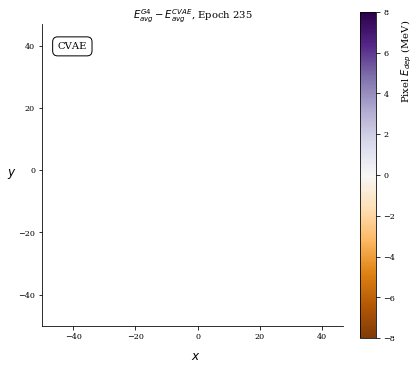

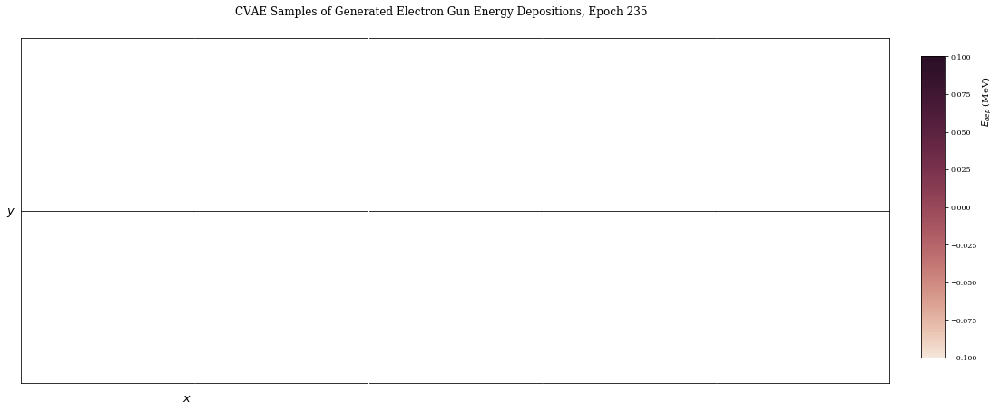

Train Epoch: 235 [0/15000 (0%)]	Loss: nan
Train Epoch: 235 [6400/15000 (43%)]	Loss: nan
Train Epoch: 235 [12800/15000 (85%)]	Loss: nan
====> Epoch: 235 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 236 [0/15000 (0%)]	Loss: nan
Train Epoch: 236 [6400/15000 (43%)]	Loss: nan
Train Epoch: 236 [12800/15000 (85%)]	Loss: nan
====> Epoch: 236 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


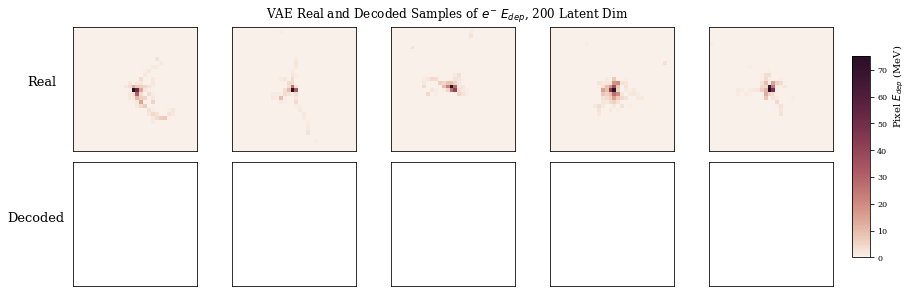

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


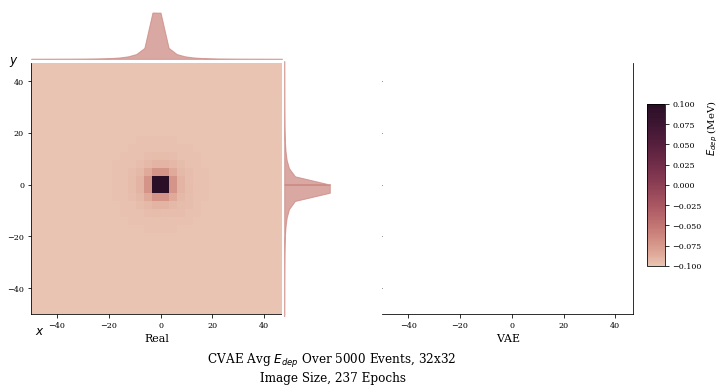

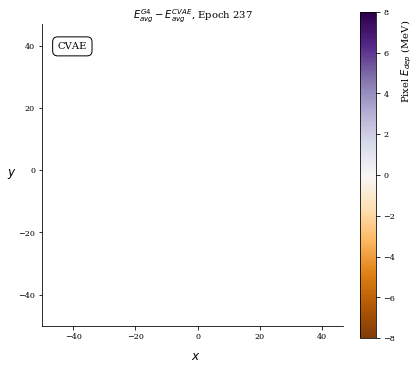

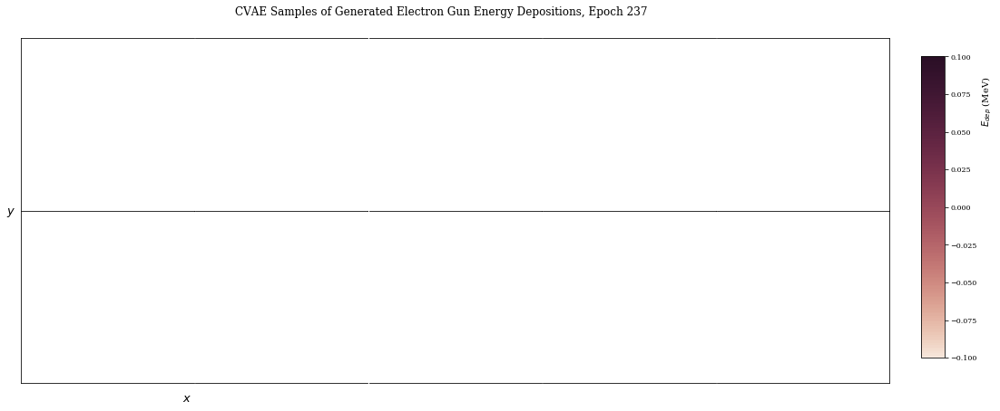

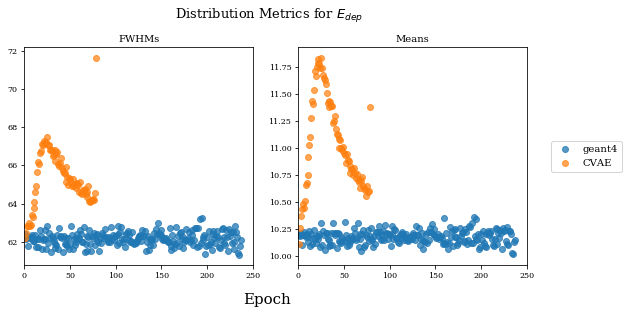

Train Epoch: 237 [0/15000 (0%)]	Loss: nan
Train Epoch: 237 [6400/15000 (43%)]	Loss: nan
Train Epoch: 237 [12800/15000 (85%)]	Loss: nan
====> Epoch: 237 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 238 [0/15000 (0%)]	Loss: nan
Train Epoch: 238 [6400/15000 (43%)]	Loss: nan
Train Epoch: 238 [12800/15000 (85%)]	Loss: nan
====> Epoch: 238 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


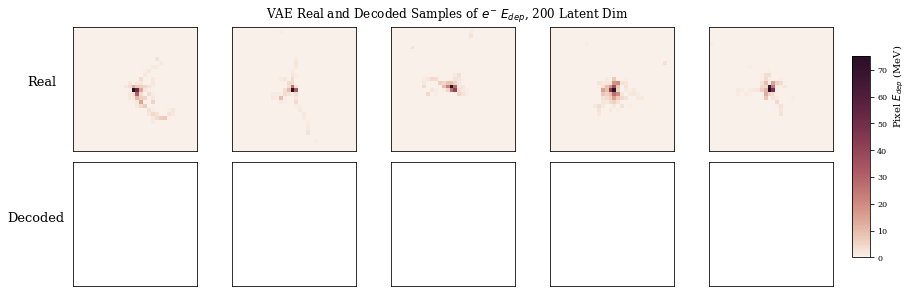

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


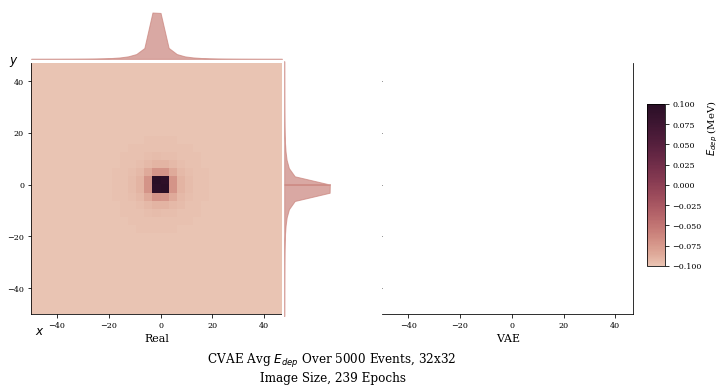

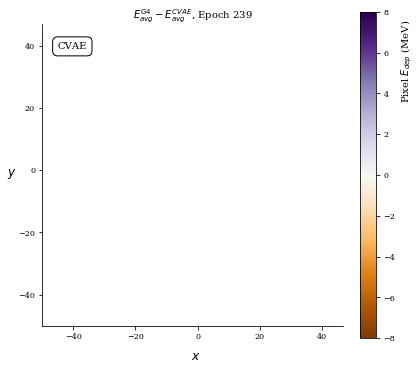

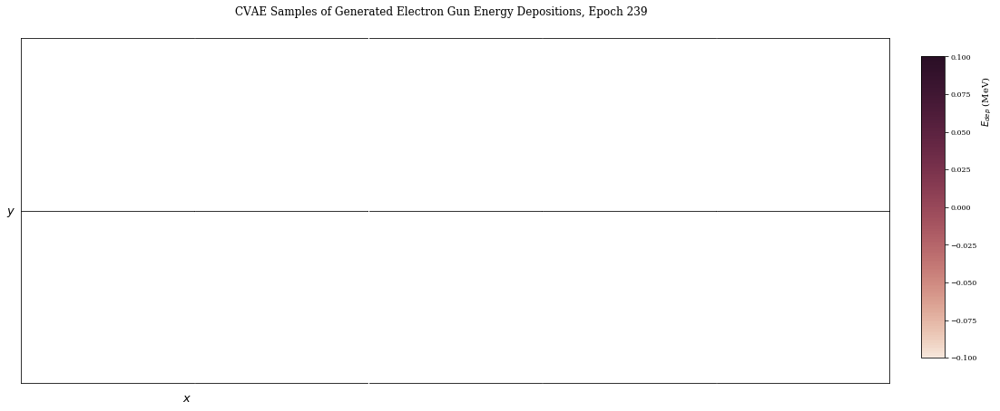

Train Epoch: 239 [0/15000 (0%)]	Loss: nan
Train Epoch: 239 [6400/15000 (43%)]	Loss: nan
Train Epoch: 239 [12800/15000 (85%)]	Loss: nan
====> Epoch: 239 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 240 [0/15000 (0%)]	Loss: nan
Train Epoch: 240 [6400/15000 (43%)]	Loss: nan
Train Epoch: 240 [12800/15000 (85%)]	Loss: nan
====> Epoch: 240 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


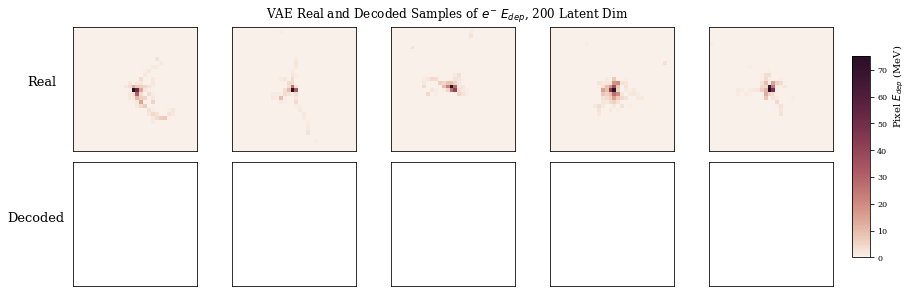

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


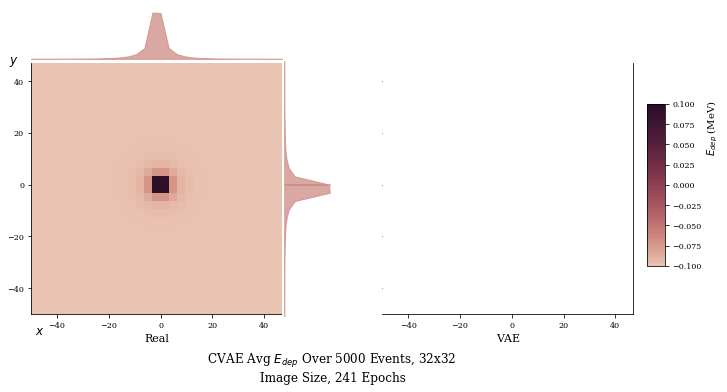

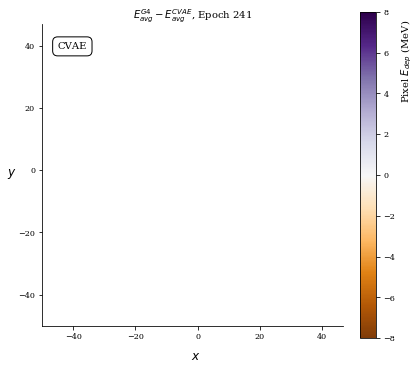

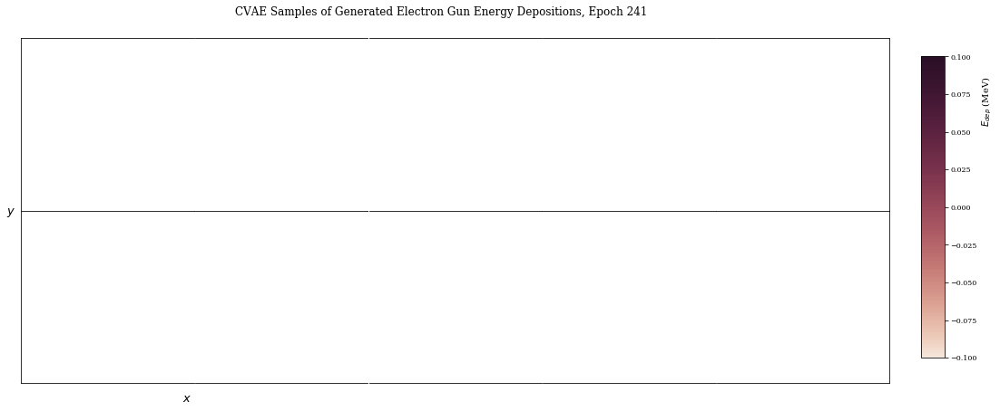

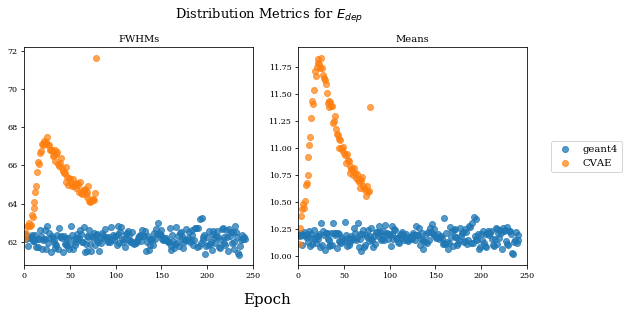

Train Epoch: 241 [0/15000 (0%)]	Loss: nan
Train Epoch: 241 [6400/15000 (43%)]	Loss: nan
Train Epoch: 241 [12800/15000 (85%)]	Loss: nan
====> Epoch: 241 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 242 [0/15000 (0%)]	Loss: nan
Train Epoch: 242 [6400/15000 (43%)]	Loss: nan
Train Epoch: 242 [12800/15000 (85%)]	Loss: nan
====> Epoch: 242 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


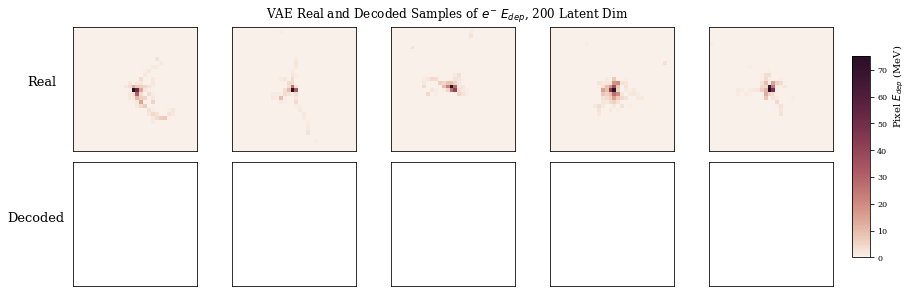

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


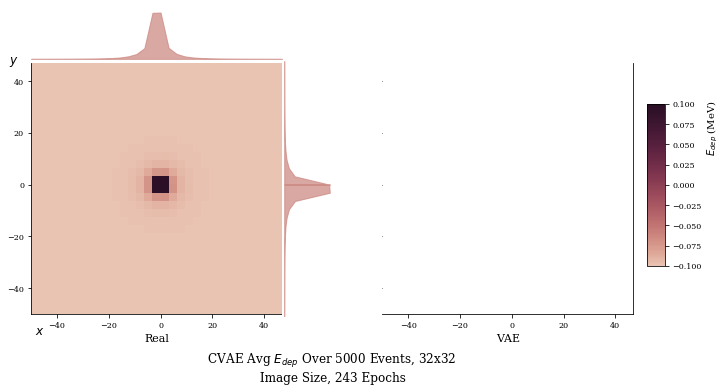

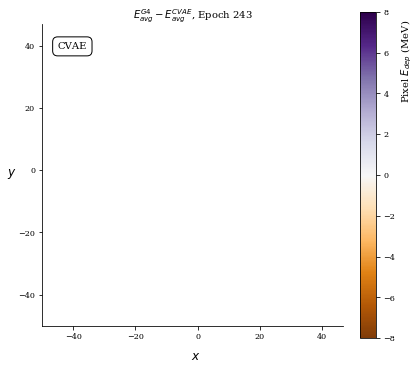

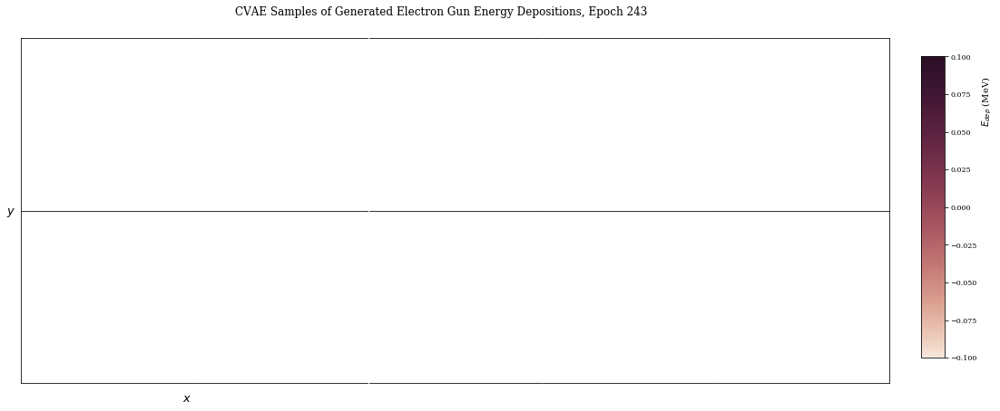

Train Epoch: 243 [0/15000 (0%)]	Loss: nan
Train Epoch: 243 [6400/15000 (43%)]	Loss: nan
Train Epoch: 243 [12800/15000 (85%)]	Loss: nan
====> Epoch: 243 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 244 [0/15000 (0%)]	Loss: nan
Train Epoch: 244 [6400/15000 (43%)]	Loss: nan
Train Epoch: 244 [12800/15000 (85%)]	Loss: nan
====> Epoch: 244 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


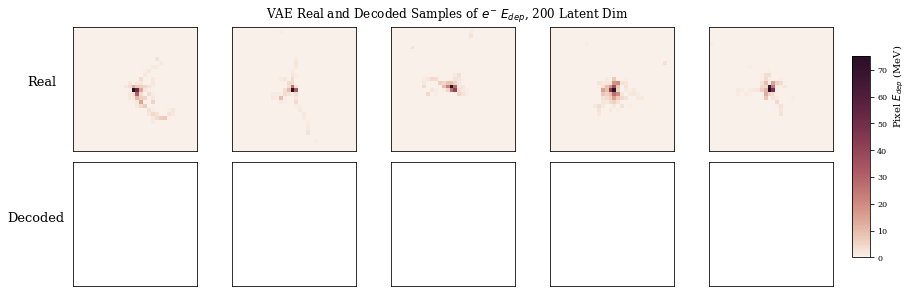

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


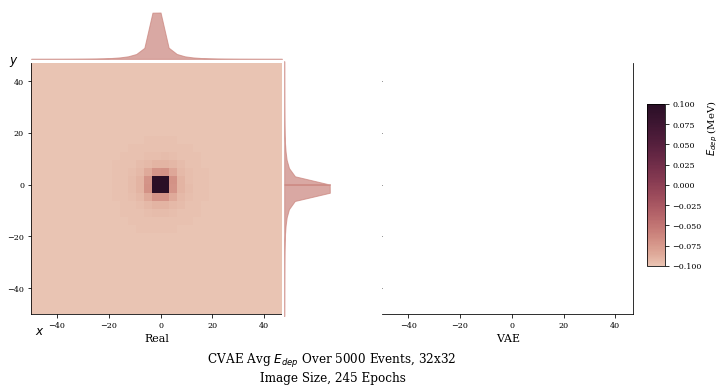

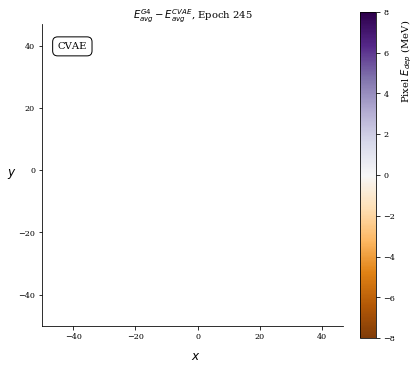

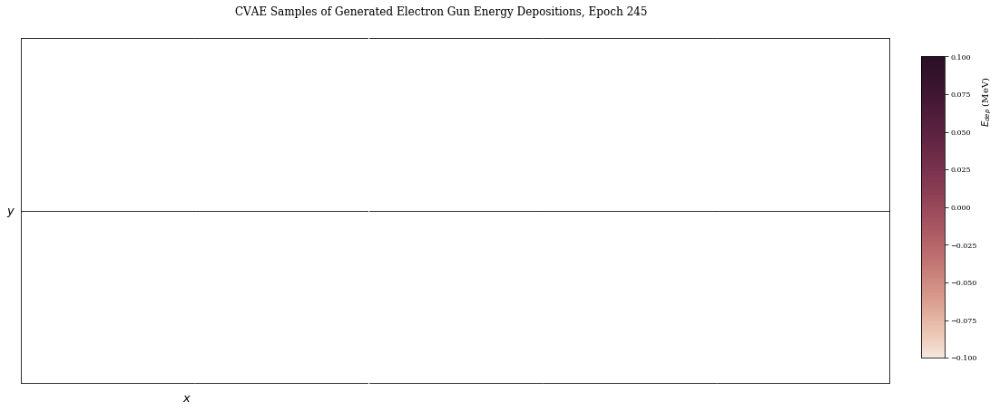

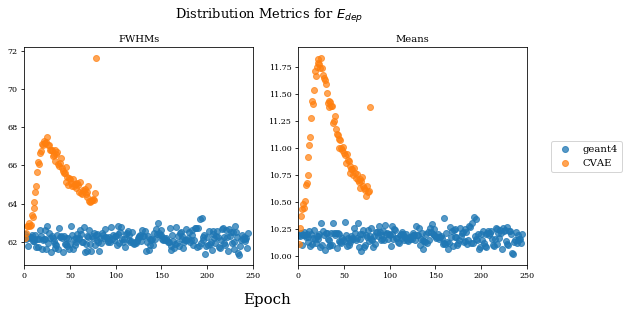

Train Epoch: 245 [0/15000 (0%)]	Loss: nan
Train Epoch: 245 [6400/15000 (43%)]	Loss: nan
Train Epoch: 245 [12800/15000 (85%)]	Loss: nan
====> Epoch: 245 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 246 [0/15000 (0%)]	Loss: nan
Train Epoch: 246 [6400/15000 (43%)]	Loss: nan
Train Epoch: 246 [12800/15000 (85%)]	Loss: nan
====> Epoch: 246 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


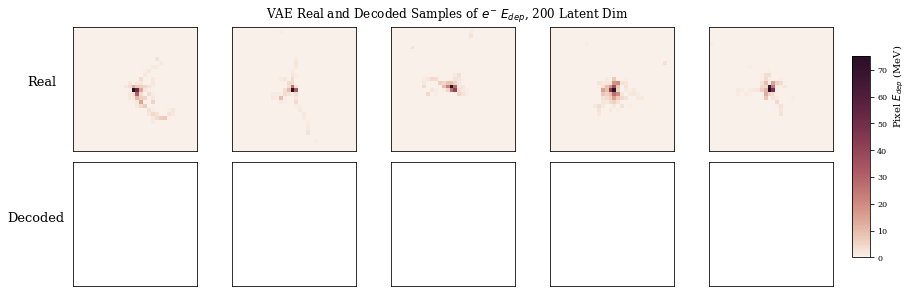

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


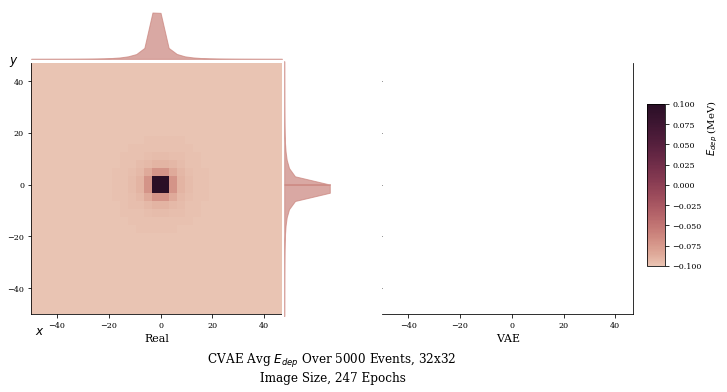

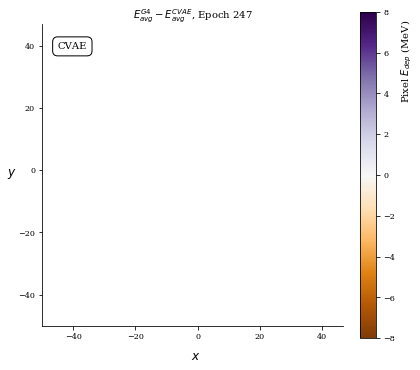

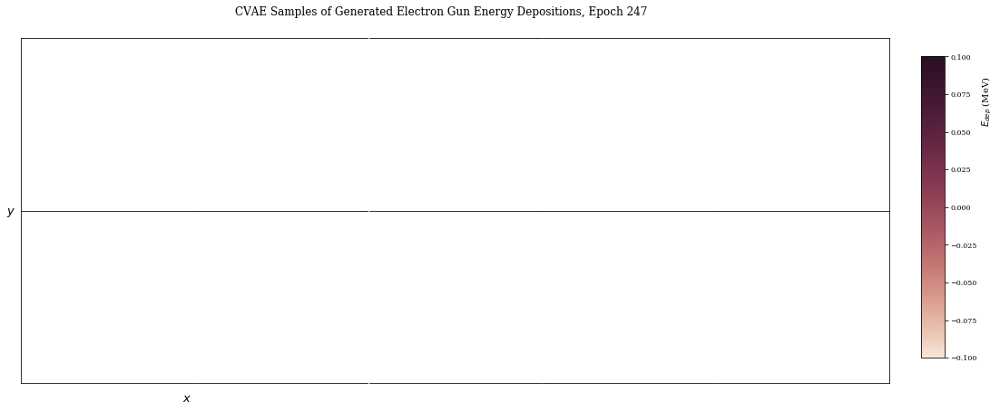

Train Epoch: 247 [0/15000 (0%)]	Loss: nan
Train Epoch: 247 [6400/15000 (43%)]	Loss: nan
Train Epoch: 247 [12800/15000 (85%)]	Loss: nan
====> Epoch: 247 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 248 [0/15000 (0%)]	Loss: nan
Train Epoch: 248 [6400/15000 (43%)]	Loss: nan
Train Epoch: 248 [12800/15000 (85%)]	Loss: nan
====> Epoch: 248 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)


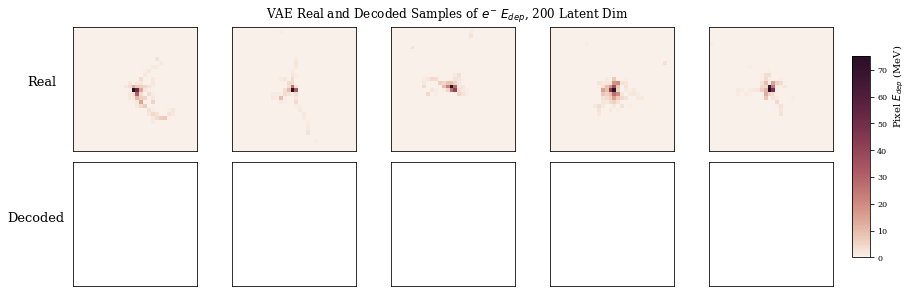

<type 'numpy.ndarray'> <type 'numpy.ndarray'>


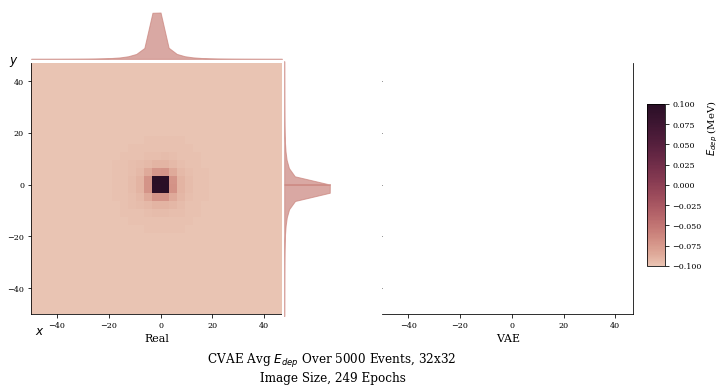

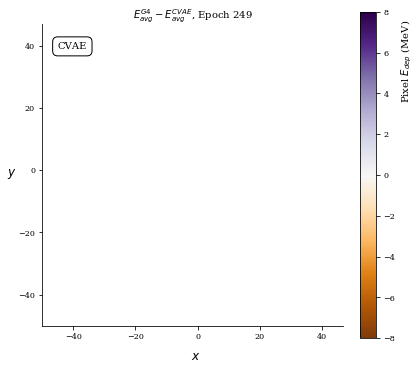

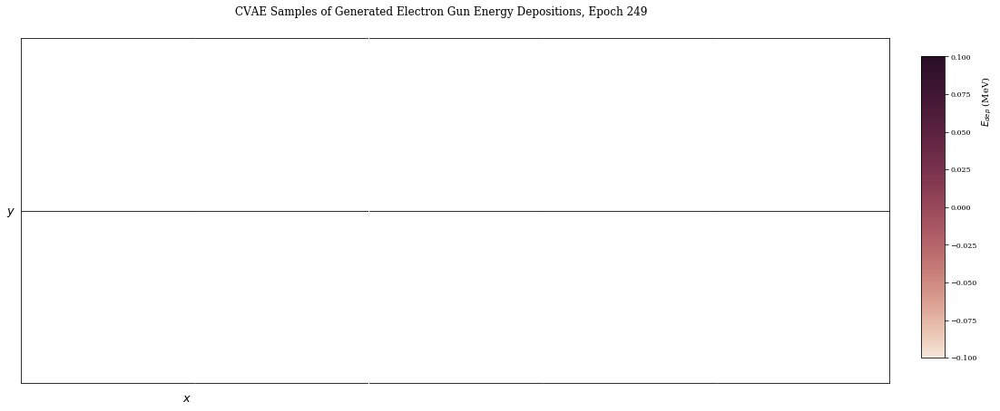

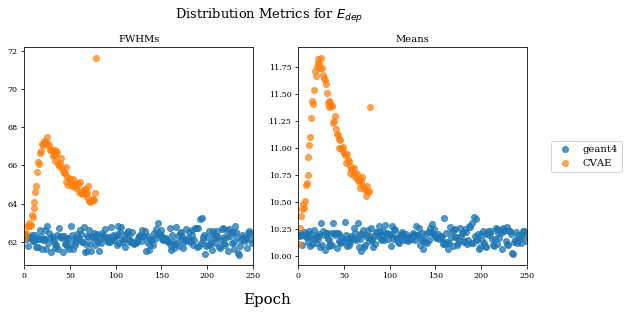

Train Epoch: 249 [0/15000 (0%)]	Loss: nan
Train Epoch: 249 [6400/15000 (43%)]	Loss: nan
Train Epoch: 249 [12800/15000 (85%)]	Loss: nan
====> Epoch: 249 Average loss: nan
====> Test set loss: nan
(5000, 32, 32)
(5000, 32, 32)
Train Epoch: 250 [0/15000 (0%)]	Loss: nan
Train Epoch: 250 [6400/15000 (43%)]	Loss: nan
Train Epoch: 250 [12800/15000 (85%)]	Loss: nan
====> Epoch: 250 Average loss: nan
====> Test set loss: nan


In [33]:
mydir = os.path.join('/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/', 
                     datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S') + "/")
mydir = None
if mydir != None:
    try:
        os.makedirs(mydir)
    except OSError as e:
        if e.errno != errno.EEXIST:
            raise

    with open(mydir + 'NetworkInfo.txt', 'w') as f:
        print >> f, 'model:', model
        print >> f, 'normalization scale:', norm_scale
        print >> f, 'latent dimensionality:', zdim
        print >> f, 'image height/width:', imageSize
        print >> f, 'loss function: MSE + KL div'
        print >> f, 'batch size:', batchSize
        print >> f, 'epochs:', num_epochs
        print >> f, 'beta:', beta
        print >> f, 'gun Energy:', energy
        print >> f, 'last activation layer:', last_decode_act
        print >> f, 'batch size:', batchSize
        print >> f, 'unnormalize loss:', unnormalize_loss
        print >> f, 'pca dimensionality:', pca_dim


num_epochs = 250
for epoch in range(1, num_epochs + 1):
    data_avg, n_events = make_samples(model, avg = True, scale=scale, norm_scale = norm_scale, zdim = zdim,
                                      device = device, imageSize = imageSize, image_array=image_array, pca=pca,n_events = 5000)
    data, n_events = make_samples(model, avg = False, scale = scale, norm_scale = norm_scale, zdim =zdim,
                                  device = device, imageSize = imageSize, image_array=image_array, pca=pca, n_events = 5000)
    
    
    genx_FWHM = hist_width(np.sum(data_avg[1],1))
    realx_FWHM = hist_width(np.sum(data_avg[0],1))
    genx_mean = np.sum(data_avg[1],1).mean()
    #print genx_mean
    realx_mean = np.sum(data_avg[0],1).mean()
    sum_difference = calc_sum_difference(data_avg)
    sum_differences.append(sum_difference)
    genx_FWHMs.append(genx_FWHM)
    realx_FWHMs.append(realx_FWHM)
    genx_means.append(genx_mean)
    realx_means.append(realx_mean)
    epochs.append(epoch)
    if epoch % 2 == 1:
        plot_reconstructions(model, save_dir=mydir, conv=False, simple=False, n=5, epoch = epoch)
        plot_avg_both(real_data=data_avg[0],fake_data = data_avg[1], n_events = n_events, epoch=epoch, imageSize=imageSize,
                      save_dir = mydir)
        plot_difference(data_avg, epoch = epoch, imageSize=imageSize, n_events = n_events, save_dir=mydir)
        samples(model, epoch = epoch, zdim = zdim, beta = beta, norm_scale = norm_scale, scale = scale, 
                imageSize = imageSize, last_decode_act = last_decode_act, device = device, pca = pca,
                save_dir = mydir, rows = 2, columns = 5)
    if epoch % 4 == 1:
        plot_all_metrics(genx_FWHMs, realx_FWHMs, genx_means, realx_means,epochs = epochs, n_epochs=num_epochs, save_dir = mydir)
        #plot_sum_difference(sum_differences, epochs=epochs)
    train(epoch, train_losses)
    test(epoch, test_losses)
    #if epoch % 4 == 1:
    #    plot_losses(train_losses, test_losses, epochs = epochs, n_epochs=num_epochs, save_dir = mydir)
    #if epoch == num_epochs:
    #    samples(model, rows=1,columns=1, save_dir=mydir,  epoch = epoch, beta = beta)
        
    

In [ ]:

samples(model, rows=1,columns=1, save_dir=mydir,  epoch = epoch, beta = beta)

#del epochs[270], train_losses[270], test_losses[270], genx_FWHMs[270], realx_FWHMs[270], genx_means[270], realx_means[270]
#plot_losses(train_losses, test_losses, epochs = epochs, n_epochs=num_epochs, save_dir = mydir)

In [152]:
MakeGif = True
gif_filename =  mydir + 'VAE_EGun_Erecon_GIF_'  + str(batchSize) + "BatchSize_" + str(num_epochs) + "Epochs_" + str(zdim) +"LatentDim.gif"
        
import imageio
if MakeGif == True:
    png_dir = mydir
    images = []
    file_paths = []
    for subdir, dirs, files in os.walk(png_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            #if file_path.endswith(".png"):
            if "EdepFor5Events" in file_path:
                file_paths.append(file_path)
    #print file_paths
    #file_paths.sort(key=float) 
    file_paths.sort(key=lambda x: int(''.join(filter(str.isdigit, x))))
    for i in range(len(file_paths)):      
        images.append(imageio.imread(file_paths[i]))

    imageio.mimsave(gif_filename, images)


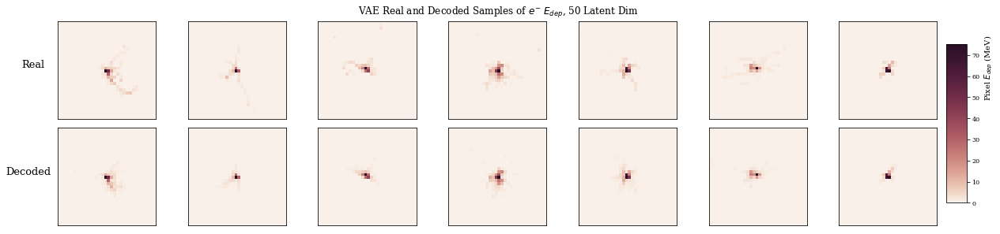

In [109]:
plot_reconstructions(model, save_dir=None, conv=False, simple=False, n=7, epoch = epoch)

In [225]:
# def make_samples(model, avg, n_events=500, real=True, fake = True, scale = scale, norm_scale = norm_scale ):
    
#     sample = torch.randn(n_events, zdim).to(device)
#     sample = model.decode(sample).cpu()
#     sample_new = sample.view(n_events, 1, imageSize, imageSize).detach().numpy().squeeze()
#     fake_images_array = unnormalize(sample_new, scale = scale, norm_scale = norm_scale)
    
    
#     randints = np.random.randint(low = 0,high = normed_array.shape[0], size = n_events)
#     real_images_array = unnormalize(normed_array[randints].squeeze(),norm_scale = norm_scale, scale = scale)
    
#     if avg == True:
#         fake_images_array = np.sum(fake_images_array,axis=0) / n_events
#         real_images_array = np.sum(real_images_array, axis=0) / n_events
    
#     if real == True and fake == True:
#         return [real_images_array,fake_images_array], n_events
#     elif (real == False) and (fake == True):
#         return fake_images_array
#     else:
#         return real_images_array
    
    

# lr = 1e-4

# def plot_avg(data, n_events, withMarginals=True, save_dir = mydir, epoch = epoch, batchSize=batchSize, imageSize=imageSize, lr=lr, last_decode_act=last_decode_act):

#     test_noNans = np.copy(data)
#     test_unnormed = data
#     if last_decode_act == F.sigmoid:
#         test_unnormed[test_unnormed < 0.001] = np.nan
#     else:
#         test_unnormed[test_unnormed <= 0.0] = np.nan
    
#     fig=plt.figure(figsize=(6, 6))
#     xran = (-50,50)
#     yran = (-50,50)
#     extent = xran + yran
#     cmap = sns.cubehelix_palette(dark = 0.4, light=0.93, gamma = 2.5, hue = 1, start =0, as_cmap=True)
#     color_list = sns.cubehelix_palette(dark=0.4, light=0.93, gamma=2.5, hue=1).as_hex()
    
#     if withMarginals == False:
#         marginals_str = 'woMarginals'
#         plt.hist2d(fake.to('cpu').detach().numpy()[0][0][:,0], fake.to('cpu').detach().numpy()[0][0][:,1])
#         im = ax.imshow(test_unnormed, vmin = 0, extent=extent, origin='lower', cmap=cmap)
#         cbar = plt.colorbar(im, fraction=0.05, pad=0.05)
#         cbar.set_label(r'Pixel $E_{dep}$ (MeV)', y=0.85)
#         if save_dir != None:
#             #directory = "/home/chris/Documents/MPhilProjects/ForViewing/Geant4/SingleLayerEGun/AverageImage/"
#             filename = "VAE_AvgEdepOver" + str(n_events) + "Events_" + str(imageSize) + "x" +str(imageSize) \
#                         + "Image_Epochs" + str(epoch) + "_" + str(batchSize) + "batchSize_" +  str(lr) + "lr"
#             plt.savefig(directory + filename)
        
#     else:
#         marginals_str = 'withMarginals'
#         img=test_noNans
#         t = np.arange(-50,50, 100/float(imageSize))
#         #t = np.arange(img.shape[0])
#         f = np.arange(-50,50, 100/float(imageSize))
#         #f = np.arange(img.shape[1])
#         flim = (f.min(), f.max())
#         tlim = (t.min(), t.max())

#         gs = gridspec.GridSpec(2, 2, width_ratios=[1,5], height_ratios=[1,5])
#         gs.update(hspace=0, wspace=0)

#         ax = fig.add_subplot(gs[1,1])
#         im = ax.imshow(test_unnormed, vmin = 0, extent = extent, origin = 'lower', cmap = cmap)
#         cbaxes = fig.add_axes([0.97, 0.18, 0.03, 0.55]) 
#         cbar = plt.colorbar(mappable=im, ticks = None, cax=cbaxes, use_gridspec=True)
#         ax.yaxis.set_ticks_position('right')
#         cbar.set_label(r'Pixel $E_{dep}$ (MeV)', y=0.85)
#         ax.spines["top"].set_visible(False)
#         ax.spines['left'].set_visible(False)

#         axl = fig.add_subplot(gs[1,0], sharey=ax)
#         axl.fill_between(img.mean(1), f, alpha = 0.7, color = color_list[1])
#         axl.invert_xaxis()
#         axb = fig.add_subplot(gs[0,1], sharex=ax)
#         axb.fill_between(t, img.mean(0), alpha =0.7, color= color_list[1])

#         plt.setp(axl.get_yticklabels(), visible=False)
#         plt.setp(axb.get_xticklabels(), visible=False)
#         plt.setp(axl.get_xticklabels(), visible=False)
#         plt.setp(axb.get_yticklabels(), visible=False)

#         axl.yaxis.set_ticks_position('none')
#         axb.xaxis.set_ticks_position('none')
#         axl.xaxis.set_ticks_position('none')
#         axb.yaxis.set_ticks_position('none')


#         axl.spines["top"].set_visible(False)
#         axl.spines['right'].set_visible(False)
#         axl.spines['left'].set_visible(False)
#         axl.spines['bottom'].set_visible(False)
#         axb.spines["top"].set_visible(False)
#         axb.spines["right"].set_visible(False)
#         axb.spines["left"].set_visible(False)
#         axb.spines["bottom"].set_visible(False)
#         ax.set_xlim(tlim)
#         ax.set_xlabel(r"$\mathit{x}$", fontsize = 12)
#         ax.xaxis.set_label_coords(0.02,-0.05)
#         ax.set_ylim(tlim)
#         ax.set_ylabel(r"$\mathit{y}$", fontsize = 12, rotation = 0)
#         ax.yaxis.set_label_coords(1.07,0.98)
#         if save_dir != None:
#             learning_rate = '%.0E' % Decimal(lr)
#             #directory = "/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/"
#             filename = "VAE_AvgEdep"+str(marginals_str) + "Over" + str(n_events) + "Events_" + str(imageSize) + "x" +str(imageSize) \
#                         + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize_" +  str(learning_rate) + "lr.png"
#             plt.savefig(save_dir + filename, bbox_inches='tight')
#         plt.show()
#     return


# def plot_sns(n_events = 500, n_samples = 3, save_dir = None, epoch = epoch, batchSize=batchSize, imageSize=imageSize, lr=lr, norm_scale = norm_scale):
    
#     fig, axn = plt.subplots(1, n_samples, figsize=(12,4), sharex=True, sharey=True)
#     xran = (-50,50)
#     yran = (-50,50)
#     extent = xran + yran

#     #xticks = [-50,-25,0,25,50]
#     #yticks = [-50,-25,0,25,50]
#     for i, ax in enumerate(axn.flat):
#         noise = torch.randn(batchSize, nz, 1, 1, device=device)
#         fake = netG(noise)
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)
#         ax.spines['bottom'].set_visible(True)
#         if i != 0:
#             ax.spines['left'].set_visible(False)
#         if i == 0:
#             ax.set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
#             ax.set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)
#         ax.set_title("Ex " +str(i), x =0.85, y = 0.88, alpha=0.6, fontweight='heavy', fontsize=11)
#         test_image = fake.to('cpu').detach().numpy()[0][0]
#         test_unnormed =  unnormalize(test_image, scale)
#         #test_unnormed = logistic_unnormalize(test_image, scale)
#         test_unnormed[test_unnormed < 0.1] = np.nan
#         cmap = sns.cubehelix_palette(dark = 0.4, light=0.99, gamma = 2.5, hue = 1, start =0, as_cmap=True)
#         #sns.heatmap(test_unnormed, ax=ax, cmap=cmap,
#         #            cbar=i == 0, cbar_ax=None if i else cbar_ax, square=True,
#         #            vmin = 0, vmax = 80, xticklabels = xticks, yticklabels=xticks)
#         im = ax.imshow(test_unnormed, vmin = 0, vmax=10, extent=extent, origin='lower', cmap=cmap)
#         ax.tick_params(axis=u'both', which=u'both',length=0)

#     fig.tight_layout(rect=[0, 0, .9, 1])
#     cbar_ax = fig.add_axes([0.9, 0.25, 0.025, 0.5])
#     fig.colorbar(im, cax=cbar_ax)
#     fig.subplots_adjust(wspace=0.1, hspace=0)
#     fig.suptitle("Samples of Generated Electron Gun Energy Depositions",x=0.5,y=0.99)
#     if save_dir != None:
#         learning_rate = '%.0E' % Decimal(lr)
#         #directory = "/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/"
#         filename = "VAE_3SampleEdepOver" + str(n_events) + "Events_" + str(imageSize) + "x" +str(imageSize) \
#                     + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize_" +  str(learning_rate) + "lr.png"
#         plt.savefig(save_dir + filename, bbox_inches='tight')
#     plt.show()
#     return



# def plot_avg_both(real_data, fake_data, n_events, withMarginals=True, save_dir=None, epoch = epoch, batchSize=batchSize, imageSize=imageSize, lr=lr, norm_scale = norm_scale):
#     fig=plt.figure(figsize=(10,5))
#     xran = (-50,50)
#     yran = (-50,50)
#     extent = xran + yran

#     #real_data = real_image
#     img = real_data
#     test_unnormed = fake_data
#     test_noNans = np.copy(test_unnormed)
#     img2 = test_noNans
#     t = np.arange(-50,50, 100/float(imageSize))
#     #t = np.arange(img.shape[0])
#     f = np.arange(-50,50, 100/float(imageSize))
#     #f = np.arange(img.shape[1])
#     flim = (f.min(), f.max())
#     tlim = (t.min(), t.max())


#     gs = gridspec.GridSpec(2, 4, width_ratios=[5,1,1,5], height_ratios=[1,5])
#     gs.update(hspace=0, wspace=0)
#     ax1 = fig.add_subplot(gs[1,0])
#     axl = fig.add_subplot(gs[1,1], sharey=ax1)
#     axb = fig.add_subplot(gs[0,0], sharex=ax1)
#     ax2 = fig.add_subplot(gs[1,3])
#     axl2= fig.add_subplot(gs[1,2], sharey=ax2)
#     axb2= fig.add_subplot(gs[0,3], sharex=ax2)
#     plt.setp(axl.get_yticklabels(), visible=False)
#     plt.setp(axb.get_xticklabels(), visible=False)
#     plt.setp(axl.get_xticklabels(), visible=False)
#     plt.setp(axb.get_yticklabels(), visible=False)
#     plt.setp(axl2.get_yticklabels(), visible=False)
#     plt.setp(axb2.get_xticklabels(), visible=False)
#     plt.setp(axl2.get_xticklabels(), visible=False)
#     plt.setp(axb2.get_yticklabels(), visible=False)
#     axl.yaxis.set_ticks_position('none')
#     axb.xaxis.set_ticks_position('none')
#     axl.xaxis.set_ticks_position('none')
#     axb.yaxis.set_ticks_position('none')
#     axl2.yaxis.set_ticks_position('none')
#     axb2.xaxis.set_ticks_position('none')
#     axl2.xaxis.set_ticks_position('none')
#     axb2.yaxis.set_ticks_position('none')
#     cmap = sns.cubehelix_palette(dark = 0.4, light=0.915, gamma = 2.5, hue = 1, start =0, as_cmap=True)
#     im = ax1.imshow(real_data, vmin = 0, extent =extent, origin='lower', cmap=cmap)
#     ax1.spines["top"].set_visible(False)
#     ax1.spines['right'].set_visible(False)
#     #ax.spines['left'].set_visible(False)
#     color_list = sns.cubehelix_palette(dark=0.4, light=0.915, gamma=2.5, hue=1).as_hex()
#     axl.fill_between(img.mean(1), f, alpha = 0.7, color = color_list[1])
#     axl.spines["top"].set_visible(False)
#     axl.spines['right'].set_visible(False)
#     axl.spines['left'].set_visible(False)
#     axl.spines['bottom'].set_visible(False)
#     axb.fill_between(t, img.mean(0), alpha =0.7, color= color_list[1])
#     axb.spines["top"].set_visible(False)
#     axb.spines["right"].set_visible(False)
#     axb.spines["left"].set_visible(False)
#     axb.spines["bottom"].set_visible(False)
#     ax1.set_xlim(tlim)
    
#     ax1.set_ylim(tlim)


#     #RECONSIDER TAKING OUT THE LESS THAN 0 VALUES
#     #real_data[real_data < 0.0] = np.nan 


#     #test_unnormed[test_unnormed < 0.0] = np.nan
#     #print test_unnormed.max()
#     im = ax2.imshow(test_unnormed, vmin = 0, extent=extent, origin='lower', cmap=cmap)
#     ax2.spines["top"].set_visible(False)
#     ax2.spines['left'].set_visible(False)
#     axl2.fill_between(img2.mean(1), f, alpha = 0.7, color = color_list[1])
#     axl2.invert_xaxis()
#     axl2.spines["top"].set_visible(False)
#     axl2.spines['right'].set_visible(False)
#     axl2.spines['left'].set_visible(False)
#     axl2.spines['bottom'].set_visible(False)
#     axb2.fill_between(t, img2.mean(0), alpha =0.7, color= color_list[1])
#     axb2.spines["top"].set_visible(False)
#     axb2.spines["right"].set_visible(False)
#     axb2.spines["left"].set_visible(False)
#     axb2.spines["bottom"].set_visible(False)
#     ax2.set_xlim(tlim)
#     ax2.set_ylim(tlim)

#     ax1.set_xlabel("Real", fontsize=11)  
#     ax2.set_xlabel("VAE", fontsize=11)
#     ax1.set_ylabel(r"$\mathit{y}$", fontsize = 12, rotation = 0)
#     ax1.yaxis.set_label_coords(-0.07,0.98)
#     fig.tight_layout(rect=[0, 0, .9, 1])
#     cbar_ax = fig.add_axes([0.9, 0.25, 0.025, 0.45])
#     cb = fig.colorbar(im, cax=cbar_ax)
#     cb.set_label(r'$E_{dep}$ (MeV)', y =0.85)
#     plt.figtext(0.05,0.060,r"$\mathit{x}$", fontsize = 12)
#     fig.subplots_adjust(wspace=0.1, hspace=0)
#     fig.suptitle(r" VAE Avg $E_{dep}$ Over " + str(n_events) + " Events, "
#                  + str(imageSize) + "x" +str(imageSize) + " \n Image Size, " + str(epoch) 
#                  + " Epochs, " + str(batchSize) + " Batch Size", x = 0.46, y = 0.02)
#     if save_dir != None:
#         learning_rate = '%.0E' % Decimal(lr)
#         #directory = "/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/"
#         filename = "VAE_RealandFakeAvgEdep"+str(withMarginals) + "Over" + str(n_events) + "Events_" + str(imageSize) + "x" +str(imageSize) \
#                             + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize_" +  str(learning_rate) + "lr"
#         plt.savefig(save_dir + filename, bbox_inches='tight')
#     plt.show()
#     return



# def samples(source, epoch = epoch, save_dir=None, rows=2, columns=5, imageSize = imageSize, batchSize = batchSize, norm_scale = norm_scale, scale=scale, beta=beta):
#     xran = (-50,50)
#     yran = (-50,50)
#     extent = xran + yran

#     #rows  = 2
#     #columns = 5

#     if rows <= 3 and columns <=5:
#         scale_factor = 3.5
#     else:
#         scale_factor = 2

#     #real = False
#     if type(source).__module__ == 'numpy':
#         real = True
#         randints = np.random.randint(low = 0,high = normed_array.shape[0], size = 64)
#         data = unnormalize(source[randints].squeeze(),norm_scale = norm_scale, scale = scale)
        
#         #data= next(iter(test_loader))[0].detach().numpy().squeeze()
#     else:
#         real = False
#         sample = torch.randn(64, zdim).to(device)
#         sample = model.decode(sample).cpu()
#         data = unnormalize(sample.view(64, 1, imageSize, imageSize).detach().numpy().squeeze(), norm_scale = norm_scale, scale = scale)
    
        
#     cmap = sns.cubehelix_palette(dark = 0.4, light=0.965, gamma = 2.5, hue = 1, start =0, as_cmap=True)
    
#     if (rows == 1) and (columns == 1):

#         fig, ax = plt.subplots(rows, columns, figsize=(5,5))
#         image_array = data[0]
#         if last_decode_act == F.sigmoid:
#             image_array[image_array < 0.001] = np.nan
#         else:
#             image_array[image_array <= 0] = np.nan
#         im = ax.imshow(image_array, cmap=cmap, extent = extent, origin='lower')
#         ax.set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
#         ax.set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)
#     else:
#         fig, axes =plt.subplots(rows,columns, figsize=(scale_factor*columns, scale_factor*rows), sharex=True,sharey=True)
#         #print(len(axes))
#         event_number = 0
#         plt.locator_params(axis='y', nbins=1)
#         plt.locator_params(axis='x', nbins=2)
#         #fig.xticks(rotation=45)
#         for i in range(rows):
#             for j in range(columns):

#                 #print(range(rows))
#                 image_array = data[event_number]
            
#                 if last_decode_act == F.sigmoid:
#                     image_array[image_array < 0.001] = np.nan
#                 else:
#                     image_array[image_array <= 0] = np.nan
#                 #cmap = sns.light_palette((210, 95, 30), input='husl', as_cmap=True)
#                 #cmap = sns.dark_palette('muted purple', as_cmap=True, input='xkcd')
#                 #cmap = sns.color_palette("BrBG",7)
#                 #img = ax.imshow(image_array[0], vmin = 0, extent=extent, origin='lower', cmap=cmap)
#                 #axes[i,j].set_aspect('equal')
#                 plt.axis('on')
#                 if rows == 1:
#                     #axes[j] = plt.subplot(gs1[i,j])
#                     if j != 0:
#                         axes[j].spines['left'].set_visible(False)
#                     else:
#                         axes[j].set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
#                         axes[j].set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)
#                     axes[j].spines['top'].set_visible(False)
#                     axes[j].spines['right'].set_visible(False)
#                     #axes[j].spines['bottom'].set_visible(False)
#                     #axes[j].spines['left'].set_visible(False)
#                     #axes[j].set_aspect('equal')
#                     im =axes[j].imshow(image_array, vmin = 0, extent=extent, origin='lower', cmap=cmap)
#                     #axes[i,j].set_xticklabels([-100,0,100],rotation=90)
#                     axes[j].set_xticklabels([])
#                     axes[j].set_yticklabels([])
#                     axes[j].xaxis.set_ticks_position('none')
#                     axes[j].yaxis.set_ticks_position('none')
#                     event_number +=1
#                 else:
#                     #axes[i,j].spines['top'].set_visible(False)
#                     axes[i,j].spines['bottom'].set_visible(True)
#                     if j!= 0:
#                         axes[i,j].spines['left'].set_visible(False)
#                     if i == range(rows)[-1] and j == 0:
#                         axes[i,j].set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
#                         axes[i,j].set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)

#                     if j == range(columns)[-1]:
#                         axes[i,j].spines['right'].set_visible(True)
#                     else:
#                         axes[i,j].spines['right'].set_visible(False)
#                     im =axes[i,j].imshow(image_array, vmin = 0, extent=extent, origin='lower', cmap=cmap)
#                     #axes[i,j].set_xticklabels([-100,0,100],rotation=90)
#                     axes[i,j].set_xticklabels([])
#                     axes[i,j].set_yticklabels([])
#                     axes[i,j].xaxis.set_ticks_position('none')
#                     axes[i,j].yaxis.set_ticks_position('none')
#                     event_number +=1

#     if rows==1 and columns ==1:
#         if imageSize == 64:
#             cbar_ax = fig.add_axes([0.9, 0.18, 0.02, 0.66])
#         elif imageSize == 32:
#             cbar_ax = fig.add_axes([0.92, 0.18, 0.02, 0.66])
#     else:
#         cbar_ax = fig.add_axes([0.92, 0.18, 0.02, 0.66])
#     # fig.text(0.5,0.04, "Some very long and even longer xlabel", ha="center", va="center")
#     #fig.text(0.05,0.5, "Some quite extensive ylabel", ha="center", va="center", rotation=90)

#     cb = fig.colorbar(im, cax=cbar_ax)
#     cb.set_label(r'$E_{dep}$ (MeV)', y =0.85)
#     #plt.tight_layout()
#     fig.subplots_adjust(wspace=-0.085, hspace=0.00)
#     if real == True:
#         fig.suptitle("Samples of Geant4 Electron Gun Energy Depositions", y = 0.95)
#     else:
#         if rows==1 and columns ==1:
#             fig.suptitle(r"$\beta$-VAE,$\quad$ $\beta=$"+str(beta), y=0.95)
#         else:
#             fig.suptitle("VAE Samples of Generated Electron Gun Energy Depositions, Epoch " + str(epoch), y=0.95)

#     num_samples = rows * columns


#     if save_dir != None:
#         if real == True:
#             type_string = "real"
#         else:
#             type_string = "fake"

#         #learning_rate = '%.0E' % Decimal(lr)
#         #directory = "/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/"
#         filename = "VAE"+str(num_samples) + type_string+ "SamplesEdepOver"  + str(imageSize) + "x" +str(imageSize) \
#                            + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize"
#         #print(save_dir)
#         plt.savefig(save_dir + filename, bbox_inches='tight')


#     plt.show()
#     return



# def calc_sum_difference(real_fake_list):
#     real = real_fake_list[0]
#     fake = real_fake_list[1]
#    # data = (real - fake) 
#     sum_diff = (real.sum() - fake.sum()) 
#     return sum_diff


# def plot_difference(real_fake_list, n_events = 500, save_dir = None, epoch = epoch, batchSize=batchSize, imageSize=imageSize, lr=lr, norm_scale = norm_scale):
# #mean_normalizer = data_test[1][data_test[1] > 0.0].max()

#     real = real_fake_list[0]
#     fake = real_fake_list[1]
#     data = (real - fake) 
    
#     #sum_diff = (real.sum() - fake.sum()) / data.size()
# #plot_avg(data_diff, n_events = 5000, save_dir=None)
#     test_noNans = np.copy(data)
#     test_unnormed = data
# #test_unnormed[test_unnormed < ] = np.nan

#     xran = (-50,50)
#     yran = (-50,50)
#     extent = xran + yran
    
#     if imageSize == 64:
#         vmin = -4
#         vmax = 4
#     elif imageSize == 32:
#         vmin = -8
#         vmax = 8
    
#     t = np.arange(-50,50, 100/float(imageSize))
#     #t = np.arange(img.shape[0])
#     f = np.arange(-50,50, 100/float(imageSize))
#     #f = np.arange(img.shape[1])
#     flim = (f.min(), f.max())
#     tlim = (t.min(), t.max())
#     #cmap = sns.cubehelix_palette(dark = 0.4, light=0.93, gamma = 2.5, hue = 1, start =2, as_cmap=True)
#     #cmap = sns.light_palette((210, 95, 30), input='husl', as_cmap=True)
#     #cmap = sns.color_palette("BrBG", 7, as_cmap=True)
#     cmap = sns.diverging_palette(30, 270, s=80, l=55, n=11, as_cmap = True)
#     color_list = sns.cubehelix_palette(dark=0.4, light=0.93, gamma=2.5, hue=1).as_hex()


#     fig, ax=plt.subplots(figsize=(6, 6))
#     #plt.hist2d(fake.to('cpu').detach().numpy()[0][0][:,0], fake.to('cpu').detach().numpy()[0][0][:,1])
#     im = ax.imshow(test_unnormed, vmin = vmin,vmax = vmax, extent=extent, origin='lower', cmap='PuOr', label ='VAE')
#     cbar = plt.colorbar(im, fraction=0.05, pad=0.05)
#     cbar.set_label(r'Pixel $E_{dep}$ (MeV)', y=0.85)
#     plt.title(r"$E_{avg}^{G4} - E_{avg}^{VAE}$, Epoch " + str(epoch))
#     ax.text(-45, 39, 'VAE', color='black', 
#         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
#     #plt.legend(loc = 'best')
#     ax.set_xlim(tlim)
#     ax.set_xlabel(r"$\mathit{x}$", fontsize = 12)
#     ax.xaxis.set_label_coords(0.51,-0.08)
#     ax.set_ylim(tlim)
#     ax.set_ylabel(r"$\mathit{y}$", fontsize = 12, rotation = 0)
#     ax.yaxis.set_label_coords(-.1,0.48)
#     ax.spines["top"].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.spines['left'].set_visible(True)
#     ax.spines['bottom'].set_visible(True)
    
#     if save_dir != None:
#         learning_rate = '%.0E' % Decimal(lr)

#         filename = "VAE_EdepDifferenceOver" + str(n_events) + "Events_" + str(imageSize) + "x" +str(imageSize) \
#                     + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize_" +  str(learning_rate) + "lr.png"
#         plt.savefig(save_dir + filename, bbox_inches='tight')

#     plt.show()
#     return

# # plot all the sum differences, appended into a list by calc_sum_difference function
# def plot_sum_difference(sum_diffs, epochs = epochs, n_epochs=num_epochs,  bs=batchSize, extraD=extraD, norm_scale=norm_scale, save_dir = None):
#     sum_difference =  "SummedDifferenceComp_Egun_Edep_VAE_" + str(bs) + "BatchSize_" + str(len(epochs)) + "Epoch_" +  \
#                 str(extraD) + "ExtraD " + str(norm_scale) +  "normalized "
#     fig = plt.figure(figsize=(5,5))
#     plt.scatter(epochs, sum_diffs, alpha = 0.8)
#     #plt.scatter(epochs, gen_FWHMs, alpha = 0.8,  label='VAE')
#     plt.xlabel("Epoch", fontsize = 12.5)
#     plt.ylabel("Difference", fontsize = 12.5)
#     #plt.ylim(0,50)
#     plt.xlim(0,n_epochs)
#     plt.title(r" Avg Summed $E_{dep}$ diff", fontsize=11)
#    # plt.legend(loc='best')
#     if save_dir != None: 
#         plt.savefig(save_dir + sum_difference)
#     plt.show()

#     return 



# def plot_FWHMs(gen_FWHMs, real_FWHMs, epochs = epochs, n_epochs=num_epochs,  bs=batchSize, extraD=extraD, norm_scale=norm_scale, save_dir = None):



#     #print(type(bs))
#     FWHM_comp =  "FWHMComp_Egun_Edep_VAE_" + str(bs) + "BatchSize_" + str(len(epochs)) + "Epoch_" +  \
#                 str(extraD) + "ExtraD " + str(norm_scale) +  "normalized "
#     fig = plt.figure(figsize=(5,5))
#     plt.scatter(epochs, real_FWHMs, alpha = 0.8, label='Geant4')
#     plt.scatter(epochs, gen_FWHMs, alpha = 0.8,  label='VAE')
#     plt.xlabel("Epoch", fontsize = 12.5)
#     plt.ylabel("FWHM", fontsize = 12.5)
#     #plt.ylim(0,50)
#     plt.xlim(0,n_epochs)
#     plt.title(r" FWHM  for $E_{dep}$ diff", fontsize=12)
#     plt.legend(loc='best')
#     if save_dir != None:
        
#         plt.savefig(save_dir + FWHM_comp)
#     plt.show()

#     return 

# def hist_width(hist_data):

#     mean = hist_data.mean()
#     std = hist_data.std()
#     FWHM = 2.*np.sqrt(2.*np.log(2.))*std
#     #line2 = FWHM - (FHWM / 2)
#     #line1 = line2 - FWHM

#     return FWHM

# def plot_all_metrics(gen_FWHMs, g4_FWHMs, gen_means, g4_means, epochs, bs=batchSize, n_epochs =num_epochs, extraD = extraD, norm_scale=norm_scale, save_dir =None):

# #     if gamma == 0.1:
# #         gamma_val = str('01')
# #     elif gamma == 0.5:
# #         gamma_val = str('05')
# #     elif gamma == 1.0:
# #         gamma_val = str('1')

#     #gen_means = np.array(gen_means)
#     #gen_means = gen_means
#     #gen_kurts = gen_means[:,1]
#     #g4 = np.array(g4_means)
#     #g4_means = g4_means
#     #g4_kurts = g4_means[:,1]

#     #if Kurts == True:
#     #    fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,4), sharey = False, sharex = True)

#     #else:

#     #print(type(gen_FWHMs), type)
#     fig, (ax1,ax2) = plt.subplots(1,2,figsize=(9,4), sharey = False, sharex = True)

#     ax1.scatter(epochs, g4_FWHMs, alpha = 0.75, label = 'geant4');
#     ax1.scatter(epochs, gen_FWHMs, alpha = 0.70, label = 'VAE');
#     ax1.set_title("FWHMs")
#     if len(epochs) < n_epochs/2:
#         ax1.set_xlim(0,n_epochs /2)
#     else:
#         ax1.set_xlim(0,n_epochs)
#     fig.suptitle(r" Distribution Metrics for $E_{dep}$", x=0.5, y = 1.02, fontsize = 13) 
#     #plt.xlabel(r"Difference in $P_{T}$ compared to Ground Truth")
#     #ax1.set_xlabel(r"$P_{T} - P_{T}^{sim} $ (MeV)", fontsize = 16)
#     #ax1.set_ylabel("FWHM", fontsize = 14)
#     #ax1.set_ylim(0,9000)

#     ax2.scatter(epochs, g4_means, alpha = 0.75, label = 'geant4');
#     ax2.scatter(epochs, gen_means, alpha = 0.70, label = 'VAE');
#     ax2.set_title("Means")
#     if len(epochs) < n_epochs/2:
#         ax2.set_xlim(0,n_epochs /2)
#     else:
#         ax2.set_xlim(0,n_epochs)

# #     if Kurts == True:
# #         ax3.scatter(epochs, delphes_kurts,alpha = 0.75, label = 'geant4');
# #         ax3.scatter(epochs, gen_kurts, alpha = 0.70, label = 'VAE');
# #         ax3.set_title("Kurtoses")
# #         ax3.set_ylim(0,5)

#     fig.text(0.5, -0.01, "Epoch", ha = 'center', fontsize = 15)
#     ax1.legend(loc='best')
#     #if Kurts == True:
#     #    ax1.legend(bbox_to_anchor=[3.94, 0.5], loc='center right')
#     #else:
#     ax1.legend(bbox_to_anchor=[2.64, 0.5], loc='center right')


#     if save_dir != None:
#         FWHMs_Means_comp =  'FHWMsMeans_Edep_EGunVAE_'  \
#              + str(bs) + "BatchSize_" + str(len(epochs)) + "Epoch_" \
#               + str(extraD) + "ExtraD_" + str(norm_scale) + "Normalized"

#         #file_path = "/home/chris/Documents/MPhilProjects/ForViewing/plots/eGunPTSmearing/FWHMsMeans/"
#         plt.savefig(save_dir + FWHMs_Means_comp, bbox_inches="tight")

#     plt.show()

#     return



# def plot_losses(train_losses, test_losses, epochs = epochs, n_epochs=num_epochs,  bs=batchSize, extraD=extraD, norm_scale=norm_scale, save_dir = None):



#     #print(type(bs))
#     FWHM_comp =  "LossesComp_Egun_Edep_VAE_" + str(bs) + "BatchSize_" + str(len(epochs)) + "Epoch_" +  \
#                 str(extraD) + "ExtraD " + str(norm_scale) +  "normalized "
#     fig = plt.figure(figsize=(6,4))
#     plt.scatter(epochs, train_losses, alpha = 0.8, label='train')
#     plt.scatter(epochs, test_losses, alpha = 0.8,  label='test')
#     plt.xlabel("Epoch", fontsize = 12.5)
#     plt.ylabel("Loss", fontsize = 12.5)
#     #plt.ylim(0,50)
#     plt.xlim(0,n_epochs)
#     plt.title(r" Losses  for learning $e^{-}$ gun $E_{dep}$", fontsize=11)
#     plt.legend(loc='best')
#     plt.xlim(xmin=0)
#     plt.ylim(ymin=0)
#     if save_dir != None:
        
#         plt.savefig(save_dir + FWHM_comp)
#     plt.show()

#     return 



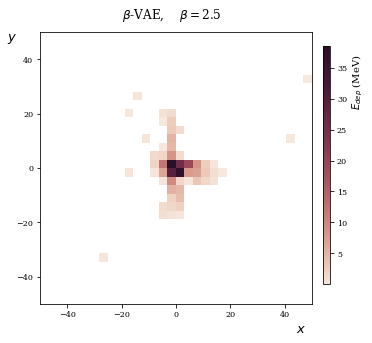

In [95]:
samples(model, rows=1,columns=1, save_dir=mydir,  epoch = epoch)

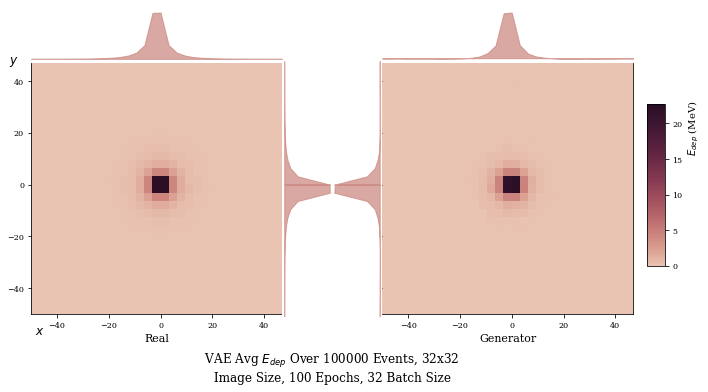

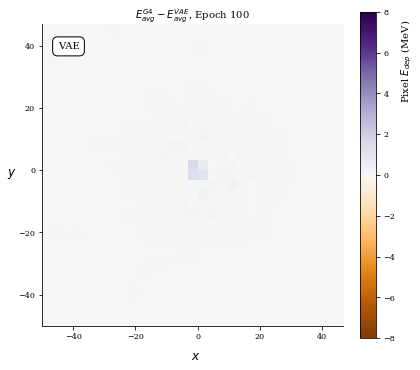

/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/2018-06-06_20-02-59/


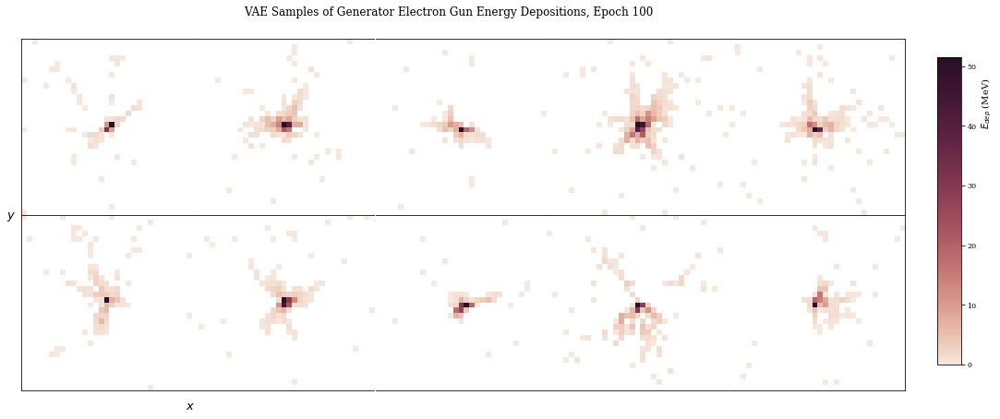

/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/2018-06-06_20-02-59/


In [372]:
mydir = "/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/2018-06-06_20-02-59/"
from matplotlib import gridspec
data_avg, n_events = make_samples(model, avg = True, n_events = 5000)
data, n_events = make_samples(model, avg = False, n_events = 5000)

plot_avg_both(data_avg[0],data_avg[1], n_events, save_dir = mydir,  epoch = epoch)
plot_difference(data_avg, epoch = epoch, save_dir=mydir, norm_scale = norm_scale, n_events = n_events)
samples(model, epoch = epoch, save_dir = mydir)
print mydir

(64, 32, 32)


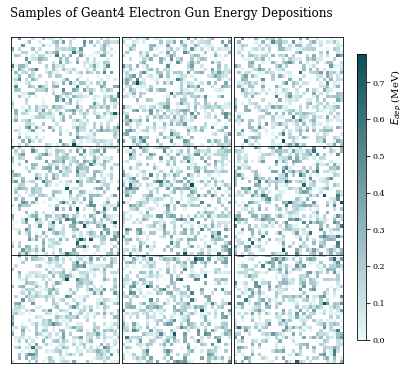

In [224]:
#THIS IS JUST A DIFFERENT WAY OF PLOTTING WHAT IS BELOW, BELOW IS MORE TIGHT LAYOUT

def new_samples1(model, epoch=epoch, imageSize=imageSize, norm_scale = norm_scale, scale = scale):
    sample = torch.randn(64, zdim).to(device)
    sample = model.decode(sample).cpu()
    sample_new = sample.view(64, 1, imageSize, imageSize).detach().numpy().squeeze()
    data = unnormalize(sample_new, scale = scale, norm_scale = norm_scale)


    columns = 3
    rows = 3
    etaran = (-50,50)
    phiran = (-50,50)
    extent = phiran + etaran
    print data.shape
    fig, axes =plt.subplots(rows,columns, figsize=(6, 6), sharex=True,sharey=True)

    event_number = 0
    plt.locator_params(axis='y', nbins=1)
    plt.locator_params(axis='x', nbins=2)
    #fig.xticks(rotation=45)
    for i in range(rows):
        for j in range(columns):

            image_array = data[event_number ]

            image_array[image_array <= 0] = np.nan
            #cmap = sns.cubehelix_palette(dark = 0.4, light=0.95, gamma = 2.5, hue = 1, start =0, as_cmap=True)
            cmap = sns.light_palette((210, 95, 30), input='husl', as_cmap=True)
            #cmap = sns.dark_palette('muted purple', as_cmap=True, input='xkcd')
            #cmap = sns.color_palette("BrBG",7)
            #img = ax.imshow(image_array[0], vmin = 0, extent=extent, origin='lower', cmap=cmap)

            plt.axis('on')
            im =axes[i,j].imshow(image_array, vmin = 0, extent=extent, origin='lower', cmap=cmap)
            #axes[i,j].set_xticklabels([-100,0,100],rotation=90)
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
            axes[i,j].xaxis.set_ticks_position('none')
            axes[i,j].yaxis.set_ticks_position('none')
            event_number +=1
    #fig.tight_layout(rect=[0, 0, .9, 1])
    cbar_ax = fig.add_axes([0.93, 0.18, 0.02, 0.66])

    cb = fig.colorbar(im, cax=cbar_ax)
    cb.set_label(r'$E_{dep}$ (MeV)', y =0.85)
    #plt.tight_layout()
    fig.subplots_adjust(wspace=0.00, hspace=0)
    fig.suptitle("Samples of Geant4 Electron Gun Energy Depositions", y=0.95)
    plt.show()
    
    return

new_samples1(model, epoch = epoch)

In [323]:
sample = torch.randn(64, zdim).to(device)
sample = model.decode(sample).cpu()
sample_new = sample.view(64, 1, imageSize, imageSize).detach().numpy().squeeze()
data = unnormalize(sample_new, scale = scale, norm_scale = norm_scale)
#np.sum(data, axis=0).shape

(32, 32)

/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/2018-06-06_20-02-59/


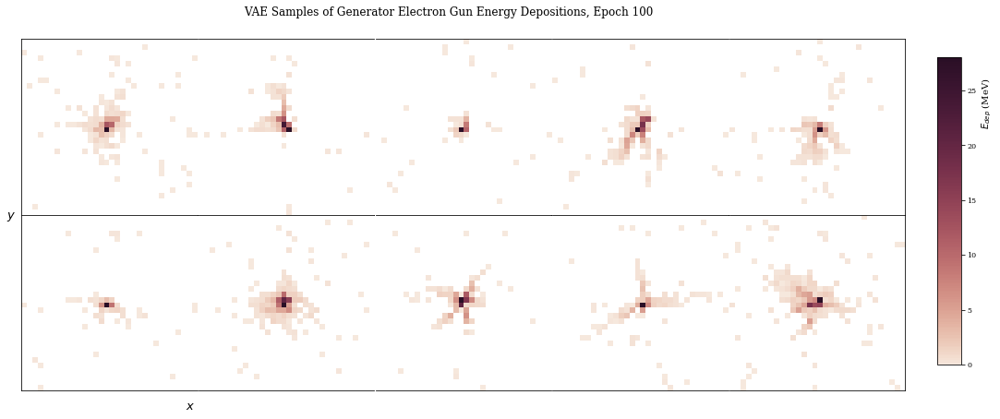

In [316]:
def samples(source, epoch = epoch, save_dir=None, rows=2, columns=5, imageSize = imageSize, batchSize = batchSize, norm_scale = norm_scale, scale=scale):
    xran = (-50,50)
    yran = (-50,50)
    extent = xran + yran

    rows  = 2
    columns = 5

    if rows <= 3 and columns <=5:
        scale_factor = 3.5
    else:
        scale_factor = 2

    #real = False
    if type(source).__module__ == 'numpy':
        real = True
        randints = np.random.randint(low = 0,high = normed_array.shape[0], size = 64)
        data = source[randints].squeeze()
        #data= next(iter(test_loader))[0].detach().numpy().squeeze()
    else:
        real = False
        sample = torch.randn(64, zdim).to(device)
        sample = model.decode(sample).cpu()
        data = unnormalize(sample.view(64, 1, imageSize, imageSize).detach().numpy().squeeze(), norm_scale = norm_scale, scale = scale)

    fig, axes =plt.subplots(rows,columns, figsize=(scale_factor*columns, scale_factor*rows), sharex=True,sharey=True)
    #print(len(axes))
    event_number = 0
    plt.locator_params(axis='y', nbins=1)
    plt.locator_params(axis='x', nbins=2)
    #fig.xticks(rotation=45)
    for i in range(rows):
        for j in range(columns):

            #print(range(rows))
            image_array = data[event_number]

            image_array[image_array <= 0] = np.nan
            cmap = sns.cubehelix_palette(dark = 0.4, light=0.965, gamma = 2.5, hue = 1, start =0, as_cmap=True)
            #cmap = sns.light_palette((210, 95, 30), input='husl', as_cmap=True)
            #cmap = sns.dark_palette('muted purple', as_cmap=True, input='xkcd')
            #cmap = sns.color_palette("BrBG",7)
            #img = ax.imshow(image_array[0], vmin = 0, extent=extent, origin='lower', cmap=cmap)
            #axes[i,j].set_aspect('equal')
            plt.axis('on')
            if rows == 1:
                #axes[j] = plt.subplot(gs1[i,j])
                if j != 0:
                    axes[j].spines['left'].set_visible(False)
                else:
                    axes[j].set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
                    axes[j].set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)
                axes[j].spines['top'].set_visible(False)
                axes[j].spines['right'].set_visible(False)
                #axes[j].spines['bottom'].set_visible(False)
                #axes[j].spines['left'].set_visible(False)
                #axes[j].set_aspect('equal')
                im =axes[j].imshow(image_array, vmin = 0, extent=extent, origin='lower', cmap=cmap)
                #axes[i,j].set_xticklabels([-100,0,100],rotation=90)
                axes[j].set_xticklabels([])
                axes[j].set_yticklabels([])
                axes[j].xaxis.set_ticks_position('none')
                axes[j].yaxis.set_ticks_position('none')
                event_number +=1
            else:
                #axes[i,j].spines['top'].set_visible(False)
                axes[i,j].spines['bottom'].set_visible(True)
                if j!= 0:
                    axes[i,j].spines['left'].set_visible(False)
                if i == range(rows)[-1] and j == 0:
                    axes[i,j].set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
                    axes[i,j].set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)

                if j == range(columns)[-1]:
                    axes[i,j].spines['right'].set_visible(True)
                else:
                    axes[i,j].spines['right'].set_visible(False)
                im =axes[i,j].imshow(image_array, vmin = 0, extent=extent, origin='lower', cmap=cmap)
                #axes[i,j].set_xticklabels([-100,0,100],rotation=90)
                axes[i,j].set_xticklabels([])
                axes[i,j].set_yticklabels([])
                axes[i,j].xaxis.set_ticks_position('none')
                axes[i,j].yaxis.set_ticks_position('none')
                event_number +=1
    #fig.tight_layout(rect=[0, 0, .9, 1])
    cbar_ax = fig.add_axes([0.92, 0.18, 0.02, 0.66])
    # fig.text(0.5,0.04, "Some very long and even longer xlabel", ha="center", va="center")
    #fig.text(0.05,0.5, "Some quite extensive ylabel", ha="center", va="center", rotation=90)

    cb = fig.colorbar(im, cax=cbar_ax)
    cb.set_label(r'$E_{dep}$ (MeV)', y =0.85)
    #plt.tight_layout()
    fig.subplots_adjust(wspace=-0.085, hspace=0.00)
    if real == True:
        fig.suptitle("Samples of Geant4 Electron Gun Energy Depositions", y = 0.95)
    else:
        fig.suptitle("VAE Samples of Generator Electron Gun Energy Depositions, Epoch " + str(epoch), y=0.95)

    num_samples = rows * columns


    if save_dir != None:
        if real == True:
            type_string = "real"
        else:
            type_string = "fake"

        #learning_rate = '%.0E' % Decimal(lr)
        #directory = "/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/"
        filename = "VAE"+str(num_samples) + type_string+ "SamplesEdepOver" + str(rows*columns) + "Events_" + str(imageSize) + "x" +str(imageSize) \
                           + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize"
        print(save_dir)
        plt.savefig(save_dir + filename, bbox_inches='tight')


    plt.show()
    return

samples(model, save_dir = mydir)

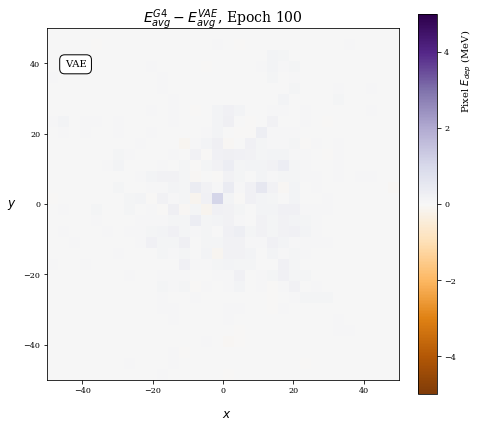

In [317]:
#this is to make the comparison of mean image over many samples to see how avergae distribution samples compare

data= next(iter(test_loader))

data = data[0].view([-1, full_dim])
#data = Variable(data, volatile=True)
true_imgs = data
#print true_imgs.shape
decoded_imgs, _, _ = model.forward(data.to(device))

true_imgs = to_img(true_imgs, norm_scale = norm_scale,  scale = scale)
decoded_imgs = to_img(decoded_imgs, norm_scale = norm_scale, scale = scale)

combined_fake_image = 0
for i in range(len(decoded_imgs)):
    combined_fake_image += decoded_imgs[i]
combined_fake_image = combined_fake_image / len(true_imgs)

combined_real_image = 0
for i in range(len(true_imgs)):
    combined_real_image += true_imgs[i]
combined_real_image = combined_real_image / len(true_imgs) 

fig, ax = plt.subplots(figsize=(7,7))
im = ax.imshow(combined_real_image - combined_fake_image, cmap ='PuOr', vmin = -5, vmax = 5, extent = extent)

cbar = plt.colorbar(im, fraction=0.05, pad=0.05)
cbar.set_label(r'Pixel $E_{dep}$ (MeV)', y=0.85)
plt.title(r"$E_{avg}^{G4} - E_{avg}^{VAE}$, Epoch " + str(epoch), fontsize = 14)
plt.text(-45, 39, 'VAE', color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
ax.set_xlabel(r"$\mathit{x}$", fontsize = 12)
ax.xaxis.set_label_coords(0.51,-0.08)

ax.set_ylabel(r"$\mathit{y}$", fontsize = 12, rotation = 0)
ax.yaxis.set_label_coords(-.1,0.48)

In [204]:
first_dim = np.linspace(-3.,3.,10)
first_dim = first_dim[...,np.newaxis]
second_dim = np.linspace(-3.,3.,10)
second_dim = second_dim[...,np.newaxis]
first_two = np.concatenate((first_dim,second_dim),1)
rest_noise = np.ones((10,zdim - 2))
latent2d_exploration = torch.FloatTensor(np.concatenate((first_two,rest_noise),1)).to(device)
sample = model.decode(latent2d_exploration).cpu()
data = sample.view(10, 1, imageSize, imageSize).detach().numpy().squeeze()
data.shape

(10, 32, 32)

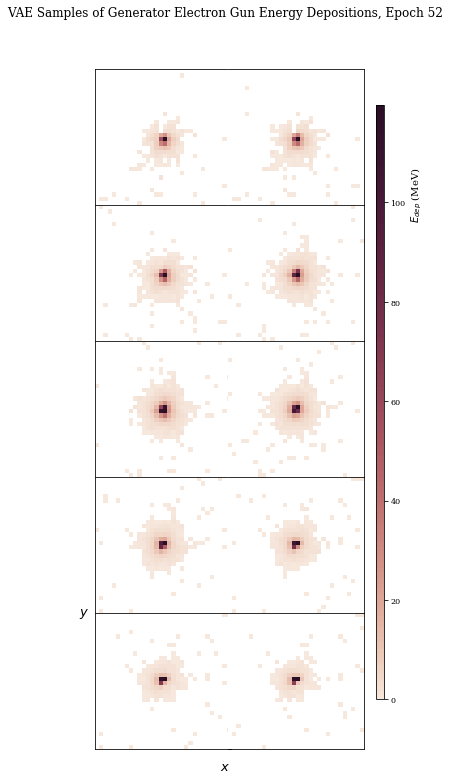

In [205]:
rows = 5
columns = 2
scale_factor=2.5
xran = (-50,50)
yran = (-50,50)
extent = xran + yran
real=False

fig, axes =plt.subplots(rows,columns, figsize=(scale_factor*columns, scale_factor*rows), sharex=True,sharey=True)
#print(len(axes))
event_number = 0
plt.locator_params(axis='y', nbins=1)
plt.locator_params(axis='x', nbins=2)
#fig.xticks(rotation=45)
for i in range(rows):
    for j in range(columns):

        #print(range(rows))
        image_array = data[event_number]
        #print image_array.min()

        image_array[image_array <= 0] = np.nan
        cmap = sns.cubehelix_palette(dark = 0.4, light=0.965, gamma = 2.5, hue = 1, start =0, as_cmap=True)
        #cmap = sns.light_palette((210, 95, 30), input='husl', as_cmap=True)
        #cmap = sns.dark_palette('muted purple', as_cmap=True, input='xkcd')
        #cmap = sns.color_palette("BrBG",7)
        #img = ax.imshow(image_array[0], vmin = 0, extent=extent, origin='lower', cmap=cmap)
        #axes[i,j].set_aspect('equal')
        plt.axis('on')
        if rows == 1:
            #axes[j] = plt.subplot(gs1[i,j])
            if j != 0:
                axes[j].spines['left'].set_visible(False)
            else:
                axes[j].set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
                axes[j].set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)
            axes[j].spines['top'].set_visible(False)
            axes[j].spines['right'].set_visible(False)
            #axes[j].spines['bottom'].set_visible(False)
            #axes[j].spines['left'].set_visible(False)
            #axes[j].set_aspect('equal')
            im =axes[j].imshow(image_array, vmin = 0, extent=extent, origin='lower', cmap=cmap)
            #axes[i,j].set_xticklabels([-100,0,100],rotation=90)
            axes[j].set_xticklabels([])
            axes[j].set_yticklabels([])
            axes[j].xaxis.set_ticks_position('none')
            axes[j].yaxis.set_ticks_position('none')
            event_number +=1
        else:
            #axes[i,j].spines['top'].set_visible(False)
            axes[i,j].spines['bottom'].set_visible(True)
            if j!= 0:
                axes[i,j].spines['left'].set_visible(False)
            if i == range(rows)[-1] and j == 0:
                axes[i,j].set_xlabel(r"$\mathit{x}$", fontsize=13, x = 0.96)
                axes[i,j].set_ylabel(r"$\mathit{y}$", fontsize=13, rotation=0, y = .95)

            if j == range(columns)[-1]:
                axes[i,j].spines['right'].set_visible(True)
            else:
                axes[i,j].spines['right'].set_visible(False)
            im =axes[i,j].imshow(image_array, vmin = 0, extent=extent, origin='lower', cmap=cmap)
            #axes[i,j].set_xticklabels([-100,0,100],rotation=90)
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
            axes[i,j].xaxis.set_ticks_position('none')
            axes[i,j].yaxis.set_ticks_position('none')
            event_number +=1
#fig.tight_layout(rect=[0, 0, .9, 1])
cbar_ax = fig.add_axes([0.92, 0.18, 0.02, 0.66])
# fig.text(0.5,0.04, "Some very long and even longer xlabel", ha="center", va="center")
#fig.text(0.05,0.5, "Some quite extensive ylabel", ha="center", va="center", rotation=90)

cb = fig.colorbar(im, cax=cbar_ax)
cb.set_label(r'$E_{dep}$ (MeV)', y =0.85)
#plt.tight_layout()
fig.subplots_adjust(wspace=-0.085, hspace=0.00)
if real == True:
    fig.suptitle("Samples of Geant4 Electron Gun Energy Depositions", y = 0.95)
else:
    fig.suptitle("VAE Samples of Generator Electron Gun Energy Depositions, Epoch " + str(epoch), y=0.95)

num_samples = rows * columns


#if save_dir != None:
 #   if real == True:
 #       type_string = "real"
 #   else:
 #       type_string = "fake"

    #learning_rate = '%.0E' % Decimal(lr)
    #directory = "/home/chris/Documents/MPhilProjects/ForViewing/plots/Geant4/SingleLayerEGun/VAE/"
    #filename = "VAE"+str(num_samples) + type_string+ "SamplesEdepOver" + str(n_events) + "Events_" + str(imageSize) + "x" +str(imageSize) \
    #                    + "Image_Epoch" + str(epoch) + "_" + norm_scale + "Normalized_" + str(batchSize) + "batchSize_" +  str(learning_rate) + "lr"
    #print(save_dir)
    #plt.savefig(save_dir + filename, bbox_inches='tight')


plt.show()

In [113]:
sample = torch.randn(64, zdim).to(device)
sample = model.decode(sample).cpu()
data = unnormalize(sample.view(64, 1, imageSize, imageSize).detach().numpy().squeeze(), norm_scale = norm_scale, scale = scale)
data.min()

0.0

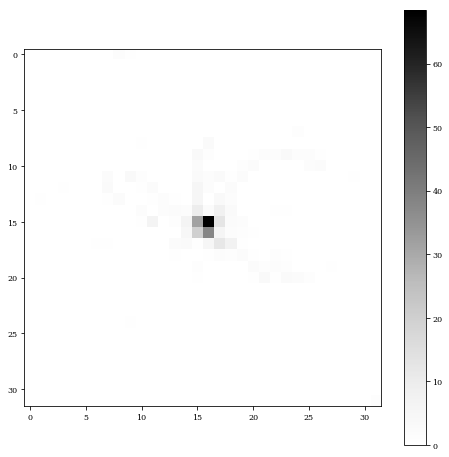

In [165]:
plt.imshow(image_array[12][0], cmap = 'Greys')
plt.colorbar()

In [158]:
image_array.max()

239.43917510546697